# Using CNNs with CIFAR-10 Dataset


In [1]:
from google.colab import drive
drive.mount('/gdrive/')
!ls /gdrive

Mounted at /gdrive/
MyDrive  Othercomputers


Run this code to navigate to the BASE_PATH directory and upload the homework2.tar file inside the BASE_PATH, then extract it.

Have a look at [pt_util](https://gist.github.com/pjreddie/e531394d779af2da9201096af0dba78a). We moved some of the useful functions out of the python notebook to make it less cluttered, and added a few more useful functions.

I made the BASE_PATH and DATA_PATH variables so you don't have to copy the same strings all over the place if you want to move the locations of the files around.

In [2]:
import os

BASE_PATH = '/gdrive/My Drive/colab_files/hw1/'
if not os.path.exists(BASE_PATH):
    os.makedirs(BASE_PATH)

!pwd
!ls
os.chdir(BASE_PATH)
os.chdir('/content')

/content
sample_data
/gdrive/My Drive/colab_files/hw1
cifar
dat.pickle
MOMENTUM_TEST_LOSS_TEST_ACCURACY_RUN_0_VAL_0.95.dat
MOMENTUM_TEST_LOSS_TEST_ACCURACY_RUN_0_VAL_0.97.dat
MOMENTUM_TEST_LOSS_TEST_ACCURACY_RUN_0_VAL_0.9.dat
MOMENTUM_TEST_LOSS_TEST_ACCURACY_RUN_0_VAL_99.dat
MOMENTUM_TEST_LOSS_TEST_ACCURACY_RUN_1_VAL_0.95.dat
MOMENTUM_TEST_LOSS_TEST_ACCURACY_RUN_1_VAL_0.97.dat
MOMENTUM_TEST_LOSS_TEST_ACCURACY_RUN_1_VAL_0.9.dat
MOMENTUM_TEST_LOSS_TEST_ACCURACY_RUN_1_VAL_99.dat
MOMENTUM_TEST_LOSS_TEST_ACCURACY_RUN_2_VAL_0.95.dat
MOMENTUM_TEST_LOSS_TEST_ACCURACY_RUN_2_VAL_0.97.dat
MOMENTUM_TEST_LOSS_TEST_ACCURACY_RUN_2_VAL_0.9.dat
MOMENTUM_TEST_LOSS_TEST_ACCURACY_RUN_2_VAL_99.dat
MOMENTUM_TEST_LOSS_TEST_ACCURACY_RUN_3_VAL_0.95.dat
MOMENTUM_TEST_LOSS_TEST_ACCURACY_RUN_3_VAL_0.97.dat
MOMENTUM_TEST_LOSS_TEST_ACCURACY_RUN_3_VAL_0.9.dat
MOMENTUM_TEST_LOSS_TEST_ACCURACY_RUN_3_VAL_99.dat
MOMENTUM_TRAIN_LOSS_90.dat
MOMENTUM_TRAIN_LOSS_95.dat
MOMENTUM_TRAIN_LOSS_97.dat
MOMENTUM_TRAIN_LOSS_99.dat
p

# CIFAR

## Part 1: Getting the Dataset
Normally, we'd want to download our dataset first. Since PyTorch hosts the CIFAR dataset, we can load it using their helper function later.

But, we'll change DATA_PATH to an empty directory to download the dataset to.

In [3]:
DATA_PATH = BASE_PATH + 'cifar/'

## Part 2: Defining the Network
Just like with MNIST last homework we need to define our network architecture. This time we will be using convolutional layers and maxpooling to extract features from our images before we feed those features into our final classifier.

Check out the documentation for [nn.Conv2d](https://pytorch.org/docs/stable/generated/torch.nn.Conv2d.html):

    nn.Conv2d(in_channels, out_channels, kernel_size, stride = 1, padding = 0,...)

So the first parameter is the number of channels in the input. Second is the number of filters we'll use (AKA number of channels in the output). Third is kernel size. Next is stride and padding which are optional and have default values.

In [4]:
# saves the data under folder
def save_data(name, data):
  with open(BASE_PATH + "/" + name, "wb") as f:
    pickle.dump(data, f, pickle.HIGHEST_PROTOCOL)

def load_data(path):
  with open(BASE_PATH + "/" + path, 'rb') as f:
    data = pickle.load(f)
    return data

In [5]:
import torch
import torch.nn as nn
from torchvision import datasets
from torchvision import transforms
from torchsummary import summary
import numpy as np
import os
import copy
import torch.nn.functional as F
import torch.optim as optim
import h5py
import sys
import math
from tqdm import tqdm
import pickle
sys.path.append(BASE_PATH)
import pt_util
from collections import defaultdict

In [6]:
# Trying more complex ConvoPool net with padding
class ConvoPoolNet(nn.Module):
    def __init__(self):
      super(ConvoPoolNet, self).__init__()
      self.conv1 = nn.Conv2d(3, 8, 3, stride=1, padding=1)
      self.mp1 = nn.MaxPool2d(2, stride=2)
      self.conv2 = nn.Conv2d(8, 16, 3, stride=1, padding=1)
      self.mp2 = nn.MaxPool2d(2, stride=2)
      self.conv3 = nn.Conv2d(16, 32, 3, stride=1, padding=1)
      self.mp3 = nn.MaxPool2d(2, stride=2)
      self.conv4 = nn.Conv2d(32, 64, 3, stride=1, padding=1)
      self.mp4 = nn.MaxPool2d(2, stride=2)
      self.conv5 = nn.Conv2d(64, 128, 3, stride=1, padding=1)
      self.mp5 = nn.MaxPool2d(2, stride=2)
      self.fc1 = nn.Linear(128, 10)
      self.accuracy = None

    def forward(self, x):
      x = self.conv1(x)
      x = F.relu(x)
      x = self.mp1(x)
    
      x = self.conv2(x)
      x = F.relu(x)
      x = self.mp2(x)
        
      x = self.conv3(x)
      x = F.relu(x)
      x = self.mp3(x)

      x = self.conv4(x)
      x = F.relu(x)
      x = self.mp4(x)
        
      x = self.conv5(x)
      x = F.relu(x)
      x = self.mp5(x)
    
      x = torch.flatten(x, 1)
      x = self.fc1(x)
      
      return x

    def loss(self, prediction, label, reduction='mean'):
        loss_val = F.cross_entropy(prediction, label.squeeze(), reduction=reduction)
        return loss_val

    def save_model(self, file_path, num_to_keep=1):
        pt_util.save(self, file_path, num_to_keep)
        
    def save_best_model(self, accuracy, file_path, num_to_keep=1):
        if self.accuracy == None or accuracy > self.accuracy:
            self.accuracy = accuracy
            self.save_model(file_path, num_to_keep)

    def load_model(self, file_path):
        pt_util.restore(self, file_path)

    def load_last_model(self, dir_path):
        return pt_util.restore_latest(self, dir_path)

In [ ]:
class ConvoPoolCifarNet(nn.Module):
    def __init__(self):
      super(ConvoPoolCifarNet, self).__init__()
      self.conv1 = nn.Conv2d(3, 8, 3, stride=1)
      self.mp1 = nn.MaxPool2d(3, stride=2)
      self.conv2 = nn.Conv2d(8, 16, 3, stride=1)
      self.mp2 = nn.MaxPool2d(3, stride=2)
      self.conv3 = nn.Conv2d(16, 32, 3, stride=1)
      self.mp3 = nn.MaxPool2d(3, stride=2)
      self.fc1 = nn.Linear(32, 10)
      self.accuracy = None

    def forward(self, x):
      x = self.conv1(x)
      x = F.relu(x)
      x = self.mp1(x)

      x = self.conv2(x)
      x = F.relu(x)
      x = self.mp2(x)

      x = self.conv3(x)
      x = F.relu(x)
      x = self.mp3(x)

      x = torch.flatten(x, 1)
      x = self.fc1(x)
      return x

    def loss(self, prediction, label, reduction='mean'):
        loss_val = F.cross_entropy(prediction, label.squeeze(), reduction=reduction)
        return loss_val

    def save_model(self, file_path, num_to_keep=1):
        pt_util.save(self, file_path, num_to_keep)
        
    def save_best_model(self, accuracy, file_path, num_to_keep=1):
        if self.accuracy == None or accuracy > self.accuracy:
            self.accuracy = accuracy
            self.save_model(file_path, num_to_keep)

    def load_model(self, file_path):
        pt_util.restore(self, file_path)

    def load_last_model(self, dir_path):
        return pt_util.restore_latest(self, dir_path)


In [ ]:
class StarterCifarNet(nn.Module):
    def __init__(self):
        super(StarterCifarNet, self).__init__()
        self.conv1 = nn.Conv2d(3, 16, 3, stride=2, padding=1)
        self.conv2 = nn.Conv2d(16, 32, 3, stride=2, padding=1)
        self.conv3 = nn.Conv2d(32, 64, 3, stride=2, padding=1)
        self.fc1 = nn.Linear(1024, 10)
        self.accuracy = None

    def forward(self, x):
        x = self.conv1(x)
        x = F.relu(x)
        x = self.conv2(x)
        x = F.relu(x)
        x = self.conv3(x)
        x = F.relu(x)
        x = torch.flatten(x, 1)
        print(x.size())
        x = self.fc1(x)
        return x

    def loss(self, prediction, label, reduction='mean'):
        loss_val = F.cross_entropy(prediction, label.squeeze(), reduction=reduction)
        return loss_val

    def save_model(self, file_path, num_to_keep=1):
        pt_util.save(self, file_path, num_to_keep)
        
    def save_best_model(self, accuracy, file_path, num_to_keep=1):
        if self.accuracy == None or accuracy > self.accuracy:
            self.accuracy = accuracy
            self.save_model(file_path, num_to_keep)

    def load_model(self, file_path):
        pt_util.restore(self, file_path)

    def load_last_model(self, dir_path):
        return pt_util.restore_latest(self, dir_path)


This time we are giving you the train and test functions, but feel free to modify them if you want. 

You may need to return some additional information for the logging portion of this assignment.


In [ ]:
import time
def train(model, device, train_loader, optimizer, epoch, log_interval):
    model.train()
    losses = []
    for batch_idx, (data, label) in enumerate(train_loader):
        data, label = data.to(device), label.to(device)
        # we do zero_grad because PyTorch by defalt accumulates all of the gradients
        # we only want the gradient based on the recent mini-batch
        optimizer.zero_grad()
        output = model(data)
        loss = model.loss(output, label)
        losses.append(loss.item())
        loss.backward()
        optimizer.step()
        if batch_idx % log_interval == 0:
            print('{} Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                time.ctime(time.time()),
                epoch, batch_idx * len(data), len(train_loader.dataset),
                100. * batch_idx / len(train_loader), loss.item()))
    return np.mean(losses)

def test(model, device, test_loader, log_interval=None):
    model.eval()
    test_loss = 0
    correct = 0

    with torch.no_grad():
        for batch_idx, (data, label) in enumerate(test_loader):
            data, label = data.to(device), label.to(device)
            output = model(data)
            test_loss_on = model.loss(output, label, reduction='sum').item()
            test_loss += test_loss_on
            pred = output.max(1)[1]
            correct_mask = pred.eq(label.view_as(pred))
            num_correct = correct_mask.sum().item()
            correct += num_correct
            if log_interval is not None and batch_idx % log_interval == 0:
                print('{} Test: [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                    time.ctime(time.time()),
                    batch_idx * len(data), len(test_loader.dataset),
                    100. * batch_idx / len(test_loader), test_loss_on))

    test_loss /= len(test_loader.dataset)
    test_accuracy = 100. * correct / len(test_loader.dataset)

    print('\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        test_loss, correct, len(test_loader.dataset), test_accuracy))
    return test_loss, test_accuracy

In [ ]:
import copy

In [ ]:
device = torch.device("cuda")
model = ConvoPoolNet()
model = model.to(device)
new_model = copy.deepcopy(model)

In [ ]:
test(new_model, device, test_loader, 100)

Fri May 19 23:31:45 2023 Test: [0/10000 (0%)]	Loss: 23.099916
Fri May 19 23:31:45 2023 Test: [1000/10000 (10%)]	Loss: 23.092064
Fri May 19 23:31:46 2023 Test: [2000/10000 (20%)]	Loss: 23.176376
Fri May 19 23:31:46 2023 Test: [3000/10000 (30%)]	Loss: 23.044653
Fri May 19 23:31:46 2023 Test: [4000/10000 (40%)]	Loss: 22.763689
Fri May 19 23:31:47 2023 Test: [5000/10000 (50%)]	Loss: 22.862450
Fri May 19 23:31:47 2023 Test: [6000/10000 (60%)]	Loss: 22.889452
Fri May 19 23:31:48 2023 Test: [7000/10000 (70%)]	Loss: 23.212494
Fri May 19 23:31:48 2023 Test: [8000/10000 (80%)]	Loss: 23.309917
Fri May 19 23:31:48 2023 Test: [9000/10000 (90%)]	Loss: 23.019361

Test set: Average loss: 2.3035, Accuracy: 1000/10000 (10%)



(2.3035336462020872, 10.0)

In [ ]:
BATCH_SIZE=512
kwargs = {'num_workers': multiprocessing.cpu_count(),
            'pin_memory': True} if use_cuda else {}
train_loader = torch.utils.data.DataLoader(data_train, batch_size=BATCH_SIZE,
                                            shuffle=True, **kwargs)

optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9, weight_decay=0.001)
curr_losses_by_lr = train(model, device, train_loader, optimizer, 1, 100)

train(model, device, train_loader, optimizer, 2, 100)
train(model, device, train_loader, optimizer, 3, 100)

Fri May 19 23:31:49 2023 Train Epoch: 1 [0/50000 (0%)]	Loss: 2.305207
Fri May 19 23:32:06 2023 Train Epoch: 2 [0/50000 (0%)]	Loss: 2.302330
Fri May 19 23:32:22 2023 Train Epoch: 3 [0/50000 (0%)]	Loss: 2.301844


2.301698013227813

In [ ]:
test(new_model, device, test_loader, 100)

Fri May 19 23:34:29 2023 Test: [0/10000 (0%)]	Loss: 23.099916
Fri May 19 23:34:30 2023 Test: [1000/10000 (10%)]	Loss: 23.092064
Fri May 19 23:34:30 2023 Test: [2000/10000 (20%)]	Loss: 23.176376
Fri May 19 23:34:31 2023 Test: [3000/10000 (30%)]	Loss: 23.044653
Fri May 19 23:34:31 2023 Test: [4000/10000 (40%)]	Loss: 22.763689
Fri May 19 23:34:31 2023 Test: [5000/10000 (50%)]	Loss: 22.862450
Fri May 19 23:34:32 2023 Test: [6000/10000 (60%)]	Loss: 22.889452
Fri May 19 23:34:32 2023 Test: [7000/10000 (70%)]	Loss: 23.212494
Fri May 19 23:34:33 2023 Test: [8000/10000 (80%)]	Loss: 23.309917
Fri May 19 23:34:33 2023 Test: [9000/10000 (90%)]	Loss: 23.019361

Test set: Average loss: 2.3035, Accuracy: 1000/10000 (10%)



(2.3035336462020872, 10.0)

In [ ]:
test(model, device, test_loader, 100)

Fri May 19 23:35:08 2023 Test: [0/10000 (0%)]	Loss: 22.993252
Fri May 19 23:35:08 2023 Test: [1000/10000 (10%)]	Loss: 23.000912
Fri May 19 23:35:09 2023 Test: [2000/10000 (20%)]	Loss: 23.015284
Fri May 19 23:35:09 2023 Test: [3000/10000 (30%)]	Loss: 23.031851
Fri May 19 23:35:09 2023 Test: [4000/10000 (40%)]	Loss: 23.011984
Fri May 19 23:35:10 2023 Test: [5000/10000 (50%)]	Loss: 23.038445
Fri May 19 23:35:10 2023 Test: [6000/10000 (60%)]	Loss: 22.995403
Fri May 19 23:35:11 2023 Test: [7000/10000 (70%)]	Loss: 23.027943
Fri May 19 23:35:11 2023 Test: [8000/10000 (80%)]	Loss: 22.980225
Fri May 19 23:35:11 2023 Test: [9000/10000 (90%)]	Loss: 23.022617

Test set: Average loss: 2.3009, Accuracy: 1110/10000 (11%)



(2.3009483758926392, 11.1)

In [ ]:
print(test(new_model, device, test_loader, 100))

Fri May 19 23:28:39 2023 Test: [0/10000 (0%)]	Loss: 23.124647
Fri May 19 23:28:40 2023 Test: [1000/10000 (10%)]	Loss: 22.902258
Fri May 19 23:28:40 2023 Test: [2000/10000 (20%)]	Loss: 22.972858
Fri May 19 23:28:40 2023 Test: [3000/10000 (30%)]	Loss: 23.052874
Fri May 19 23:28:41 2023 Test: [4000/10000 (40%)]	Loss: 22.749294
Fri May 19 23:28:41 2023 Test: [5000/10000 (50%)]	Loss: 23.454760
Fri May 19 23:28:42 2023 Test: [6000/10000 (60%)]	Loss: 23.140030
Fri May 19 23:28:42 2023 Test: [7000/10000 (70%)]	Loss: 23.072588
Fri May 19 23:28:42 2023 Test: [8000/10000 (80%)]	Loss: 23.068584
Fri May 19 23:28:43 2023 Test: [9000/10000 (90%)]	Loss: 22.980732

Test set: Average loss: 2.3040, Accuracy: 1000/10000 (10%)

(2.3040054973602295, 10.0)


In [ ]:
print(list(new_model.parameters()))

[Parameter containing:
tensor([[[[ 0.0977, -0.1336, -0.1078],
          [-0.1338, -0.0699, -0.1287],
          [-0.1547, -0.1737,  0.0228]],

         [[-0.0527, -0.0925, -0.0150],
          [ 0.1057, -0.0607,  0.0025],
          [ 0.1255,  0.0818,  0.0652]],

         [[ 0.1691,  0.1633, -0.0689],
          [-0.1068,  0.1546,  0.0328],
          [ 0.0125,  0.0464,  0.1382]]],


        [[[-0.0711, -0.1643,  0.0461],
          [-0.0098, -0.0421, -0.0049],
          [-0.1361, -0.0876,  0.1246]],

         [[-0.0416, -0.0532,  0.0139],
          [-0.0740, -0.0041,  0.0296],
          [ 0.0031,  0.1811,  0.1093]],

         [[ 0.1414,  0.1259,  0.1269],
          [ 0.1628,  0.1576, -0.1723],
          [ 0.0553, -0.1410,  0.0335]]],


        [[[-0.1867,  0.1368,  0.1698],
          [-0.0087,  0.0958, -0.1811],
          [-0.0284, -0.0426, -0.1772]],

         [[-0.1108,  0.0808, -0.1450],
          [-0.1318, -0.1451, -0.1817],
          [ 0.1401, -0.1627, -0.1427]],

         [[ 0.1526,  

In [ ]:
print(list(model.parameters()))

[Parameter containing:
tensor([[[[ 0.0976, -0.1336, -0.1078],
          [-0.1338, -0.0699, -0.1287],
          [-0.1547, -0.1737,  0.0228]],

         [[-0.0527, -0.0925, -0.0150],
          [ 0.1057, -0.0607,  0.0025],
          [ 0.1255,  0.0818,  0.0652]],

         [[ 0.1691,  0.1633, -0.0689],
          [-0.1068,  0.1546,  0.0328],
          [ 0.0125,  0.0464,  0.1382]]],


        [[[-0.0711, -0.1643,  0.0461],
          [-0.0098, -0.0421, -0.0049],
          [-0.1361, -0.0876,  0.1246]],

         [[-0.0416, -0.0532,  0.0139],
          [-0.0740, -0.0041,  0.0296],
          [ 0.0031,  0.1811,  0.1093]],

         [[ 0.1414,  0.1259,  0.1269],
          [ 0.1628,  0.1576, -0.1723],
          [ 0.0553, -0.1410,  0.0335]]],


        [[[-0.1867,  0.1368,  0.1698],
          [-0.0087,  0.0957, -0.1811],
          [-0.0284, -0.0426, -0.1772]],

         [[-0.1108,  0.0808, -0.1450],
          [-0.1318, -0.1450, -0.1816],
          [ 0.1401, -0.1627, -0.1427]],

         [[ 0.1526,  

## Part 3 and 4: Loading Data and Dataset Augmentation

In the MNIST assignment, we didn't do any data augmentation because MNIST is kind of easy.

In this assignment, you may find that data augmentation helps you a lot (or possibly hurts your performance).

You can find a bunch preimplemented here https://pytorch.org/vision/stable/transforms.html and you can also do your own as seen in the tutorial from part 3.

Play around with various data augmentations we will suggest some.

- ToPILImage - This one is useful for a lot of the built in transforms which expect PIL images. 
- RandomHorizontalFlip
- RandomResizedCrop
- ColorJitter
- RandomRotation
- Normalize
- Adding various types of noise
- ToTensor - PyTorch expects the output from the dataset to be a tensor in CxHxW format.


Note: You should be careful about which of these you apply to the test data. You usually don't want to apply noise to the test data, but you do want to normalize it in the same way for example.

In [7]:
import multiprocessing
# old batch size was 256, increasing it to 2^9
BATCH_SIZE = 100
TEST_BATCH_SIZE = 10
USE_CUDA = True
use_cuda = USE_CUDA and torch.cuda.is_available()

kwargs = {'num_workers': multiprocessing.cpu_count(),
            'pin_memory': True} if use_cuda else {}

transform_train = transforms.Compose([
    transforms.RandomCrop(32, padding=4),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.ToTensor(),
])

transform_test = transforms.Compose([
    transforms.ToTensor(),
])

data_train = datasets.CIFAR10(root=DATA_PATH, train=True, download=True, transform=transform_train)
data_test = datasets.CIFAR10(root=DATA_PATH, train=False, download=True, transform=transform_test)

# train_loader = torch.utils.data.DataLoader(data_train, batch_size=BATCH_SIZE,
#                                             shuffle=True, **kwargs)
# test_loader = torch.utils.data.DataLoader(data_test, batch_size=TEST_BATCH_SIZE,
#                                             shuffle=False, **kwargs)

Files already downloaded and verified
Files already downloaded and verified


In [ ]:
print(len(train_loader))

500


In [ ]:
dataiter = iter(train_loader)
images, labels = next(dataiter)
print(images.size())

torch.Size([256, 3, 32, 32])


## Seeing model layers

In [ ]:
device = torch.device("cuda" if use_cuda else "cpu")
CIFAR_DIMS = (3, 32, 32)

In [ ]:
model = StarterCifarNet().to(device)
summary(model, CIFAR_DIMS)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 16, 16, 16]             448
            Conv2d-2             [-1, 32, 8, 8]           4,640
            Conv2d-3             [-1, 64, 4, 4]          18,496
            Linear-4                   [-1, 10]          10,250
Total params: 33,834
Trainable params: 33,834
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.01
Forward/backward pass size (MB): 0.05
Params size (MB): 0.13
Estimated Total Size (MB): 0.20
----------------------------------------------------------------


In [ ]:
model = ConvoPoolCifarNet().to(device)
summary(model, CIFAR_DIMS)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1            [-1, 8, 30, 30]             224
         MaxPool2d-2            [-1, 8, 14, 14]               0
            Conv2d-3           [-1, 16, 12, 12]           1,168
         MaxPool2d-4             [-1, 16, 5, 5]               0
            Conv2d-5             [-1, 32, 3, 3]           4,640
         MaxPool2d-6             [-1, 32, 1, 1]               0
            Linear-7                   [-1, 10]             330
Total params: 6,362
Trainable params: 6,362
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.01
Forward/backward pass size (MB): 0.09
Params size (MB): 0.02
Estimated Total Size (MB): 0.13
----------------------------------------------------------------


In [ ]:
model = ConvoPoolNet().to(device)
summary(model, CIFAR_DIMS)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1            [-1, 8, 32, 32]             224
         MaxPool2d-2            [-1, 8, 16, 16]               0
            Conv2d-3           [-1, 16, 16, 16]           1,168
         MaxPool2d-4             [-1, 16, 8, 8]               0
            Conv2d-5             [-1, 32, 8, 8]           4,640
         MaxPool2d-6             [-1, 32, 4, 4]               0
            Conv2d-7             [-1, 64, 4, 4]          18,496
         MaxPool2d-8             [-1, 64, 2, 2]               0
            Conv2d-9            [-1, 128, 2, 2]          73,856
        MaxPool2d-10            [-1, 128, 1, 1]               0
           Linear-11                   [-1, 10]           1,290
Total params: 99,674
Trainable params: 99,674
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.01
Forward/ba

## Part 5: Training the network
Generally, it is useful to see how your training is going. Often people print their loss to make sure it goes down and their accuracy to make sure it goes up. But pictures are better than words. So for this part, you should record and plot the training loss, test loss, and test accuracy (and whatever else you want). 

We have created a very simple logging interface which essentially just saves and restores files via pickle in pt_util. Saving and restoring log data is important if you end your run early and want to continue where you left off rather than starting over.

We have also provided a plot function which can plot a single line graph. You can use it and plot each value independently, or change it to plot them all in one graph. 

Try different network architectures and experiment with hyperparameters. You'll answer the questions at the bottom of the file based on these experiments.


__Important note: Do not forget to title your graphs and label your axes. Plots are meaningless without a way to read them.__

Second Note: It will be helpful for you when deciding what network structure, data augmentation, and such work to title the graphs accordingly so you remember.

Third Note: The default setup right now saves and restores the network weights from a single folder. When you modify network architectures, you may want to increment your experiment version number so you start over with your training and log files.

In [ ]:
def run_adam_model(name, net, idx, epochs=20, eta=0.001, decay=0.0005):
  # for now, just using the standard hyperparameters
  BATCH_SIZE = 512
  TEST_BATCH_SIZE = 10
  EPOCHS = epochs
  LEARNING_RATE = eta
  USE_CUDA = True
  SEED = 0
  PRINT_INTERVAL = 100
  WEIGHT_DECAY = decay

  EXPERIMENT_VERSION = name + "-0." + str(idx)  # increment this to start a new experiment
  LOG_PATH = DATA_PATH + 'logs/' + EXPERIMENT_VERSION + '/'

  # Now the actual training code
  use_cuda = USE_CUDA and torch.cuda.is_available()

  #torch.manual_seed(SEED)

  device = torch.device("cuda" if use_cuda else "cpu")
  print('Using device', device)
  import multiprocessing
  print('num cpus:', multiprocessing.cpu_count())

  kwargs = {'num_workers': multiprocessing.cpu_count(),
            'pin_memory': True} if use_cuda else {}

  class_names = ['plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

  # train_loader = torch.utils.data.DataLoader(data_train, batch_size=BATCH_SIZE,
  #                                           shuffle=True, **kwargs)
  # test_loader = torch.utils.data.DataLoader(data_test, batch_size=TEST_BATCH_SIZE,
  #                                           shuffle=False, **kwargs)

  model = net.to(device)
  optimizer = optim.Adam(model.parameters())
  start_epoch = model.load_last_model(LOG_PATH)

  train_losses, test_losses, test_accuracies = pt_util.read_log(LOG_PATH + 'log.pkl', ([], [], []))
  test_loss, test_accuracy = test(model, device, test_loader)

  test_losses.append((start_epoch, test_loss))
  test_accuracies.append((start_epoch, test_accuracy))

  try:
      for epoch in range(start_epoch, EPOCHS + 1):
          train_loss = train(model, device, train_loader, optimizer, epoch, PRINT_INTERVAL)
          test_loss, test_accuracy = test(model, device, test_loader)
          train_losses.append((epoch, train_loss))
          test_losses.append((epoch, test_loss))
          test_accuracies.append((epoch, test_accuracy))
          pt_util.write_log(LOG_PATH + 'log.pkl', (train_losses, test_losses, test_accuracies))
          model.save_best_model(test_accuracy, LOG_PATH + '%03d.pt' % epoch)


  except KeyboardInterrupt as ke:
      print('Interrupted')
  except:
      import traceback
      traceback.print_exc()
  finally:
      model.save_model(LOG_PATH + '%03d.pt' % epoch, 0)
      ep, val = zip(*train_losses)
      pt_util.plot(ep, val, 'Train loss', 'Epoch', 'Error')
      ep, val = zip(*test_losses)
      pt_util.plot(ep, val, 'Test loss', 'Epoch', 'Error')
      ep, val = zip(*test_accuracies)
      pt_util.plot(ep, val, 'Test accuracy', 'Epoch', 'Error')

In [ ]:
def run_model(name, net, idx, epochs=20, eta=0.1, momentum=0.9, decay=0.0005):
  BATCH_SIZE = 512
  TEST_BATCH_SIZE = 10
  EPOCHS = epochs
  LEARNING_RATE = eta
  MOMENTUM = momentum
  USE_CUDA = True
  SEED = 0
  PRINT_INTERVAL = 100
  WEIGHT_DECAY = decay

  EXPERIMENT_VERSION = name + "-0." + str(idx)  # increment this to start a new experiment
  LOG_PATH = DATA_PATH + 'logs/' + EXPERIMENT_VERSION + '/'

  # Now the actual training code
  use_cuda = USE_CUDA and torch.cuda.is_available()

  #torch.manual_seed(SEED)

  device = torch.device("cuda" if use_cuda else "cpu")
  print('Using device', device)
  import multiprocessing
  print('num cpus:', multiprocessing.cpu_count())

  kwargs = {'num_workers': multiprocessing.cpu_count(),
            'pin_memory': True} if use_cuda else {}

  class_names = ['plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

  # train_loader = torch.utils.data.DataLoader(data_train, batch_size=BATCH_SIZE,
  #                                           shuffle=True, **kwargs)
  # test_loader = torch.utils.data.DataLoader(data_test, batch_size=TEST_BATCH_SIZE,
  #                                           shuffle=False, **kwargs)

  model = net.to(device)
  optimizer = optim.SGD(model.parameters(), lr=LEARNING_RATE, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)
  start_epoch = model.load_last_model(LOG_PATH)

  train_losses, test_losses, test_accuracies = pt_util.read_log(LOG_PATH + 'log.pkl', ([], [], []))
  test_loss, test_accuracy = test(model, device, test_loader)

  test_losses.append((start_epoch, test_loss))
  test_accuracies.append((start_epoch, test_accuracy))

  try:
      for epoch in range(start_epoch, EPOCHS + 1):
          train_loss = train(model, device, train_loader, optimizer, epoch, PRINT_INTERVAL)
          test_loss, test_accuracy = test(model, device, test_loader)
          train_losses.append((epoch, train_loss))
          test_losses.append((epoch, test_loss))
          test_accuracies.append((epoch, test_accuracy))
          pt_util.write_log(LOG_PATH + 'log.pkl', (train_losses, test_losses, test_accuracies))
          model.save_best_model(test_accuracy, LOG_PATH + '%03d.pt' % epoch)


  except KeyboardInterrupt as ke:
      print('Interrupted')
  except:
      import traceback
      traceback.print_exc()
  finally:
      model.save_model(LOG_PATH + '%03d.pt' % epoch, 0)
      ep, val = zip(*train_losses)
      pt_util.plot(ep, val, 'Train loss', 'Epoch', 'Error')
      ep, val = zip(*test_losses)
      pt_util.plot(ep, val, 'Test loss', 'Epoch', 'Error')
      ep, val = zip(*test_accuracies)
      pt_util.plot(ep, val, 'Test accuracy', 'Epoch', 'Error')

In [ ]:
def test_init_lr():
  candidates = [0.1, 0.01, 0.001, 0.0001, 0.00001]
  for idx, curr_eta in enumerate(candidates):
    run_model("ETA", StarterCifarNet(), idx, eta=curr_eta)

Using device cuda
num cpus: 2

Test set: Average loss: 2.3025, Accuracy: 956/10000 (10%)

Tue May  9 22:10:28 2023 Train Epoch: 0 [0/50000 (0%)]	Loss: 2.304615
Tue May  9 22:10:35 2023 Train Epoch: 0 [25600/50000 (51%)]	Loss: 2.154433

Test set: Average loss: 1.8868, Accuracy: 3241/10000 (32%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/ETA-0.0-0.1/000.pt

Tue May  9 22:10:46 2023 Train Epoch: 1 [0/50000 (0%)]	Loss: 1.908175
Tue May  9 22:10:53 2023 Train Epoch: 1 [25600/50000 (51%)]	Loss: 1.955191

Test set: Average loss: 1.6762, Accuracy: 4059/10000 (41%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/ETA-0.0-0.1/001.pt

Tue May  9 22:11:05 2023 Train Epoch: 2 [0/50000 (0%)]	Loss: 1.800786
Tue May  9 22:11:14 2023 Train Epoch: 2 [25600/50000 (51%)]	Loss: 1.588043

Test set: Average loss: 1.5707, Accuracy: 4386/10000 (44%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/ETA-0.0-0.1/002.pt

Tue May  9 22:11:25 2023 Train Epoch: 3 [0/50000 (0%)]	Loss: 1.632710
Tue May  9 2

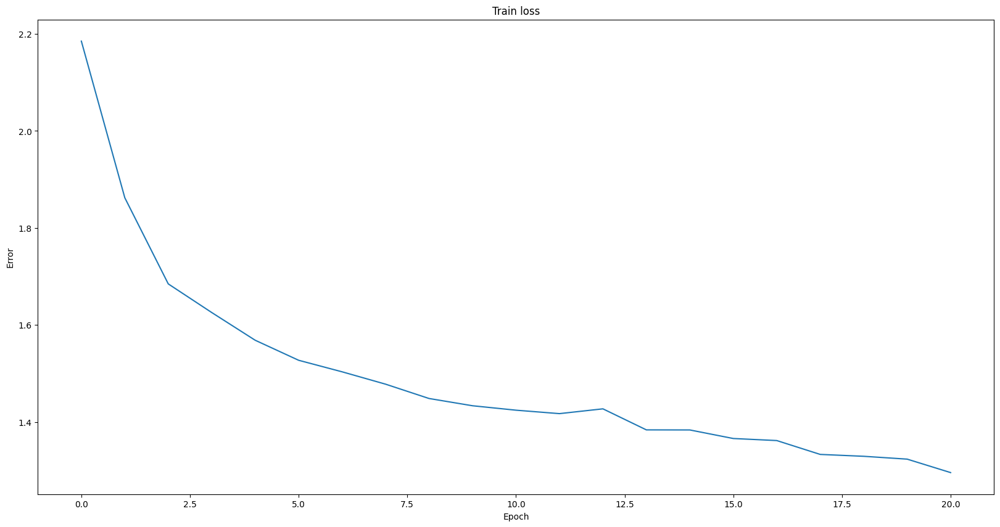

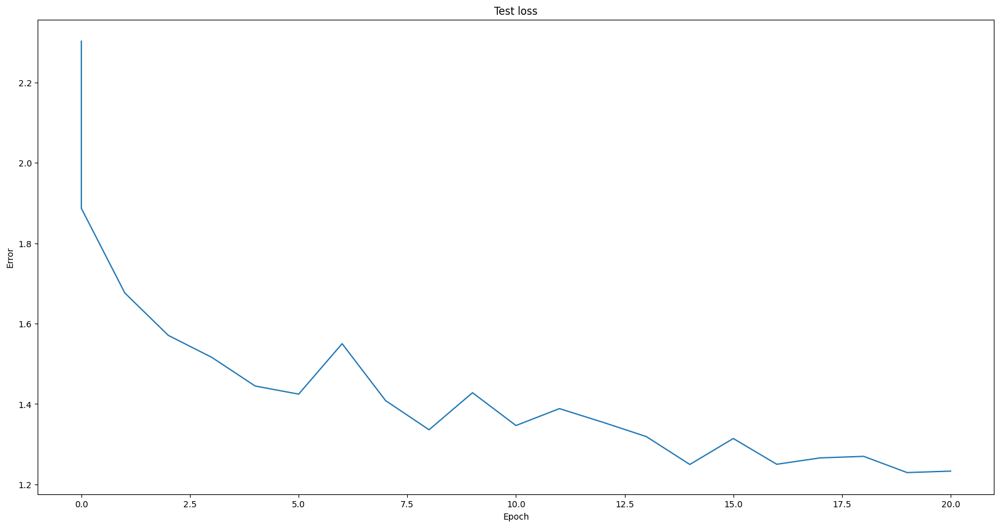

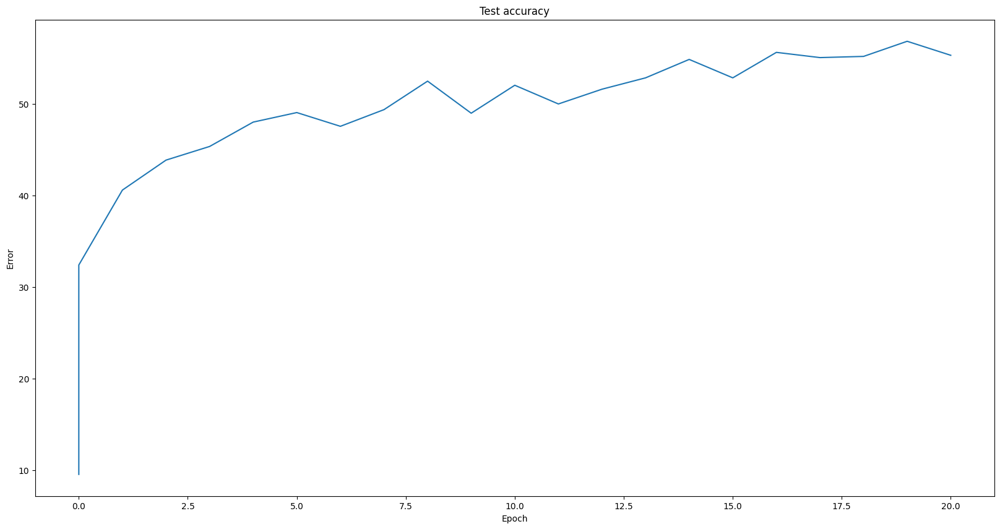

Using device cuda
num cpus: 2

Test set: Average loss: 2.3016, Accuracy: 1149/10000 (11%)

Tue May  9 22:17:04 2023 Train Epoch: 0 [0/50000 (0%)]	Loss: 2.301386
Tue May  9 22:17:10 2023 Train Epoch: 0 [25600/50000 (51%)]	Loss: 2.199378

Test set: Average loss: 1.9311, Accuracy: 3188/10000 (32%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/ETA-0.1-0.01/000.pt

Tue May  9 22:17:22 2023 Train Epoch: 1 [0/50000 (0%)]	Loss: 1.977235
Tue May  9 22:17:30 2023 Train Epoch: 1 [25600/50000 (51%)]	Loss: 1.885558

Test set: Average loss: 1.7630, Accuracy: 3800/10000 (38%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/ETA-0.1-0.01/001.pt

Tue May  9 22:17:41 2023 Train Epoch: 2 [0/50000 (0%)]	Loss: 1.876625
Tue May  9 22:17:48 2023 Train Epoch: 2 [25600/50000 (51%)]	Loss: 1.912623

Test set: Average loss: 1.6733, Accuracy: 4073/10000 (41%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/ETA-0.1-0.01/002.pt

Tue May  9 22:18:00 2023 Train Epoch: 3 [0/50000 (0%)]	Loss: 1.768811
Tue May 

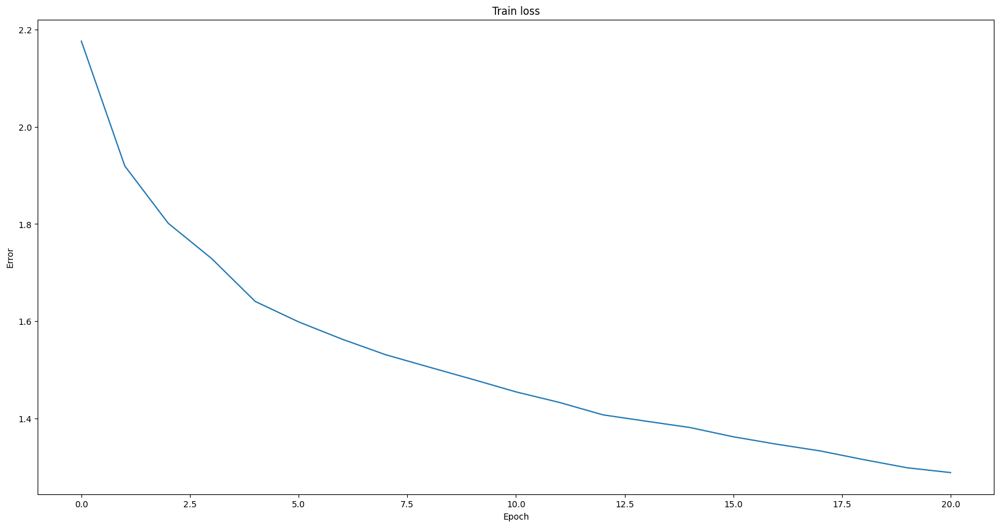

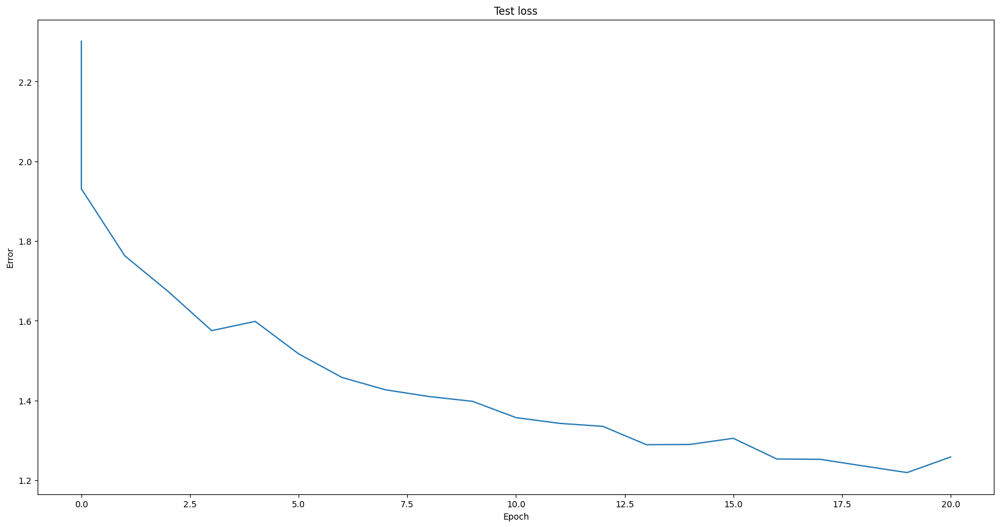

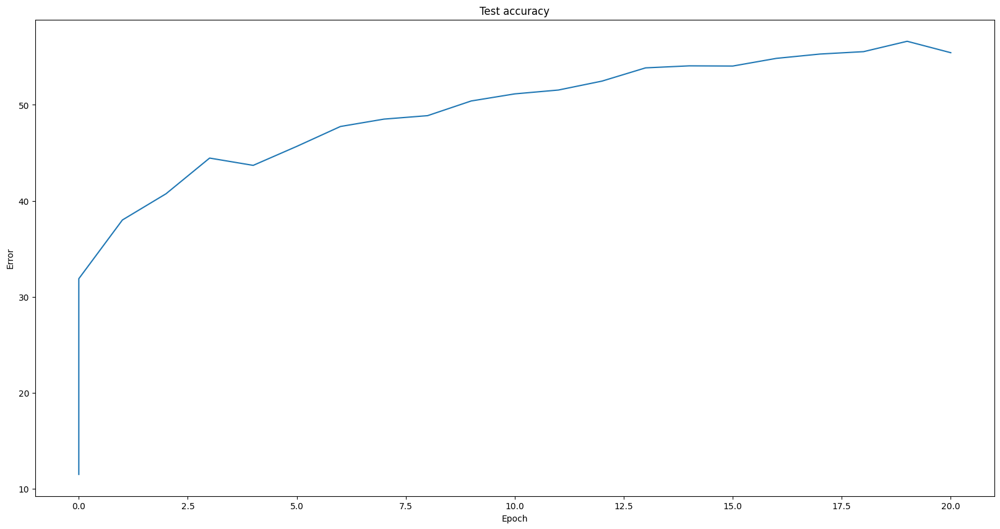

Using device cuda
num cpus: 2

Test set: Average loss: 2.3027, Accuracy: 1022/10000 (10%)

Tue May  9 22:23:37 2023 Train Epoch: 0 [0/50000 (0%)]	Loss: 2.302225
Tue May  9 22:23:44 2023 Train Epoch: 0 [25600/50000 (51%)]	Loss: 2.299512

Test set: Average loss: 2.3009, Accuracy: 1197/10000 (12%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/ETA-0.2-0.001/000.pt

Tue May  9 22:23:55 2023 Train Epoch: 1 [0/50000 (0%)]	Loss: 2.301296
Tue May  9 22:24:03 2023 Train Epoch: 1 [25600/50000 (51%)]	Loss: 2.302346

Test set: Average loss: 2.2984, Accuracy: 1037/10000 (10%)

Tue May  9 22:24:15 2023 Train Epoch: 2 [0/50000 (0%)]	Loss: 2.299173
Tue May  9 22:24:21 2023 Train Epoch: 2 [25600/50000 (51%)]	Loss: 2.299370

Test set: Average loss: 2.2937, Accuracy: 1090/10000 (11%)

Tue May  9 22:24:33 2023 Train Epoch: 3 [0/50000 (0%)]	Loss: 2.295896
Tue May  9 22:24:40 2023 Train Epoch: 3 [25600/50000 (51%)]	Loss: 2.290353

Test set: Average loss: 2.2834, Accuracy: 1140/10000 (11%)

Tue May  9 22

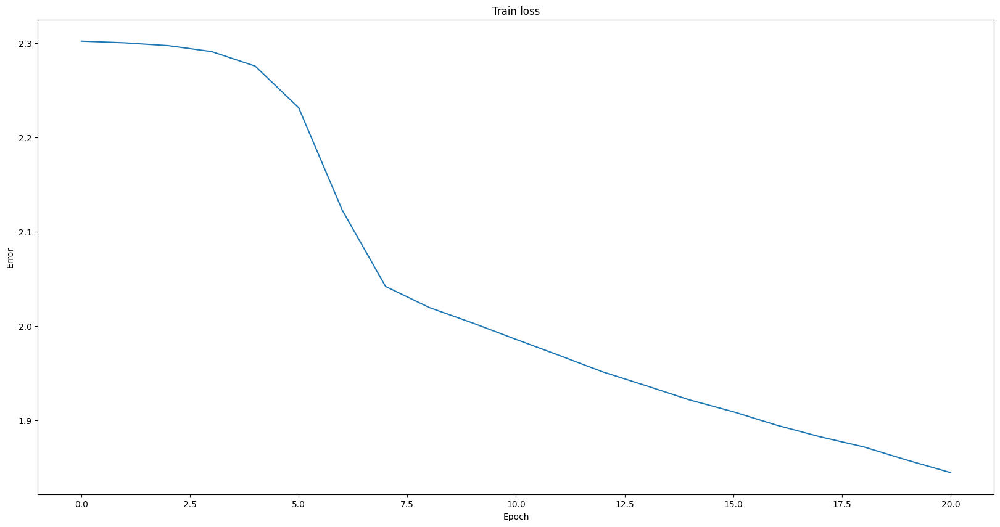

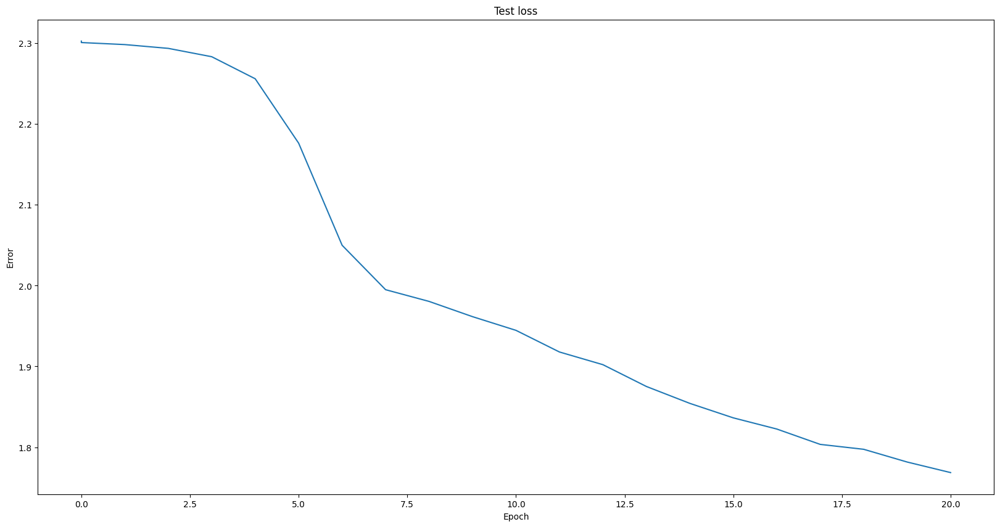

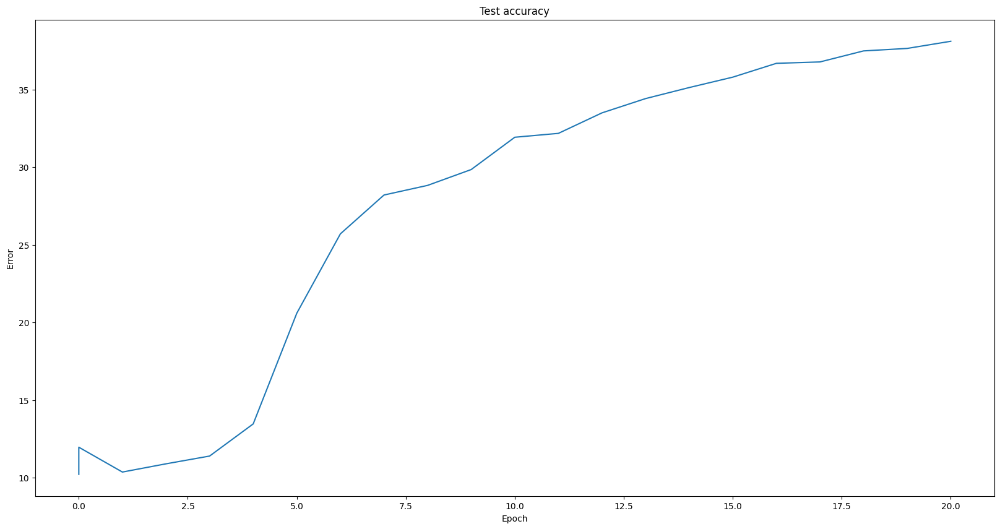

Using device cuda
num cpus: 2

Test set: Average loss: 2.3030, Accuracy: 947/10000 (9%)

Tue May  9 22:30:14 2023 Train Epoch: 0 [0/50000 (0%)]	Loss: 2.302592
Tue May  9 22:30:22 2023 Train Epoch: 0 [25600/50000 (51%)]	Loss: 2.303723

Test set: Average loss: 2.3028, Accuracy: 948/10000 (9%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/ETA-0.3-0.0001/000.pt

Tue May  9 22:30:34 2023 Train Epoch: 1 [0/50000 (0%)]	Loss: 2.304736
Tue May  9 22:30:40 2023 Train Epoch: 1 [25600/50000 (51%)]	Loss: 2.302530

Test set: Average loss: 2.3025, Accuracy: 955/10000 (10%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/ETA-0.3-0.0001/001.pt

Tue May  9 22:30:52 2023 Train Epoch: 2 [0/50000 (0%)]	Loss: 2.301575
Tue May  9 22:31:00 2023 Train Epoch: 2 [25600/50000 (51%)]	Loss: 2.302240

Test set: Average loss: 2.3023, Accuracy: 974/10000 (10%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/ETA-0.3-0.0001/002.pt

Tue May  9 22:31:11 2023 Train Epoch: 3 [0/50000 (0%)]	Loss: 2.302602
Tue May 

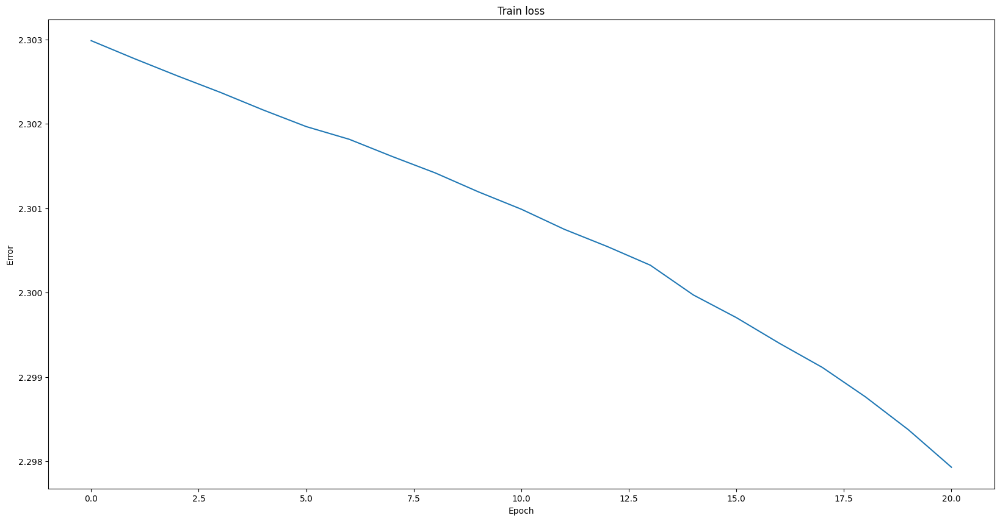

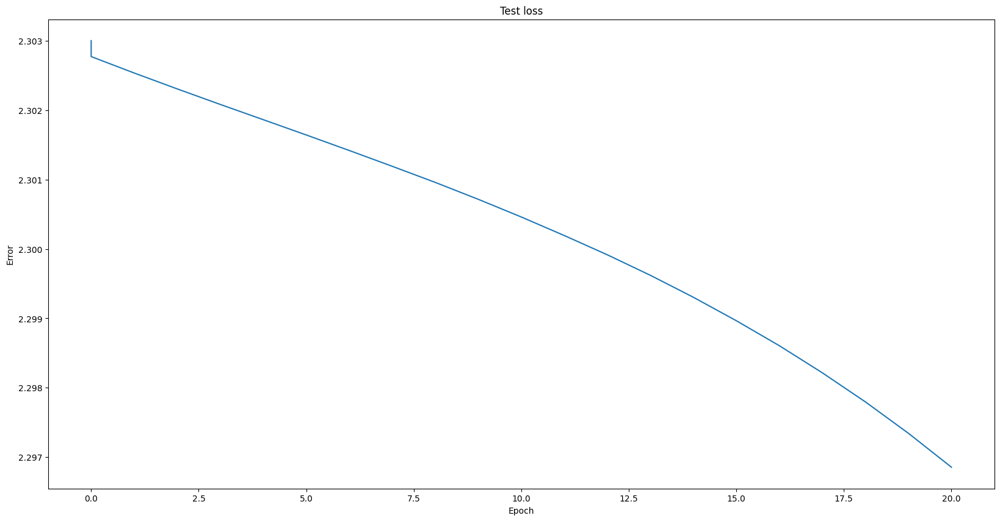

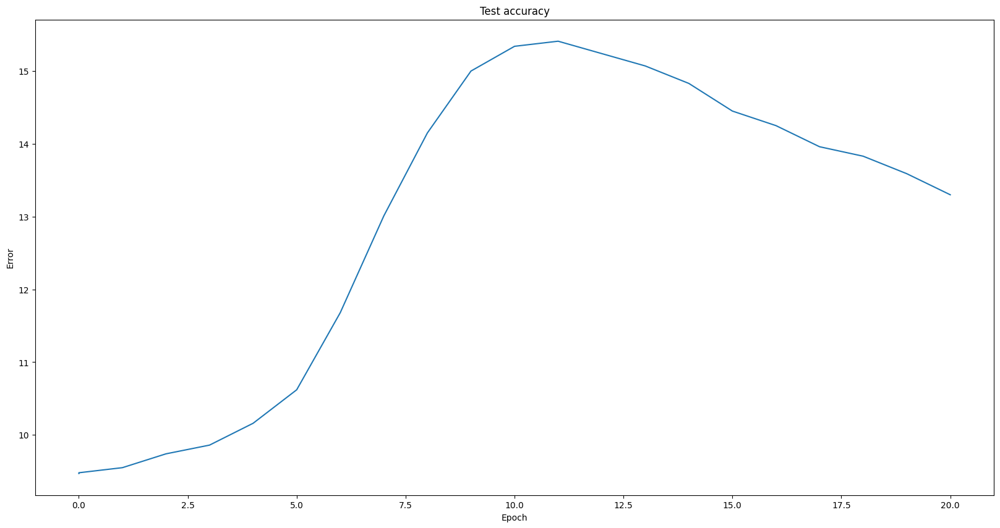

Using device cuda
num cpus: 2

Test set: Average loss: 2.3027, Accuracy: 1031/10000 (10%)

Tue May  9 22:36:57 2023 Train Epoch: 0 [0/50000 (0%)]	Loss: 2.301791
Tue May  9 22:37:05 2023 Train Epoch: 0 [25600/50000 (51%)]	Loss: 2.303985

Test set: Average loss: 2.3026, Accuracy: 1032/10000 (10%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/ETA-0.4-1e-05/000.pt

Tue May  9 22:37:17 2023 Train Epoch: 1 [0/50000 (0%)]	Loss: 2.301158
Tue May  9 22:37:24 2023 Train Epoch: 1 [25600/50000 (51%)]	Loss: 2.302577

Test set: Average loss: 2.3026, Accuracy: 1024/10000 (10%)

Tue May  9 22:37:36 2023 Train Epoch: 2 [0/50000 (0%)]	Loss: 2.305027
Tue May  9 22:37:44 2023 Train Epoch: 2 [25600/50000 (51%)]	Loss: 2.301104

Test set: Average loss: 2.3025, Accuracy: 1018/10000 (10%)

Tue May  9 22:37:54 2023 Train Epoch: 3 [0/50000 (0%)]	Loss: 2.301348
Tue May  9 22:38:02 2023 Train Epoch: 3 [25600/50000 (51%)]	Loss: 2.303296

Test set: Average loss: 2.3024, Accuracy: 1020/10000 (10%)

Tue May  9 22

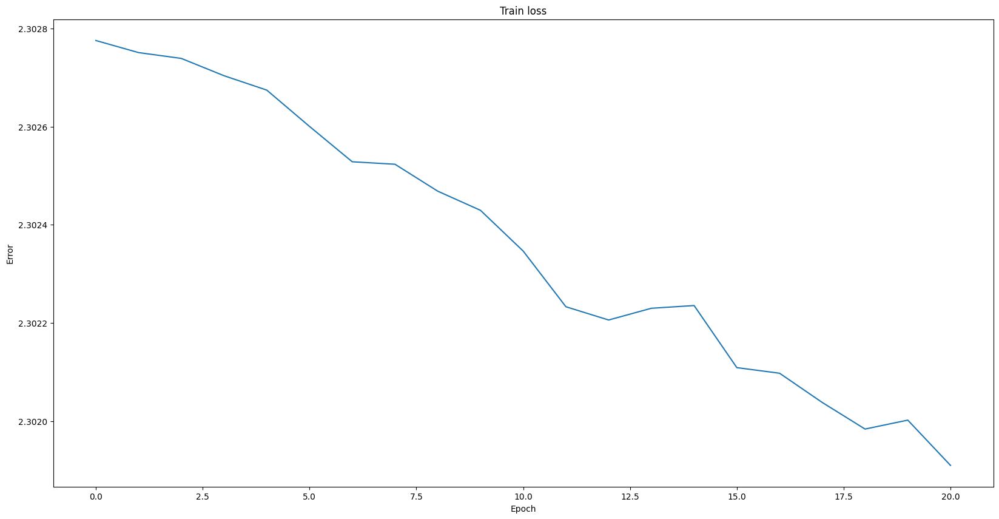

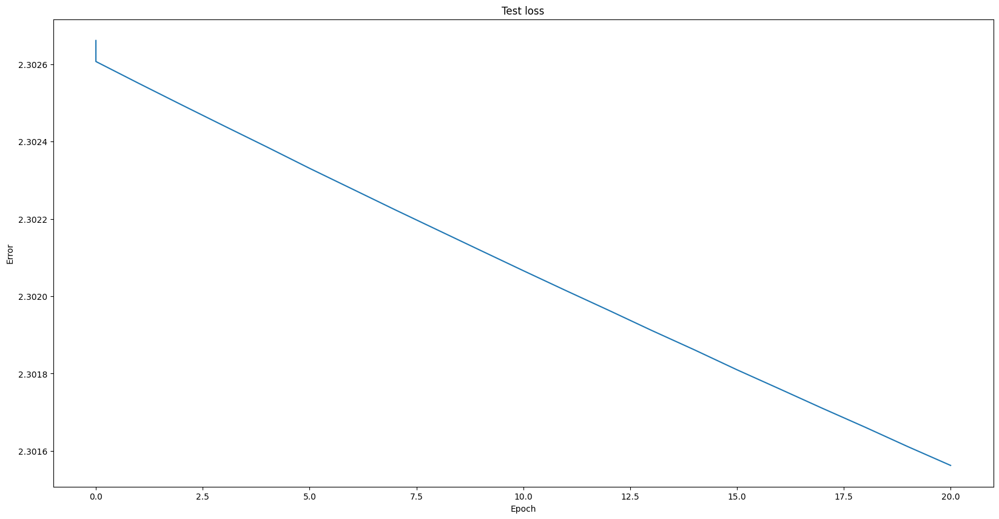

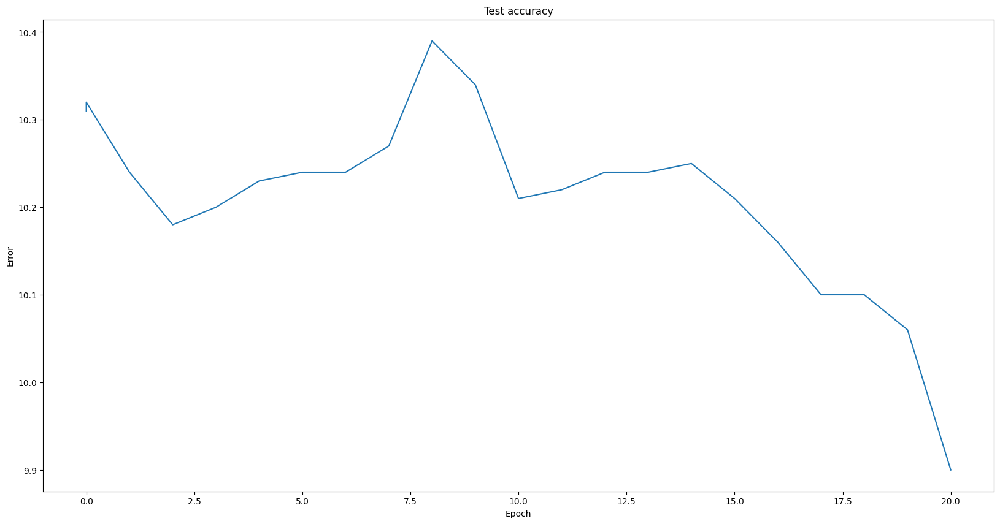

In [ ]:
test_init_lr()

In [ ]:
def test_momentum():
  candidates = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
  for idx, curr_momentum in enumerate(candidates):
    run_model("MOMENTUM", StarterCifarNet(), idx, momentum=curr_momentum)

Using device cuda
num cpus: 2

Test set: Average loss: 2.3035, Accuracy: 942/10000 (9%)

Tue May  9 23:16:06 2023 Train Epoch: 0 [0/50000 (0%)]	Loss: 2.300585
Tue May  9 23:16:13 2023 Train Epoch: 0 [25600/50000 (51%)]	Loss: 2.233241

Test set: Average loss: 1.9882, Accuracy: 3030/10000 (30%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/MOMENTUM-0.0/000.pt

Tue May  9 23:16:24 2023 Train Epoch: 1 [0/50000 (0%)]	Loss: 2.015947
Tue May  9 23:16:32 2023 Train Epoch: 1 [25600/50000 (51%)]	Loss: 1.984071

Test set: Average loss: 1.8706, Accuracy: 3460/10000 (35%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/MOMENTUM-0.0/001.pt

Tue May  9 23:16:44 2023 Train Epoch: 2 [0/50000 (0%)]	Loss: 1.930252
Tue May  9 23:16:51 2023 Train Epoch: 2 [25600/50000 (51%)]	Loss: 1.792456

Test set: Average loss: 1.7420, Accuracy: 3711/10000 (37%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/MOMENTUM-0.0/002.pt

Tue May  9 23:17:02 2023 Train Epoch: 3 [0/50000 (0%)]	Loss: 1.802562
Tue May  9

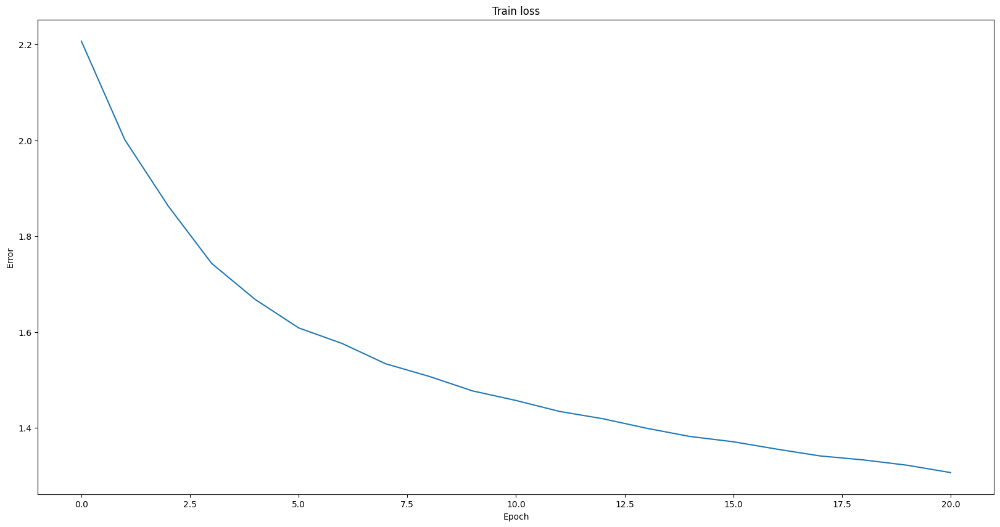

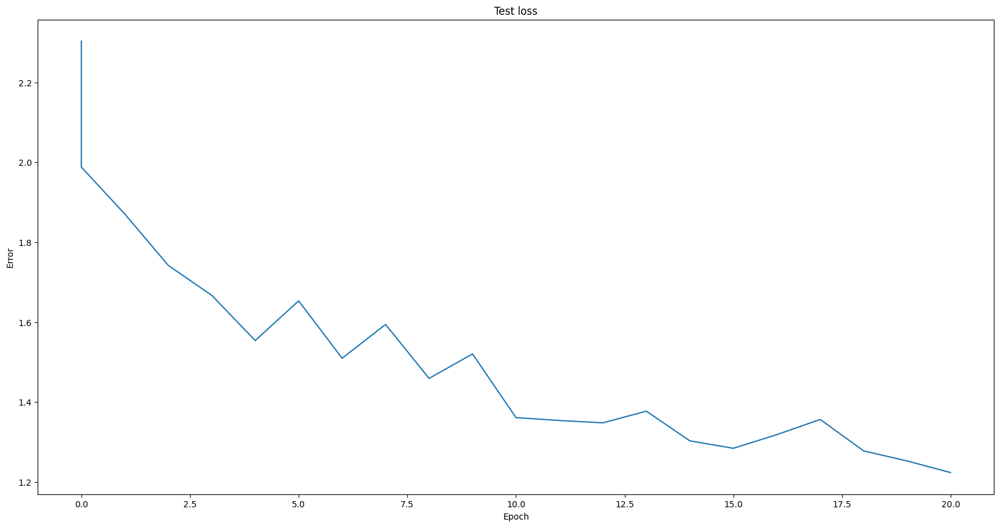

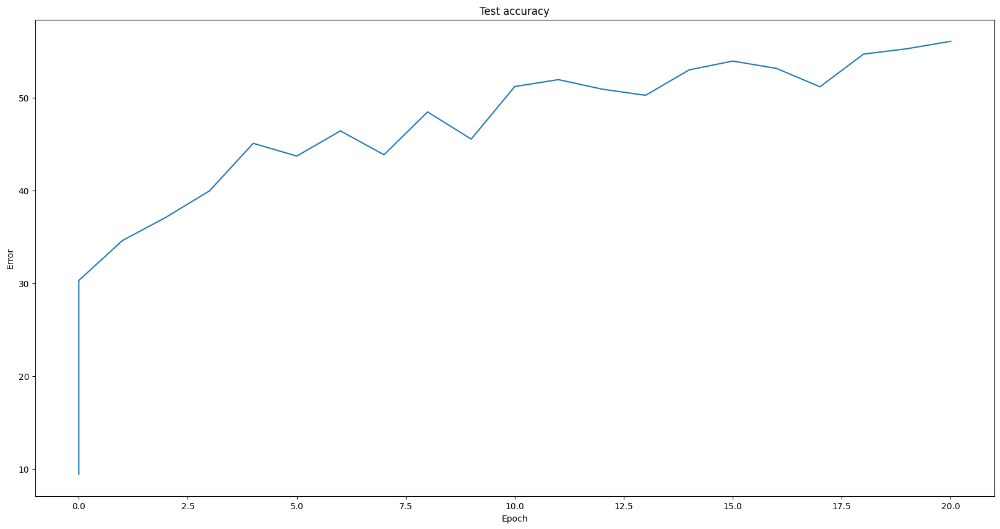

Using device cuda
num cpus: 2

Test set: Average loss: 2.3017, Accuracy: 1178/10000 (12%)

Tue May  9 23:22:53 2023 Train Epoch: 0 [0/50000 (0%)]	Loss: 2.304648
Tue May  9 23:23:01 2023 Train Epoch: 0 [25600/50000 (51%)]	Loss: 2.105369

Test set: Average loss: 2.0040, Accuracy: 2661/10000 (27%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/MOMENTUM-0.1/000.pt

Tue May  9 23:23:12 2023 Train Epoch: 1 [0/50000 (0%)]	Loss: 2.007475
Tue May  9 23:23:20 2023 Train Epoch: 1 [25600/50000 (51%)]	Loss: 1.905943

Test set: Average loss: 1.8111, Accuracy: 3458/10000 (35%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/MOMENTUM-0.1/001.pt

Tue May  9 23:23:32 2023 Train Epoch: 2 [0/50000 (0%)]	Loss: 1.854340
Tue May  9 23:23:39 2023 Train Epoch: 2 [25600/50000 (51%)]	Loss: 1.782093

Test set: Average loss: 1.8346, Accuracy: 3690/10000 (37%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/MOMENTUM-0.1/002.pt

Tue May  9 23:23:51 2023 Train Epoch: 3 [0/50000 (0%)]	Loss: 1.899205
Tue May 

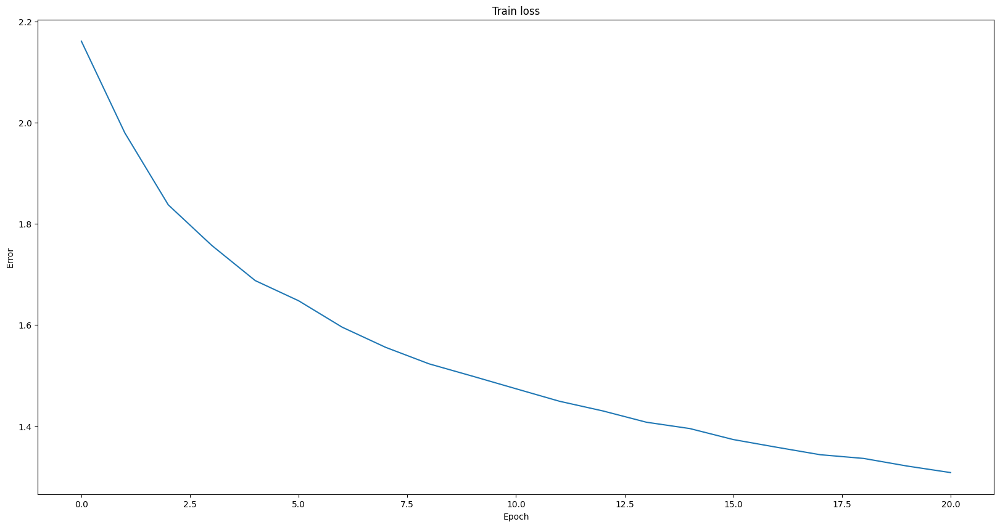

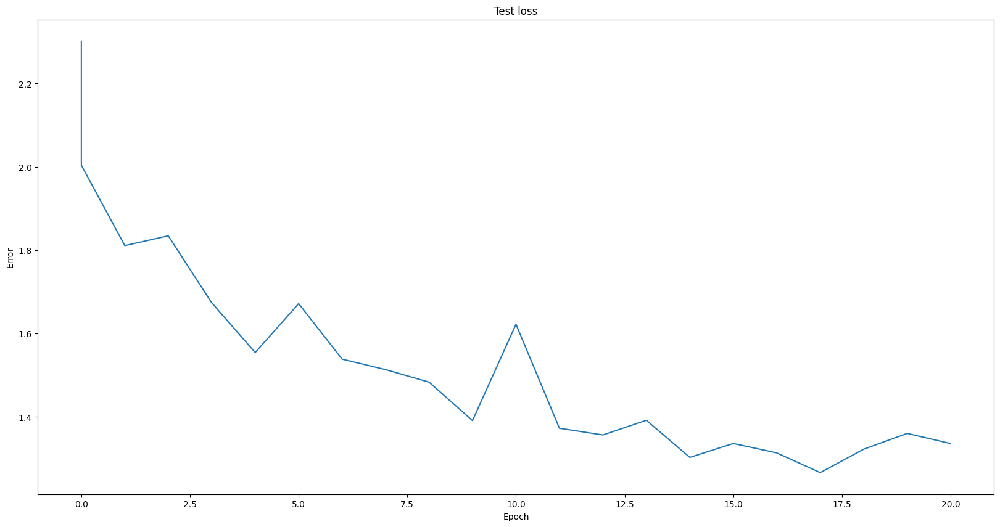

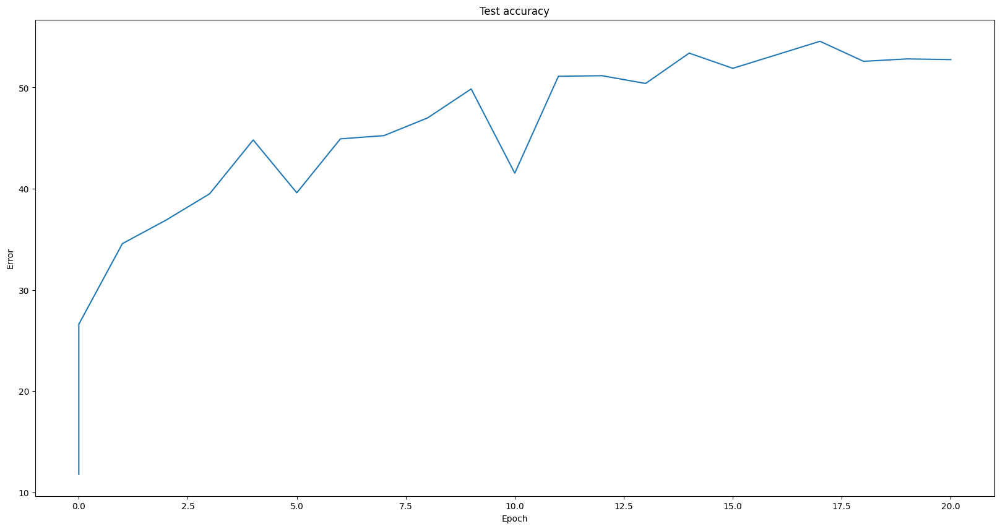

Using device cuda
num cpus: 2

Test set: Average loss: 2.3032, Accuracy: 852/10000 (9%)

Tue May  9 23:29:42 2023 Train Epoch: 0 [0/50000 (0%)]	Loss: 2.302141
Tue May  9 23:29:51 2023 Train Epoch: 0 [25600/50000 (51%)]	Loss: 2.220495

Test set: Average loss: 1.9699, Accuracy: 2872/10000 (29%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/MOMENTUM-0.2/000.pt

Tue May  9 23:30:01 2023 Train Epoch: 1 [0/50000 (0%)]	Loss: 2.015384
Tue May  9 23:30:09 2023 Train Epoch: 1 [25600/50000 (51%)]	Loss: 1.912035

Test set: Average loss: 1.8112, Accuracy: 3490/10000 (35%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/MOMENTUM-0.2/001.pt

Tue May  9 23:30:21 2023 Train Epoch: 2 [0/50000 (0%)]	Loss: 1.921783
Tue May  9 23:30:28 2023 Train Epoch: 2 [25600/50000 (51%)]	Loss: 1.824948

Test set: Average loss: 1.7792, Accuracy: 3694/10000 (37%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/MOMENTUM-0.2/002.pt

Tue May  9 23:30:40 2023 Train Epoch: 3 [0/50000 (0%)]	Loss: 1.784086
Tue May  9

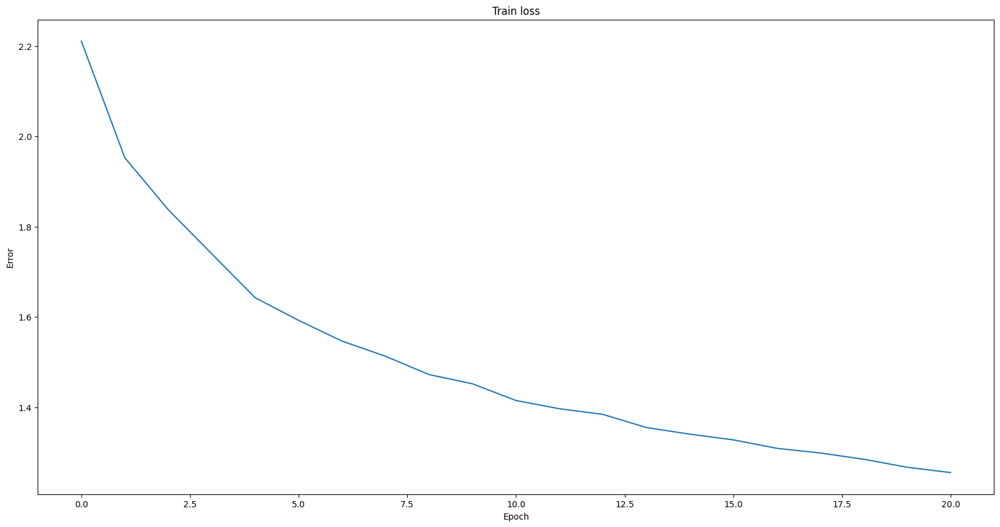

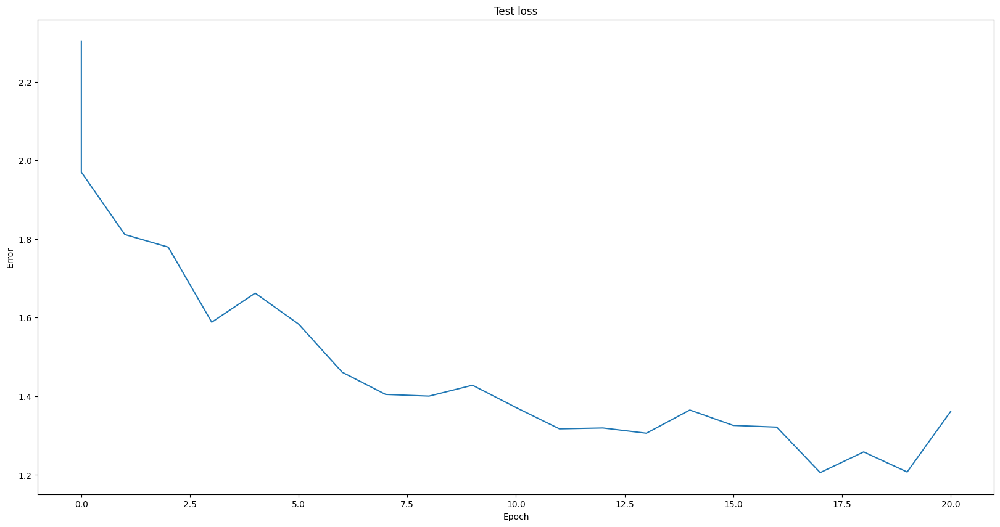

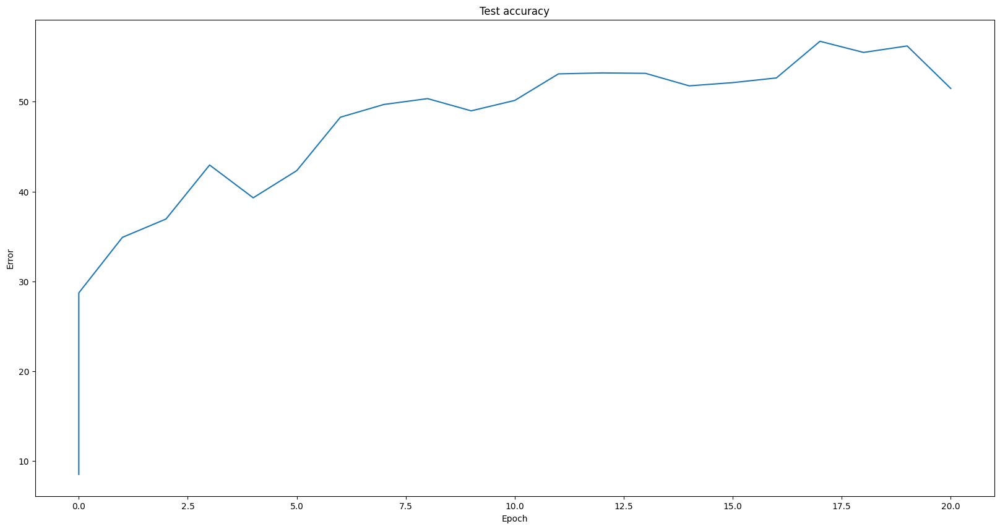

Using device cuda
num cpus: 2

Test set: Average loss: 2.3020, Accuracy: 1000/10000 (10%)

Tue May  9 23:36:30 2023 Train Epoch: 0 [0/50000 (0%)]	Loss: 2.300784
Tue May  9 23:36:39 2023 Train Epoch: 0 [25600/50000 (51%)]	Loss: 2.113287

Test set: Average loss: 2.0207, Accuracy: 2949/10000 (29%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/MOMENTUM-0.3/000.pt

Tue May  9 23:36:50 2023 Train Epoch: 1 [0/50000 (0%)]	Loss: 2.075135
Tue May  9 23:36:57 2023 Train Epoch: 1 [25600/50000 (51%)]	Loss: 1.880747

Test set: Average loss: 1.7721, Accuracy: 3736/10000 (37%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/MOMENTUM-0.3/001.pt

Tue May  9 23:37:09 2023 Train Epoch: 2 [0/50000 (0%)]	Loss: 1.902775
Tue May  9 23:37:16 2023 Train Epoch: 2 [25600/50000 (51%)]	Loss: 1.711350

Test set: Average loss: 1.6042, Accuracy: 4373/10000 (44%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/MOMENTUM-0.3/002.pt

Tue May  9 23:37:28 2023 Train Epoch: 3 [0/50000 (0%)]	Loss: 1.689312
Tue May 

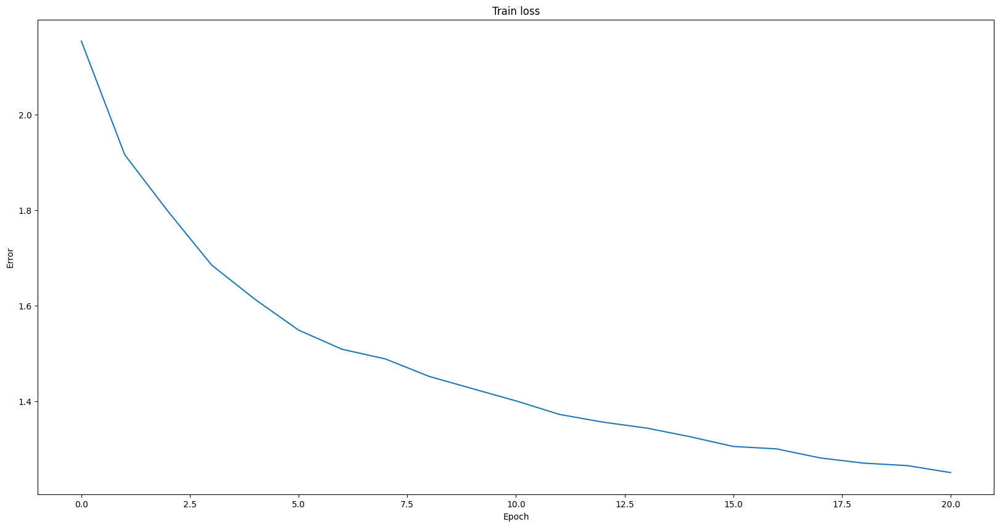

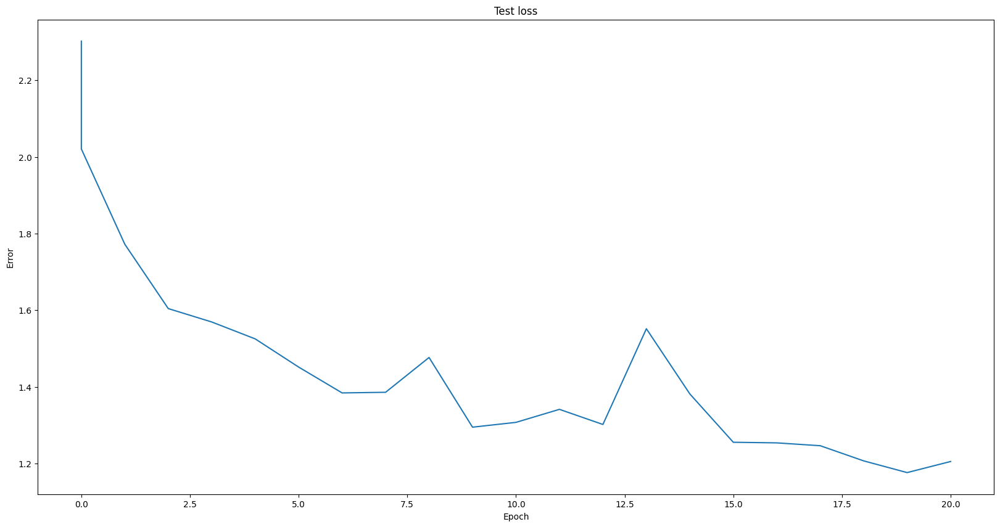

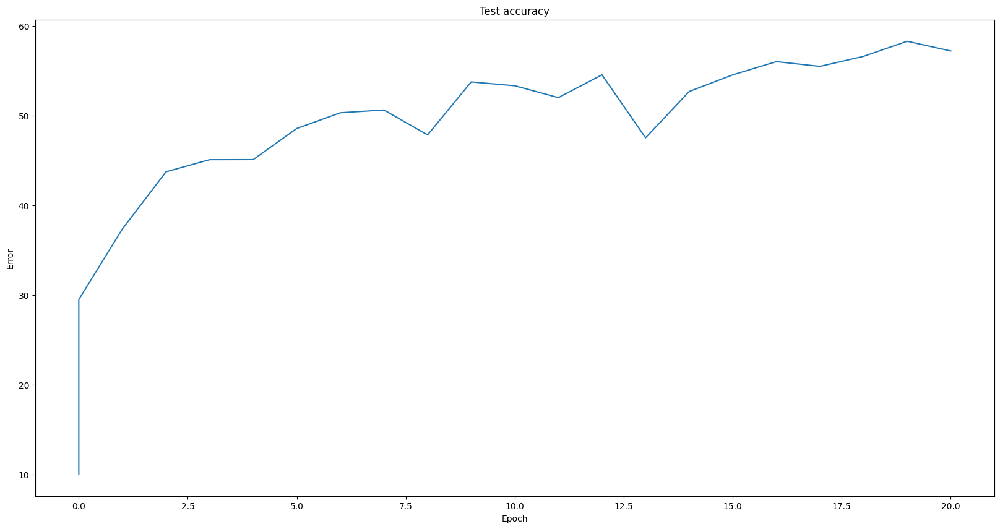

Using device cuda
num cpus: 2

Test set: Average loss: 2.3036, Accuracy: 1232/10000 (12%)

Tue May  9 23:43:21 2023 Train Epoch: 0 [0/50000 (0%)]	Loss: 2.301264
Tue May  9 23:43:29 2023 Train Epoch: 0 [25600/50000 (51%)]	Loss: 2.099045

Test set: Average loss: 1.9389, Accuracy: 3073/10000 (31%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/MOMENTUM-0.4/000.pt

Tue May  9 23:43:41 2023 Train Epoch: 1 [0/50000 (0%)]	Loss: 2.016079
Tue May  9 23:43:48 2023 Train Epoch: 1 [25600/50000 (51%)]	Loss: 1.919785

Test set: Average loss: 1.7897, Accuracy: 3563/10000 (36%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/MOMENTUM-0.4/001.pt

Tue May  9 23:44:00 2023 Train Epoch: 2 [0/50000 (0%)]	Loss: 1.834553
Tue May  9 23:44:08 2023 Train Epoch: 2 [25600/50000 (51%)]	Loss: 1.773235

Test set: Average loss: 1.8759, Accuracy: 3436/10000 (34%)

Tue May  9 23:44:20 2023 Train Epoch: 3 [0/50000 (0%)]	Loss: 1.966995
Tue May  9 23:44:27 2023 Train Epoch: 3 [25600/50000 (51%)]	Loss: 1.553195

Tes

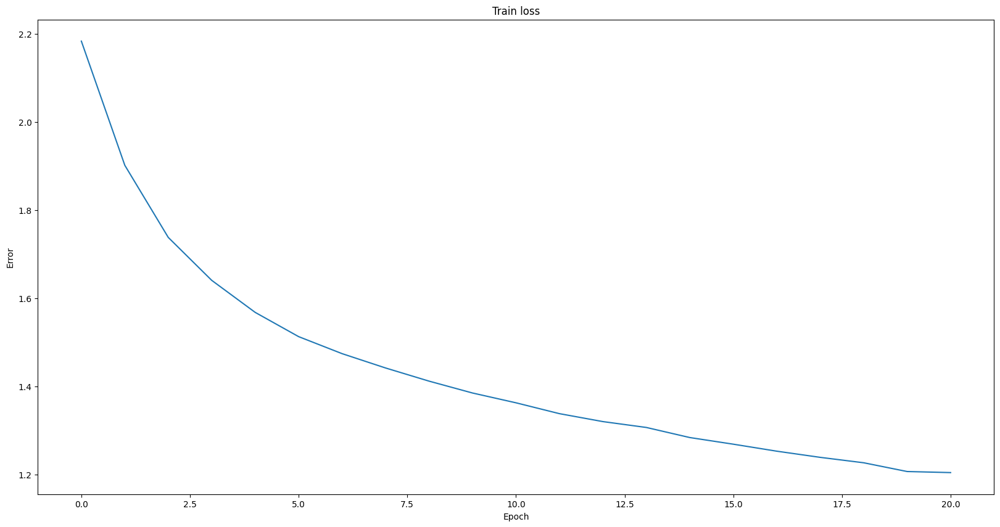

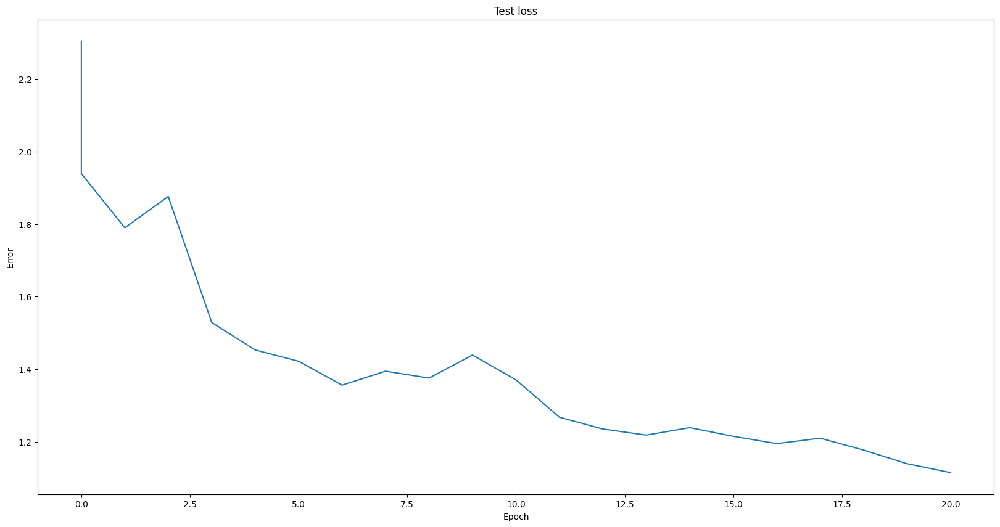

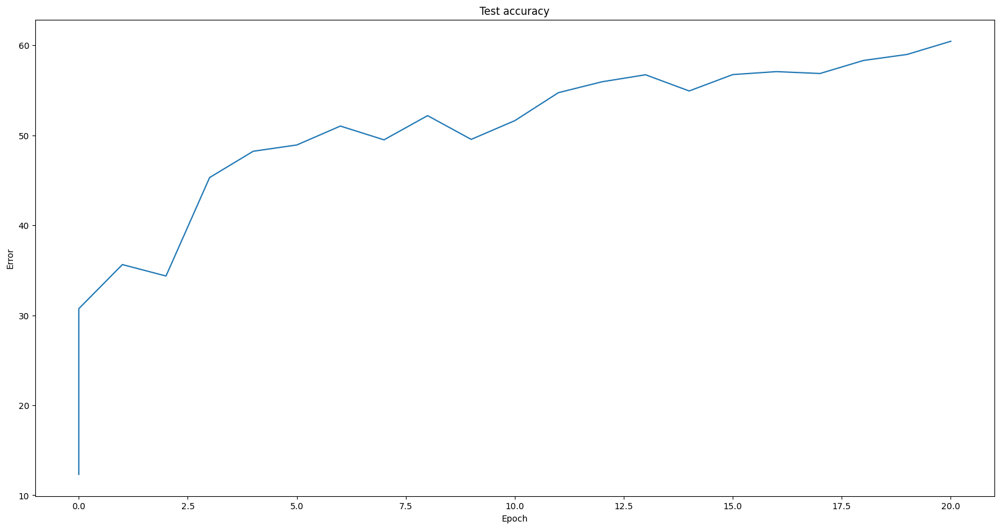

Using device cuda
num cpus: 2

Test set: Average loss: 2.3027, Accuracy: 1015/10000 (10%)

Tue May  9 23:50:13 2023 Train Epoch: 0 [0/50000 (0%)]	Loss: 2.299634
Tue May  9 23:50:20 2023 Train Epoch: 0 [25600/50000 (51%)]	Loss: 2.147855

Test set: Average loss: 1.9491, Accuracy: 3123/10000 (31%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/MOMENTUM-0.5/000.pt

Tue May  9 23:50:32 2023 Train Epoch: 1 [0/50000 (0%)]	Loss: 2.020315
Tue May  9 23:50:40 2023 Train Epoch: 1 [25600/50000 (51%)]	Loss: 1.848008

Test set: Average loss: 1.7475, Accuracy: 3882/10000 (39%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/MOMENTUM-0.5/001.pt

Tue May  9 23:50:52 2023 Train Epoch: 2 [0/50000 (0%)]	Loss: 1.877074
Tue May  9 23:50:58 2023 Train Epoch: 2 [25600/50000 (51%)]	Loss: 1.696222

Test set: Average loss: 1.5350, Accuracy: 4504/10000 (45%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/MOMENTUM-0.5/002.pt

Tue May  9 23:51:10 2023 Train Epoch: 3 [0/50000 (0%)]	Loss: 1.499759
Tue May 

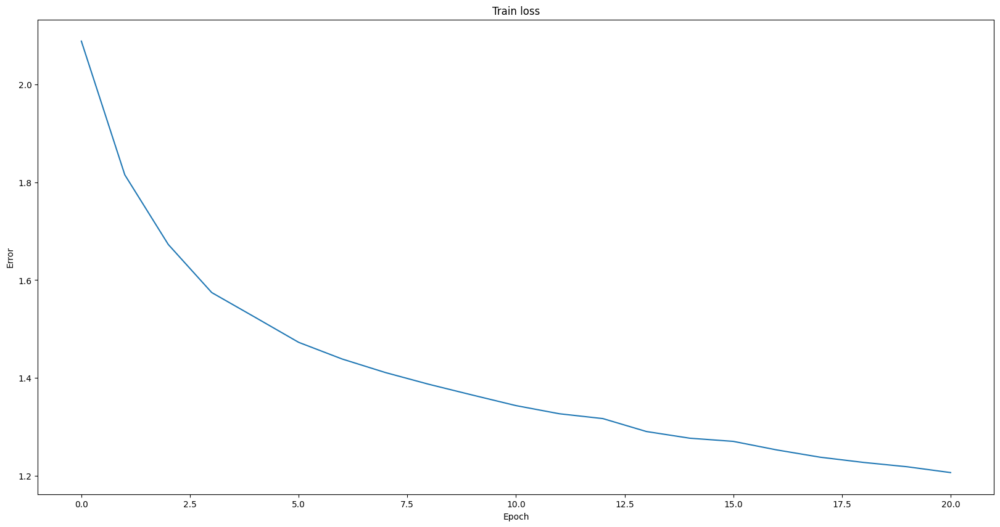

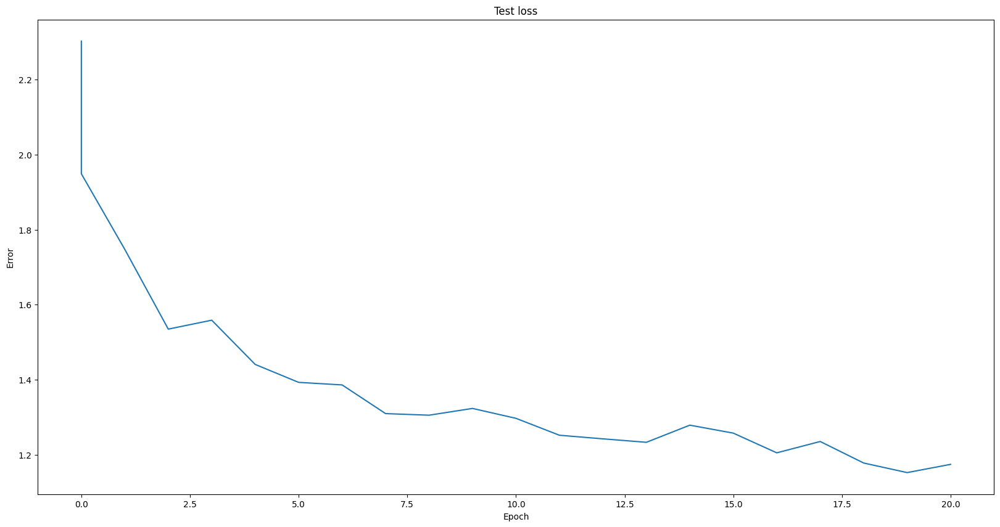

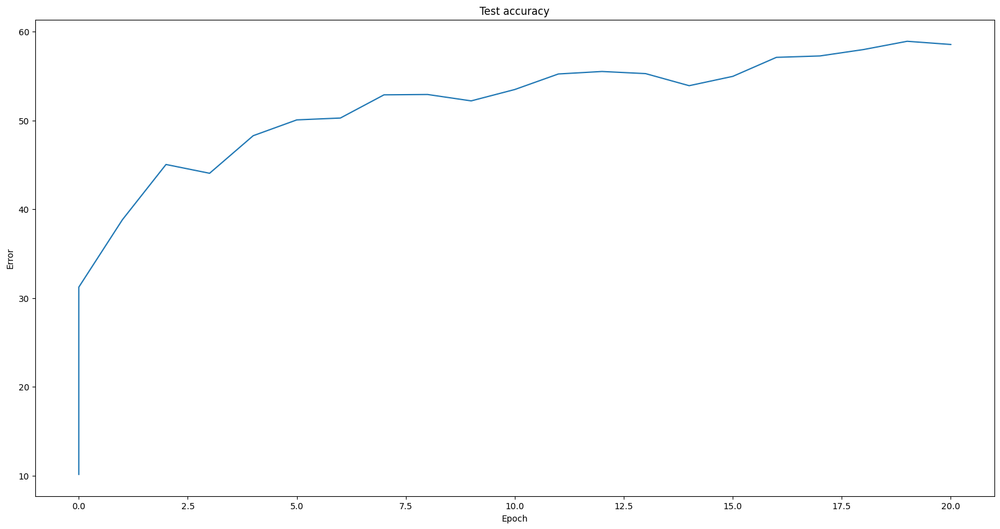

Using device cuda
num cpus: 2

Test set: Average loss: 2.3034, Accuracy: 1003/10000 (10%)

Tue May  9 23:57:02 2023 Train Epoch: 0 [0/50000 (0%)]	Loss: 2.302586
Tue May  9 23:57:10 2023 Train Epoch: 0 [25600/50000 (51%)]	Loss: 2.263181

Test set: Average loss: 2.1528, Accuracy: 1964/10000 (20%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/MOMENTUM-0.6/000.pt

Tue May  9 23:57:21 2023 Train Epoch: 1 [0/50000 (0%)]	Loss: 2.122453
Tue May  9 23:57:29 2023 Train Epoch: 1 [25600/50000 (51%)]	Loss: 1.972362

Test set: Average loss: 1.7038, Accuracy: 3875/10000 (39%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/MOMENTUM-0.6/001.pt

Tue May  9 23:57:41 2023 Train Epoch: 2 [0/50000 (0%)]	Loss: 1.723861
Tue May  9 23:57:48 2023 Train Epoch: 2 [25600/50000 (51%)]	Loss: 1.752414

Test set: Average loss: 1.5888, Accuracy: 4309/10000 (43%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/MOMENTUM-0.6/002.pt

Tue May  9 23:58:00 2023 Train Epoch: 3 [0/50000 (0%)]	Loss: 1.681632
Tue May 

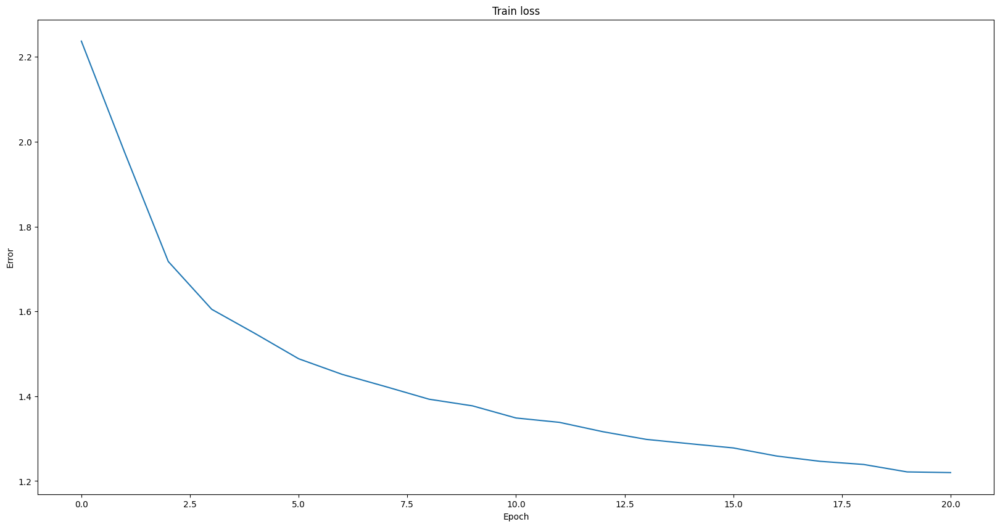

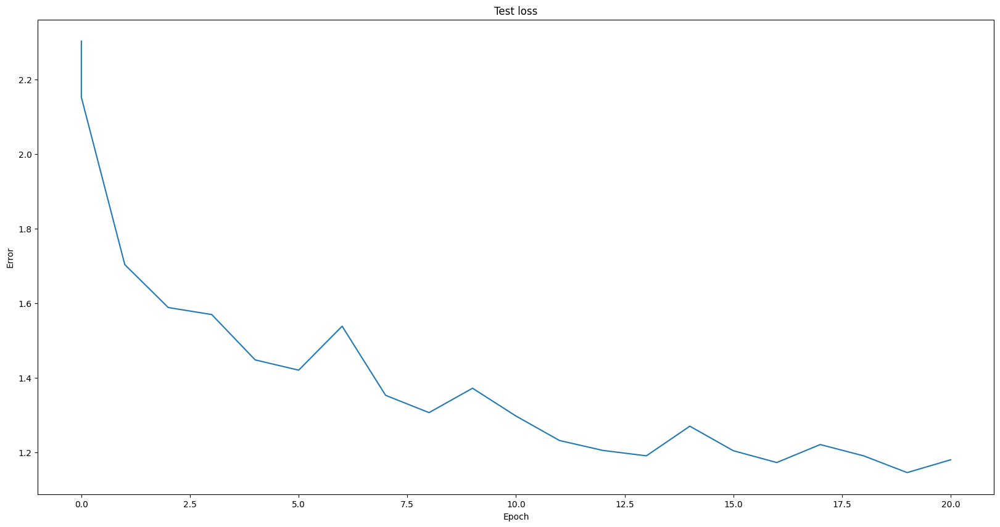

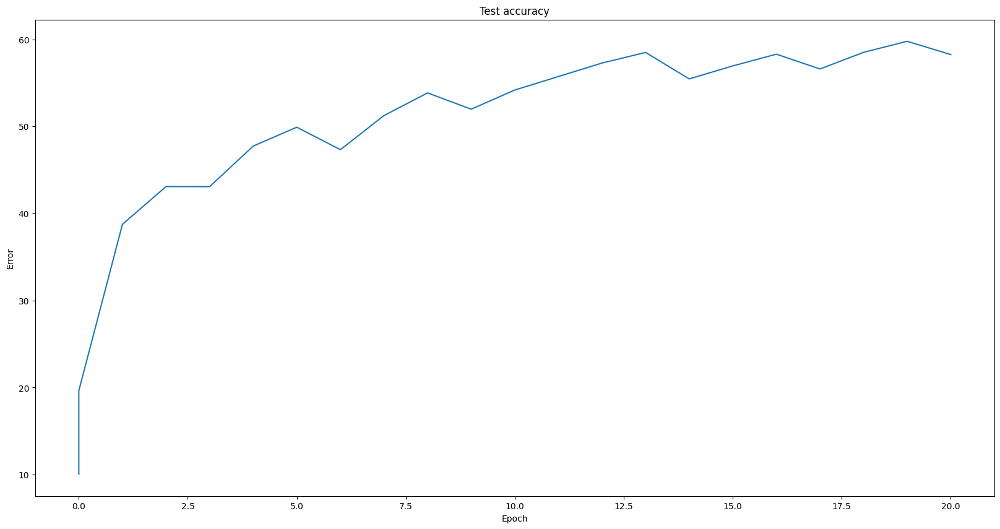

Using device cuda
num cpus: 2

Test set: Average loss: 2.3025, Accuracy: 1034/10000 (10%)

Wed May 10 00:03:50 2023 Train Epoch: 0 [0/50000 (0%)]	Loss: 2.302021
Wed May 10 00:03:58 2023 Train Epoch: 0 [25600/50000 (51%)]	Loss: 1.930970

Test set: Average loss: 1.9227, Accuracy: 3311/10000 (33%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/MOMENTUM-0.7/000.pt

Wed May 10 00:04:09 2023 Train Epoch: 1 [0/50000 (0%)]	Loss: 1.874779
Wed May 10 00:04:16 2023 Train Epoch: 1 [25600/50000 (51%)]	Loss: 1.871545

Test set: Average loss: 1.6096, Accuracy: 4196/10000 (42%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/MOMENTUM-0.7/001.pt

Wed May 10 00:04:28 2023 Train Epoch: 2 [0/50000 (0%)]	Loss: 1.638824
Wed May 10 00:04:34 2023 Train Epoch: 2 [25600/50000 (51%)]	Loss: 1.672193

Test set: Average loss: 1.5021, Accuracy: 4711/10000 (47%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/MOMENTUM-0.7/002.pt

Wed May 10 00:04:46 2023 Train Epoch: 3 [0/50000 (0%)]	Loss: 1.556288
Wed May 

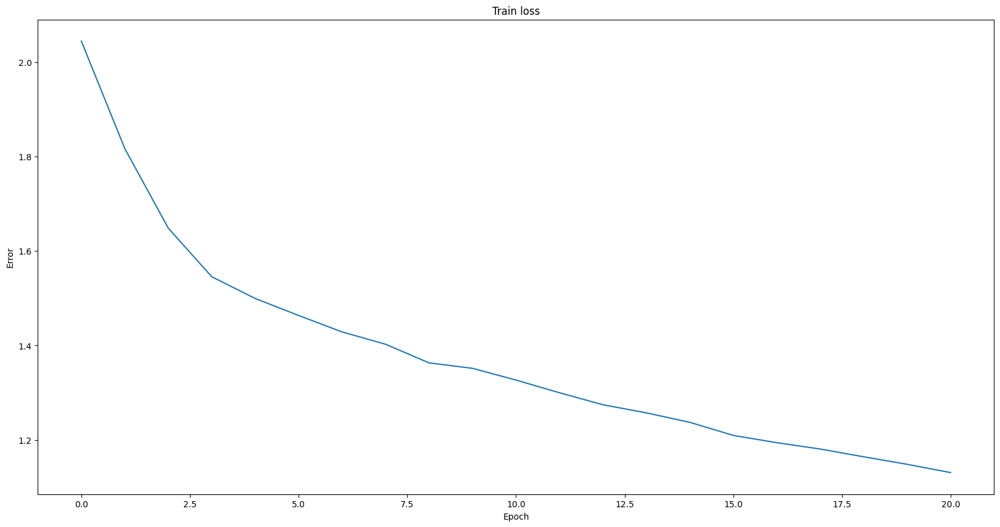

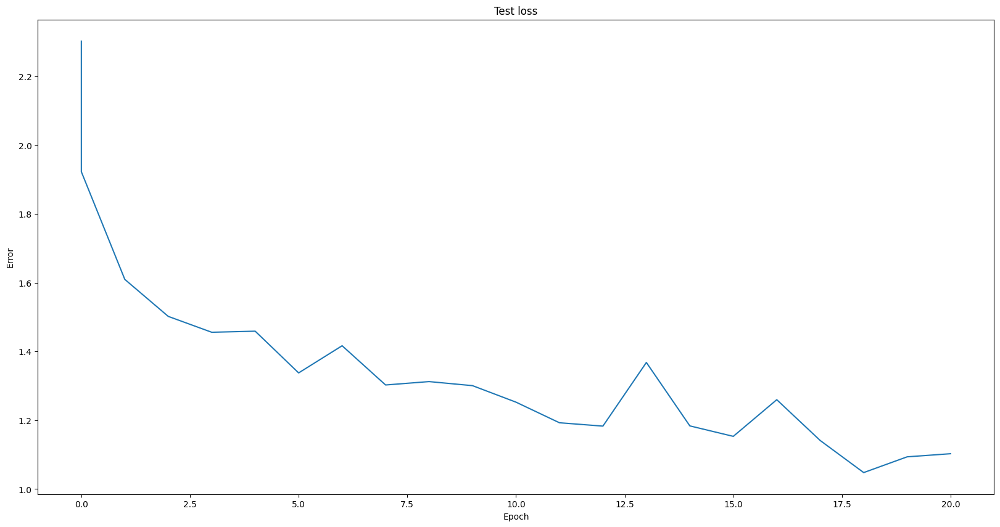

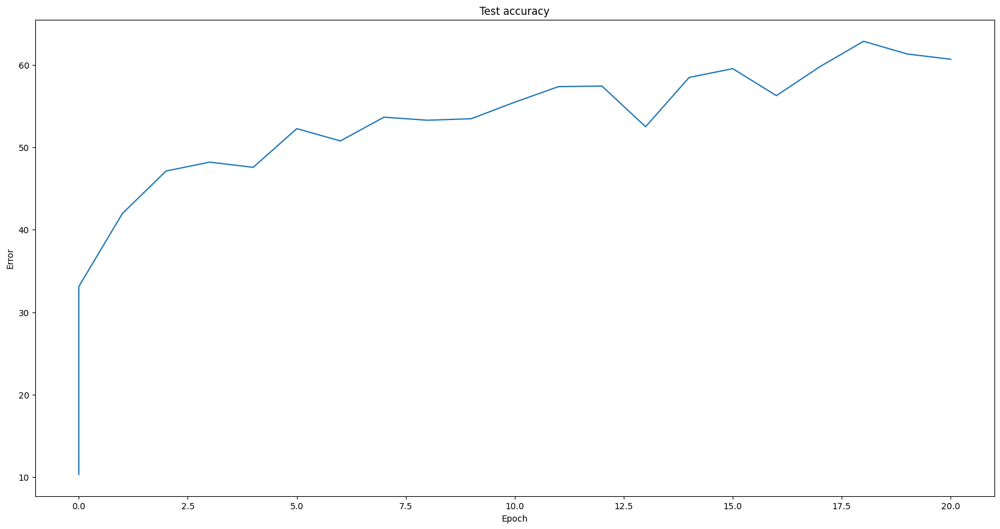

Using device cuda
num cpus: 2

Test set: Average loss: 2.3030, Accuracy: 1047/10000 (10%)

Wed May 10 00:10:22 2023 Train Epoch: 0 [0/50000 (0%)]	Loss: 2.303519
Wed May 10 00:10:29 2023 Train Epoch: 0 [25600/50000 (51%)]	Loss: 2.011909

Test set: Average loss: 1.7721, Accuracy: 3725/10000 (37%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/MOMENTUM-0.8/000.pt

Wed May 10 00:10:40 2023 Train Epoch: 1 [0/50000 (0%)]	Loss: 1.763918
Wed May 10 00:10:48 2023 Train Epoch: 1 [25600/50000 (51%)]	Loss: 1.667860

Test set: Average loss: 1.5646, Accuracy: 4448/10000 (44%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/MOMENTUM-0.8/001.pt

Wed May 10 00:10:59 2023 Train Epoch: 2 [0/50000 (0%)]	Loss: 1.641579
Wed May 10 00:11:06 2023 Train Epoch: 2 [25600/50000 (51%)]	Loss: 1.435281

Test set: Average loss: 1.4429, Accuracy: 4827/10000 (48%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/MOMENTUM-0.8/002.pt

Wed May 10 00:11:17 2023 Train Epoch: 3 [0/50000 (0%)]	Loss: 1.512492
Wed May 

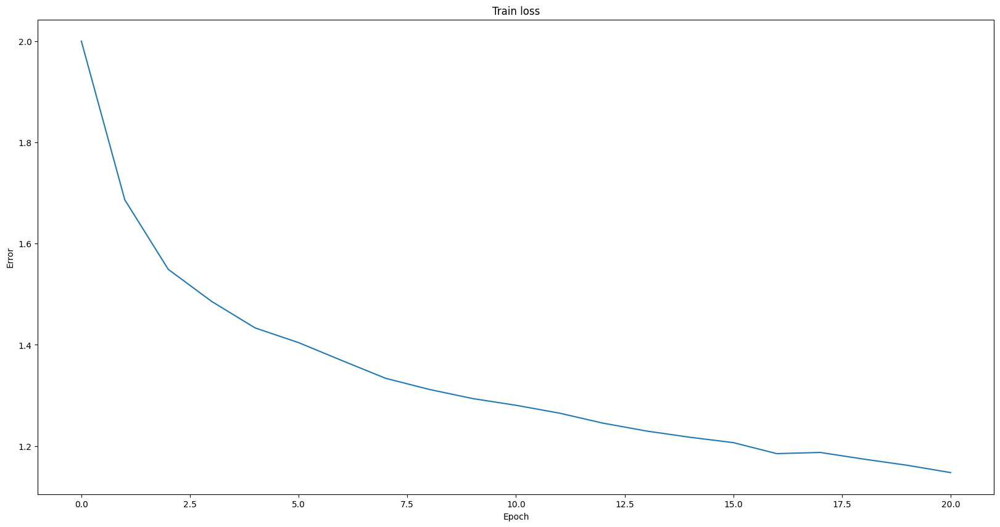

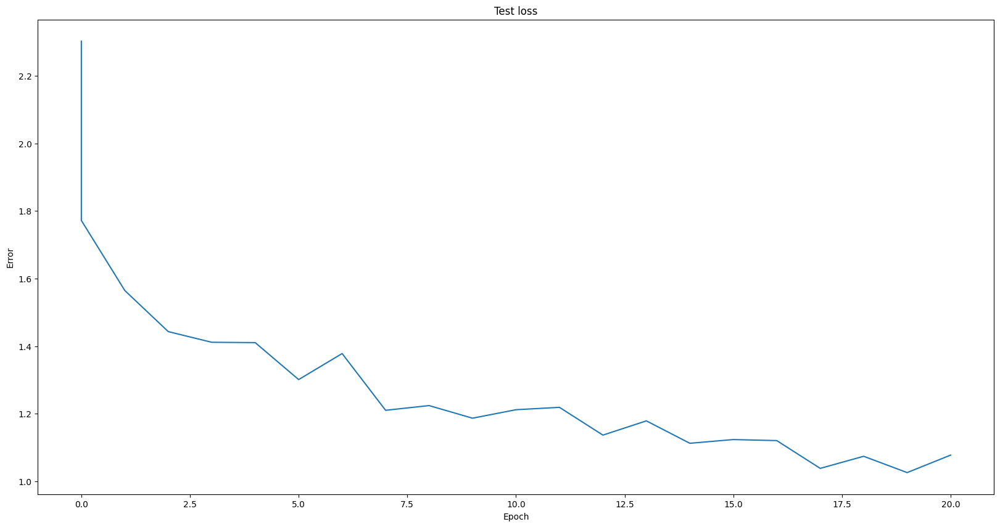

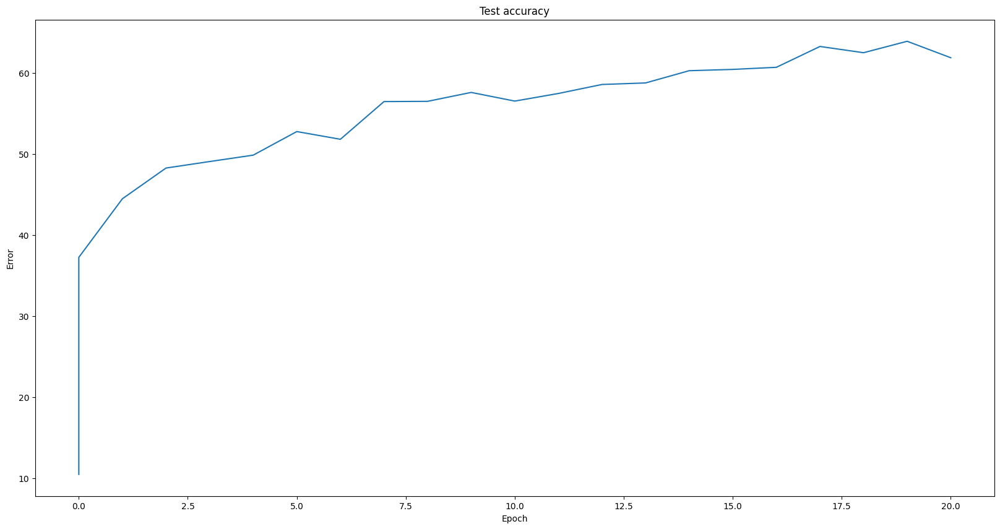

In [ ]:
test_momentum()

## StarterCifarNet Experiments
0.9 for momentum for normal CifarNet seems to work best
0.1 for learning rate seems to work best

accuracy on test set tops out at 65%, then goes down after 40 epochs
during epochs 40-80, bounces around 65-70, doesnt hit 70

trying the model from before, but now for 40 more epochs and (1/10) of LR, results in average of 74 accuracy

trying model one last time, with 40 more epochs and LR of 0.0001, ends with 75
sicne we have hit a third plateau

Using device cuda
num cpus: 2
Restoring:
conv1.weight -> 	torch.Size([16, 3, 3, 3]) = 0MB
conv1.bias -> 	torch.Size([16]) = 0MB
conv2.weight -> 	torch.Size([32, 16, 3, 3]) = 0MB
conv2.bias -> 	torch.Size([32]) = 0MB
conv3.weight -> 	torch.Size([64, 32, 3, 3]) = 0MB
conv3.bias -> 	torch.Size([64]) = 0MB
fc1.weight -> 	torch.Size([10, 1024]) = 0MB
fc1.bias -> 	torch.Size([10]) = 0MB

Restored all variables
No new variables
Restored /gdrive/My Drive/colab_files/hw1/cifar/logs/main-0.1/120.pt

Test set: Average loss: 0.7584, Accuracy: 7410/10000 (74%)

Thu May 11 17:54:52 2023 Train Epoch: 120 [0/50000 (0%)]	Loss: 0.803644
Thu May 11 17:55:00 2023 Train Epoch: 120 [25600/50000 (51%)]	Loss: 0.706091

Test set: Average loss: 0.7344, Accuracy: 7512/10000 (75%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/main-0.1/120.pt

Thu May 11 17:55:11 2023 Train Epoch: 121 [0/50000 (0%)]	Loss: 0.743981
Thu May 11 17:55:18 2023 Train Epoch: 121 [25600/50000 (51%)]	Loss: 0.810266

Test set: Average 

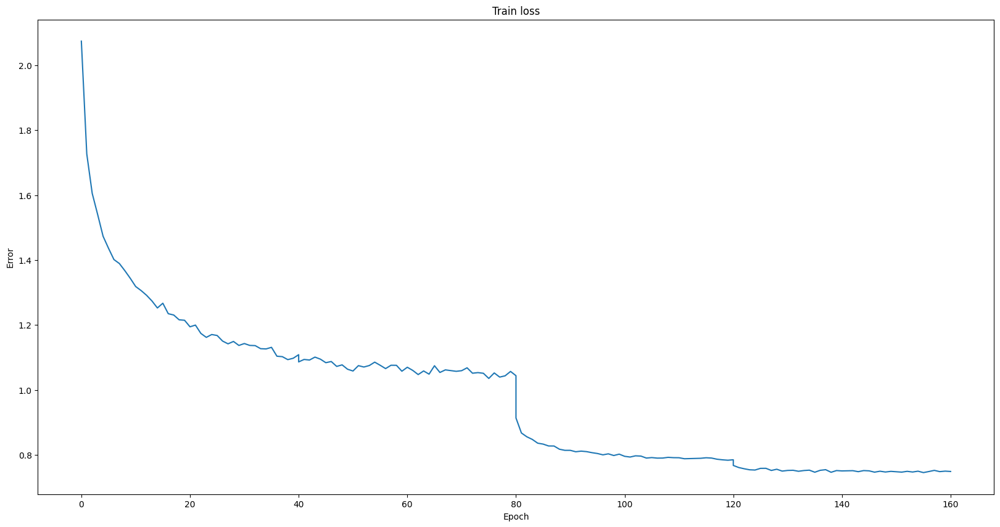

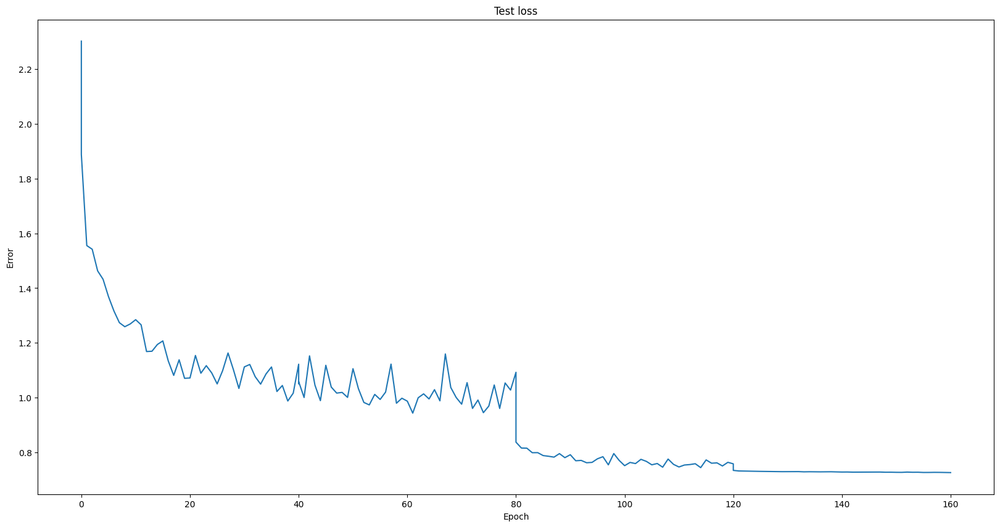

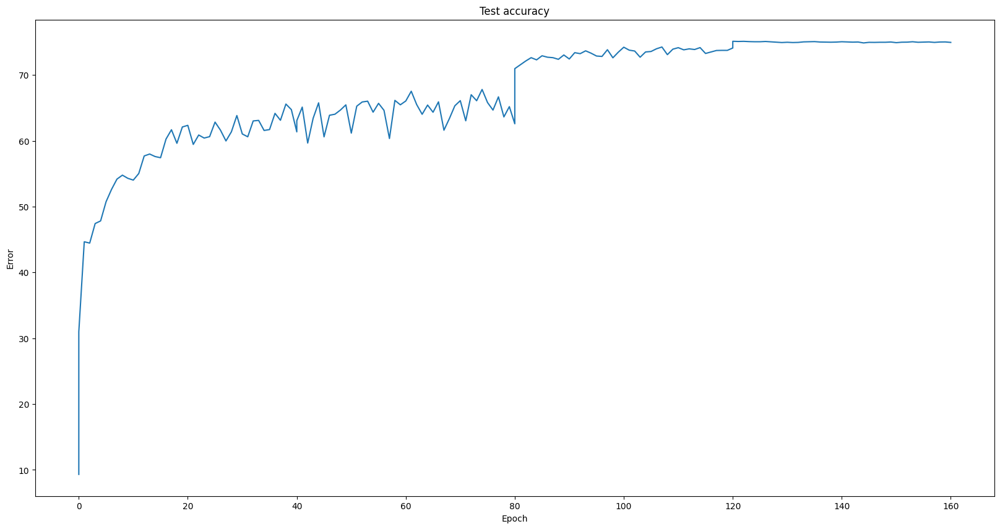

In [ ]:
run_model("main", StarterCifarNet(), 1, 160, eta=0.0001, momentum=0.9)

Using device cuda
num cpus: 2
Restoring:
conv1.weight -> 	torch.Size([16, 3, 3, 3]) = 0MB
conv1.bias -> 	torch.Size([16]) = 0MB
conv2.weight -> 	torch.Size([32, 16, 3, 3]) = 0MB
conv2.bias -> 	torch.Size([32]) = 0MB
conv3.weight -> 	torch.Size([64, 32, 3, 3]) = 0MB
conv3.bias -> 	torch.Size([64]) = 0MB
fc1.weight -> 	torch.Size([10, 1024]) = 0MB
fc1.bias -> 	torch.Size([10]) = 0MB

Restored all variables
No new variables
Restored /gdrive/My Drive/colab_files/hw1/cifar/logs/0.1/020.pt

Test set: Average loss: 1.2228, Accuracy: 5637/10000 (56%)

Sat Apr 29 00:18:43 2023 Train Epoch: 20 [0/50000 (0%)]	Loss: 1.305959
Sat Apr 29 00:18:50 2023 Train Epoch: 20 [25600/50000 (51%)]	Loss: 1.267725

Test set: Average loss: 1.1969, Accuracy: 5751/10000 (58%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/0.1/020.pt

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/0.1/020.pt



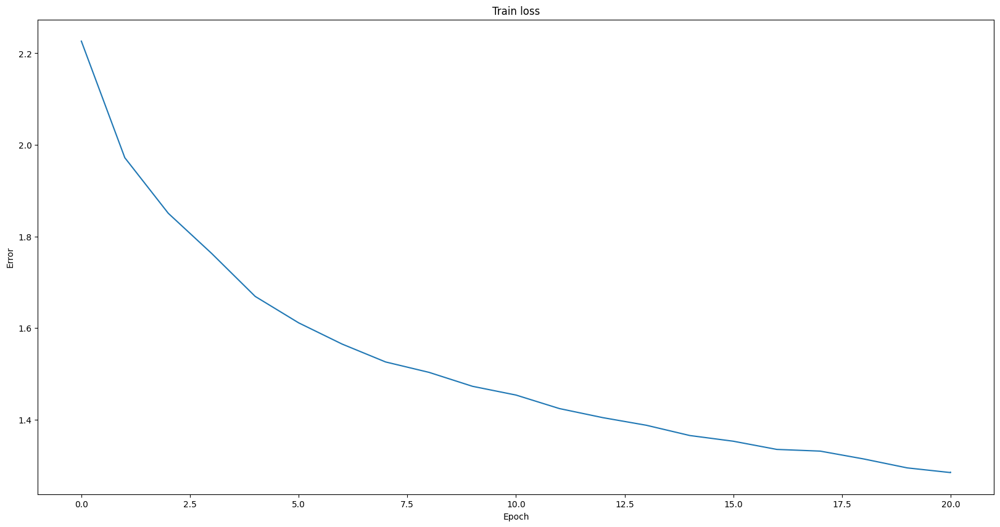

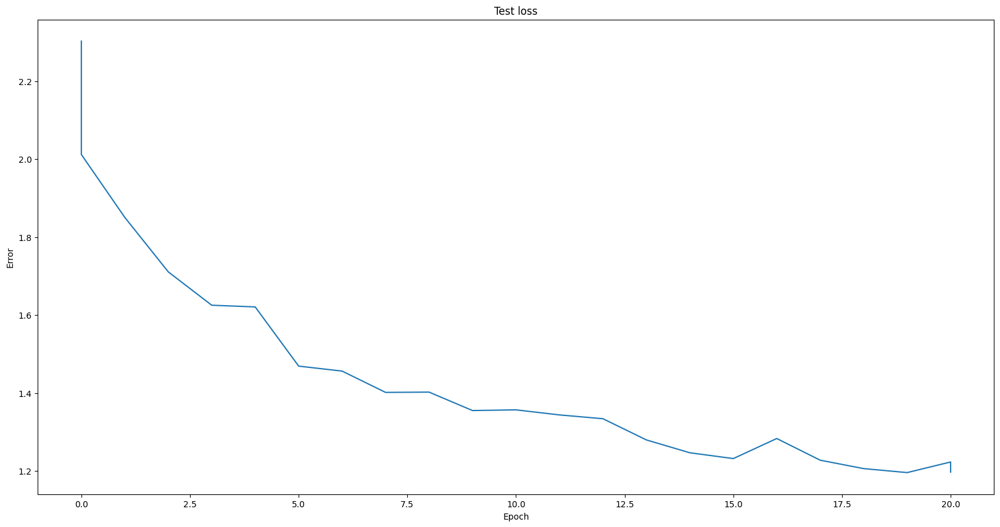

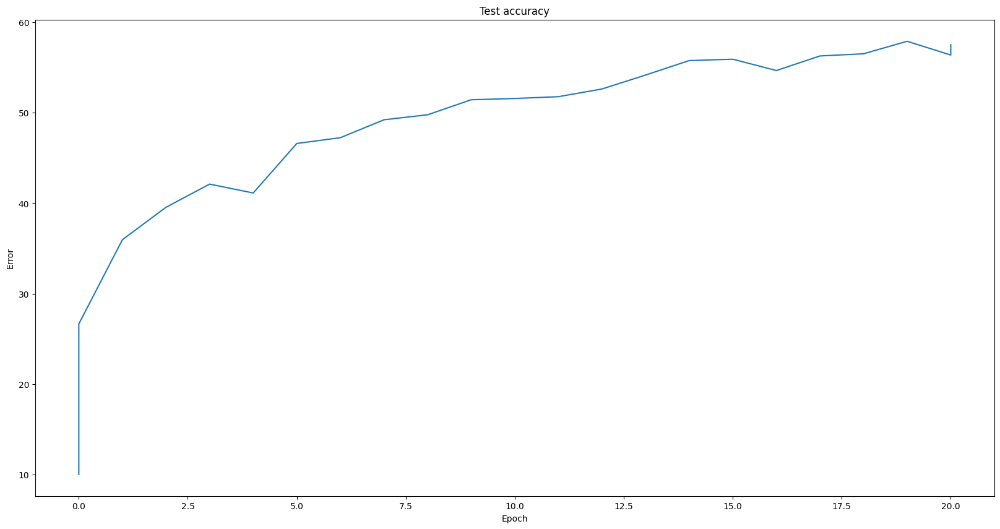

In [ ]:
# Play around with these constants, you may find a better setting.
BATCH_SIZE = 256
TEST_BATCH_SIZE = 10
EPOCHS = 20
LEARNING_RATE = 0.01
MOMENTUM = 0.9
USE_CUDA = True
SEED = 0
PRINT_INTERVAL = 100
WEIGHT_DECAY = 0.0005

EXPERIMENT_VERSION = "0.1" # increment this to start a new experiment
LOG_PATH = DATA_PATH + 'logs/' + EXPERIMENT_VERSION + '/'

# Now the actual training code
use_cuda = USE_CUDA and torch.cuda.is_available()

#torch.manual_seed(SEED)

device = torch.device("cuda" if use_cuda else "cpu")
print('Using device', device)
import multiprocessing
print('num cpus:', multiprocessing.cpu_count())

kwargs = {'num_workers': multiprocessing.cpu_count(),
          'pin_memory': True} if use_cuda else {}

class_names = ['plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

train_loader = torch.utils.data.DataLoader(data_train, batch_size=BATCH_SIZE,
                                           shuffle=True, **kwargs)
test_loader = torch.utils.data.DataLoader(data_test, batch_size=TEST_BATCH_SIZE,
                                          shuffle=False, **kwargs)

model = CifarNet().to(device)
optimizer = optim.SGD(model.parameters(), lr=LEARNING_RATE, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)
start_epoch = model.load_last_model(LOG_PATH)

train_losses, test_losses, test_accuracies = pt_util.read_log(LOG_PATH + 'log.pkl', ([], [], []))
test_loss, test_accuracy = test(model, device, test_loader)

test_losses.append((start_epoch, test_loss))
test_accuracies.append((start_epoch, test_accuracy))

try:
    for epoch in range(start_epoch, EPOCHS + 1):
        train_loss = train(model, device, train_loader, optimizer, epoch, PRINT_INTERVAL)
        test_loss, test_accuracy = test(model, device, test_loader)
        train_losses.append((epoch, train_loss))
        test_losses.append((epoch, test_loss))
        test_accuracies.append((epoch, test_accuracy))
        pt_util.write_log(LOG_PATH + 'log.pkl', (train_losses, test_losses, test_accuracies))
        model.save_best_model(test_accuracy, LOG_PATH + '%03d.pt' % epoch)


except KeyboardInterrupt as ke:
    print('Interrupted')
except:
    import traceback
    traceback.print_exc()
finally:
    model.save_model(LOG_PATH + '%03d.pt' % epoch, 0)
    ep, val = zip(*train_losses)
    pt_util.plot(ep, val, 'Train loss', 'Epoch', 'Error')
    ep, val = zip(*test_losses)
    pt_util.plot(ep, val, 'Test loss', 'Epoch', 'Error')
    ep, val = zip(*test_accuracies)
    pt_util.plot(ep, val, 'Test accuracy', 'Epoch', 'Error')


## ConvoPoolCifarNet Experiments

### Experiment 1
Started with learning rate of 0.1, momentum of 0.9, going for 40 epochs
Ended with around 50% accuracy to start which was nice

Tried continuing for another 40 epochs, LR of 0.01 now
Accuracy seems to have plateau'd at 65%

Going to try for another 40 epochs, lowered momentum to 0.7 and same eta

Going to try for one last 40 epochs, upped momentum to 0.9 again, and lowered eta, ended up around 67%

One last 40 epochs, LR=0.00001, momentum at 0.9. Plateu'd at 68%

In [ ]:
from torchsummary import summary

Using device cuda
num cpus: 2
Restoring:
conv1.weight -> 	torch.Size([8, 3, 3, 3]) = 0MB
conv1.bias -> 	torch.Size([8]) = 0MB
conv2.weight -> 	torch.Size([16, 8, 3, 3]) = 0MB
conv2.bias -> 	torch.Size([16]) = 0MB
conv3.weight -> 	torch.Size([32, 16, 3, 3]) = 0MB
conv3.bias -> 	torch.Size([32]) = 0MB
fc1.weight -> 	torch.Size([10, 32]) = 0MB
fc1.bias -> 	torch.Size([10]) = 0MB

Restored all variables
No new variables
Restored /gdrive/My Drive/colab_files/hw1/cifar/logs/convo-0.1/171.pt

Test set: Average loss: 0.9428, Accuracy: 6746/10000 (67%)

Thu May 11 22:40:05 2023 Train Epoch: 171 [0/50000 (0%)]	Loss: 0.982794
Thu May 11 22:40:12 2023 Train Epoch: 171 [25600/50000 (51%)]	Loss: 0.943613

Test set: Average loss: 0.9419, Accuracy: 6756/10000 (68%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/convo-0.1/171.pt

Thu May 11 22:40:23 2023 Train Epoch: 172 [0/50000 (0%)]	Loss: 1.023887
Thu May 11 22:40:30 2023 Train Epoch: 172 [25600/50000 (51%)]	Loss: 0.906305

Test set: Average los

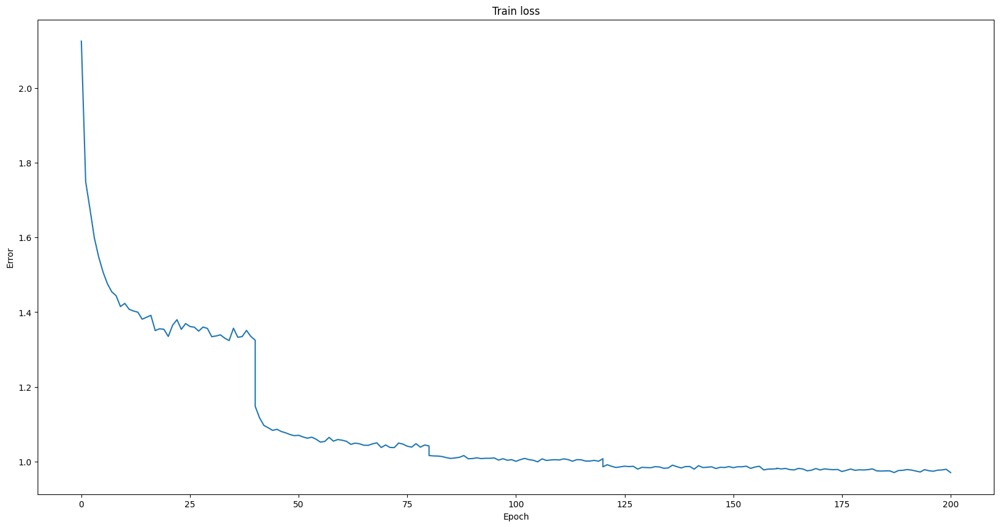

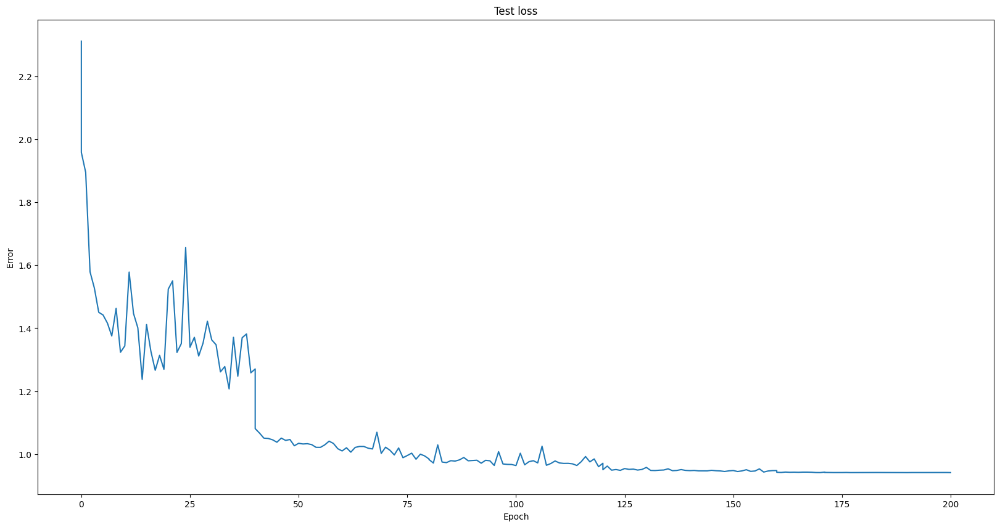

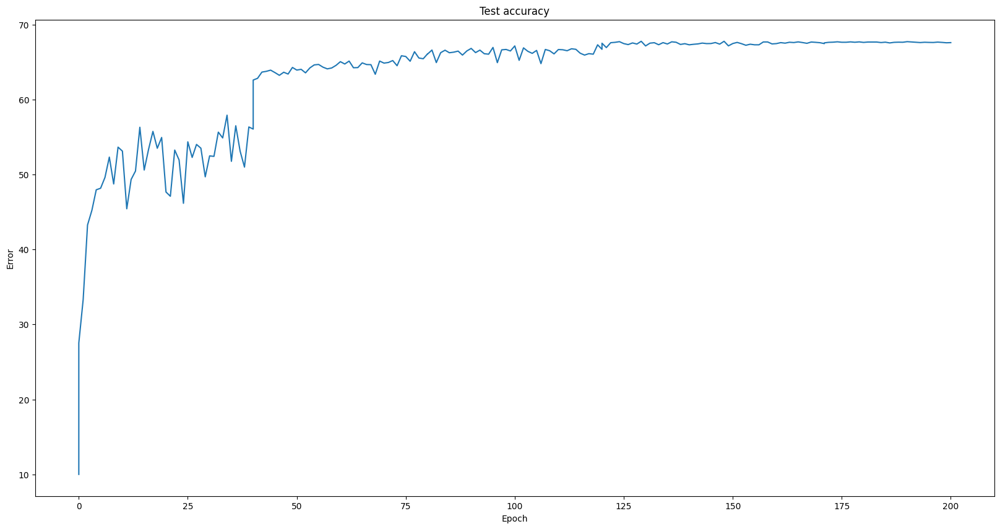

In [ ]:
run_model("convo", ConvoPoolCifarNet(), 1, 200, eta=0.00001, momentum=0.9)

### Experiment 2
Trying for the same length of 200 epochs, having consistent momentum but reducing eta by (1/10) each 40 epochs

Using device cuda
num cpus: 2

Test set: Average loss: 2.3080, Accuracy: 1000/10000 (10%)

Fri May 12 00:09:16 2023 Train Epoch: 0 [0/50000 (0%)]	Loss: 2.314310
Fri May 12 00:09:22 2023 Train Epoch: 0 [25600/50000 (51%)]	Loss: 2.244862

Test set: Average loss: 2.2099, Accuracy: 2121/10000 (21%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/convo-0.2/000.pt

Fri May 12 00:09:34 2023 Train Epoch: 1 [0/50000 (0%)]	Loss: 2.185034
Fri May 12 00:09:42 2023 Train Epoch: 1 [25600/50000 (51%)]	Loss: 1.890002

Test set: Average loss: 1.7955, Accuracy: 3341/10000 (33%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/convo-0.2/001.pt

Fri May 12 00:09:52 2023 Train Epoch: 2 [0/50000 (0%)]	Loss: 1.706195
Fri May 12 00:10:00 2023 Train Epoch: 2 [25600/50000 (51%)]	Loss: 1.722970

Test set: Average loss: 1.6805, Accuracy: 3790/10000 (38%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/convo-0.2/002.pt

Fri May 12 00:10:11 2023 Train Epoch: 3 [0/50000 (0%)]	Loss: 1.815629
Fri May 12 00:10:

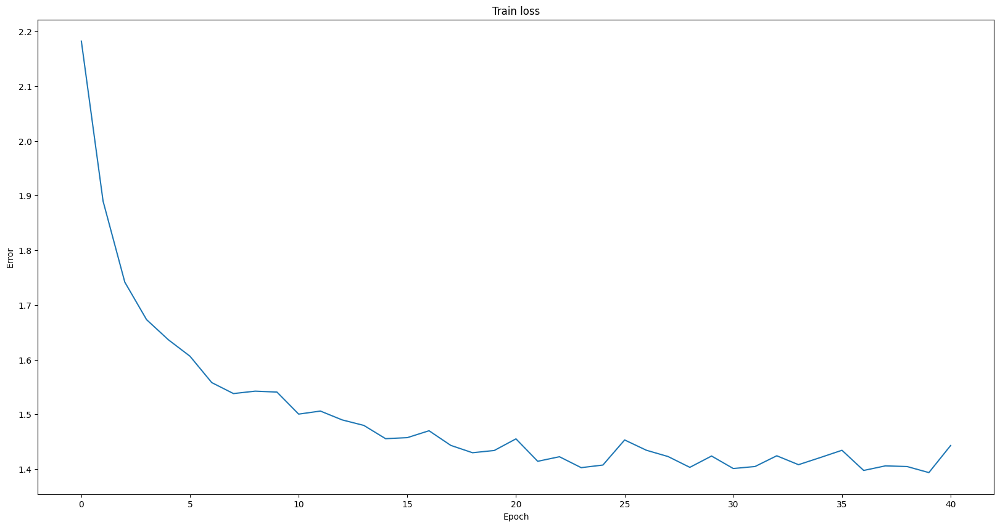

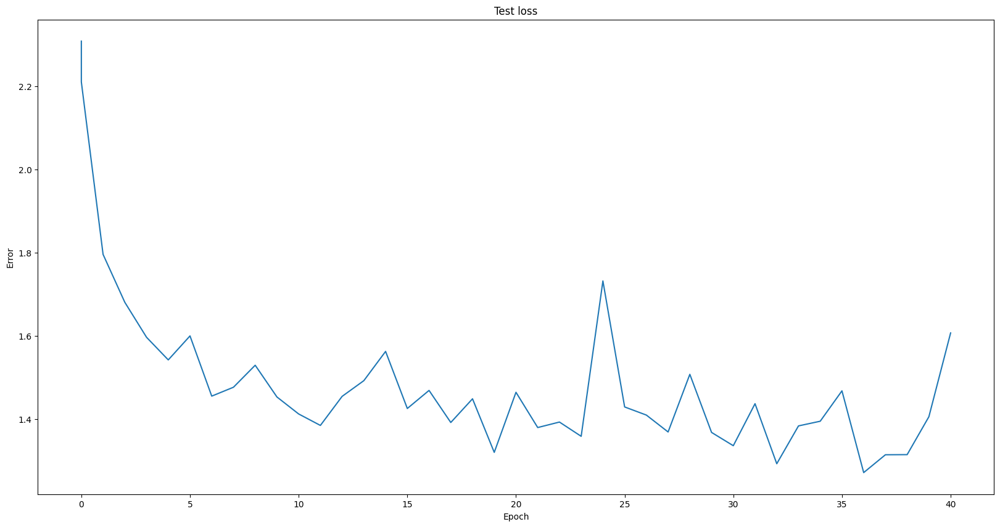

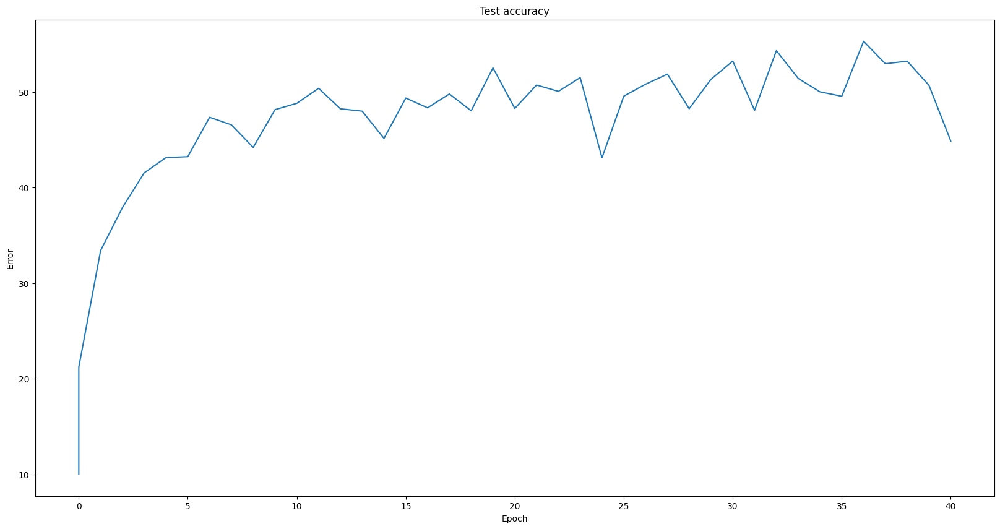

Using device cuda
num cpus: 2
Restoring:
conv1.weight -> 	torch.Size([8, 3, 3, 3]) = 0MB
conv1.bias -> 	torch.Size([8]) = 0MB
conv2.weight -> 	torch.Size([16, 8, 3, 3]) = 0MB
conv2.bias -> 	torch.Size([16]) = 0MB
conv3.weight -> 	torch.Size([32, 16, 3, 3]) = 0MB
conv3.bias -> 	torch.Size([32]) = 0MB
fc1.weight -> 	torch.Size([10, 32]) = 0MB
fc1.bias -> 	torch.Size([10]) = 0MB

Restored all variables
No new variables
Restored /gdrive/My Drive/colab_files/hw1/cifar/logs/convo-0.2/040.pt

Test set: Average loss: 1.6069, Accuracy: 4487/10000 (45%)

Fri May 12 00:21:46 2023 Train Epoch: 40 [0/50000 (0%)]	Loss: 1.693741
Fri May 12 00:21:54 2023 Train Epoch: 40 [25600/50000 (51%)]	Loss: 1.262950

Test set: Average loss: 1.1625, Accuracy: 5894/10000 (59%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/convo-0.2/040.pt

Fri May 12 00:22:05 2023 Train Epoch: 41 [0/50000 (0%)]	Loss: 1.316487
Fri May 12 00:22:11 2023 Train Epoch: 41 [25600/50000 (51%)]	Loss: 1.219090

Test set: Average loss: 1

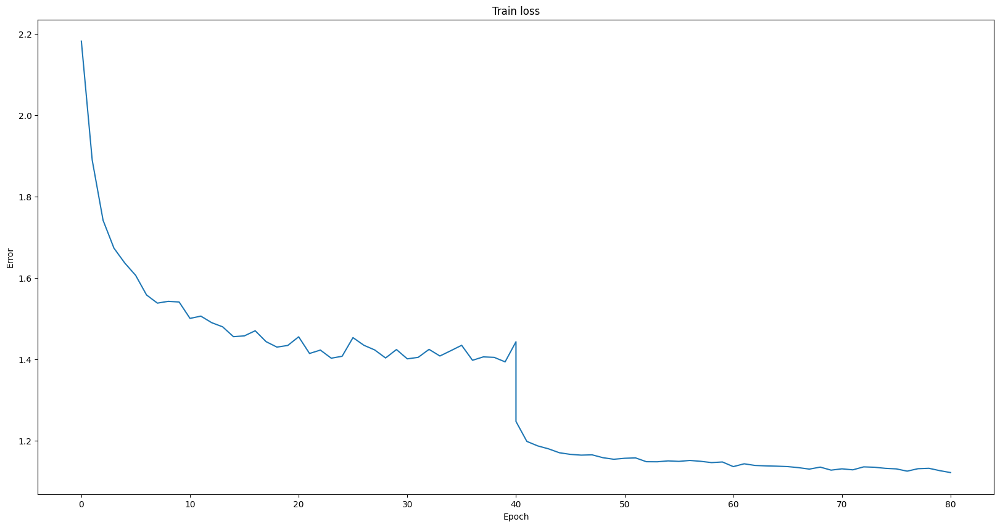

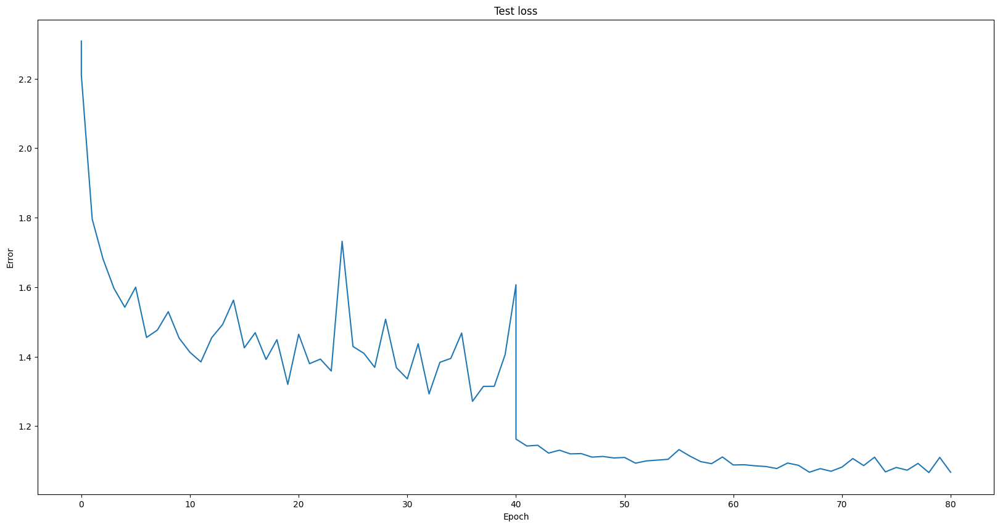

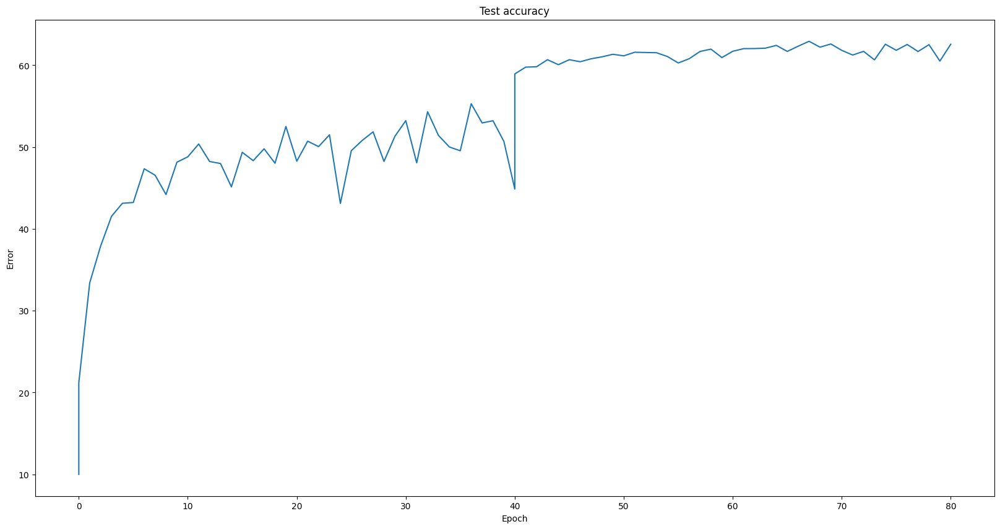

Using device cuda
num cpus: 2
Restoring:
conv1.weight -> 	torch.Size([8, 3, 3, 3]) = 0MB
conv1.bias -> 	torch.Size([8]) = 0MB
conv2.weight -> 	torch.Size([16, 8, 3, 3]) = 0MB
conv2.bias -> 	torch.Size([16]) = 0MB
conv3.weight -> 	torch.Size([32, 16, 3, 3]) = 0MB
conv3.bias -> 	torch.Size([32]) = 0MB
fc1.weight -> 	torch.Size([10, 32]) = 0MB
fc1.bias -> 	torch.Size([10]) = 0MB

Restored all variables
No new variables
Restored /gdrive/My Drive/colab_files/hw1/cifar/logs/convo-0.2/080.pt

Test set: Average loss: 1.0671, Accuracy: 6257/10000 (63%)

Fri May 12 00:34:19 2023 Train Epoch: 80 [0/50000 (0%)]	Loss: 1.226525
Fri May 12 00:34:27 2023 Train Epoch: 80 [25600/50000 (51%)]	Loss: 1.007290

Test set: Average loss: 1.0483, Accuracy: 6368/10000 (64%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/convo-0.2/080.pt

Fri May 12 00:34:38 2023 Train Epoch: 81 [0/50000 (0%)]	Loss: 1.028615
Fri May 12 00:34:44 2023 Train Epoch: 81 [25600/50000 (51%)]	Loss: 0.969817

Test set: Average loss: 1

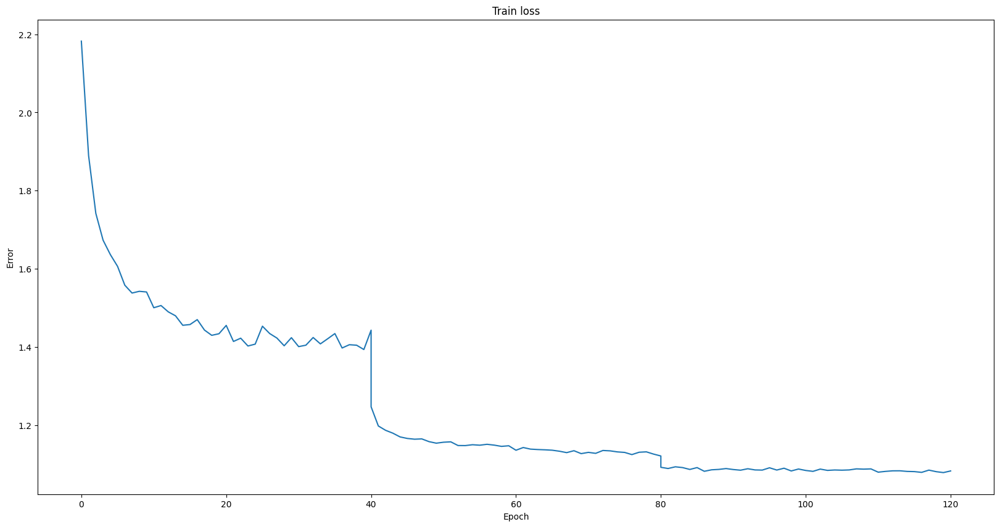

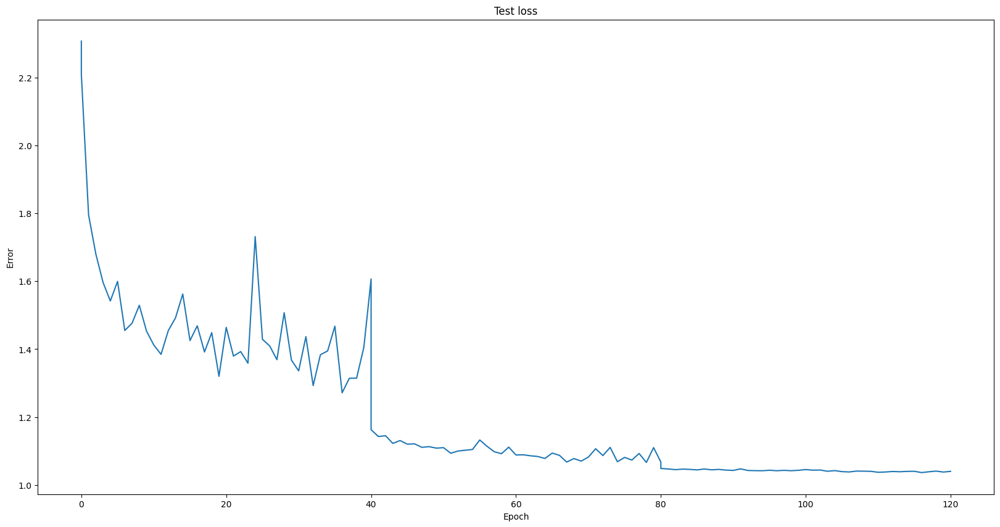

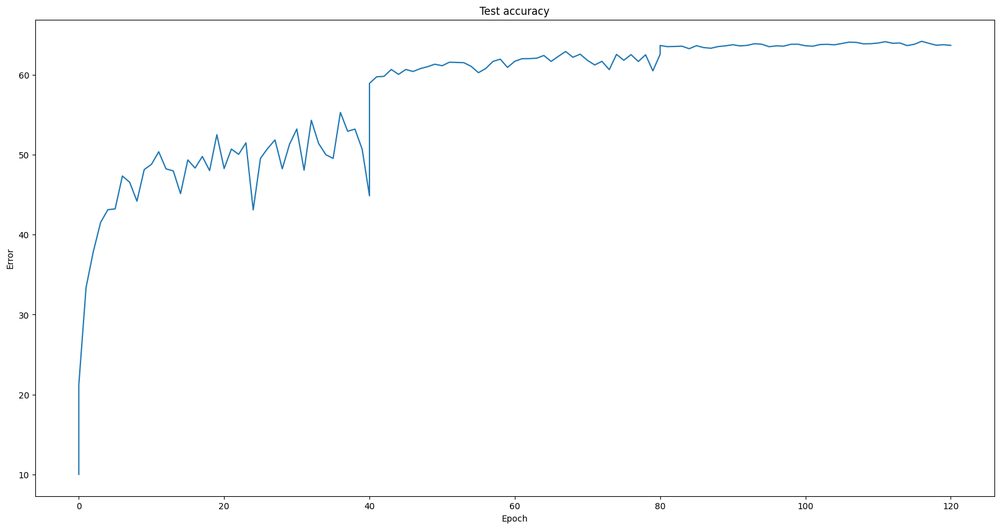

Using device cuda
num cpus: 2
Restoring:
conv1.weight -> 	torch.Size([8, 3, 3, 3]) = 0MB
conv1.bias -> 	torch.Size([8]) = 0MB
conv2.weight -> 	torch.Size([16, 8, 3, 3]) = 0MB
conv2.bias -> 	torch.Size([16]) = 0MB
conv3.weight -> 	torch.Size([32, 16, 3, 3]) = 0MB
conv3.bias -> 	torch.Size([32]) = 0MB
fc1.weight -> 	torch.Size([10, 32]) = 0MB
fc1.bias -> 	torch.Size([10]) = 0MB

Restored all variables
No new variables
Restored /gdrive/My Drive/colab_files/hw1/cifar/logs/convo-0.2/120.pt

Test set: Average loss: 1.0397, Accuracy: 6370/10000 (64%)

Fri May 12 00:46:48 2023 Train Epoch: 120 [0/50000 (0%)]	Loss: 1.016525
Fri May 12 00:46:54 2023 Train Epoch: 120 [25600/50000 (51%)]	Loss: 1.061732

Test set: Average loss: 1.0361, Accuracy: 6395/10000 (64%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/convo-0.2/120.pt

Fri May 12 00:47:06 2023 Train Epoch: 121 [0/50000 (0%)]	Loss: 1.135748
Fri May 12 00:47:13 2023 Train Epoch: 121 [25600/50000 (51%)]	Loss: 1.039668

Test set: Average los

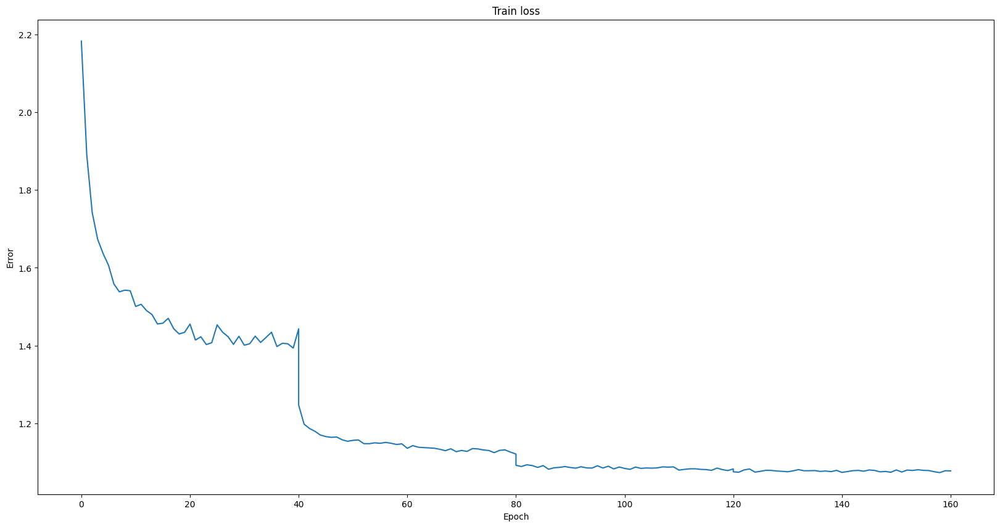

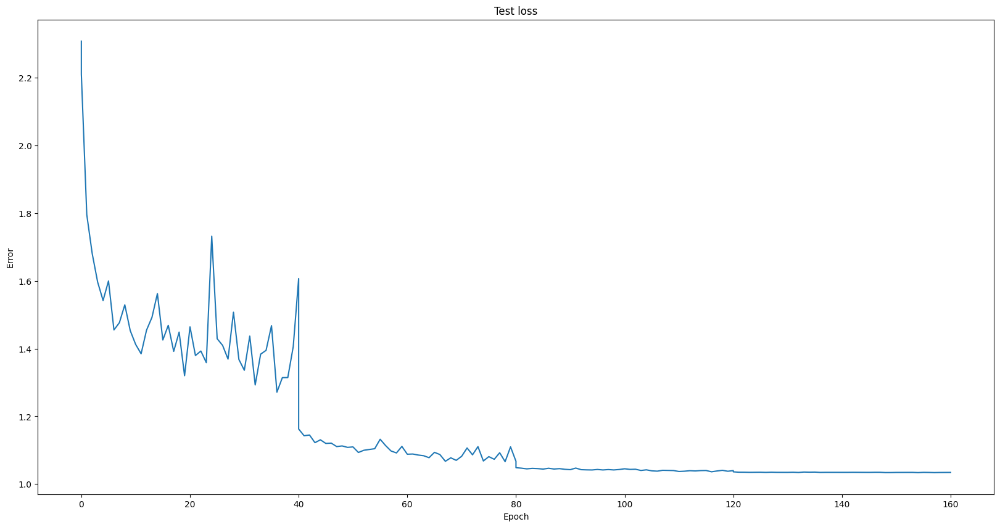

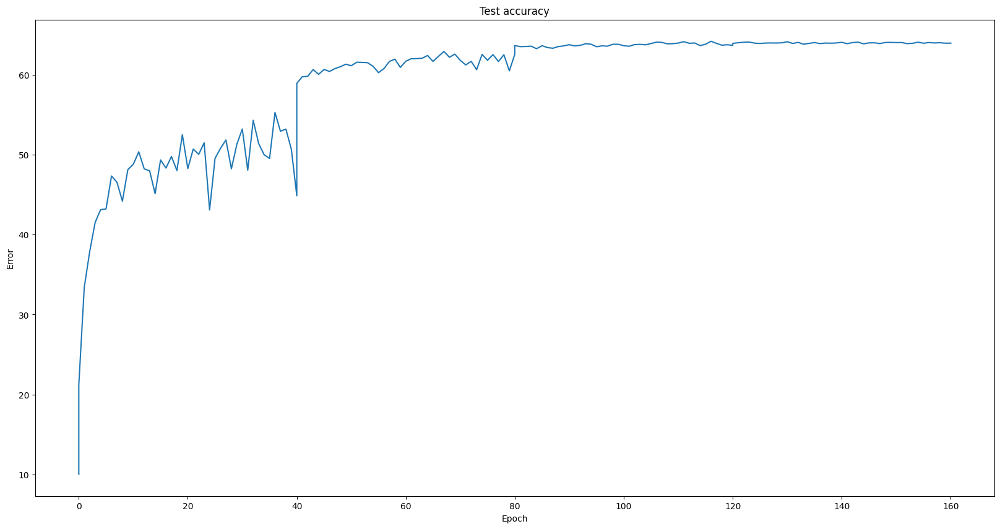

Using device cuda
num cpus: 2
Restoring:
conv1.weight -> 	torch.Size([8, 3, 3, 3]) = 0MB
conv1.bias -> 	torch.Size([8]) = 0MB
conv2.weight -> 	torch.Size([16, 8, 3, 3]) = 0MB
conv2.bias -> 	torch.Size([16]) = 0MB
conv3.weight -> 	torch.Size([32, 16, 3, 3]) = 0MB
conv3.bias -> 	torch.Size([32]) = 0MB
fc1.weight -> 	torch.Size([10, 32]) = 0MB
fc1.bias -> 	torch.Size([10]) = 0MB

Restored all variables
No new variables
Restored /gdrive/My Drive/colab_files/hw1/cifar/logs/convo-0.2/160.pt

Test set: Average loss: 1.0344, Accuracy: 6398/10000 (64%)

Fri May 12 00:59:30 2023 Train Epoch: 160 [0/50000 (0%)]	Loss: 1.100640
Fri May 12 00:59:38 2023 Train Epoch: 160 [25600/50000 (51%)]	Loss: 0.941578

Test set: Average loss: 1.0343, Accuracy: 6400/10000 (64%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/convo-0.2/160.pt

Fri May 12 00:59:49 2023 Train Epoch: 161 [0/50000 (0%)]	Loss: 0.978063
Fri May 12 00:59:55 2023 Train Epoch: 161 [25600/50000 (51%)]	Loss: 1.088706

Test set: Average los

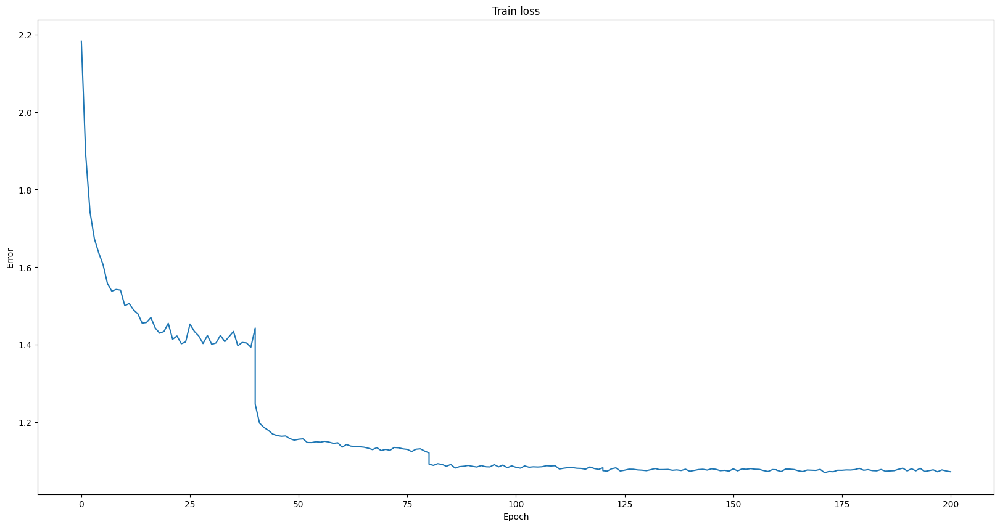

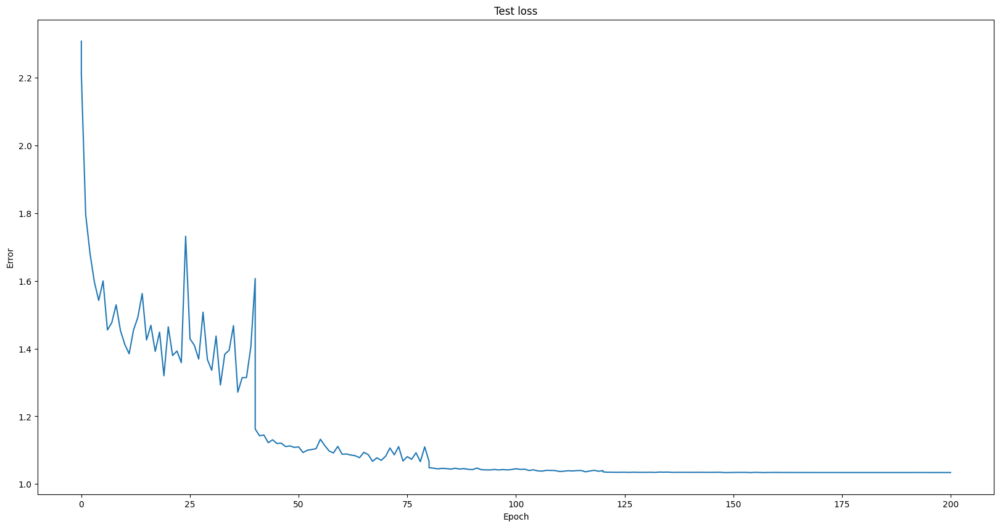

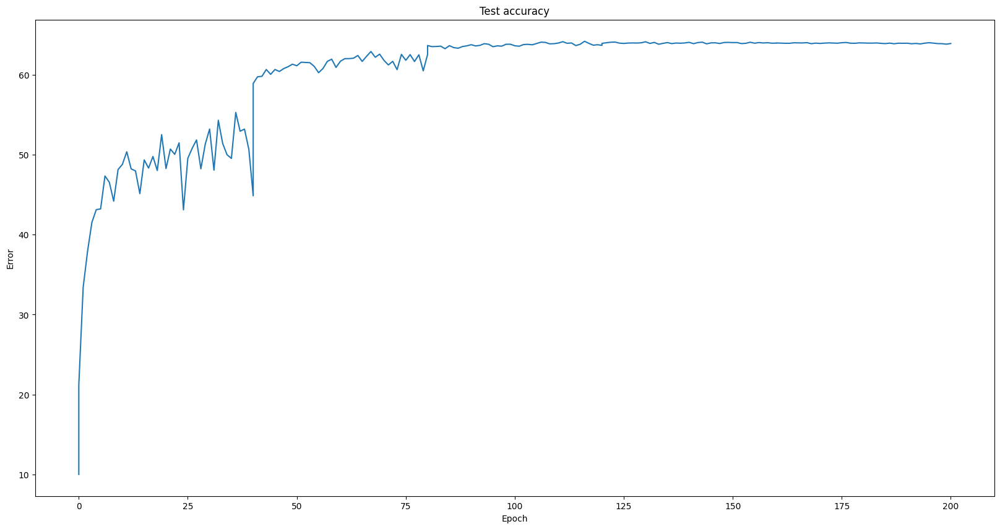

In [ ]:
run_model("convo", ConvoPoolCifarNet(), 2, 40, eta=0.1, momentum=0.9)
run_model("convo", ConvoPoolCifarNet(), 2, 80, eta=0.01, momentum=0.9)
run_model("convo", ConvoPoolCifarNet(), 2, 120, eta=0.001, momentum=0.9)
run_model("convo", ConvoPoolCifarNet(), 2, 160, eta=0.0001, momentum=0.9)
run_model("convo", ConvoPoolCifarNet(), 2, 200, eta=0.00001, momentum=0.9)

## ConvoPoolNet Experiments

### Experiment 1

#### Number of Epochs
I've been trying running my model for 200 epochs, lowering the LR every 40 epochs by (1/10). Seems that the models I've been testing reach a final plateau after 120 epochs so I'll be ending training after 120 epochs moving forward.

#### Momentum Value
I've been told a momentum value of 0.9 seems to work best in general for SGD + Momentum so I will be sticking with that.

#### Accuracy Plateau
I reached a plateau of 75% accuracy with this model after 120 epochs. Very little data augmentation is being done.


#### Next Steps
Since the training loss keeps going down in step with the test accuracy going up, I don't think I've overfit just yet.
Since I don't think I've overfit, I will try running the same experiment with a lower weight decay value. I was thinking of adding one or two more FC (fully-connected) layers at the end but it seems every only uses one FC layer at the end of a CNN so I won't be trying that out just yet but I think it could be something to try.

Aside from trying the lower weight decay value, some other things to try is adding more data augmentations, increasing the batch size with the data augmentations,and trying the adam optimizer instead since it is commonly recommended.


Using device cpu
num cpus: 2

Test set: Average loss: 2.3046, Accuracy: 1000/10000 (10%)

Fri May 12 02:08:49 2023 Train Epoch: 0 [0/50000 (0%)]	Loss: 2.302881
Fri May 12 02:09:13 2023 Train Epoch: 0 [25600/50000 (51%)]	Loss: 2.298850

Test set: Average loss: 2.3032, Accuracy: 1000/10000 (10%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/convo_2-0.1/000.pt

Fri May 12 02:09:41 2023 Train Epoch: 1 [0/50000 (0%)]	Loss: 2.301654
Fri May 12 02:10:04 2023 Train Epoch: 1 [25600/50000 (51%)]	Loss: 2.264814

Test set: Average loss: 2.0331, Accuracy: 2564/10000 (26%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/convo_2-0.1/001.pt

Fri May 12 02:10:31 2023 Train Epoch: 2 [0/50000 (0%)]	Loss: 2.068626
Fri May 12 02:10:54 2023 Train Epoch: 2 [25600/50000 (51%)]	Loss: 1.976004

Test set: Average loss: 1.8466, Accuracy: 3201/10000 (32%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/convo_2-0.1/002.pt

Fri May 12 02:11:22 2023 Train Epoch: 3 [0/50000 (0%)]	Loss: 1.823461
Fri May 12 0

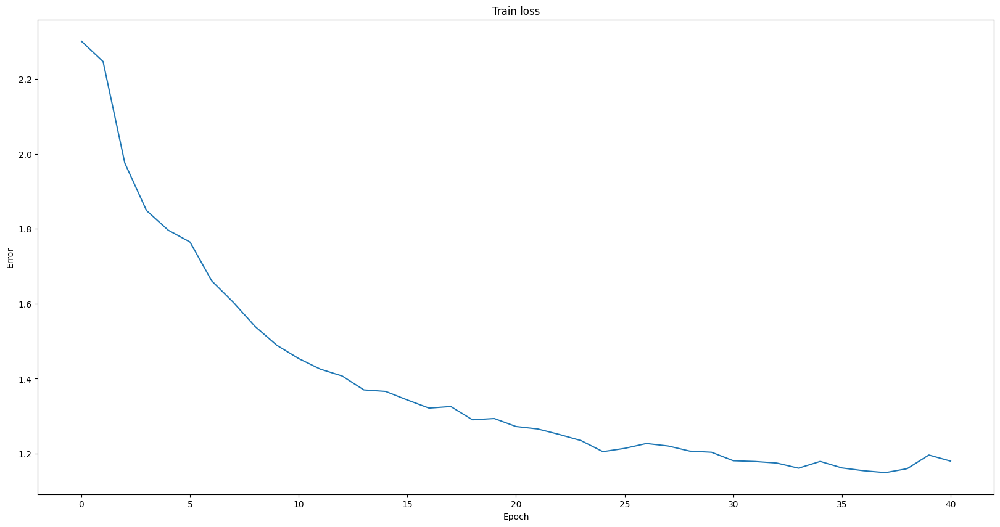

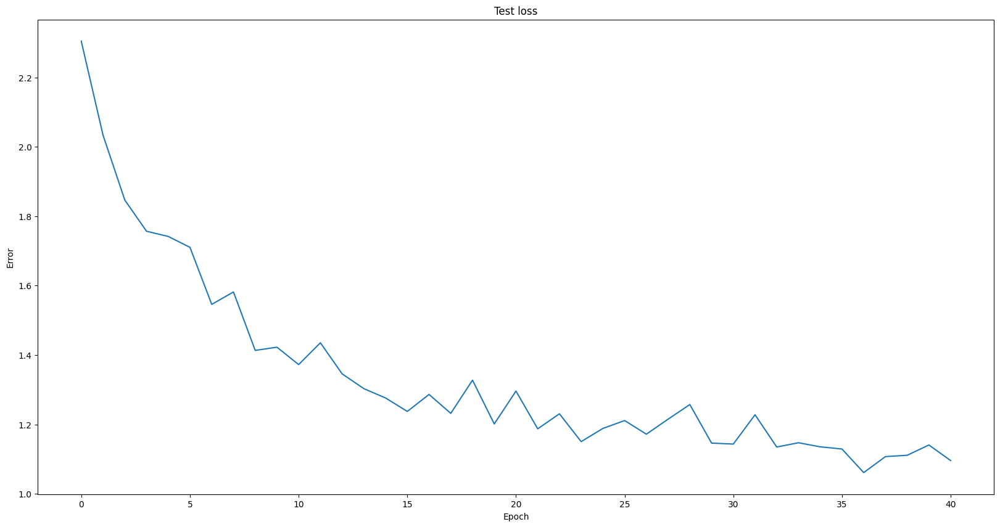

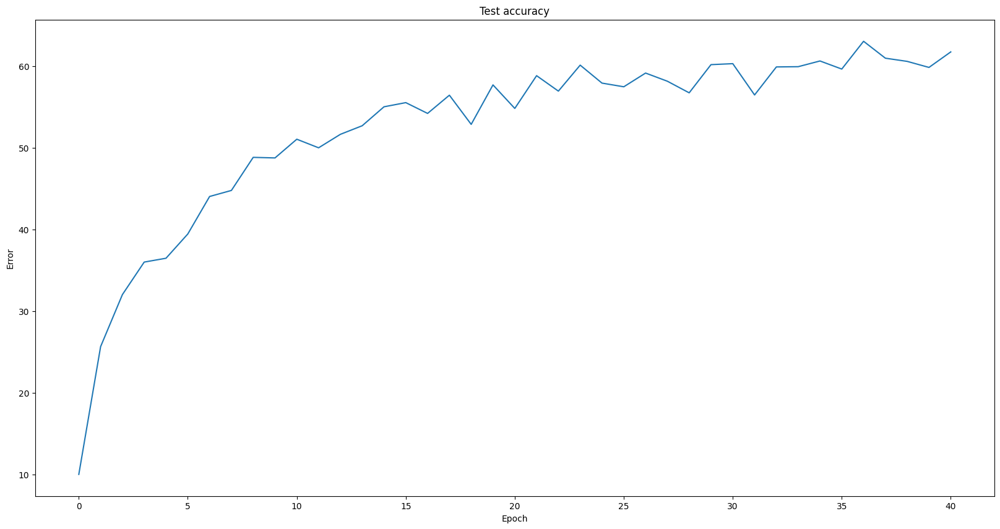

Using device cpu
num cpus: 2
Restoring:
conv1.weight -> 	torch.Size([8, 3, 3, 3]) = 0MB
conv1.bias -> 	torch.Size([8]) = 0MB
conv2.weight -> 	torch.Size([16, 8, 3, 3]) = 0MB
conv2.bias -> 	torch.Size([16]) = 0MB
conv3.weight -> 	torch.Size([32, 16, 3, 3]) = 0MB
conv3.bias -> 	torch.Size([32]) = 0MB
conv4.weight -> 	torch.Size([64, 32, 3, 3]) = 0MB
conv4.bias -> 	torch.Size([64]) = 0MB
conv5.weight -> 	torch.Size([128, 64, 3, 3]) = 0MB
conv5.bias -> 	torch.Size([128]) = 0MB
fc1.weight -> 	torch.Size([10, 128]) = 0MB
fc1.bias -> 	torch.Size([10]) = 0MB

Restored all variables
No new variables
Restored /gdrive/My Drive/colab_files/hw1/cifar/logs/convo_2-0.1/040.pt

Test set: Average loss: 1.0959, Accuracy: 6172/10000 (62%)

Fri May 12 02:44:01 2023 Train Epoch: 40 [0/50000 (0%)]	Loss: 1.156451
Fri May 12 02:44:24 2023 Train Epoch: 40 [25600/50000 (51%)]	Loss: 0.958332

Test set: Average loss: 0.9227, Accuracy: 6814/10000 (68%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/convo_2-0.1

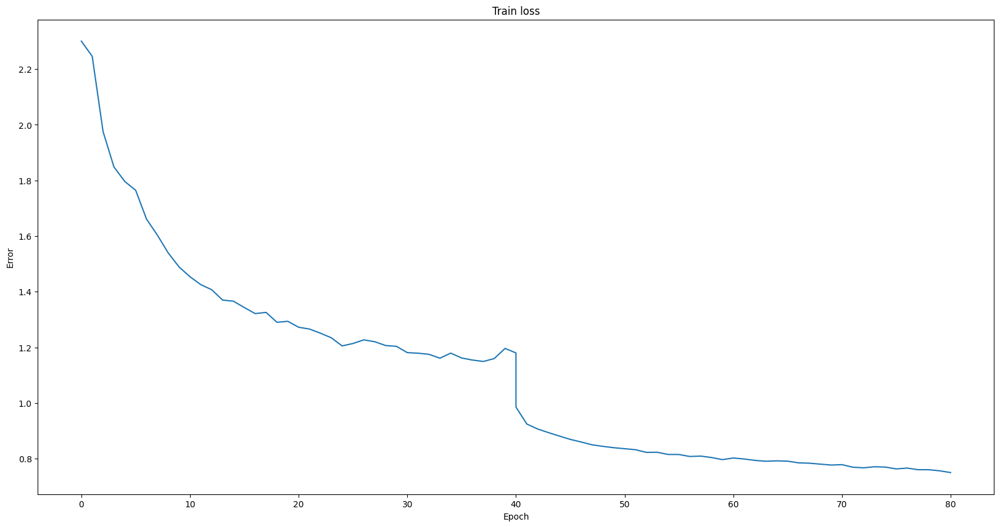

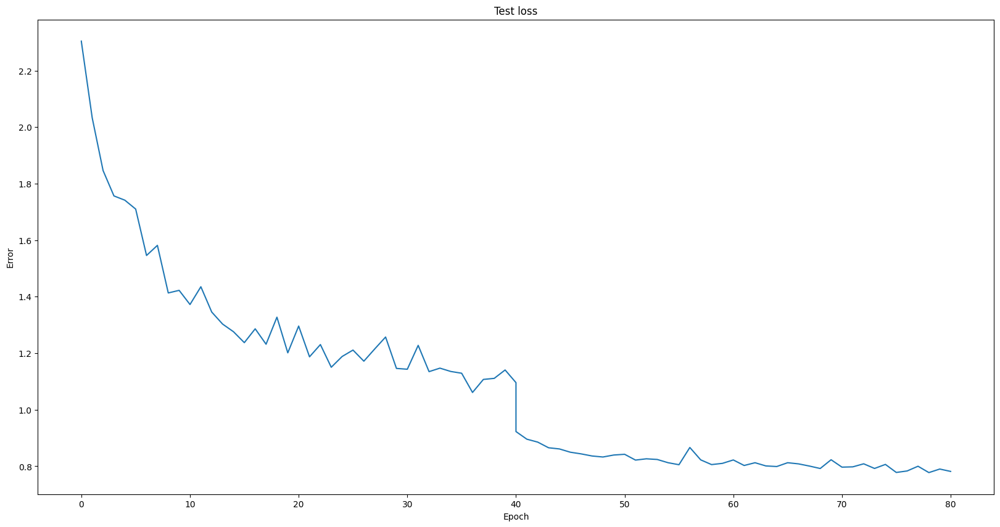

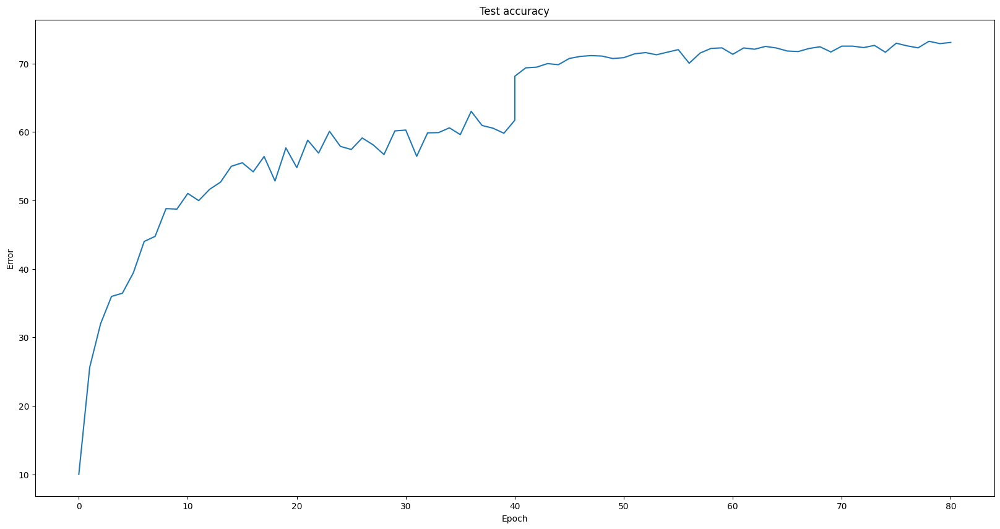

Using device cpu
num cpus: 2
Restoring:
conv1.weight -> 	torch.Size([8, 3, 3, 3]) = 0MB
conv1.bias -> 	torch.Size([8]) = 0MB
conv2.weight -> 	torch.Size([16, 8, 3, 3]) = 0MB
conv2.bias -> 	torch.Size([16]) = 0MB
conv3.weight -> 	torch.Size([32, 16, 3, 3]) = 0MB
conv3.bias -> 	torch.Size([32]) = 0MB
conv4.weight -> 	torch.Size([64, 32, 3, 3]) = 0MB
conv4.bias -> 	torch.Size([64]) = 0MB
conv5.weight -> 	torch.Size([128, 64, 3, 3]) = 0MB
conv5.bias -> 	torch.Size([128]) = 0MB
fc1.weight -> 	torch.Size([10, 128]) = 0MB
fc1.bias -> 	torch.Size([10]) = 0MB

Restored all variables
No new variables
Restored /gdrive/My Drive/colab_files/hw1/cifar/logs/convo_2-0.1/080.pt

Test set: Average loss: 0.7817, Accuracy: 7308/10000 (73%)

Fri May 12 03:19:36 2023 Train Epoch: 80 [0/50000 (0%)]	Loss: 0.954752
Fri May 12 03:20:00 2023 Train Epoch: 80 [25600/50000 (51%)]	Loss: 0.662334

Test set: Average loss: 0.7563, Accuracy: 7404/10000 (74%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/convo_2-0.1

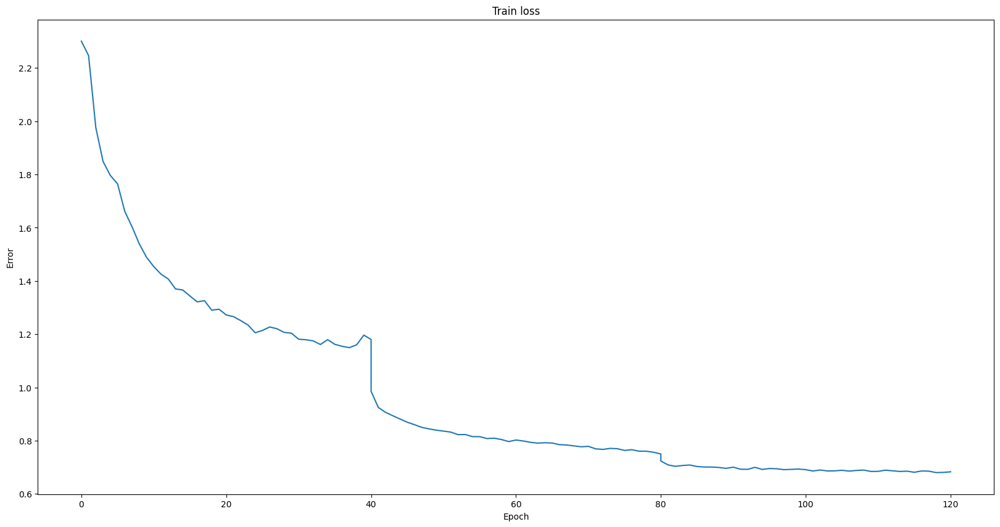

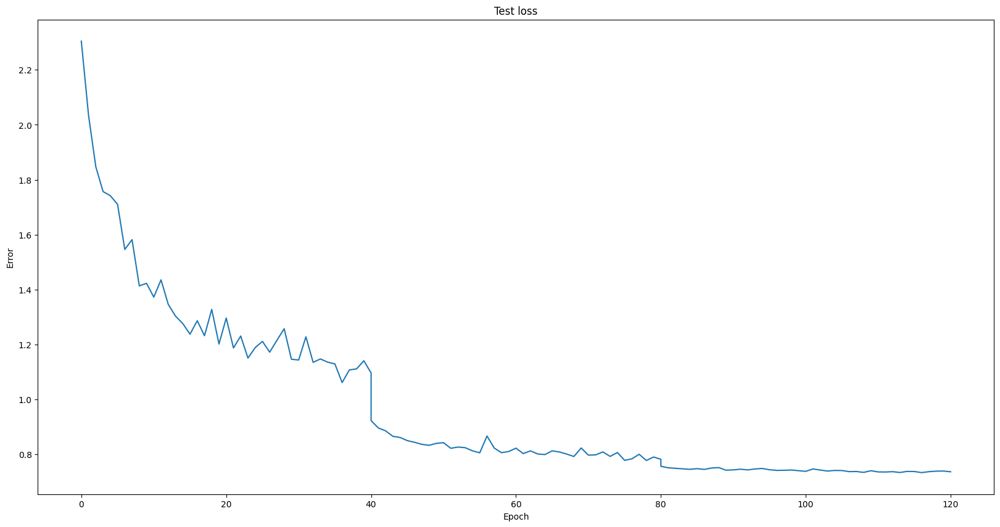

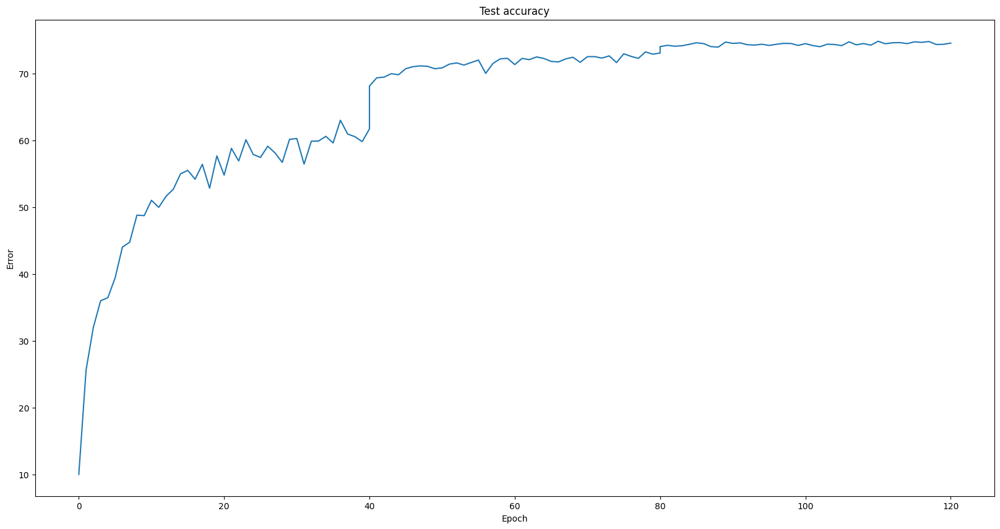

Using device cpu
num cpus: 2
Restoring:
conv1.weight -> 	torch.Size([8, 3, 3, 3]) = 0MB
conv1.bias -> 	torch.Size([8]) = 0MB
conv2.weight -> 	torch.Size([16, 8, 3, 3]) = 0MB
conv2.bias -> 	torch.Size([16]) = 0MB
conv3.weight -> 	torch.Size([32, 16, 3, 3]) = 0MB
conv3.bias -> 	torch.Size([32]) = 0MB
conv4.weight -> 	torch.Size([64, 32, 3, 3]) = 0MB
conv4.bias -> 	torch.Size([64]) = 0MB
conv5.weight -> 	torch.Size([128, 64, 3, 3]) = 0MB
conv5.bias -> 	torch.Size([128]) = 0MB
fc1.weight -> 	torch.Size([10, 128]) = 0MB
fc1.bias -> 	torch.Size([10]) = 0MB

Restored all variables
No new variables
Restored /gdrive/My Drive/colab_files/hw1/cifar/logs/convo_2-0.1/120.pt

Test set: Average loss: 0.7362, Accuracy: 7457/10000 (75%)

Fri May 12 03:55:16 2023 Train Epoch: 120 [0/50000 (0%)]	Loss: 0.681741
Fri May 12 03:55:39 2023 Train Epoch: 120 [25600/50000 (51%)]	Loss: 0.712165

Test set: Average loss: 0.7340, Accuracy: 7467/10000 (75%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/convo_2-0

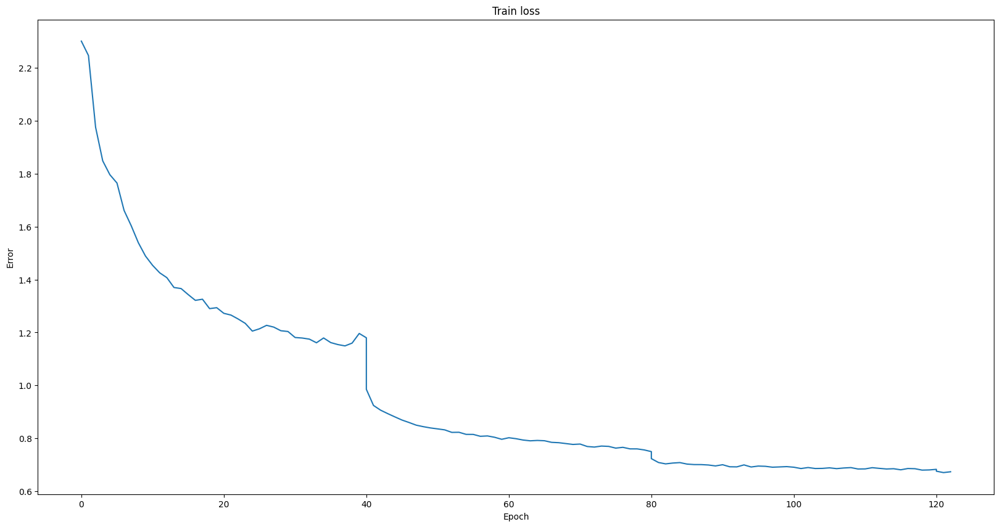

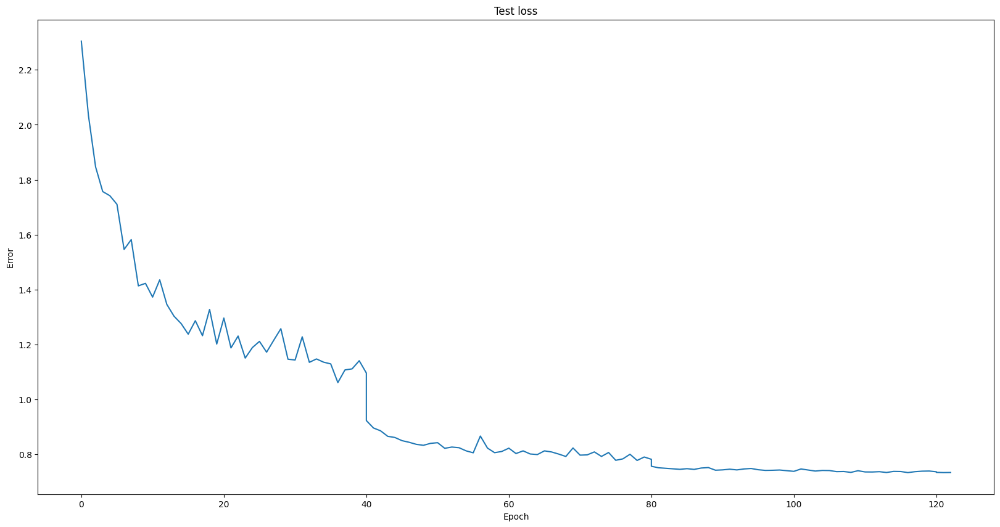

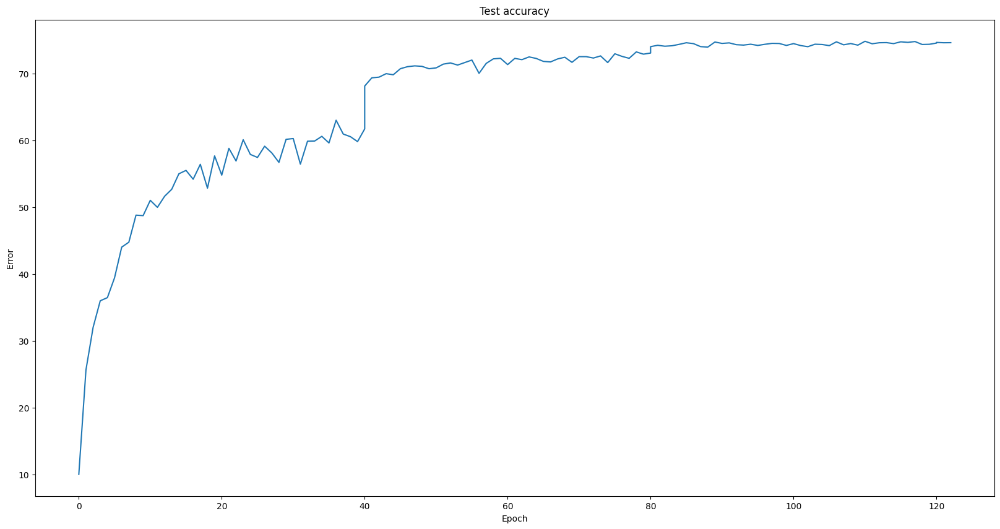

Using device cpu
num cpus: 2
Restoring:
conv1.weight -> 	torch.Size([8, 3, 3, 3]) = 0MB
conv1.bias -> 	torch.Size([8]) = 0MB
conv2.weight -> 	torch.Size([16, 8, 3, 3]) = 0MB
conv2.bias -> 	torch.Size([16]) = 0MB
conv3.weight -> 	torch.Size([32, 16, 3, 3]) = 0MB
conv3.bias -> 	torch.Size([32]) = 0MB
conv4.weight -> 	torch.Size([64, 32, 3, 3]) = 0MB
conv4.bias -> 	torch.Size([64]) = 0MB
conv5.weight -> 	torch.Size([128, 64, 3, 3]) = 0MB
conv5.bias -> 	torch.Size([128]) = 0MB
fc1.weight -> 	torch.Size([10, 128]) = 0MB
fc1.bias -> 	torch.Size([10]) = 0MB

Restored all variables
No new variables
Restored /gdrive/My Drive/colab_files/hw1/cifar/logs/convo_2-0.1/123.pt

Test set: Average loss: 0.7335, Accuracy: 7467/10000 (75%)

Fri May 12 03:58:00 2023 Train Epoch: 123 [0/50000 (0%)]	Loss: 0.661003
Fri May 12 03:58:24 2023 Train Epoch: 123 [25600/50000 (51%)]	Loss: 0.655822

Test set: Average loss: 0.7331, Accuracy: 7465/10000 (75%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/convo_2-0

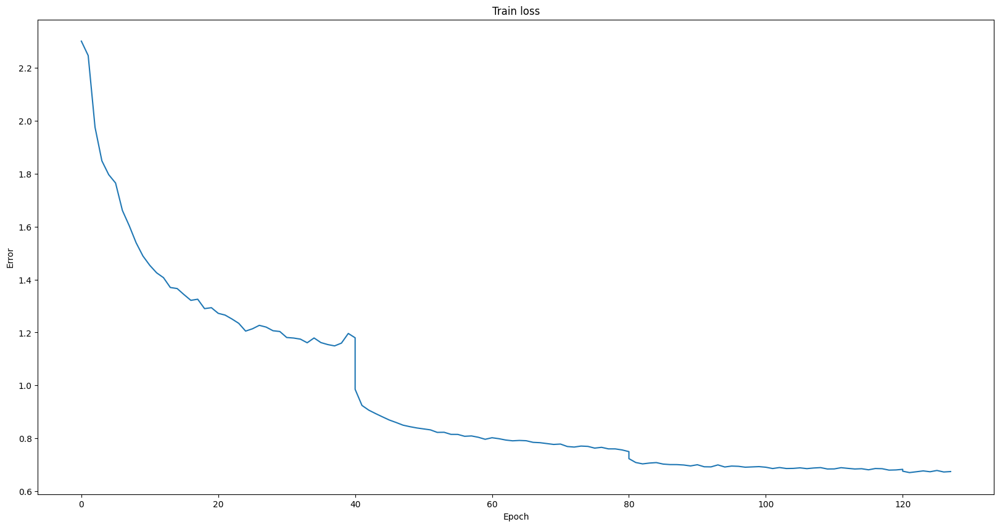

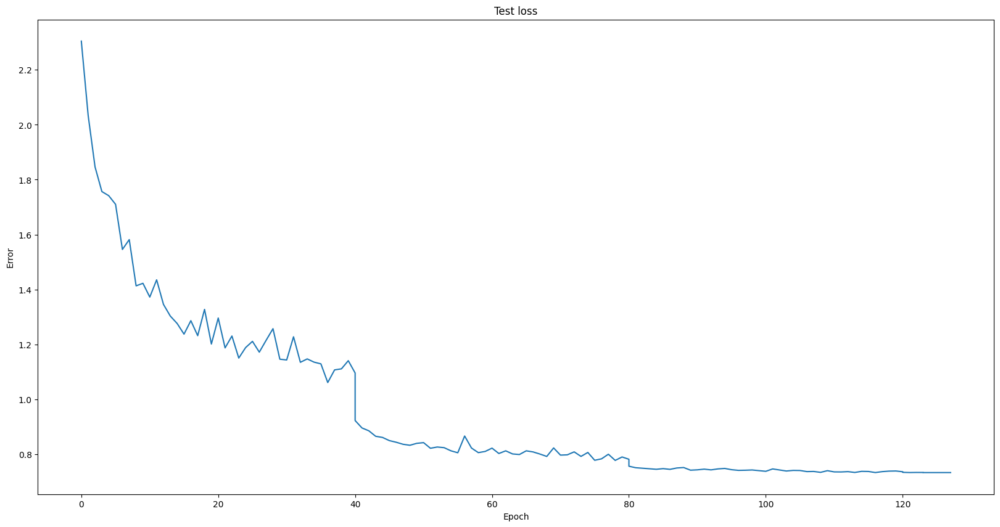

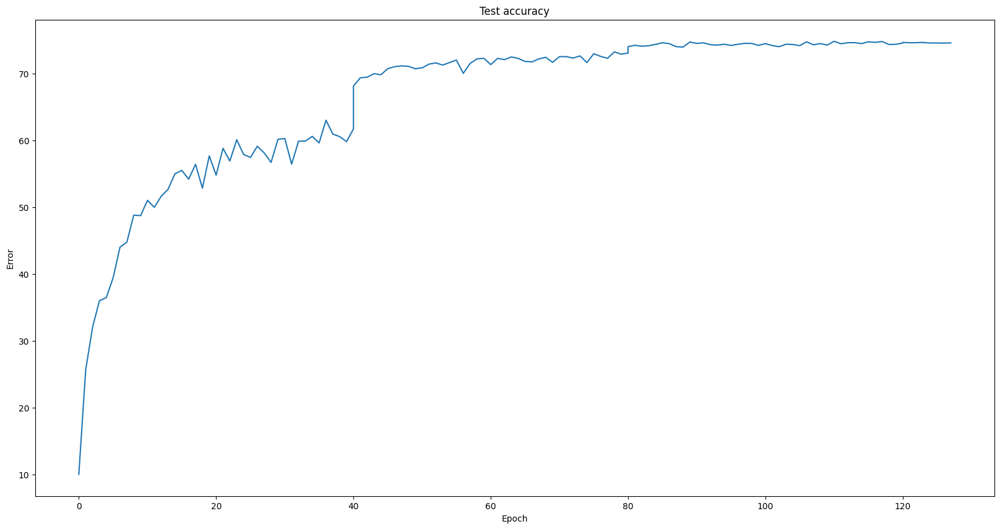

In [ ]:
run_model("convo_2", ConvoPoolNet(), 1, 40, eta=0.1, momentum=0.9)
run_model("convo_2", ConvoPoolNet(), 1, 80, eta=0.01, momentum=0.9)
run_model("convo_2", ConvoPoolNet(), 1, 120, eta=0.001, momentum=0.9)
run_model("convo_2", ConvoPoolNet(), 1, 160, eta=0.0001, momentum=0.9)
run_model("convo_2", ConvoPoolNet(), 1, 200, eta=0.00001, momentum=0.9)

### Experiment 2
Trying the same model, with a weight decay of 0.0001 and some extra data augmentations, and higher batch size

Did not seem to help at all, final accuracy down to 65%.

Using device cuda
num cpus: 2

Test set: Average loss: 2.3042, Accuracy: 1000/10000 (10%)

Fri May 12 23:47:36 2023 Train Epoch: 0 [0/50000 (0%)]	Loss: 2.307307

Test set: Average loss: 2.2969, Accuracy: 1096/10000 (11%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/convo_2-0.2/000.pt

Fri May 12 23:47:57 2023 Train Epoch: 1 [0/50000 (0%)]	Loss: 2.295116

Test set: Average loss: 2.1048, Accuracy: 2483/10000 (25%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/convo_2-0.2/001.pt

Fri May 12 23:48:16 2023 Train Epoch: 2 [0/50000 (0%)]	Loss: 2.134502

Test set: Average loss: 1.9048, Accuracy: 3111/10000 (31%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/convo_2-0.2/002.pt

Fri May 12 23:48:35 2023 Train Epoch: 3 [0/50000 (0%)]	Loss: 1.888961

Test set: Average loss: 1.8397, Accuracy: 3270/10000 (33%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/convo_2-0.2/003.pt

Fri May 12 23:48:55 2023 Train Epoch: 4 [0/50000 (0%)]	Loss: 1.858391

Test set: Average loss: 1.7394, Ac

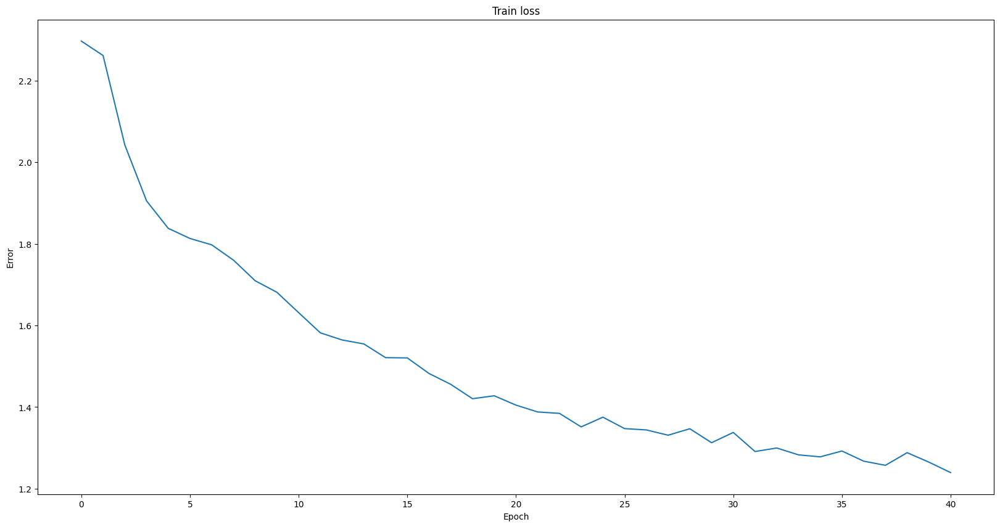

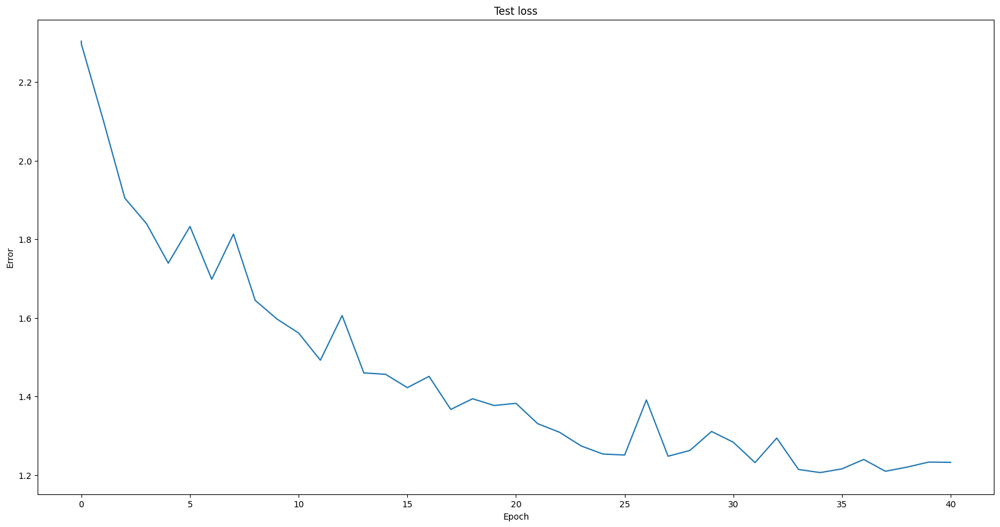

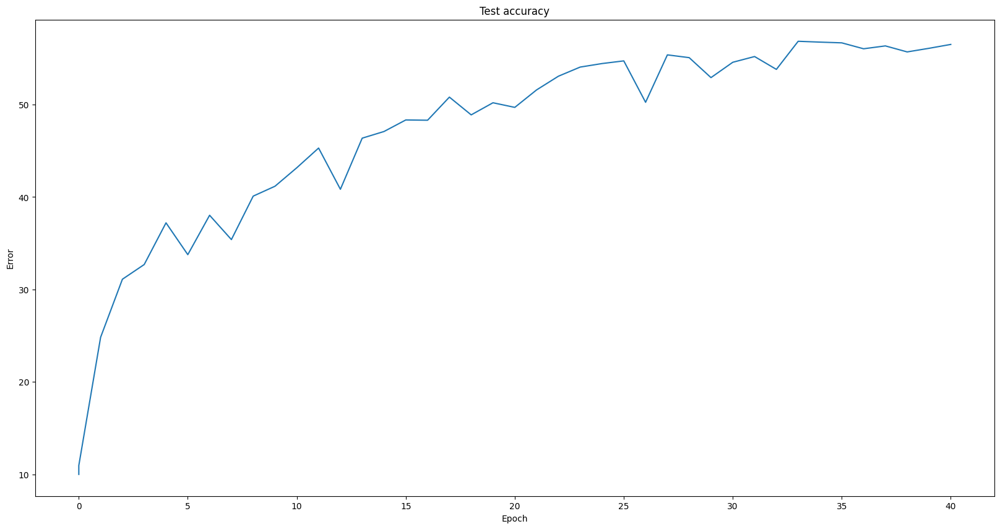

Using device cuda
num cpus: 2
Restoring:
conv1.weight -> 	torch.Size([8, 3, 3, 3]) = 0MB
conv1.bias -> 	torch.Size([8]) = 0MB
conv2.weight -> 	torch.Size([16, 8, 3, 3]) = 0MB
conv2.bias -> 	torch.Size([16]) = 0MB
conv3.weight -> 	torch.Size([32, 16, 3, 3]) = 0MB
conv3.bias -> 	torch.Size([32]) = 0MB
conv4.weight -> 	torch.Size([64, 32, 3, 3]) = 0MB
conv4.bias -> 	torch.Size([64]) = 0MB
conv5.weight -> 	torch.Size([128, 64, 3, 3]) = 0MB
conv5.bias -> 	torch.Size([128]) = 0MB
fc1.weight -> 	torch.Size([10, 128]) = 0MB
fc1.bias -> 	torch.Size([10]) = 0MB

Restored all variables
No new variables
Restored /gdrive/My Drive/colab_files/hw1/cifar/logs/convo_2-0.2/040.pt

Test set: Average loss: 1.2326, Accuracy: 5651/10000 (57%)

Sat May 13 00:00:56 2023 Train Epoch: 40 [0/50000 (0%)]	Loss: 1.226840

Test set: Average loss: 1.0979, Accuracy: 6103/10000 (61%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/convo_2-0.2/040.pt

Sat May 13 00:01:16 2023 Train Epoch: 41 [0/50000 (0%)]	Loss: 1.18

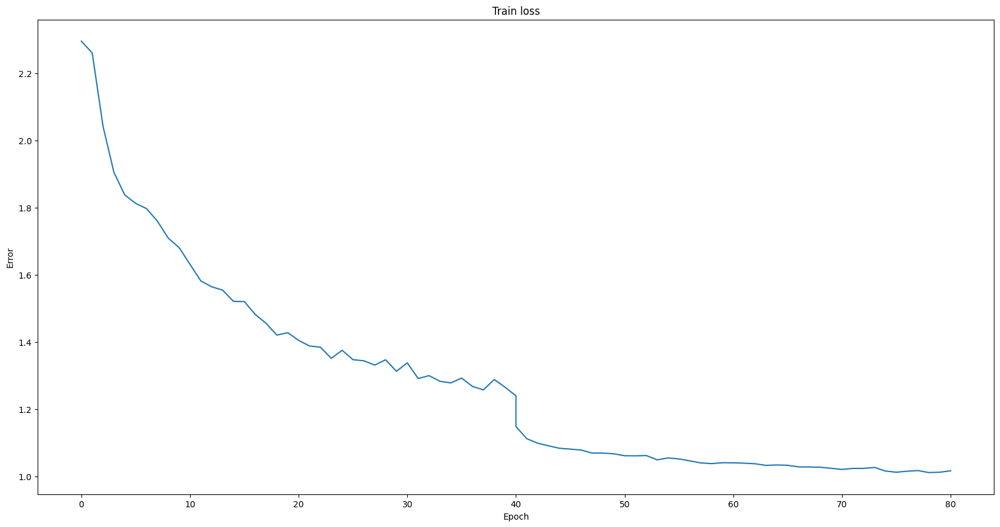

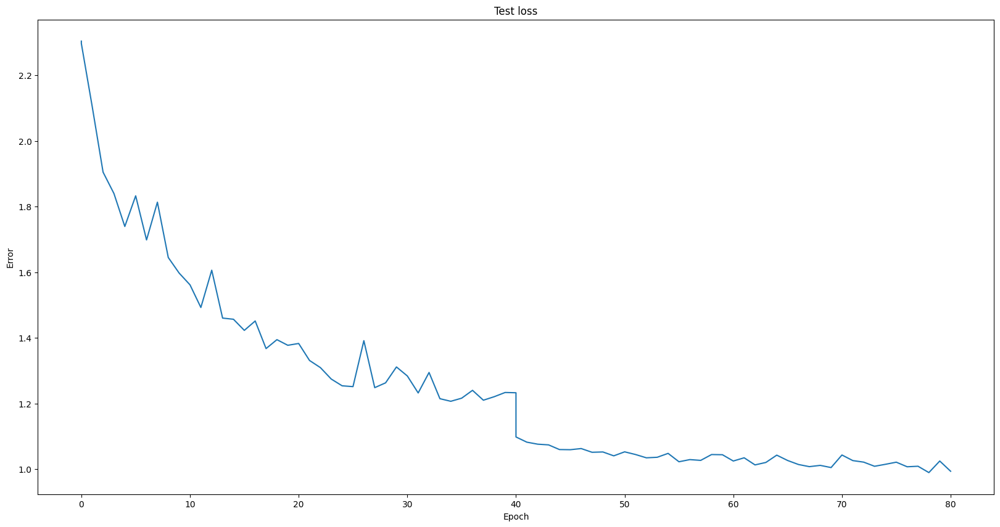

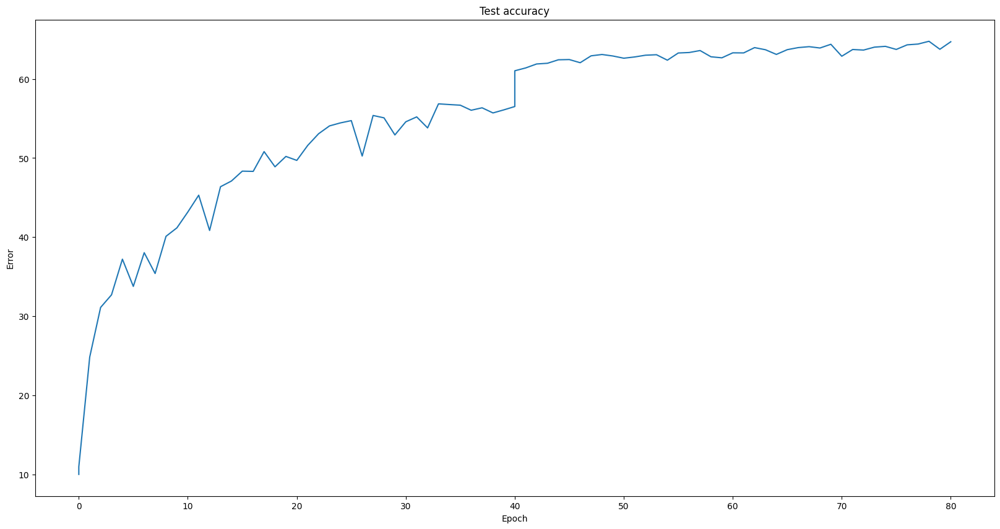

In [ ]:
run_model("convo_2", ConvoPoolNet(), 2, epochs=40, eta=0.1, momentum=0.9, decay=0.0001)
run_model("convo_2", ConvoPoolNet(), 2, epochs=80, eta=0.01, momentum=0.9, decay=0.0001)

Using device cuda
num cpus: 2
Restoring:
conv1.weight -> 	torch.Size([8, 3, 3, 3]) = 0MB
conv1.bias -> 	torch.Size([8]) = 0MB
conv2.weight -> 	torch.Size([16, 8, 3, 3]) = 0MB
conv2.bias -> 	torch.Size([16]) = 0MB
conv3.weight -> 	torch.Size([32, 16, 3, 3]) = 0MB
conv3.bias -> 	torch.Size([32]) = 0MB
conv4.weight -> 	torch.Size([64, 32, 3, 3]) = 0MB
conv4.bias -> 	torch.Size([64]) = 0MB
conv5.weight -> 	torch.Size([128, 64, 3, 3]) = 0MB
conv5.bias -> 	torch.Size([128]) = 0MB
fc1.weight -> 	torch.Size([10, 128]) = 0MB
fc1.bias -> 	torch.Size([10]) = 0MB

Restored all variables
No new variables
Restored /gdrive/My Drive/colab_files/hw1/cifar/logs/convo_2-0.2/120.pt

Test set: Average loss: 0.9713, Accuracy: 6548/10000 (65%)

Sat May 13 01:43:04 2023 Train Epoch: 120 [0/50000 (0%)]	Loss: 1.039029
Interrupted
Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/convo_2-0.2/120.pt



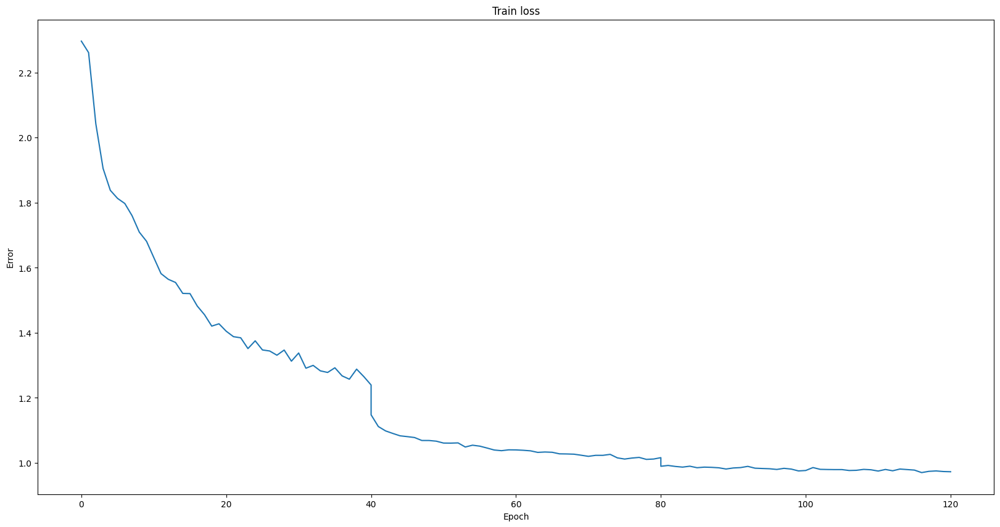

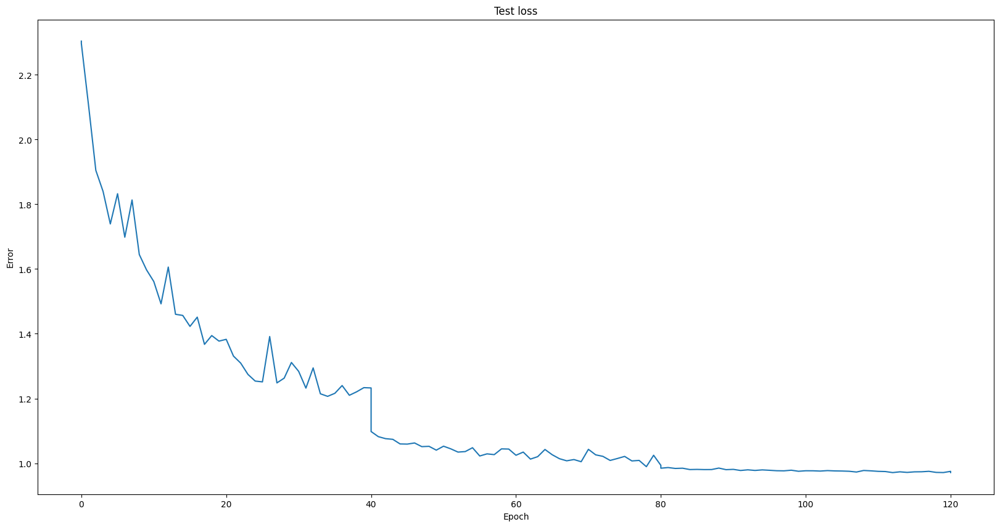

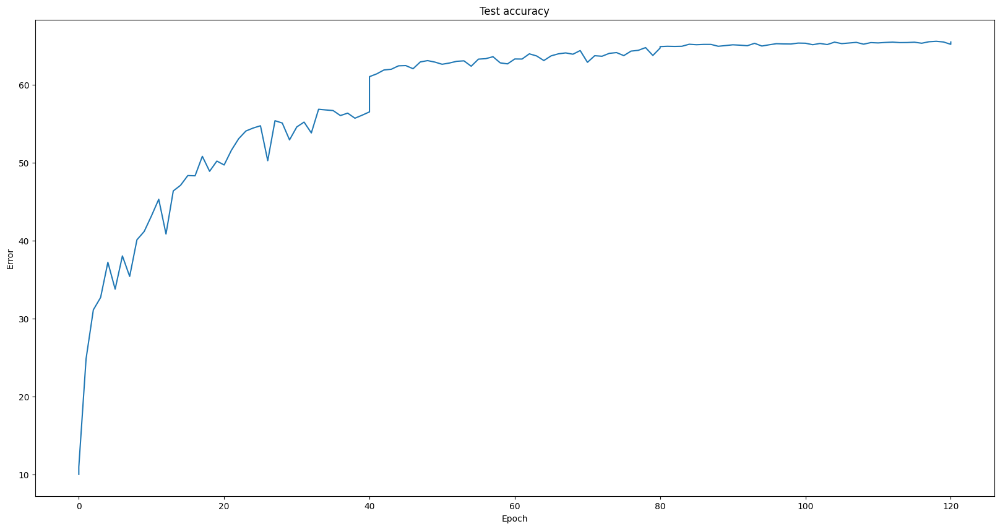

In [ ]:
run_model("convo_2", ConvoPoolNet(), 2, epochs=160, eta=0.001, momentum=0.9, decay=0.0001)

### Experiment 3
For this experiment, I will be trying the adam optimizer with the standard recommended hyperparameters

It seems to plateau around 65% within 80 epochs. The accuracy is not too bad as it is the highest so far with this increased batch size and increased data augmentations. This is the same accuracy plateau as the previous experiment. I was expecting a higher accuracy.

#### Next Steps
It seemed that just trying out different hyperparameter values and running the model for long epochs wasn't really working out as I hoped. I was recommended two papers by leslie N Smith, one about how to best tune hyperparameters and another about cyclical learing rate schedules.

Per the instructions in [1], I will be doing the LR range test to get bounds for my LR. I will then be adding a learning rate scheduler and changing my momentum to a cyclical schedule as well.


Using device cuda
num cpus: 2
Restoring:
conv1.weight -> 	torch.Size([8, 3, 3, 3]) = 0MB
conv1.bias -> 	torch.Size([8]) = 0MB
conv2.weight -> 	torch.Size([16, 8, 3, 3]) = 0MB
conv2.bias -> 	torch.Size([16]) = 0MB
conv3.weight -> 	torch.Size([32, 16, 3, 3]) = 0MB
conv3.bias -> 	torch.Size([32]) = 0MB
conv4.weight -> 	torch.Size([64, 32, 3, 3]) = 0MB
conv4.bias -> 	torch.Size([64]) = 0MB
conv5.weight -> 	torch.Size([128, 64, 3, 3]) = 0MB
conv5.bias -> 	torch.Size([128]) = 0MB
fc1.weight -> 	torch.Size([10, 128]) = 0MB
fc1.bias -> 	torch.Size([10]) = 0MB

Restored all variables
No new variables
Restored /gdrive/My Drive/colab_files/hw1/cifar/logs/adam-conv-0.3/080.pt

Test set: Average loss: 1.0697, Accuracy: 6185/10000 (62%)

Sat May 13 01:48:23 2023 Train Epoch: 80 [0/50000 (0%)]	Loss: 1.018717

Test set: Average loss: 1.0488, Accuracy: 6242/10000 (62%)

Saved /gdrive/My Drive/colab_files/hw1/cifar/logs/adam-conv-0.3/080.pt

Sat May 13 01:48:47 2023 Train Epoch: 81 [0/50000 (0%)]	Loss: 

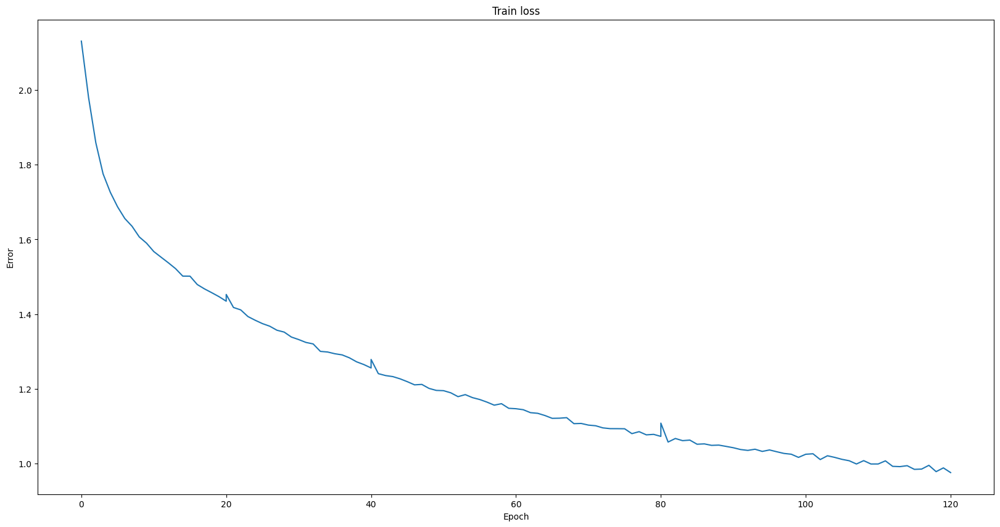

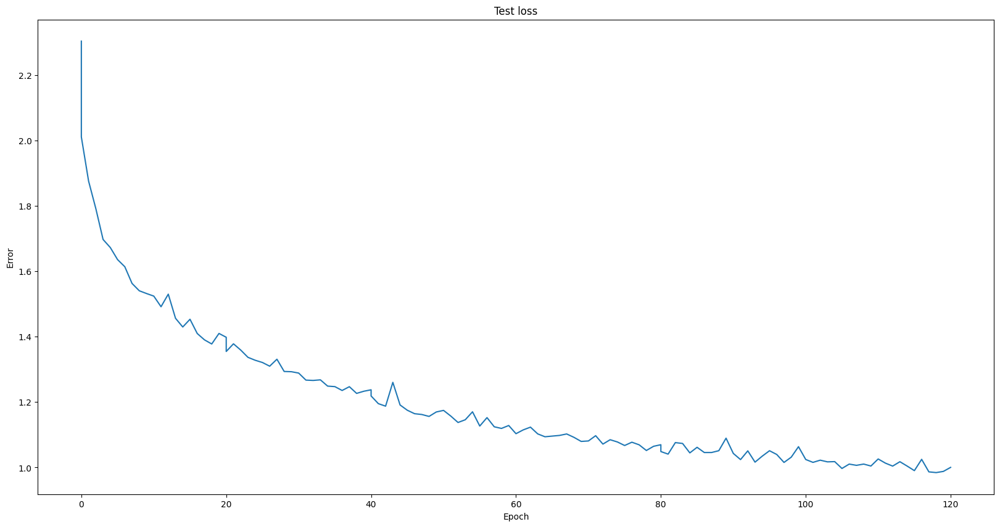

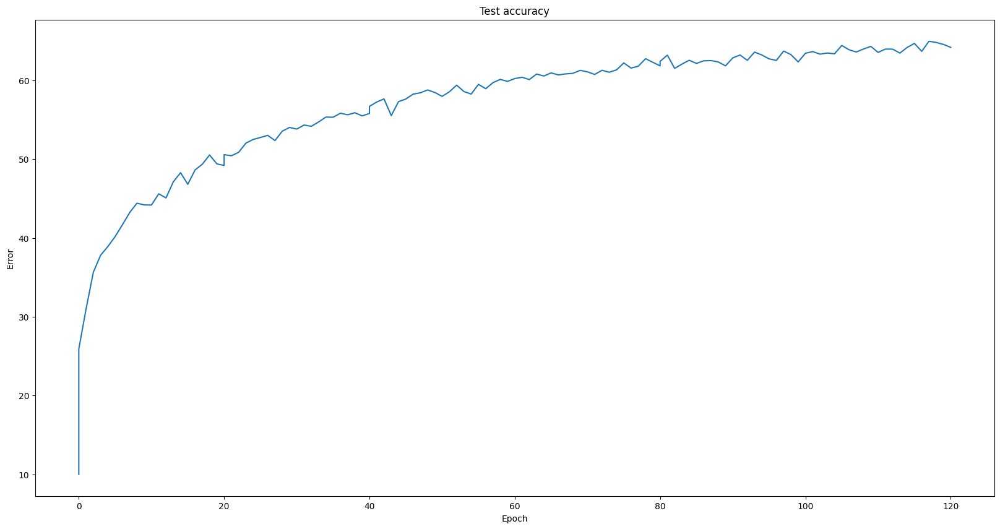

In [ ]:
run_adam_model("adam-conv", ConvoPoolNet(), 3, 120)

Using Adam as an optimizer did not really help. It reached a top accuracy below 65% which is worse than my previous 2 experiments with the ConvoPool.

## Learning Rate Range Test For ConvoPoolNet

In [8]:
def simple_test(model, device, test_loader):
    model.eval()
    test_loss = 0
    correct = 0

    with torch.no_grad():
        for batch_idx, (data, label) in enumerate(test_loader):
            data, label = data.to(device), label.to(device)
            output = model(data)
            test_loss_on = model.loss(output, label, reduction='sum').item()
            test_loss += test_loss_on
            pred = output.max(1)[1]
            correct_mask = pred.eq(label.view_as(pred))
            num_correct = correct_mask.sum().item()
            correct += num_correct

    test_loss /= len(test_loader.dataset)
    test_accuracy = 100. * correct / len(test_loader.dataset)

    return test_loss, test_accuracy

# will use run for max_iterations (that many mini-batches)
# returns the learning rates used for each iteration in the mini-batch and the loss per iteration
# RETURN: train_losses, test_losses, test_accuracies
def range_test_iteration_train(model, device, train_loader, optimizer, scheduler, max_iterations):
    model.train()
    # following lists are of (LR_VALUE, VAL)
    train_losses = []
    models_output = []
    # test_losses = []
    # test_accuracies = []
    batch_idx = 0
    for batch_idx, (data, label) in enumerate(train_loader):
        if (batch_idx < max_iterations):
          data, label = data.to(device), label.to(device)
          # we do zero_grad because PyTorch by default accumulates all of the gradients
          # we only want the gradient based on the recent mini-batch
          optimizer.zero_grad()
          output = model(data)
          loss = model.loss(output, label)
          loss_val = loss.item()
          loss.backward()
          optimizer.step()
          # getting the test loss and test accuracy once this iteration has been completed
          # test_loss, test_accuracy = test(model, device, test_loader, 100)
          curr_lr = optimizer.param_groups[0]["lr"]
          train_losses.append((curr_lr, loss_val))
          models_output.append((curr_lr, copy.deepcopy(model)))
          # test_losses.append((curr_lr, test_loss))
          # test_accuracies.append((curr_lr, test_accuracy))
          scheduler.step()
        else:
          # return train_losses, test_losses, test_accuracies
          return train_losses, models_output
    # return train_losses, test_losses, test_accuracies
    return train_losses, models_output

# will run for an entire epoch
# returns the learning rates used for each iteration in the mini-batch and the loss per iteration
# RETURN: train_losses, test_losses, test_accuracies
def range_test_epoch_train(model, device, train_loader, optimizer, scheduler):
    model.train()
    # following lists are of (LR_VALUE, VAL)
    train_losses = []
    models_output = []
    # test_losses = []
    # test_accuracies = []
    for batch_idx, (data, label) in enumerate(train_loader):
        data, label = data.to(device), label.to(device)
        # we do zero_grad because PyTorch by defalt accumulates all of the gradients
        # we only want the gradient based on the recent mini-batch
        optimizer.zero_grad()
        output = model(data)
        loss = model.loss(output, label)
        loss_val = loss.item()
        loss.backward()
        optimizer.step()
        # getting the test loss and test accuracy once this iteration has been completed
        # test_loss, test_accuracy = test(model, device, test_loader, 100)
        curr_lr = optimizer.param_groups[0]["lr"]
        models_output.append((curr_lr, copy.deepcopy(model)))
        train_losses.append((curr_lr, loss_val))
        # test_losses.append((curr_lr, test_loss))
        # test_accuracies.append((curr_lr, test_accuracy))
        scheduler.step()
    # return train_losses, test_losses, test_accuracies
    return train_losses, models_output
  
def run_range_test(net, batch_size, max_iterations, start_lr=0.001, end_lr=0.3, weight_decay=0, max_momentum=0):
  # for future, use normal batch size
  # have dataloader keep giving you random batches of data of size batch_size
  # doesnt need to give you entire dataset
  MAX_ITERATIONS = max_iterations
  DATASET_LENGTH = len(data_train)
  BATCH_SIZE = batch_size
  TEST_BATCH_SIZE = 10
  # NUMBER OF ITERATIONS PER EPOCH
  EPOCH_SIZE = DATASET_LENGTH / BATCH_SIZE
  EPOCHS = math.floor(MAX_ITERATIONS / EPOCH_SIZE)
  # MAX_ITERATIONS = (DATASET_LENGTH / BATCH_SIZE) * EPOCHS
  REMAINING_ITERATIONS = int(MAX_ITERATIONS - (EPOCHS * EPOCH_SIZE))
  START_LEARNING_RATE = start_lr
  WEIGHT_DECAY = weight_decay
  USE_CUDA = True
  SEED = 0
  PRINT_INTERVAL = 100

  # Now the actual training code
  use_cuda = USE_CUDA and torch.cuda.is_available()

  #torch.manual_seed(SEED)

  device = torch.device("cuda" if use_cuda else "cpu")
  print('Using device', device)
  import multiprocessing
  print('num cpus:', multiprocessing.cpu_count())

  kwargs = {'num_workers': multiprocessing.cpu_count(),
            'pin_memory': True} if use_cuda else {}

  # kwargs = {}
  class_names = ['plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

  train_loader = torch.utils.data.DataLoader(data_train, batch_size=BATCH_SIZE,
                                            shuffle=True, **kwargs)
  # test_loader = torch.utils.data.DataLoader(data_test, batch_size=TEST_BATCH_SIZE,
  #                                           shuffle=False, **{})

  model = net.to(device)
  optimizer = optim.SGD(model.parameters(), lr=START_LEARNING_RATE, momentum=max_momentum, weight_decay=WEIGHT_DECAY)
  scheduler = optim.lr_scheduler.CyclicLR(optimizer, base_lr=START_LEARNING_RATE, max_lr=end_lr, step_size_up=MAX_ITERATIONS, mode="triangular", cycle_momentum=True, base_momentum=0.8, max_momentum=max_momentum)

  train_losses_by_lr = []
  # models are of type (LR_VALUE, MODEL)
  models_by_lr = []
  # test_losses_by_lr = []
  # test_accuracies_by_lr = []

  try:
      for epoch in range(EPOCHS):
          # curr_train_losses_by_lr, curr_test_losses_by_lr, curr_test_accuracies_by_lr = range_test_epoch_train(model, device, train_loader, test_loader, optimizer, scheduler)
          curr_train_losses_by_lr, models = range_test_epoch_train(model, device, train_loader, optimizer, scheduler)
          train_losses_by_lr = train_losses_by_lr + curr_train_losses_by_lr
          models_by_lr = models_by_lr + models
          # test_losses_by_lr = test_losses_by_lr + curr_test_losses_by_lr
          # test_accuracies_by_lr = test_accuracies_by_lr + curr_test_accuracies_by_lr
      # curr_train_losses_by_lr, curr_test_losses_by_lr, curr_test_accuracies_by_lr = range_test_iteration_train(model, device, train_loader, test_loader, optimizer, scheduler, REMAINING_ITERATIONS)
      curr_train_losses_by_lr, models = range_test_iteration_train(model, device, train_loader, optimizer, scheduler, REMAINING_ITERATIONS)
      train_losses_by_lr = train_losses_by_lr + curr_train_losses_by_lr
      models_by_lr = models_by_lr + models
      # test_losses_by_lr = test_losses_by_lr + curr_test_losses_by_lr
      # test_accuracies_by_lr = test_accuracies_by_lr + curr_test_accuracies_by_lr


  except KeyboardInterrupt as ke:
      print('Interrupted')
  except:
      import traceback
      traceback.print_exc()
  finally:
      # lr, val = zip(*losses_by_lr)
      # pt_util.plot(lr, val, 'Train Loss by LR', 'LR', 'Error')
      # return train_losses_by_lr, test_losses_by_lr, test_accuracies_by_lr
      return train_losses_by_lr, models_by_lr

# Goes through models generated and computes the test loss and accuracy for them
# Only computes through given range
def compute_test_loss(models_for_run, device, test_loader, idxs):
  computed_models = []
  for x in tqdm(idxs):
    curr_lr, model = models_for_run[1][x]
    model = model.to(device)
    curr_test_loss, curr_test_accuracy = simple_test(model, device, test_loader)
    computed_models.append((curr_lr, curr_test_loss, curr_test_accuracy))
  return computed_models

In [31]:
# data_repo is the tuple that contains (lr values, test loss or test accuracy values)
def create_run_graph(data_repo, name, x_axis, y_axis, start=0, end=None):
  end = len(data_repo) if end == None else end
  test_lr, test_vals = zip(*data_repo)
  pt_util.plot(test_lr[start:end], test_vals[start:end], name, x_axis, y_axis)

In [ ]:
# <MOMENTUM_VALUE, [[(TRAIN_LOSSES_FOR_RUN_0, MODELS_FOR_RUN_0)], [(TRAIN_LOSSES_FOR_RUN_1, MODELS_FOR_RUN_1)]]>
# keys will only be the momentum values we are trying to test
# values will be a list of tuples, each tuple represents a run, containing the train_losses and the list of models for that run
NUM_RUNS = 4

In [ ]:
momentum_97_runs = load_data("/MOMENTUM_TRAIN_LOSS_97.dat")

In [ ]:
momentum_95_runs = load_data("/MOMENTUM_TRAIN_LOSS_95.dat")

In [ ]:
momentum_90_runs = load_data("/MOMENTUM_TRAIN_LOSS_90.dat")

In [11]:
def get_classification_run_name(run, val):
  return "MOMENTUM_TEST_LOSS_TEST_ACCURACY_RUN_" + str(run) + "_VAL_" + str(val) + ".dat"

In [29]:
# returns the train loss runs in list, each item being a run
# each item is a list of tuples, (LEARNING_RATE_VALUE, TRAIN_LOSS_VALUE)
def get_train_loss_runs(val):
  file_name = "MOMENTUM_TRAIN_LOSS_" + str(val) + ".dat"
  data_repo = load_data(file_name)
  return list(map(lambda x: x[0], data_repo))

In [45]:
# data_repo: list of tuples of form (LEARNING_RATE_VALUE, VALUE)
# takes list of tuples, gets min value
def get_min_from_run(data_repo):
  return min(list(map(lambda x: x[1], data_repo)))

In [46]:
# data_repo: list of tuples of form (LEARNING_RATE_VALUE, VALUE)
# takes list of tuples, gets max value
def get_max_from_run(data_repo):
  return max(list(map(lambda x: x[1], data_repo)))

### Max Momentum of .99 Analysis

In [88]:
train_losses = [
    get_min_from_run(momentum_99_train_runs[0]),
    get_min_from_run(momentum_99_train_runs[1]),
    get_min_from_run(momentum_99_train_runs[2]),
    get_min_from_run(momentum_99_train_runs[3]),
]
test_losses = [
    get_min_from_run(momentum_99_run_0_classification_runs[0]),
    get_min_from_run(momentum_99_run_1_classification_runs[0]),
    get_min_from_run(momentum_99_run_2_classification_runs[0]),
    get_min_from_run(momentum_99_run_3_classification_runs[0]),
]
test_accuracies = [
    get_max_from_run(momentum_99_run_0_classification_runs[1]),
    get_max_from_run(momentum_99_run_1_classification_runs[1]),
    get_max_from_run(momentum_99_run_2_classification_runs[1]),
    get_max_from_run(momentum_99_run_3_classification_runs[1]),
]

# MIN TRAIN_LOSS VALUE ACROSS ALL RUNS
print(min(train_losses))
# MIN TEST_LOSS VALUE ACROSS ALL RUNS
print(min(test_losses))
# MAX TEST_ACCURACY VALUE ACROSS ALL RUNS
print(max(test_accuracies))

2.1972174644470215
2.1918462938308716
19.61


In [22]:
# SAVED DATA NAMES ARE MOMENTUM_TRAIN_LOSS_99.dat
momentum_99_train_runs = get_train_loss_runs(99)

#### Run 0 Analysis

In [35]:
momentum_99_run_0_classification_runs = load_data(get_classification_run_name(0, 99))

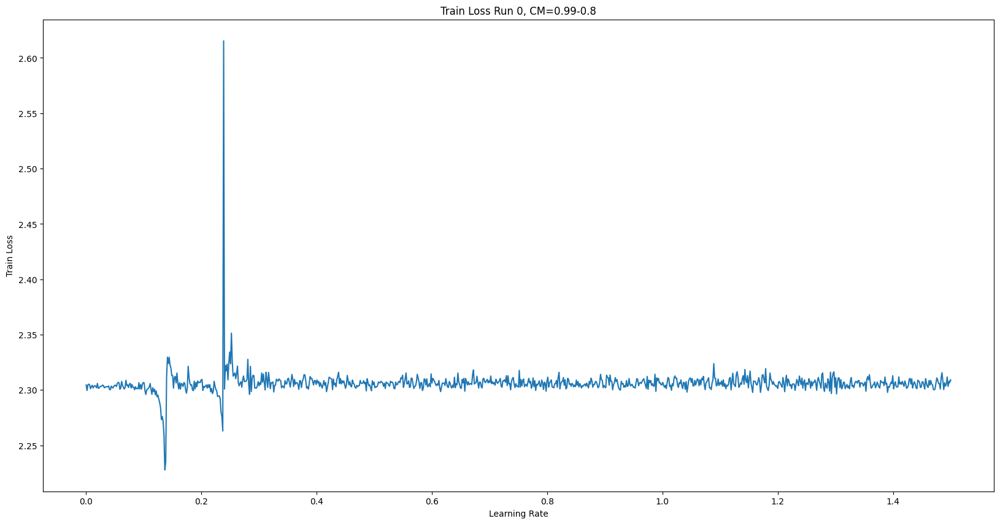

In [33]:
# Train Loss
create_run_graph(
    momentum_99_train_runs[0], 
    "Train Loss Run 0, CM=0.99-0.8",
    "Learning Rate",
    "Train Loss")

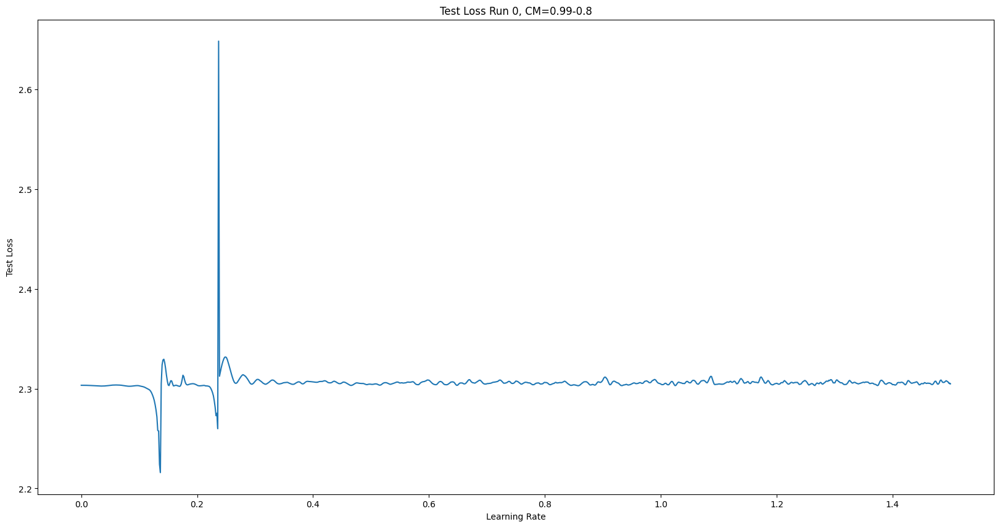

In [38]:
# Test Loss
create_run_graph(
    momentum_99_run_0_classification_runs[0], 
    "Test Loss Run 0, CM=0.99-0.8",
    "Learning Rate",
    "Test Loss")

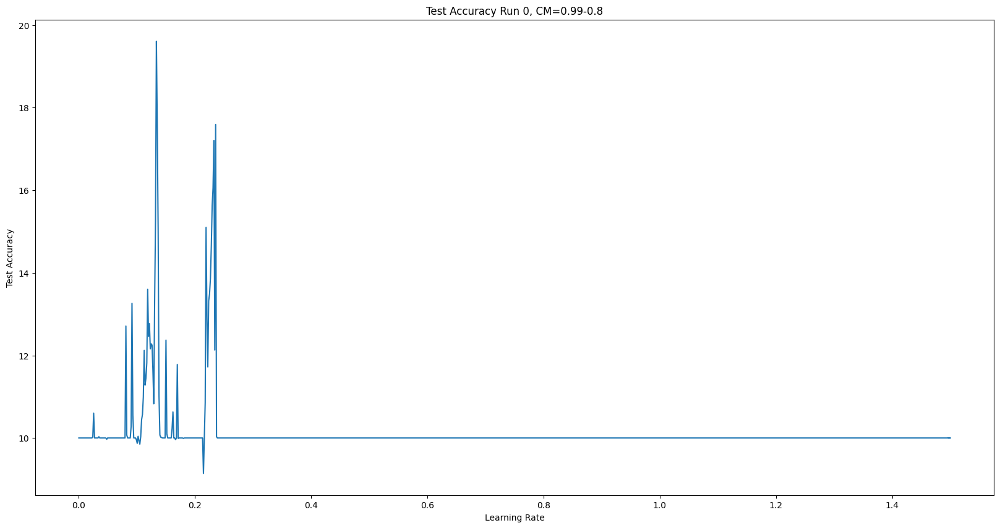

In [39]:
# Test Accuracy
create_run_graph(
    momentum_99_run_0_classification_runs[1], 
    "Test Accuracy Run 0, CM=0.99-0.8",
    "Learning Rate",
    "Test Accuracy")

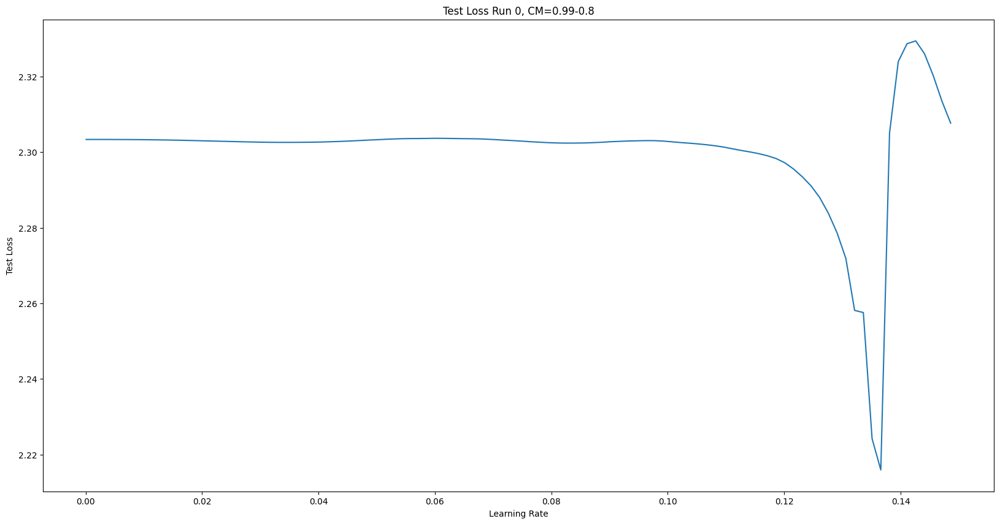

In [50]:
# Test Loss, Looking at ranges of 0.001 to 0.2
create_run_graph(
    momentum_99_run_0_classification_runs[0], 
    "Test Loss Run 0, CM=0.99-0.8",
    "Learning Rate",
    "Test Loss",
    0, 100)

In [54]:
print(momentum_99_run_0_classification_runs[0][90])
print(momentum_99_run_0_classification_runs[0][91])
print(momentum_99_run_0_classification_runs[0][92])
print(momentum_99_run_0_classification_runs[0][93])

(0.13509099999999977, 2.224176043701172)
(0.13659090000000026, 2.2159094120025635)
(0.13809080000000012, 2.3050235765457154)
(0.13959069999999996, 2.323965005302429)


In [109]:
# MIN TRAIN_LOSS_VALUE FOR RUN 0
print("MIN TRAIN_LOSS: " + str(get_min_from_run(momentum_99_train_runs[0])))
# MIN TEST_LOSS_VALUE FOR RUN 0
print("MIN_TEST_LOSS: " + str(get_min_from_run(momentum_99_run_0_classification_runs[0])))
# MAX TEST_ACCURACY_VALUE FOR RUN 0
print("MAX TEST_ACCURACY: " + str(get_max_from_run(momentum_99_run_0_classification_runs[1])))

MIN TRAIN_LOSS: 2.2278378009796143
MIN_TEST_LOSS: 2.2159094120025635
MAX TEST_ACCURACY: 19.61


For this run, it would seem a LR range of 0.1 to 0.135 would be ideal.

#### Run 1 Analysis

In [55]:
momentum_99_run_1_classification_runs = load_data(get_classification_run_name(1, 99))

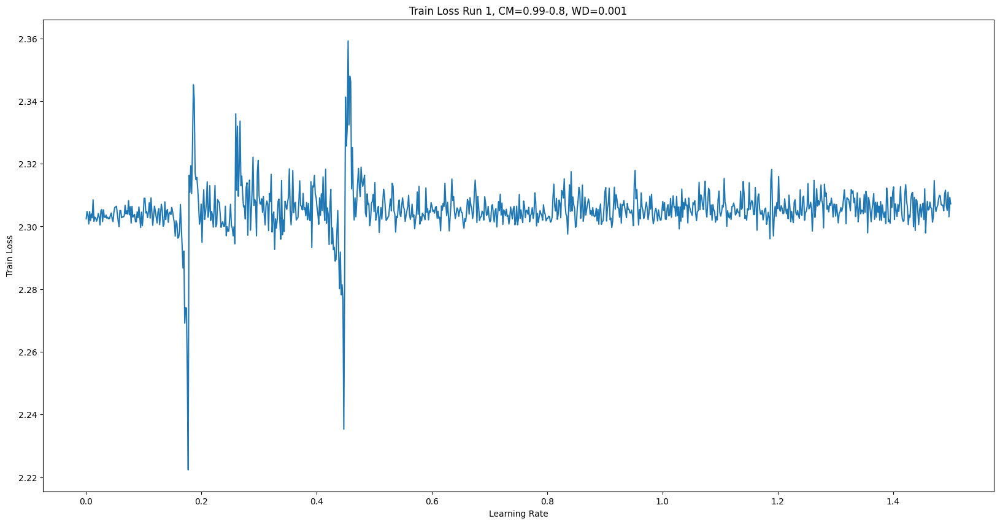

In [66]:
# Train Loss
create_run_graph(
    momentum_99_train_runs[1], 
    "Train Loss Run 1, CM=0.99-0.8, WD=0.001",
    "Learning Rate",
    "Train Loss")

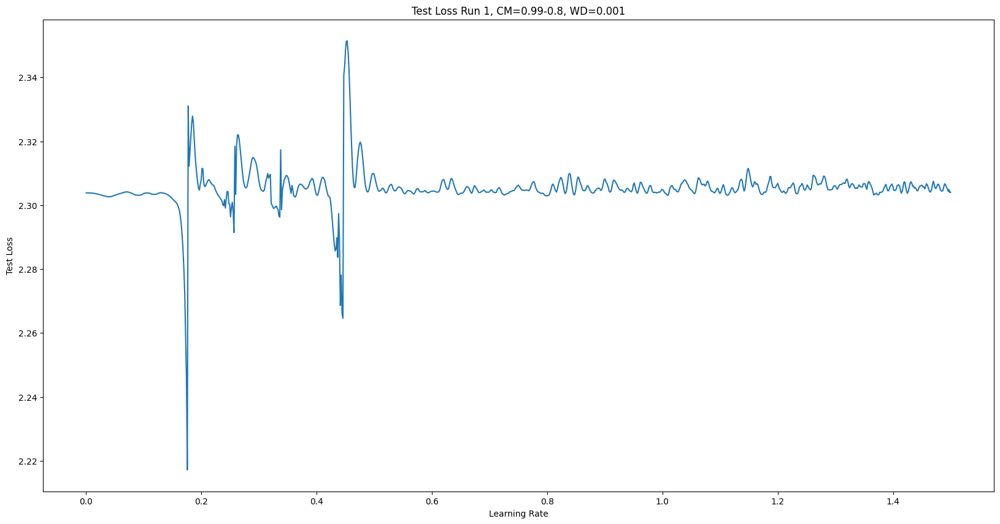

In [67]:
# Test Loss
create_run_graph(
    momentum_99_run_1_classification_runs[0], 
    "Test Loss Run 1, CM=0.99-0.8, WD=0.001",
    "Learning Rate",
    "Test Loss")

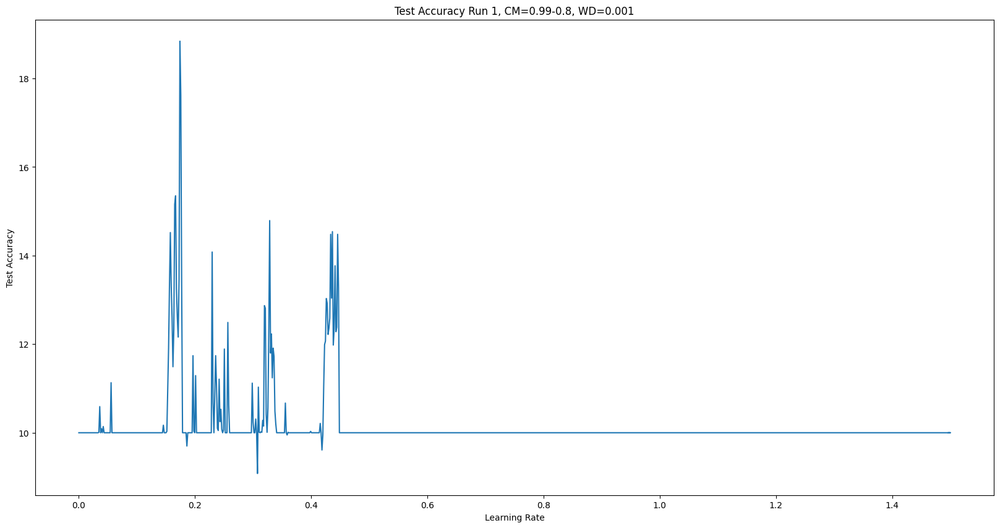

In [68]:
# Test Accuracy
create_run_graph(
    momentum_99_run_1_classification_runs[1], 
    "Test Accuracy Run 1, CM=0.99-0.8, WD=0.001",
    "Learning Rate",
    "Test Accuracy")

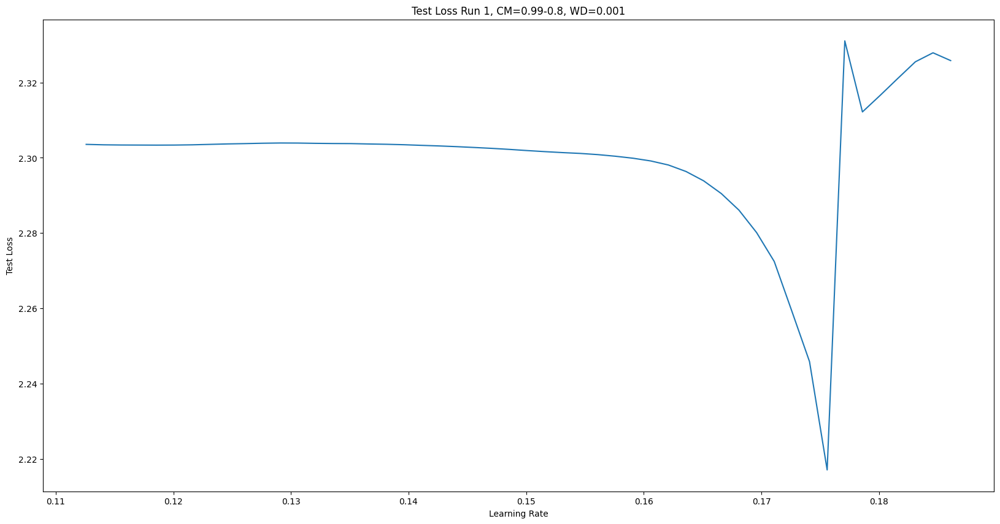

In [75]:
# Test Loss, Looking at ranges of 0.001 to 0.18
create_run_graph(
    momentum_99_run_1_classification_runs[0], 
    "Test Loss Run 1, CM=0.99-0.8, WD=0.001",
    "Learning Rate",
    "Test Loss",
    75, 125)

In [74]:
START_IDX = 115
print(momentum_99_run_1_classification_runs[0][START_IDX])
print(momentum_99_run_1_classification_runs[0][START_IDX + 1])
print(momentum_99_run_1_classification_runs[0][START_IDX + 2])
print(momentum_99_run_1_classification_runs[0][START_IDX + 3])

(0.1725885000000003, 2.259260615158081)
(0.17408840000000014, 2.2458921827316285)
(0.17558829999999997, 2.2171385873794556)
(0.1770881999999998, 2.3310357486724853)


In [95]:
# MIN TRAIN_LOSS_VALUE FOR RUN 1
print("MIN TRAIN_LOSS: " + str(get_min_from_run(momentum_99_train_runs[1])))
# MIN TEST_LOSS_VALUE FOR RUN 1
print("MIN_TEST_LOSS: " + str(get_min_from_run(momentum_99_run_1_classification_runs[0])))
# MAX TEST_ACCURACY_VALUE FOR RUN 1
print("MAX TEST_ACCURACY: " + str(get_max_from_run(momentum_99_run_1_classification_runs[1])))

MIN TRAIN_LOSS: 2.222304344177246
MIN_TEST_LOSS: 2.2171385873794556
MAX TEST_ACCURACY: 18.84


For this run, ideal LR range would be 0.125 to 0.170

#### Run 2 Analysis

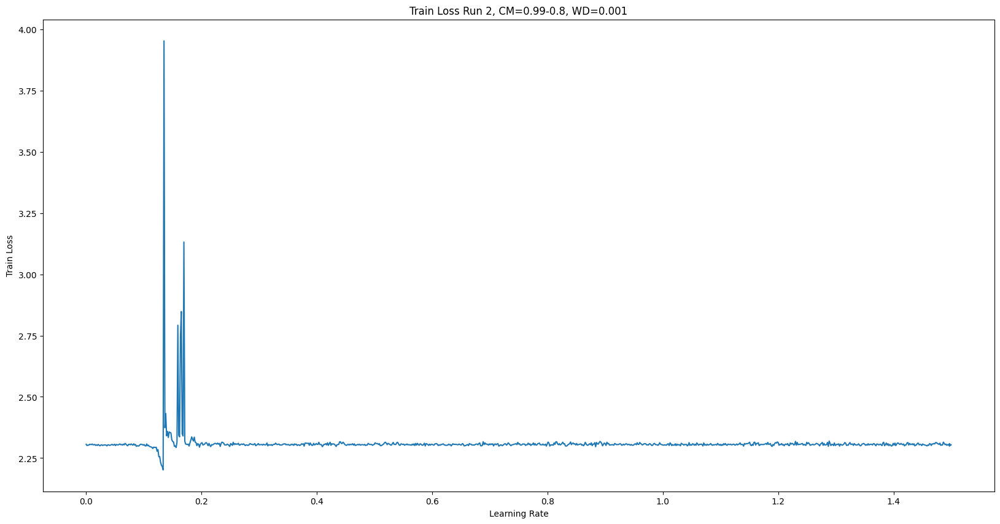

In [97]:
momentum_99_run_2_classification_runs = load_data(get_classification_run_name(2, 99))

# Train Loss
create_run_graph(
    momentum_99_train_runs[2], 
    "Train Loss Run 2, CM=0.99-0.8, WD=0.001",
    "Learning Rate",
    "Train Loss")

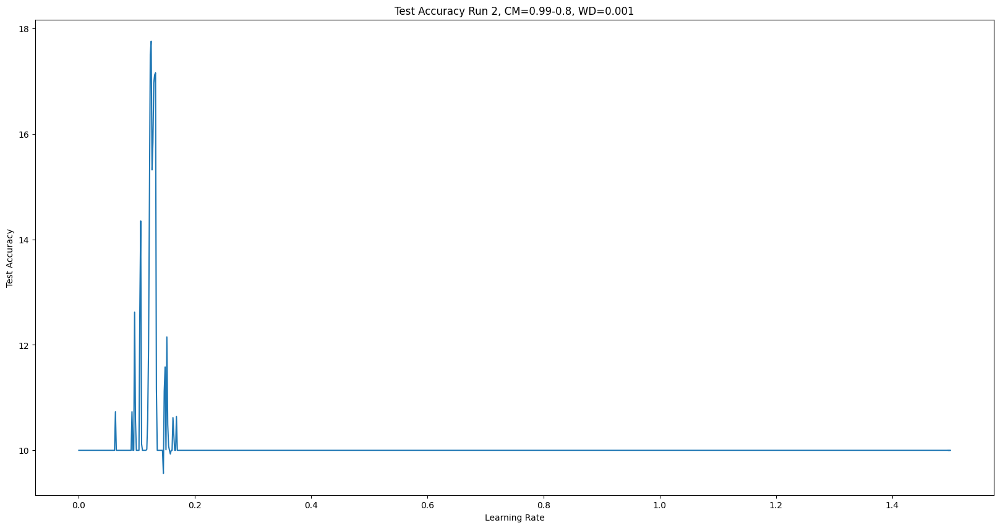

In [79]:
# Test Accuracy
create_run_graph(
    momentum_99_run_2_classification_runs[1], 
    "Test Accuracy Run 2, CM=0.99-0.8, WD=0.001",
    "Learning Rate",
    "Test Accuracy")

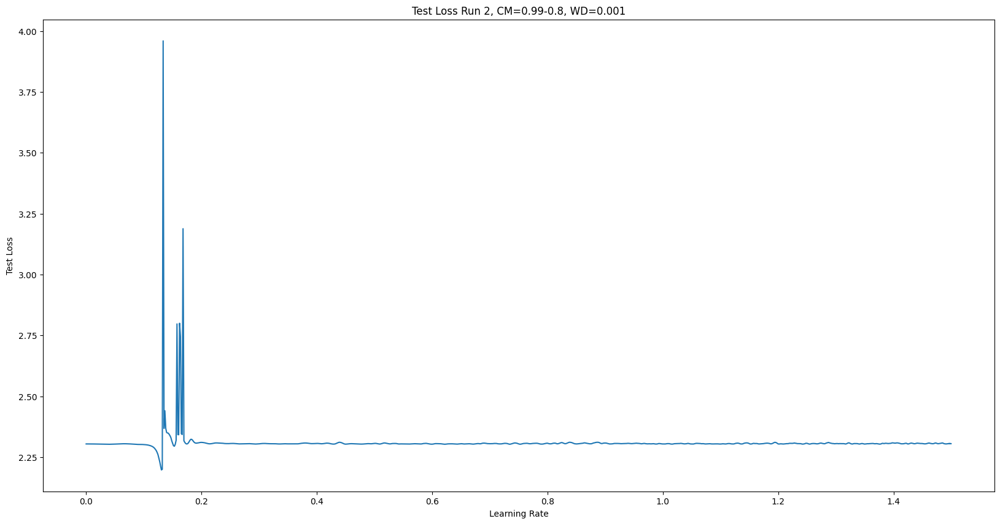

In [78]:
# Test Loss
create_run_graph(
    momentum_99_run_2_classification_runs[0], 
    "Test Loss Run 2, CM=0.99-0.8, WD=0.001",
    "Learning Rate",
    "Test Loss")

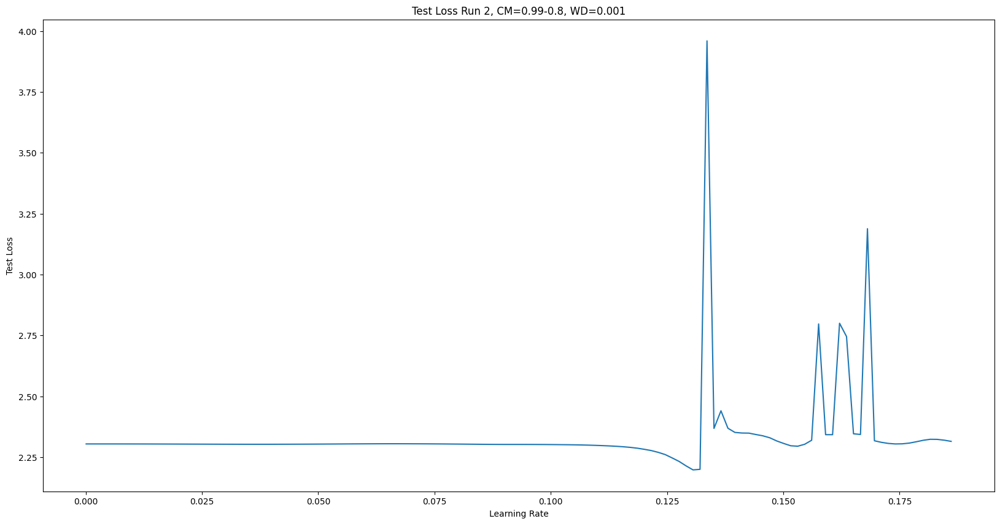

In [82]:
# Test Loss, Looking at ranges of 0.001 to 0.18
create_run_graph(
    momentum_99_run_2_classification_runs[0], 
    "Test Loss Run 2, CM=0.99-0.8, WD=0.001",
    "Learning Rate",
    "Test Loss",
    0, 125)

In [98]:
# MIN TRAIN_LOSS_VALUE FOR RUN 2
print("MIN TRAIN_LOSS: " + str(get_min_from_run(momentum_99_train_runs[2])))
# MIN TEST_LOSS_VALUE FOR RUN 2
print("MIN_TEST_LOSS: " + str(get_min_from_run(momentum_99_run_2_classification_runs[0])))
# MAX TEST_ACCURACY_VALUE FOR RUN 2
print("MAX TEST_ACCURACY: " + str(get_max_from_run(momentum_99_run_2_classification_runs[1])))

MIN TRAIN_LOSS: 2.2016305923461914
MIN_TEST_LOSS: 2.19744104347229
MAX TEST_ACCURACY: 17.76


For this run, it would seem a LR range of 0.1125 to 0.125 would be ideal

#### Run 3 Analysis

2.1972174644470215
2.1918462938308716
19.33


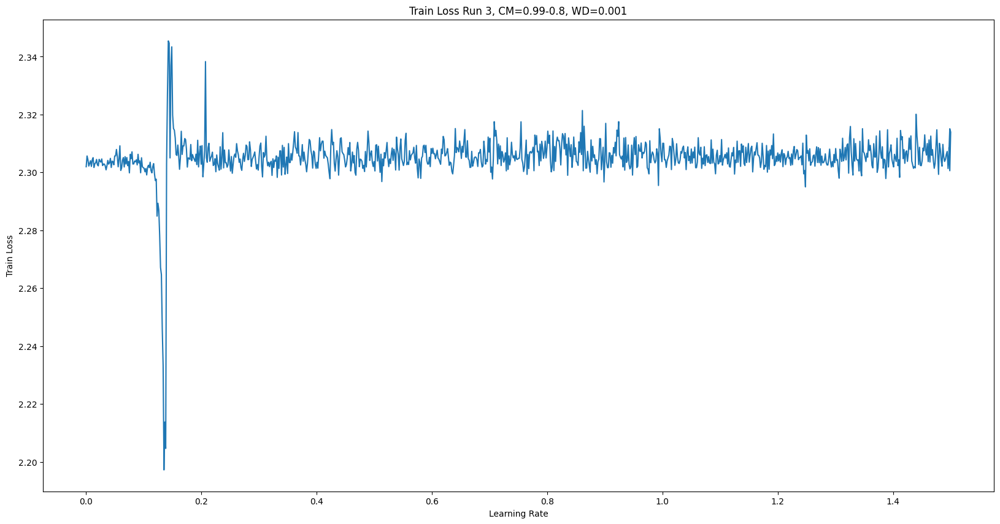

In [83]:
momentum_99_run_3_classification_runs = load_data(get_classification_run_name(3, 99))

# Train Loss
create_run_graph(
    momentum_99_train_runs[3], 
    "Train Loss Run 3, CM=0.99-0.8, WD=0.001",
    "Learning Rate",
    "Train Loss")

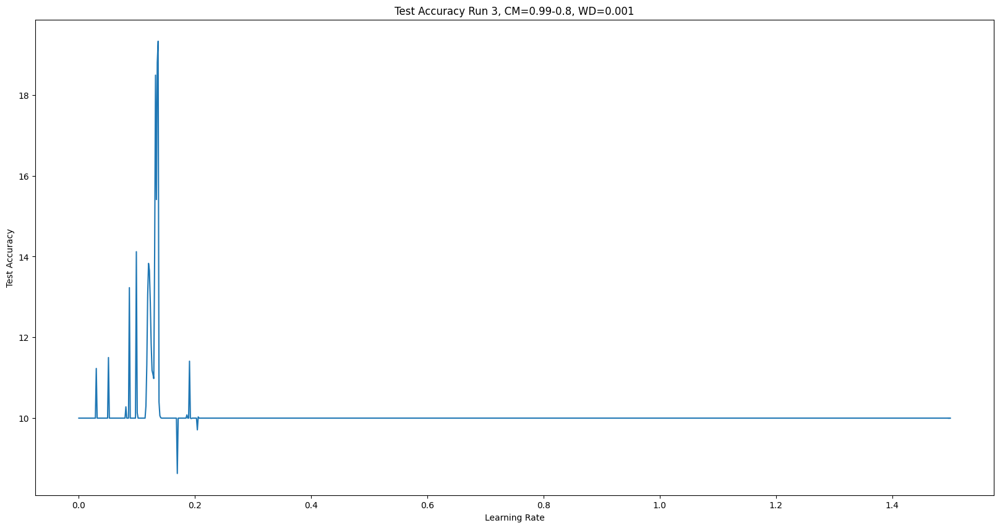

In [84]:
# Test Accuracy
create_run_graph(
    momentum_99_run_3_classification_runs[1], 
    "Test Accuracy Run 3, CM=0.99-0.8, WD=0.001",
    "Learning Rate",
    "Test Accuracy")

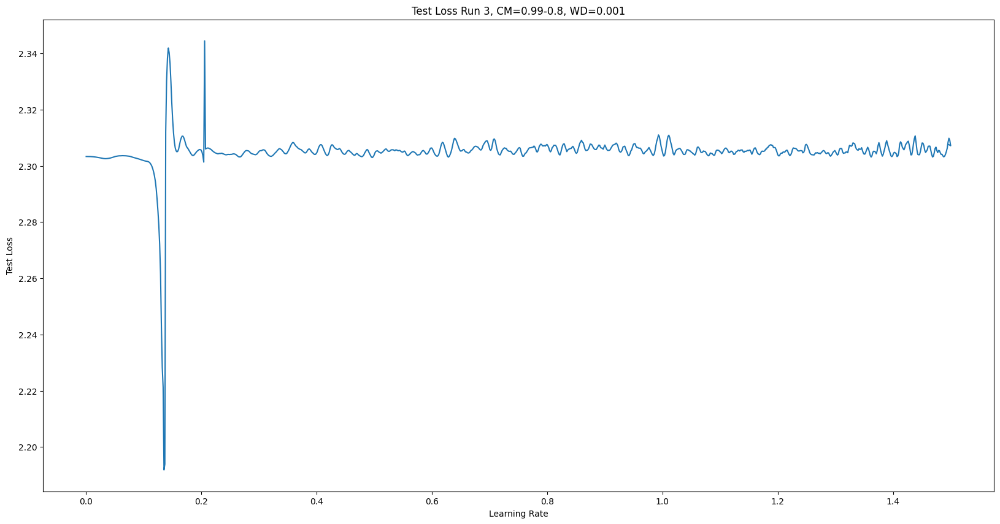

In [85]:
# Test Loss
create_run_graph(
    momentum_99_run_3_classification_runs[0], 
    "Test Loss Run 3, CM=0.99-0.8, WD=0.001",
    "Learning Rate",
    "Test Loss")

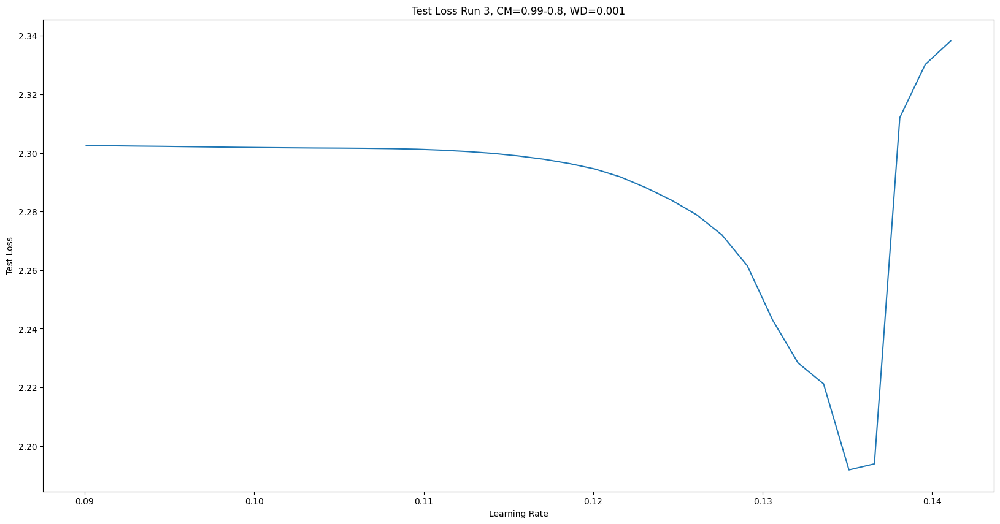

In [92]:
# Test Loss, Looking at ranges of 0.001 to 0.18
create_run_graph(
    momentum_99_run_3_classification_runs[0], 
    "Test Loss Run 3, CM=0.99-0.8, WD=0.001",
    "Learning Rate",
    "Test Loss",
    60, 95)

In [104]:
START_IDX = 85
print(momentum_99_run_3_classification_runs[0][START_IDX])
print(momentum_99_run_3_classification_runs[0][START_IDX + 1])
print(momentum_99_run_3_classification_runs[0][START_IDX + 2])
print(momentum_99_run_3_classification_runs[0][START_IDX + 3])
print(momentum_99_run_3_classification_runs[0][START_IDX + 4])
print(momentum_99_run_3_classification_runs[0][START_IDX + 5])
print(momentum_99_run_3_classification_runs[0][START_IDX + 6])
print(momentum_99_run_3_classification_runs[0][START_IDX + 7])

(0.12759149999999994, 2.2720712394714355)
(0.12909139999999977, 2.261536290359497)
(0.13059130000000027, 2.2429306844711303)
(0.1320912000000001, 2.22832376537323)
(0.13359109999999993, 2.2212270679473876)
(0.13509099999999977, 2.1918462938308716)
(0.13659090000000026, 2.193904932022095)
(0.13809080000000012, 2.312051895713806)


In [99]:
# MIN TRAIN_LOSS_VALUE FOR RUN 3
print(get_min_from_run(momentum_99_train_runs[3]))
# MIN TEST_LOSS_VALUE FOR RUN 3
print(get_min_from_run(momentum_99_run_3_classification_runs[0]))
# MAX TEST_ACCURACY_VALUE FOR RUN 3
print(get_max_from_run(momentum_99_run_3_classification_runs[1]))

2.1972174644470215
2.1918462938308716
19.33


For this run, it would seem an LR range of 0.12 - 0.132

### Max Momentum of 0.97 Analysis

In [106]:
# SAVED DATA NAMES ARE MOMENTUM_TRAIN_LOSS_99.dat
momentum_97_train_runs = get_train_loss_runs(97)

In [162]:
train_losses = [
    get_min_from_run(momentum_97_train_runs[0]),
    get_min_from_run(momentum_97_train_runs[1]),
    get_min_from_run(momentum_97_train_runs[2]),
    get_min_from_run(momentum_97_train_runs[3]),
]
test_losses = [
    get_min_from_run(momentum_97_run_0_classification_runs[0]),
    get_min_from_run(momentum_97_run_1_classification_runs[0]),
    get_min_from_run(momentum_97_run_2_classification_runs[0]),
    get_min_from_run(momentum_97_run_3_classification_runs[0]),
]
test_accuracies = [
    get_max_from_run(momentum_97_run_0_classification_runs[1]),
    get_max_from_run(momentum_97_run_1_classification_runs[1]),
    get_max_from_run(momentum_97_run_2_classification_runs[1]),
    get_max_from_run(momentum_97_run_3_classification_runs[1]),
]

# MIN TRAIN_LOSS VALUE ACROSS ALL RUNS
print("MIN TRAIN_LOSS: " + str(min(train_losses)))
# MIN TEST_LOSS VALUE ACROSS ALL RUNS
print("MIN TEST_LOSS: " + str(min(test_losses)))
# MAX TEST_ACCURACY VALUE ACROSS ALL RUNS
print("MAX TEST_ACCURACY: " + str(max(test_accuracies)))

MIN TRAIN_LOSS: 2.1897952556610107
MIN TEST_LOSS: 2.17962223739624
MAX TEST_ACCURACY: 19.64


#### Run 0 Analysis

In [108]:
momentum_97_run_0_classification_runs = load_data(get_classification_run_name(0, .97))

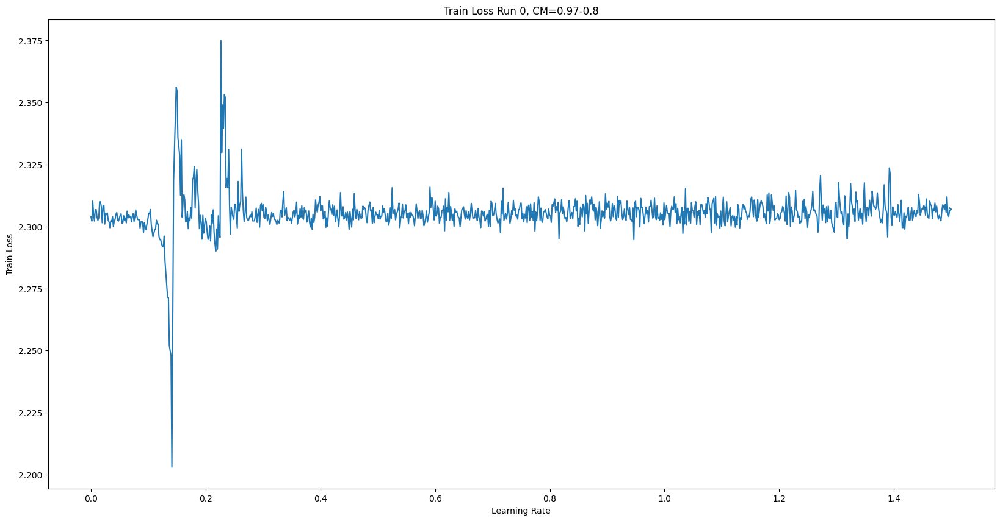

In [110]:
# Train Loss
create_run_graph(
    momentum_97_train_runs[0], 
    "Train Loss Run 0, CM=0.97-0.8",
    "Learning Rate",
    "Train Loss")

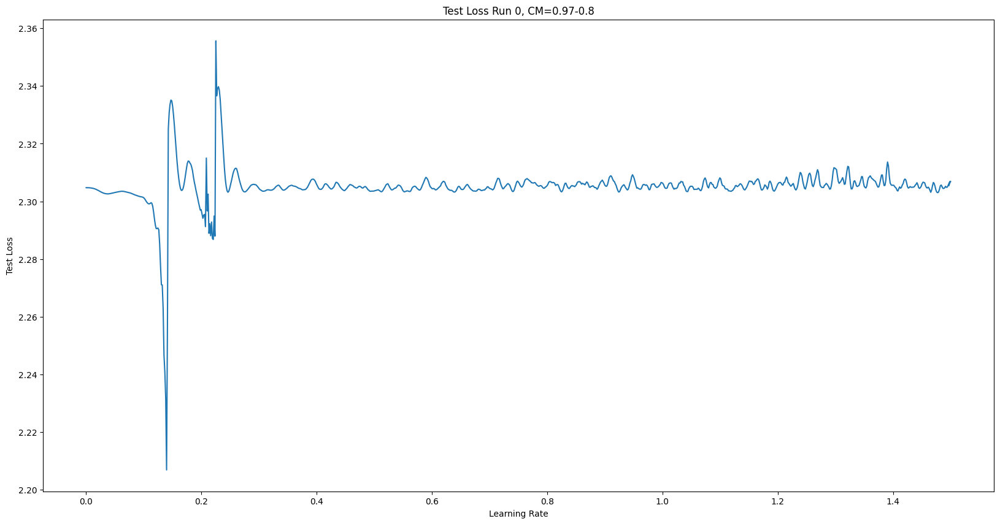

In [111]:
# Test Loss
create_run_graph(
    momentum_97_run_0_classification_runs[0], 
    "Test Loss Run 0, CM=0.97-0.8",
    "Learning Rate",
    "Test Loss")

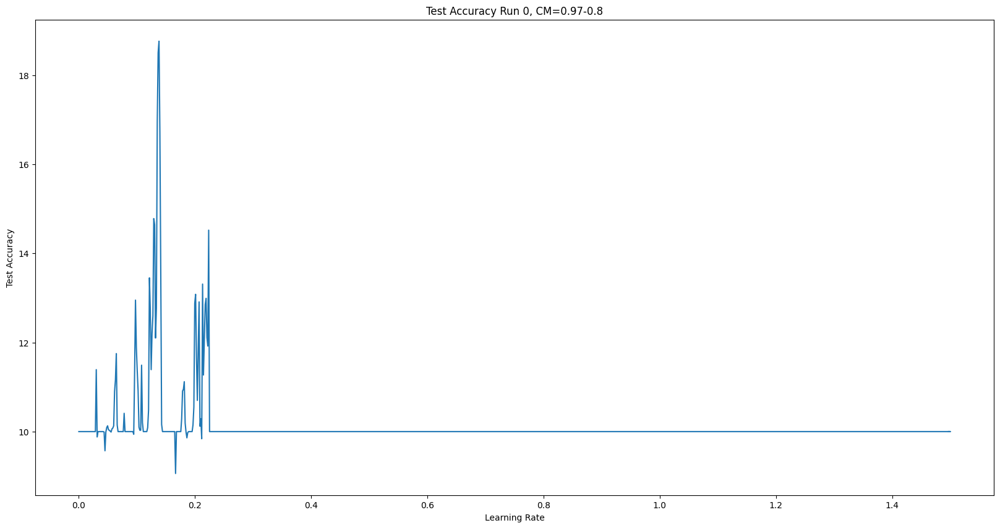

In [112]:
# Test Accuracy
create_run_graph(
    momentum_97_run_0_classification_runs[1], 
    "Test Accuracy Run 0, CM=0.97-0.8",
    "Learning Rate",
    "Test Accuracy")

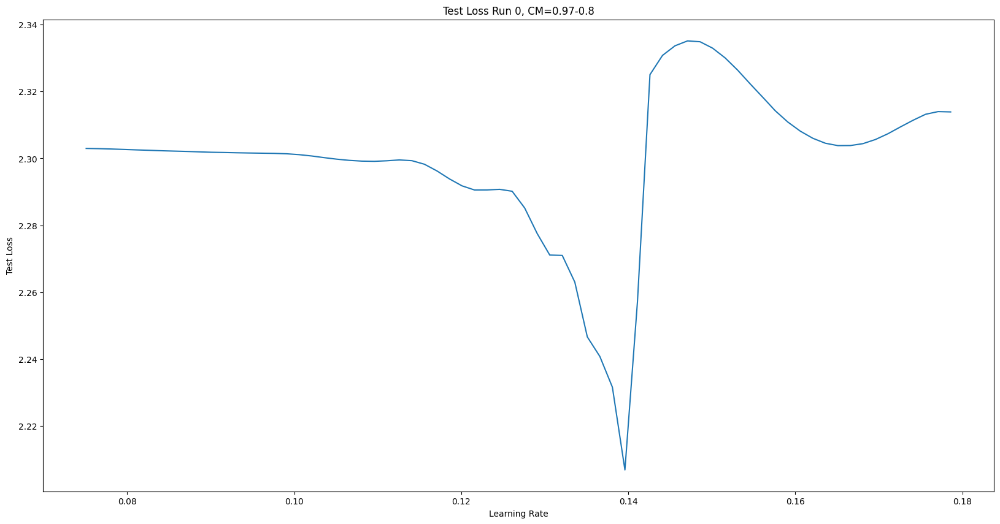

In [117]:
# Test Loss, Looking at ranges of 0.001 to 0.2
create_run_graph(
    momentum_97_run_0_classification_runs[0], 
    "Test Loss Run 0, CM=0.97-0.8",
    "Learning Rate",
    "Test Loss",
    50, 120)

In [121]:
START_IDX = 85
for x in range(10):
  print(momentum_97_run_0_classification_runs[0][START_IDX + x])  

(0.12759149999999994, 2.285167869949341)
(0.12909139999999977, 2.2775146369934083)
(0.13059130000000027, 2.2710986818313597)
(0.1320912000000001, 2.2709830141067506)
(0.13359109999999993, 2.2630169775009157)
(0.13509099999999977, 2.2466183404922484)
(0.13659090000000026, 2.240774844932556)
(0.13809080000000012, 2.231594848442078)
(0.13959069999999996, 2.2068601470947264)
(0.1410905999999998, 2.257099852180481)


In [115]:
# MIN TRAIN_LOSS_VALUE FOR RUN 0
print("MIN TRAIN_LOSS: " + str(get_min_from_run(momentum_97_train_runs[0])))
# MIN TEST_LOSS_VALUE FOR RUN 0
print("MIN_TEST_LOSS: " + str(get_min_from_run(momentum_97_run_0_classification_runs[0])))
# MAX TEST_ACCURACY_VALUE FOR RUN 0
print("MAX TEST_ACCURACY: " + str(get_max_from_run(momentum_97_run_0_classification_runs[1])))

MIN TRAIN_LOSS: 2.2029683589935303
MIN_TEST_LOSS: 2.2068601470947264
MAX TEST_ACCURACY: 18.76


It would seem a range from 0.112 - 0.138 is ideal




#### Run 1 Analysis

In [122]:
momentum_97_run_1_classification_runs = load_data(get_classification_run_name(1, .97))

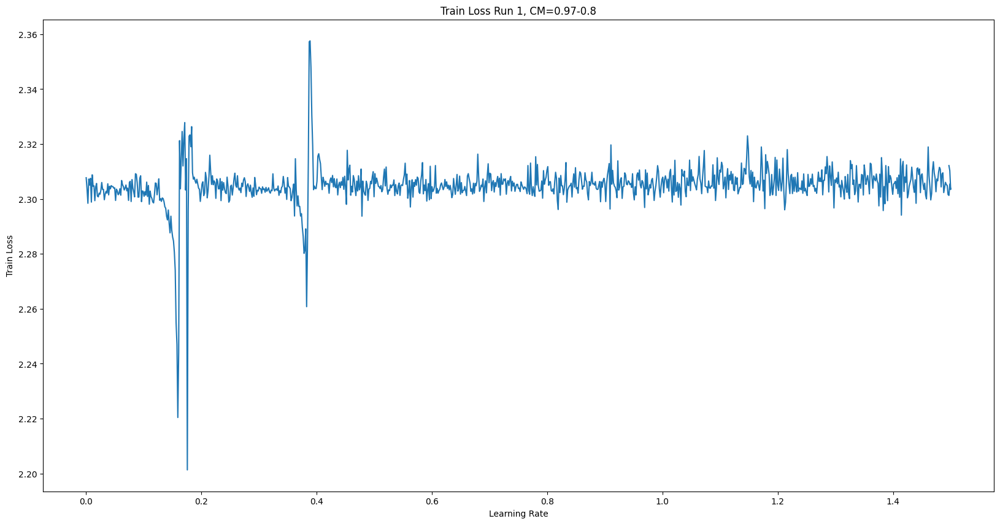

In [123]:
# Train Loss
create_run_graph(
    momentum_97_train_runs[1], 
    "Train Loss Run 1, CM=0.97-0.8",
    "Learning Rate",
    "Train Loss")

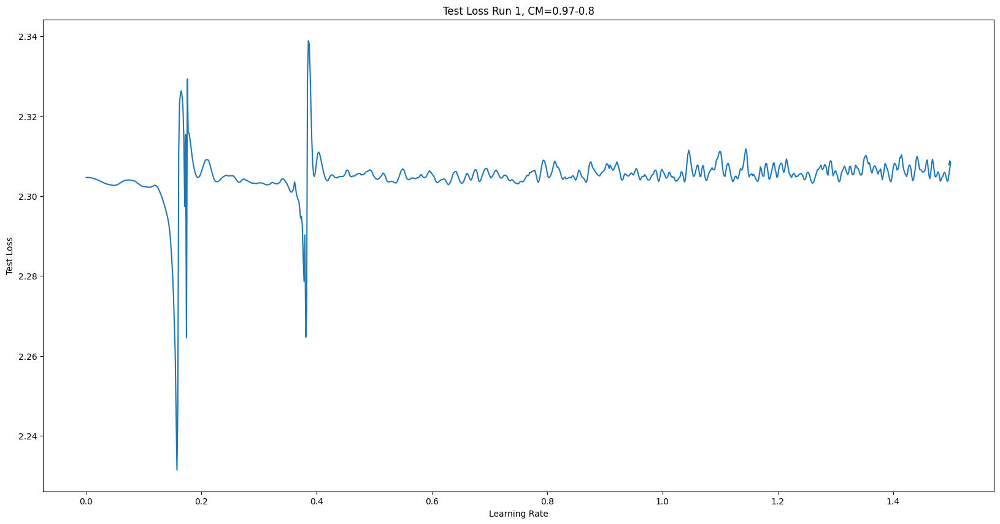

In [124]:
# Test Loss
create_run_graph(
    momentum_97_run_1_classification_runs[0], 
    "Test Loss Run 1, CM=0.97-0.8",
    "Learning Rate",
    "Test Loss")

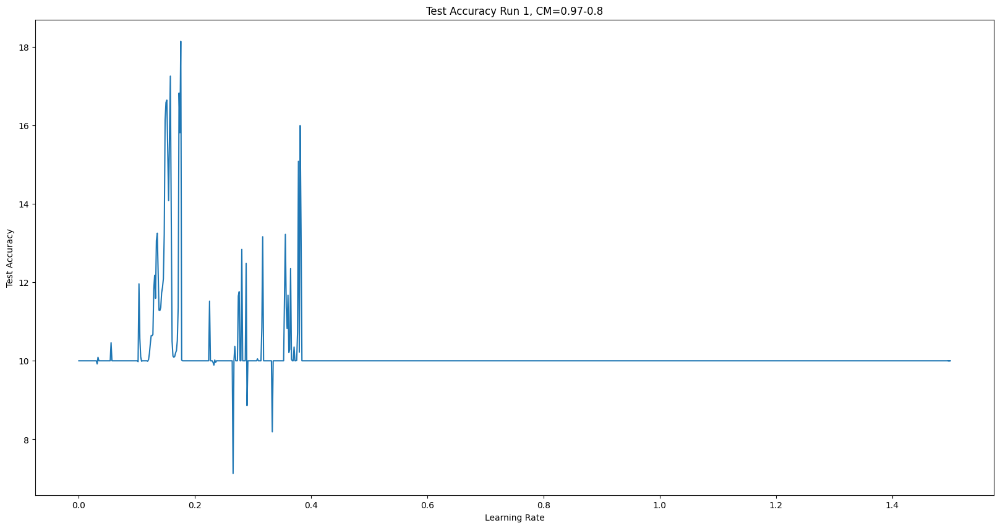

In [125]:
# Test Accuracy
create_run_graph(
    momentum_97_run_1_classification_runs[1], 
    "Test Accuracy Run 1, CM=0.97-0.8",
    "Learning Rate",
    "Test Accuracy")

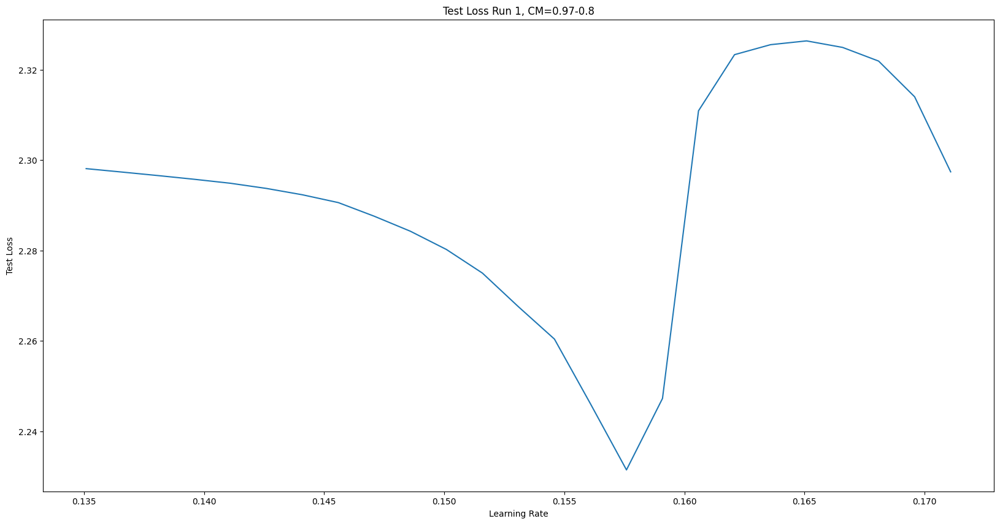

In [135]:
# Test Loss, Looking at ranges of 0.001 to 0.2
create_run_graph(
    momentum_97_run_1_classification_runs[0], 
    "Test Loss Run 1, CM=0.97-0.8",
    "Learning Rate",
    "Test Loss",
    90, 115)

In [137]:
START_IDX = 100
for x in range(10):
  print(momentum_97_run_1_classification_runs[0][START_IDX + x])

(0.1500900000000001, 2.2802128810882567)
(0.15158989999999997, 2.2749879930496215)
(0.1530897999999998, 2.2675453596115114)
(0.1545897000000003, 2.260391184425354)
(0.15608960000000013, 2.2460772327423095)
(0.15758949999999997, 2.2314563522338866)
(0.1590893999999998, 2.2472587591171265)
(0.1605893000000003, 2.310885781478882)
(0.16208920000000013, 2.32329827747345)
(0.16358909999999996, 2.325506481742859)


In [138]:
# MIN TRAIN_LOSS_VALUE FOR RUN 1
print("MIN TRAIN_LOSS: " + str(get_min_from_run(momentum_97_train_runs[1])))
# MIN TEST_LOSS_VALUE FOR RUN 1
print("MIN_TEST_LOSS: " + str(get_min_from_run(momentum_97_run_1_classification_runs[0])))
# MAX TEST_ACCURACY_VALUE FOR RUN 1
print("MAX TEST_ACCURACY: " + str(get_max_from_run(momentum_97_run_1_classification_runs[1])))

MIN TRAIN_LOSS: 2.2013161182403564
MIN_TEST_LOSS: 2.2314563522338866
MAX TEST_ACCURACY: 18.14


It would seem an LR range of 0.13 - 0.156 would be ideal

#### Run 2 Analysis

In [139]:
momentum_97_run_2_classification_runs = load_data(get_classification_run_name(2, .97))

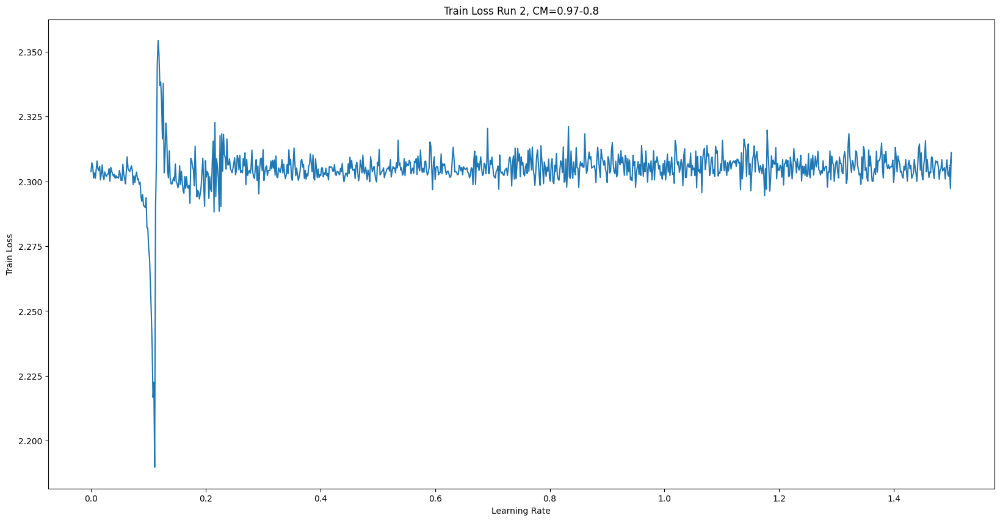

In [140]:
# Train Loss
create_run_graph(
    momentum_97_train_runs[2], 
    "Train Loss Run 2, CM=0.97-0.8",
    "Learning Rate",
    "Train Loss")

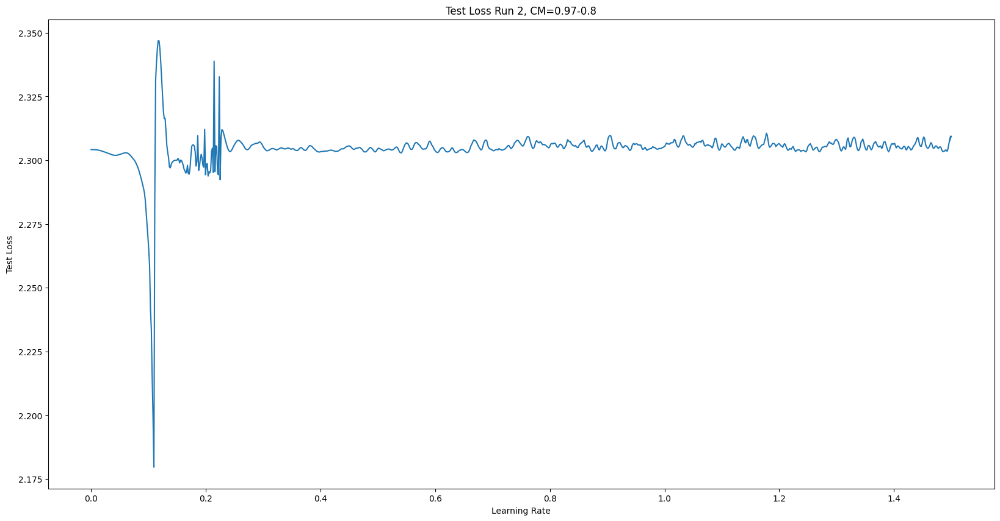

In [141]:
# Test Loss
create_run_graph(
    momentum_97_run_2_classification_runs[0], 
    "Test Loss Run 2, CM=0.97-0.8",
    "Learning Rate",
    "Test Loss")

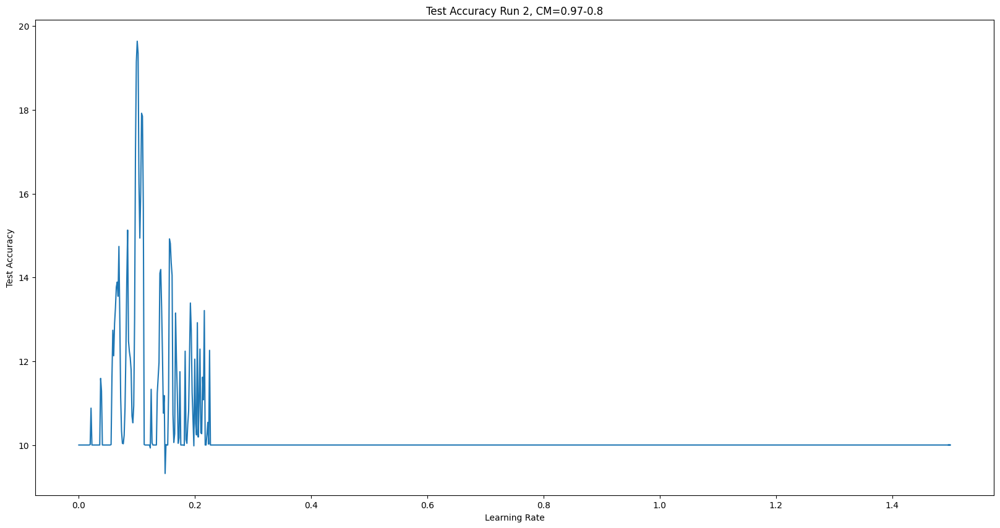

In [142]:
# Test Accuracy
create_run_graph(
    momentum_97_run_2_classification_runs[1], 
    "Test Accuracy Run 2, CM=0.97-0.8",
    "Learning Rate",
    "Test Accuracy")

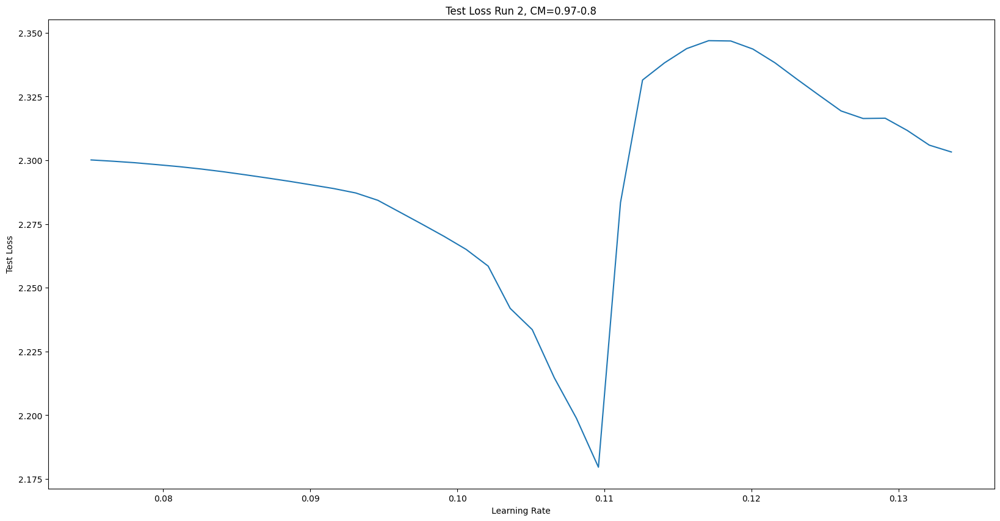

In [154]:
# Test Loss, Looking at ranges of 0.001 to 0.2
create_run_graph(
    momentum_97_run_2_classification_runs[0], 
    "Test Loss Run 2, CM=0.97-0.8",
    "Learning Rate",
    "Test Loss",
    50, 90)

In [156]:
START_IDX = 65
for x in range(20):
  print(momentum_97_run_2_classification_runs[0][START_IDX + x])

(0.09759349999999993, 2.2749558950424196)
(0.09909339999999976, 2.2701721328735354)
(0.10059330000000026, 2.2650575355529785)
(0.10209320000000009, 2.258504379463196)
(0.10359309999999992, 2.241916373252869)
(0.10509299999999977, 2.2335737648010254)
(0.10659290000000027, 2.2146845369338988)
(0.1080928000000001, 2.1988480484008788)
(0.10959269999999993, 2.17962223739624)
(0.11109259999999976, 2.2833788888931275)
(0.11259250000000028, 2.3314812927246096)
(0.11409240000000011, 2.338238607406616)
(0.11559229999999994, 2.3437973804473877)
(0.11709219999999977, 2.3469171155929565)
(0.11859210000000027, 2.3467867803573608)
(0.12009200000000012, 2.3436337392807007)
(0.12159189999999995, 2.338253558540344)
(0.12309179999999978, 2.3318058408737183)
(0.12459170000000028, 2.3255295070648194)
(0.1260916000000001, 2.319351190185547)


In [145]:
# MIN TRAIN_LOSS_VALUE FOR RUN 0
print("MIN TRAIN_LOSS: " + str(get_min_from_run(momentum_97_train_runs[2])))
# MIN TEST_LOSS_VALUE FOR RUN 0
print("MIN_TEST_LOSS: " + str(get_min_from_run(momentum_97_run_2_classification_runs[0])))
# MAX TEST_ACCURACY_VALUE FOR RUN 0
print("MAX TEST_ACCURACY: " + str(get_max_from_run(momentum_97_run_2_classification_runs[1])))

MIN TRAIN_LOSS: 2.1897952556610107
MIN_TEST_LOSS: 2.17962223739624
MAX TEST_ACCURACY: 19.64


Ideal LR Range of 0.08 - 0.105

#### Run 3 Analysis

In [146]:
momentum_97_run_3_classification_runs = load_data(get_classification_run_name(3, .97))

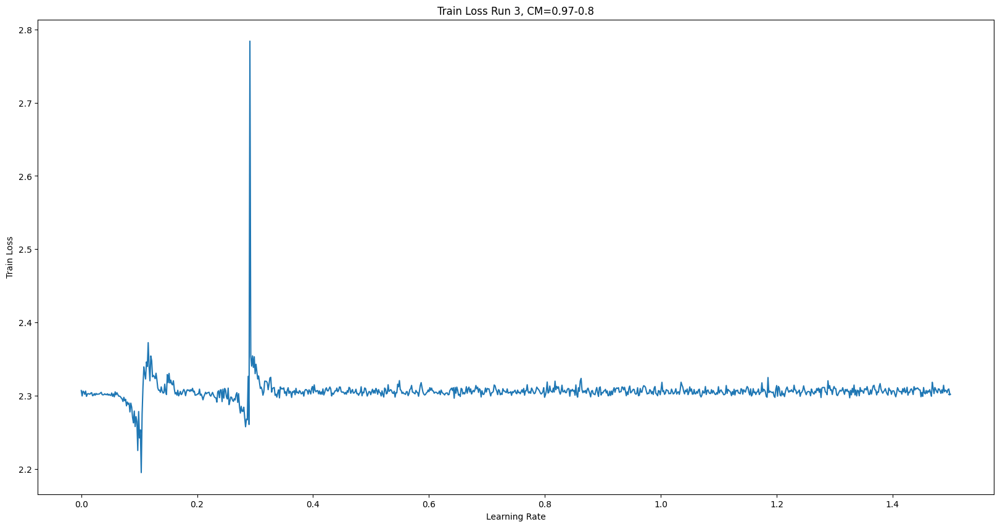

In [147]:
# Train Loss
create_run_graph(
    momentum_97_train_runs[3], 
    "Train Loss Run 3, CM=0.97-0.8",
    "Learning Rate",
    "Train Loss")

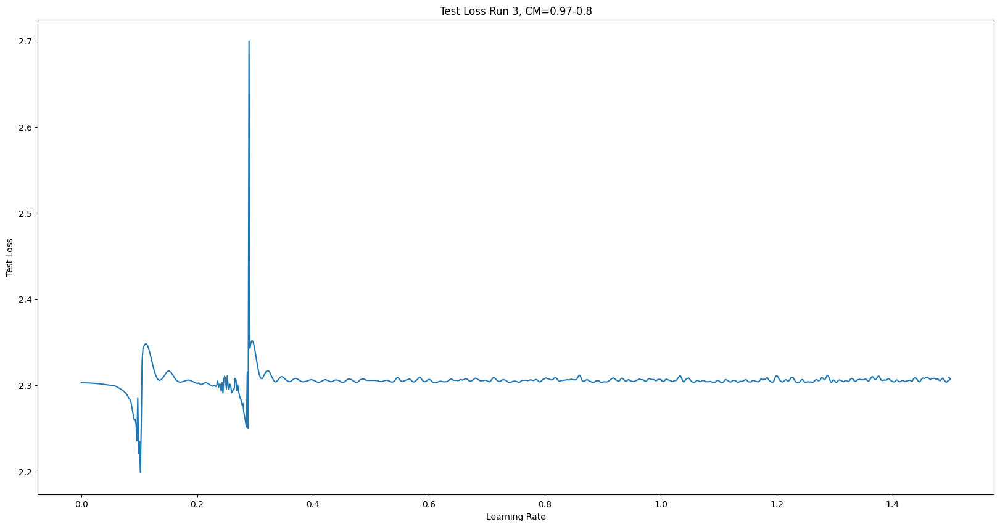

In [148]:
# Test Loss
create_run_graph(
    momentum_97_run_3_classification_runs[0], 
    "Test Loss Run 3, CM=0.97-0.8",
    "Learning Rate",
    "Test Loss")

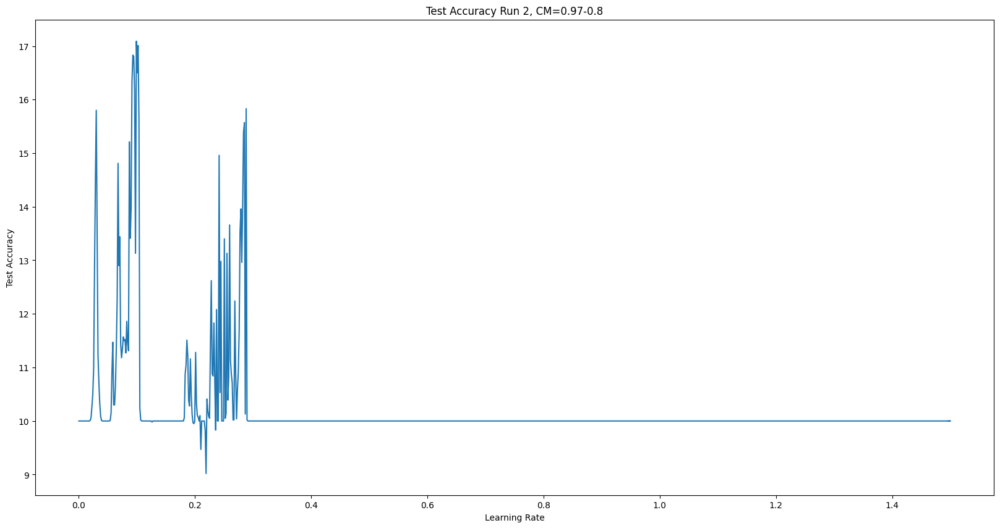

In [149]:
# Test Accuracy
create_run_graph(
    momentum_97_run_3_classification_runs[1], 
    "Test Accuracy Run 2, CM=0.97-0.8",
    "Learning Rate",
    "Test Accuracy")

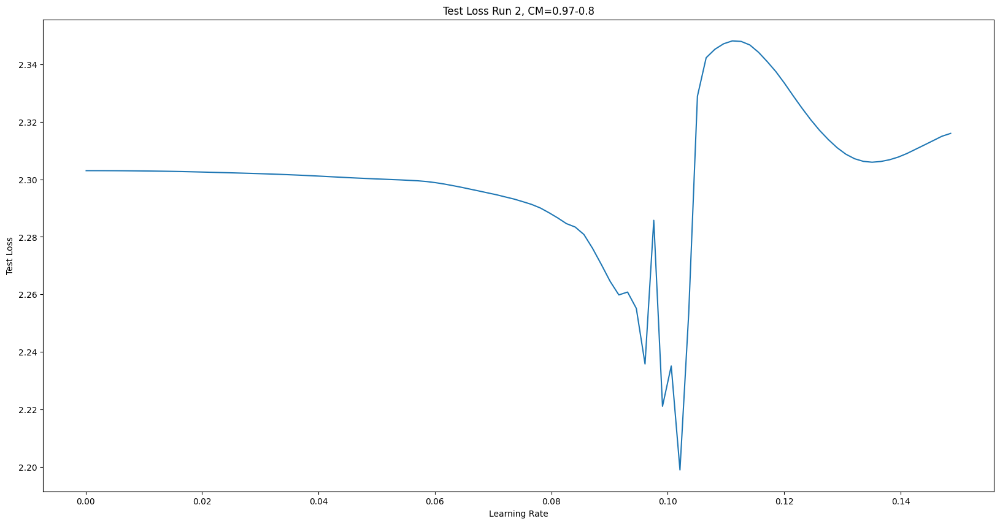

In [150]:
# Test Loss, Looking at ranges of 0.001 to 0.2
create_run_graph(
    momentum_97_run_3_classification_runs[0], 
    "Test Loss Run 2, CM=0.97-0.8",
    "Learning Rate",
    "Test Loss",
    0, 100)

In [158]:
START_IDX = 50
for x in range(20):
  print(momentum_97_run_3_classification_runs[0][START_IDX + x])

(0.07509499999999973, 2.292233013343811)
(0.07659490000000024, 2.291288417053223)
(0.07809480000000008, 2.290048582077026)
(0.07959469999999991, 2.2883873817443847)
(0.08109459999999974, 2.28657889957428)
(0.08259450000000024, 2.2845907541275023)
(0.08409440000000008, 2.283406822013855)
(0.08559429999999991, 2.2808114631652834)
(0.08709419999999975, 2.2759416410446165)
(0.08859410000000024, 2.270346231460571)
(0.09009400000000008, 2.2645202543258667)
(0.09159389999999992, 2.259787802696228)
(0.09309379999999975, 2.2607743635177613)
(0.09459370000000025, 2.255099194717407)
(0.09609360000000008, 2.235770404624939)
(0.09759349999999993, 2.285733076095581)
(0.09909339999999976, 2.22103115940094)
(0.10059330000000026, 2.2350402156829836)
(0.10209320000000009, 2.1988939125061036)
(0.10359309999999992, 2.253249242591858)


In [152]:
# MIN TRAIN_LOSS_VALUE FOR RUN 0
print("MIN TRAIN_LOSS: " + str(get_min_from_run(momentum_97_train_runs[3])))
# MIN TEST_LOSS_VALUE FOR RUN 0
print("MIN_TEST_LOSS: " + str(get_min_from_run(momentum_97_run_3_classification_runs[0])))
# MAX TEST_ACCURACY_VALUE FOR RUN 0
print("MAX TEST_ACCURACY: " + str(get_max_from_run(momentum_97_run_3_classification_runs[1])))

MIN TRAIN_LOSS: 2.1950414180755615
MIN_TEST_LOSS: 2.1988939125061036
MAX TEST_ACCURACY: 17.09


Ideal LR Range of 0.06 - 0.1

### Max Momentum of 0.95 Analysis

In [159]:
momentum_95_train_runs = get_train_loss_runs(95)

In [241]:
train_losses = [
    get_min_from_run(momentum_95_train_runs[0]),
    get_min_from_run(momentum_95_train_runs[1]),
    get_min_from_run(momentum_95_train_runs[2]),
    get_min_from_run(momentum_95_train_runs[3]),
]
test_losses = [
    get_min_from_run(momentum_95_run_0_classification_runs[0]),
    get_min_from_run(momentum_95_run_1_classification_runs[0]),
    get_min_from_run(momentum_95_run_2_classification_runs[0]),
    get_min_from_run(momentum_95_run_3_classification_runs[0]),
]
test_accuracies = [
    get_max_from_run(momentum_95_run_0_classification_runs[1]),
    get_max_from_run(momentum_95_run_1_classification_runs[1]),
    get_max_from_run(momentum_95_run_2_classification_runs[1]),
    get_max_from_run(momentum_95_run_3_classification_runs[1]),
]

# MIN TRAIN_LOSS VALUE ACROSS ALL RUNS
print("MIN TRAIN_LOSS: " + str(min(train_losses)))
# MIN TEST_LOSS VALUE ACROSS ALL RUNS
print("MIN TEST_LOSS: " + str(min(test_losses)))
# MAX TEST_ACCURACY VALUE ACROSS ALL RUNS
print("MAX TEST_ACCURACY: " + str(max(test_accuracies)))

MIN TRAIN_LOSS: 2.2000985145568848
MIN TEST_LOSS: 2.2038005096435547
MAX TEST_ACCURACY: 18.82


#### Run 0 Analysis

In [160]:
momentum_95_run_0_classification_runs = load_data(get_classification_run_name(0, .95))

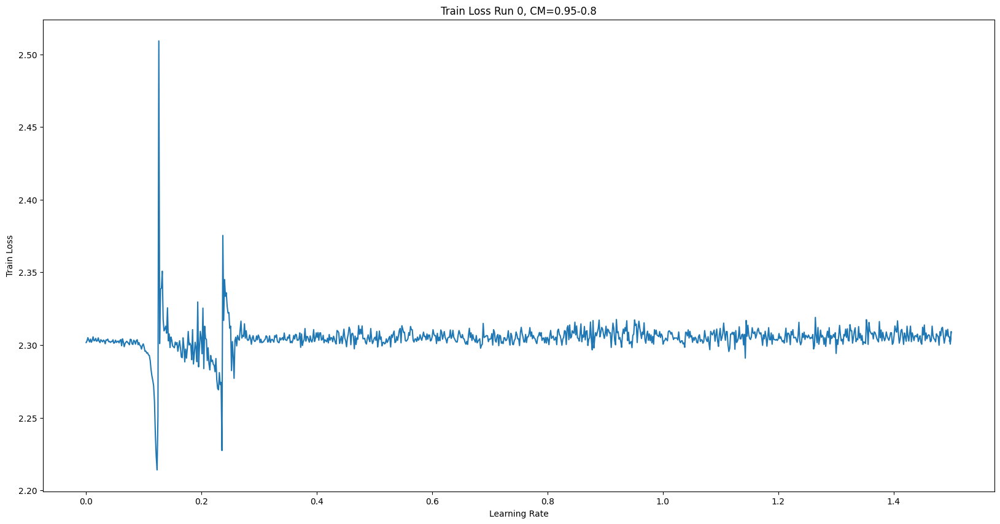

In [163]:
# Train Loss
create_run_graph(
    momentum_95_train_runs[0], 
    "Train Loss Run 0, CM=0.95-0.8",
    "Learning Rate",
    "Train Loss")

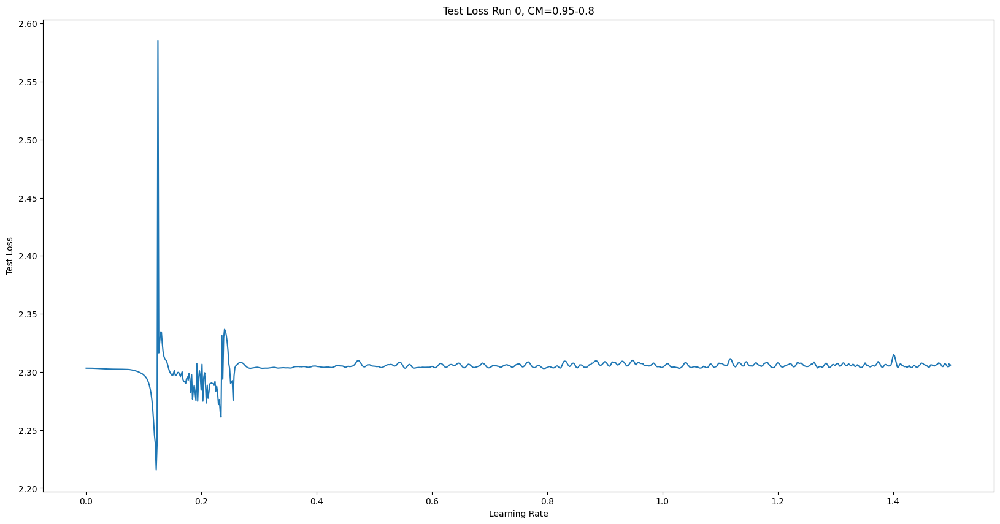

In [164]:
# Test Loss
create_run_graph(
    momentum_95_run_0_classification_runs[0], 
    "Test Loss Run 0, CM=0.95-0.8",
    "Learning Rate",
    "Test Loss")

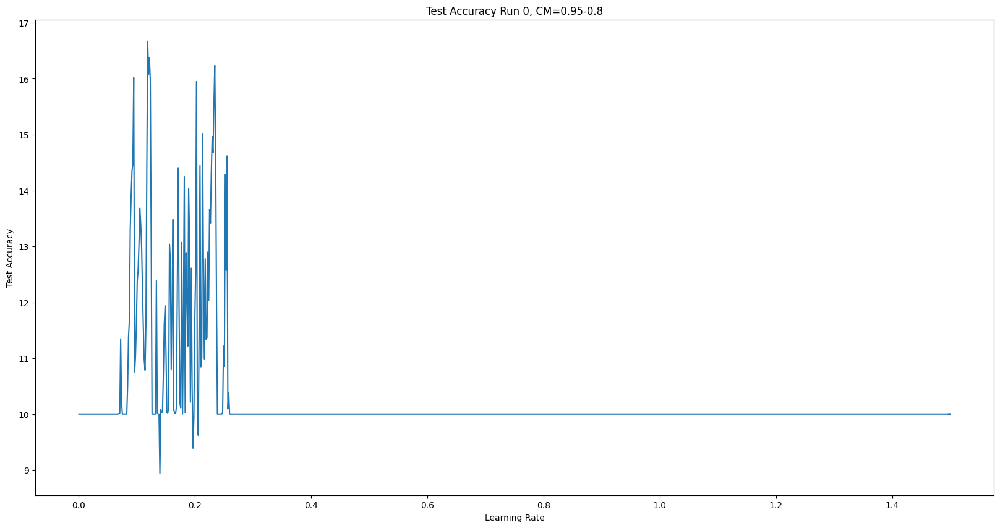

In [165]:
# Test Accuracy
create_run_graph(
    momentum_95_run_0_classification_runs[1], 
    "Test Accuracy Run 0, CM=0.95-0.8",
    "Learning Rate",
    "Test Accuracy")

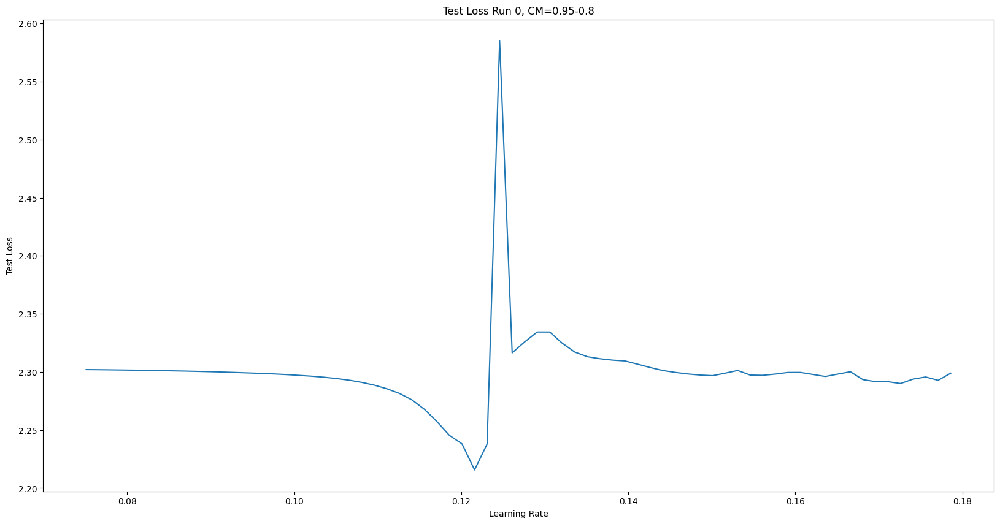

In [166]:
# Test Loss, Looking at ranges of 0.001 to 0.2
create_run_graph(
    momentum_95_run_0_classification_runs[0], 
    "Test Loss Run 0, CM=0.95-0.8",
    "Learning Rate",
    "Test Loss",
    50, 120)

In [168]:
START_IDX = 75
for x in range(10):
  print(momentum_95_run_0_classification_runs[0][START_IDX + x])  

(0.11259250000000028, 2.281533312988281)
(0.11409240000000011, 2.275948984718323)
(0.11559229999999994, 2.2677960578918457)
(0.11709219999999977, 2.2571719093322753)
(0.11859210000000027, 2.2453286798477174)
(0.12009200000000012, 2.2380439914703367)
(0.12159189999999995, 2.215655614280701)
(0.12309179999999978, 2.2379130475997924)
(0.12459170000000028, 2.5850247686386107)
(0.1260916000000001, 2.31641324634552)


In [209]:
# MIN TRAIN_LOSS_VALUE FOR RUN 0
print("MIN TRAIN_LOSS: " + str(get_min_from_run(momentum_95_train_runs[0])))
# MIN TEST_LOSS_VALUE FOR RUN 0
print("MIN_TEST_LOSS: " + str(get_min_from_run(momentum_95_run_0_classification_runs[0])))
# MAX TEST_ACCURACY_VALUE FOR RUN 0
print("MAX TEST_ACCURACY: " + str(get_max_from_run(momentum_95_run_0_classification_runs[1])))

MIN TRAIN_LOSS: 2.21409010887146
MIN_TEST_LOSS: 2.215655614280701
MAX TEST_ACCURACY: 16.67


Ideal LR Range is 0.10 - 0.12

#### Run 1 Analysis

In [210]:
momentum_95_run_1_classification_runs = load_data(get_classification_run_name(1, .95))

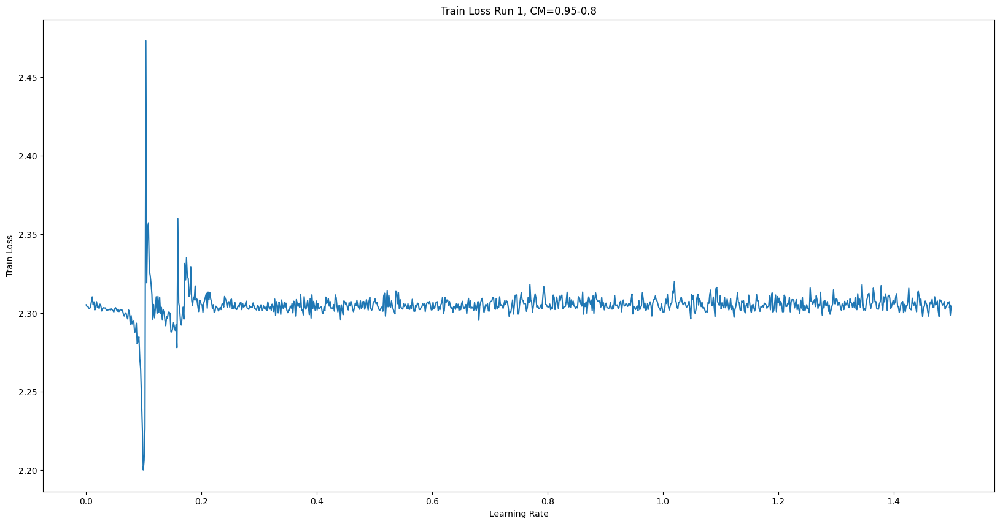

In [224]:
# Train Loss
create_run_graph(
    momentum_95_train_runs[1], 
    "Train Loss Run 1, CM=0.95-0.8",
    "Learning Rate",
    "Train Loss")

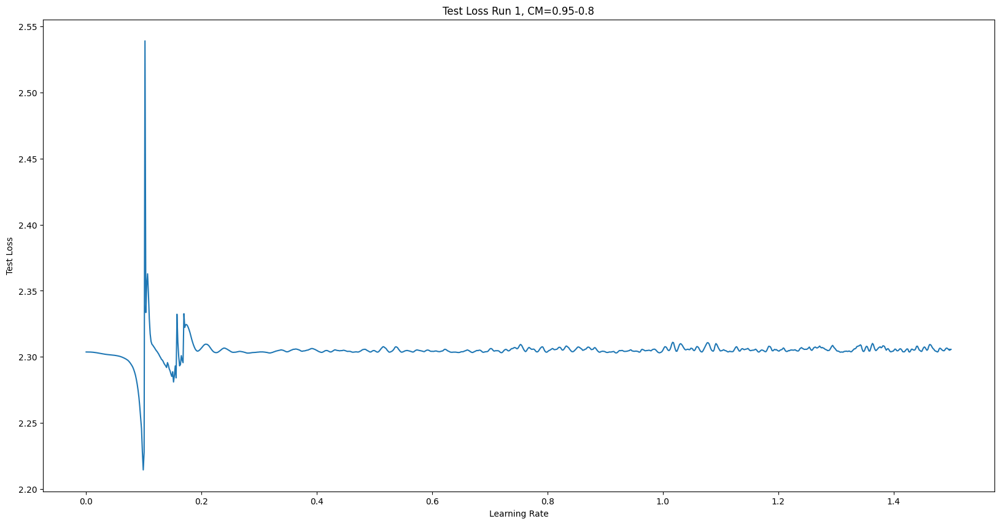

In [225]:
# Test Loss
create_run_graph(
    momentum_95_run_1_classification_runs[0], 
    "Test Loss Run 1, CM=0.95-0.8",
    "Learning Rate",
    "Test Loss")

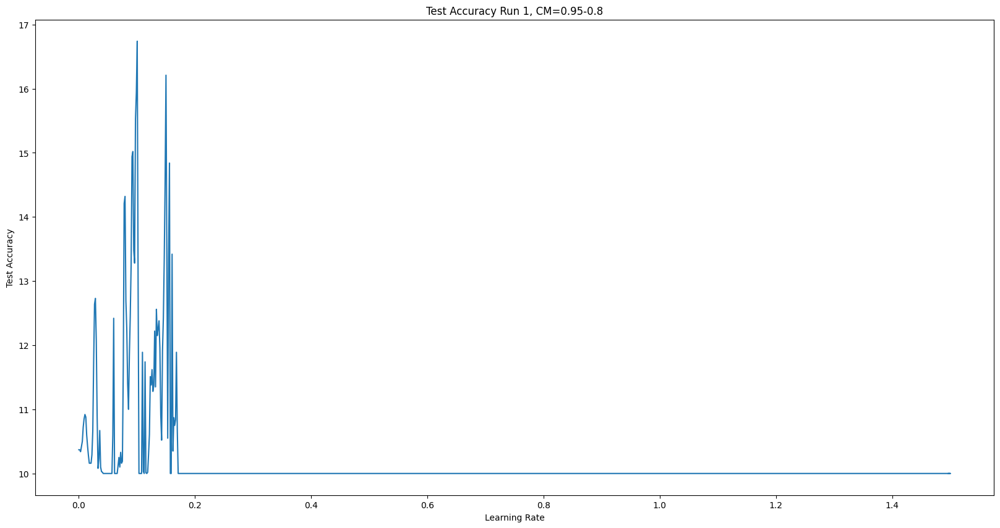

In [226]:
# Test Accuracy
create_run_graph(
    momentum_95_run_1_classification_runs[1], 
    "Test Accuracy Run 1, CM=0.95-0.8",
    "Learning Rate",
    "Test Accuracy")

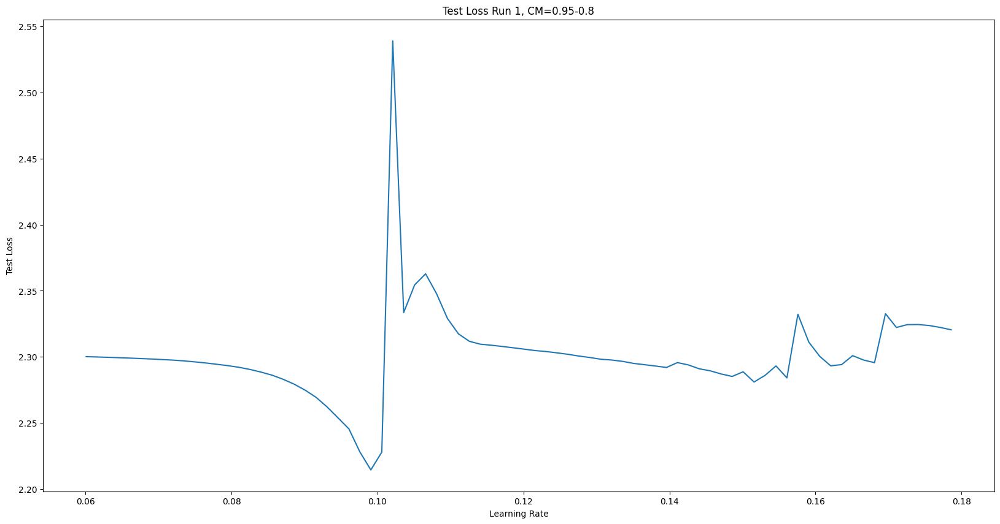

In [227]:
# Test Loss, Looking at ranges of 0.001 to 0.2
create_run_graph(
    momentum_95_run_1_classification_runs[0], 
    "Test Loss Run 1, CM=0.95-0.8",
    "Learning Rate",
    "Test Loss",
    40, 120)

In [228]:
START_IDX = 55
for x in range(15):
  print(momentum_95_run_1_classification_runs[0][START_IDX + x])  

(0.08259450000000024, 2.290446041107178)
(0.08409440000000008, 2.2884537385940553)
(0.08559429999999991, 2.286143221282959)
(0.08709419999999975, 2.28304716796875)
(0.08859410000000024, 2.2793761808395385)
(0.09009400000000008, 2.274859086608887)
(0.09159389999999992, 2.2694266456604004)
(0.09309379999999975, 2.2622245958328246)
(0.09459370000000025, 2.2539318384170532)
(0.09609360000000008, 2.245560197067261)
(0.09759349999999993, 2.228137726211548)
(0.09909339999999976, 2.214586368942261)
(0.10059330000000026, 2.2280121503829955)
(0.10209320000000009, 2.5388871852874755)
(0.10359309999999992, 2.3335241039276124)


In [229]:
# MIN TRAIN_LOSS_VALUE FOR RUN 0
print("MIN TRAIN_LOSS: " + str(get_min_from_run(momentum_95_train_runs[1])))
# MIN TEST_LOSS_VALUE FOR RUN 0
print("MIN_TEST_LOSS: " + str(get_min_from_run(momentum_95_run_1_classification_runs[0])))
# MAX TEST_ACCURACY_VALUE FOR RUN 0
print("MAX TEST_ACCURACY: " + str(get_max_from_run(momentum_95_run_1_classification_runs[1])))

MIN TRAIN_LOSS: 2.2000985145568848
MIN_TEST_LOSS: 2.214586368942261
MAX TEST_ACCURACY: 16.74


Ideal LR Range 0.08 - 0.0975

#### Run 2 Analysis

In [178]:
momentum_95_run_2_classification_runs = load_data(get_classification_run_name(2, .95))

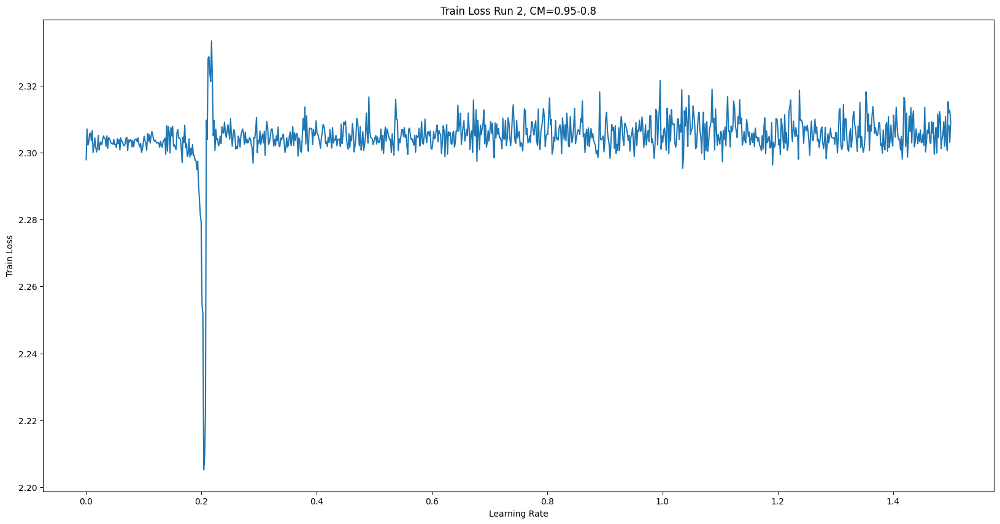

In [184]:
# Train Loss
create_run_graph(
    momentum_95_train_runs[2], 
    "Train Loss Run 2, CM=0.95-0.8",
    "Learning Rate",
    "Train Loss")

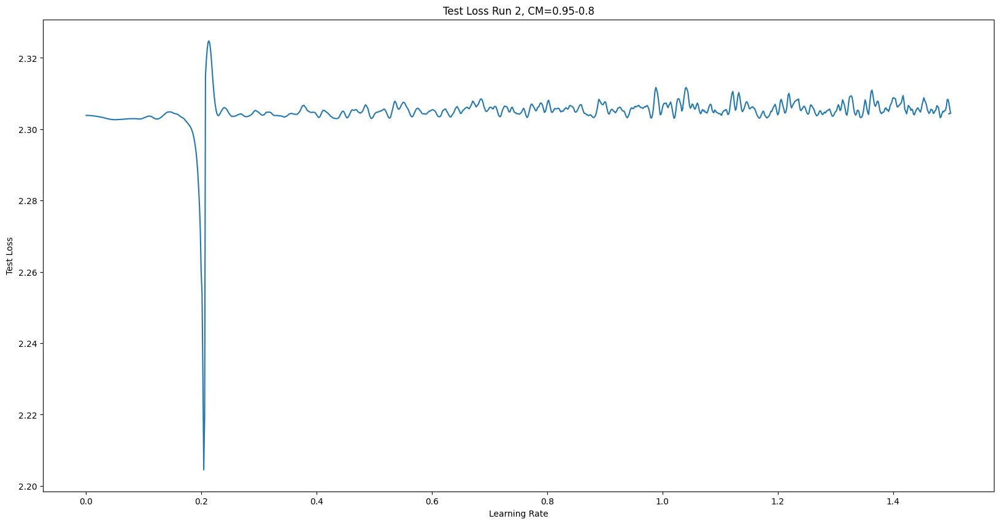

In [183]:
# Test Loss
create_run_graph(
    momentum_95_run_2_classification_runs[0], 
    "Test Loss Run 2, CM=0.95-0.8",
    "Learning Rate",
    "Test Loss")

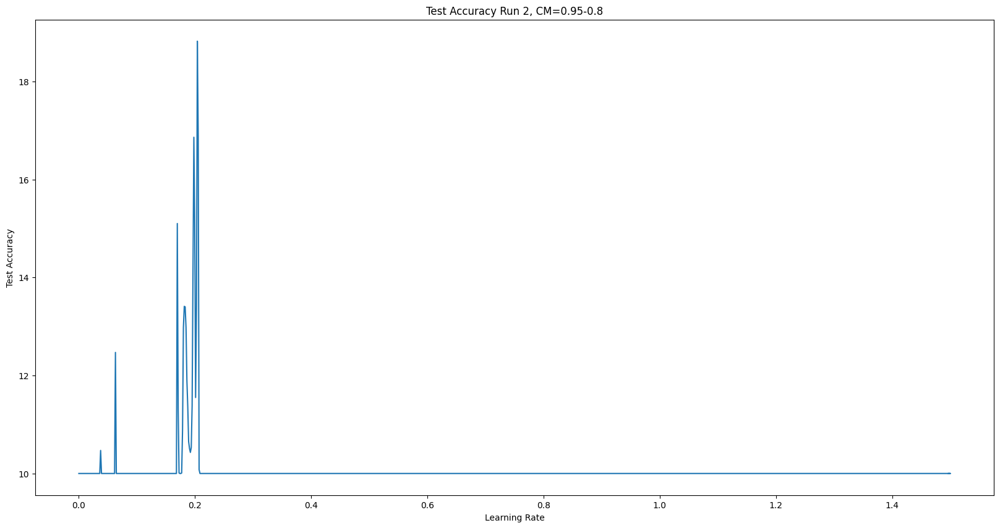

In [182]:
# Test Accuracy
create_run_graph(
    momentum_95_run_2_classification_runs[1], 
    "Test Accuracy Run 2, CM=0.95-0.8",
    "Learning Rate",
    "Test Accuracy")

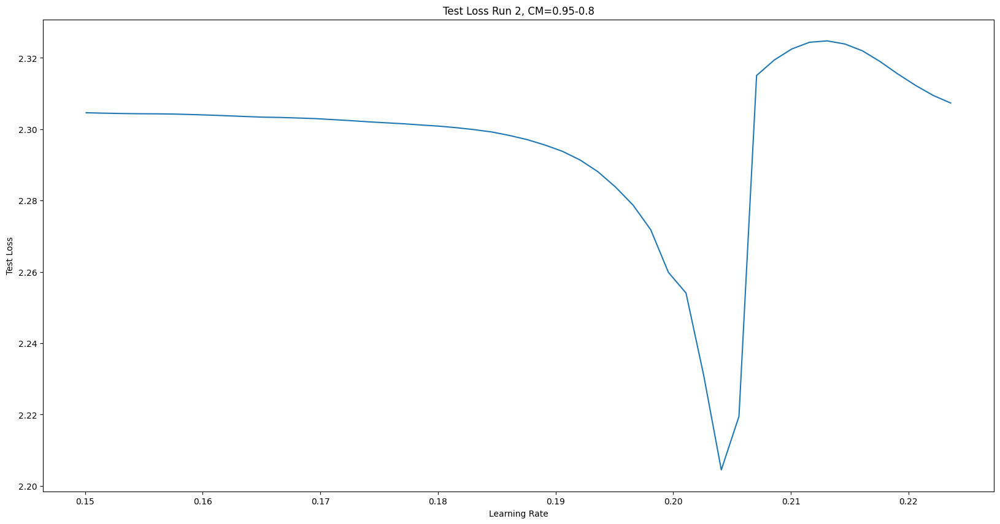

In [193]:
# Test Loss, Looking at ranges of 0.001 to 0.2
create_run_graph(
    momentum_95_run_2_classification_runs[0], 
    "Test Loss Run 2, CM=0.95-0.8",
    "Learning Rate",
    "Test Loss",
    100, 150)

In [199]:
START_IDX = 130
for x in range(20):
  print(momentum_95_run_2_classification_runs[0][START_IDX + x])  

(0.19508699999999984, 2.2838030542373655)
(0.19658690000000034, 2.278715014839172)
(0.19808680000000017, 2.271814424133301)
(0.1995867, 2.2598789024353025)
(0.20108659999999984, 2.2540557540893555)
(0.20258649999999967, 2.231040398406982)
(0.20408640000000017, 2.204484729194641)
(0.2055863, 2.2194599919319153)
(0.20708619999999983, 2.315062621498108)
(0.20858610000000033, 2.319392939376831)
(0.2100860000000002, 2.322509897041321)
(0.21158590000000002, 2.324375609779358)
(0.21308579999999985, 2.3247610834121706)
(0.21458569999999969, 2.3238974895477296)
(0.21608560000000018, 2.3219767910003664)
(0.21758550000000002, 2.318968158531189)
(0.21908539999999985, 2.3154985092163085)
(0.22058529999999968, 2.312322864151001)
(0.22208520000000018, 2.3094921129226686)
(0.2235851, 2.3073440979003905)


In [179]:
# MIN TRAIN_LOSS_VALUE FOR RUN 0
print("MIN TRAIN_LOSS: " + str(get_min_from_run(momentum_95_train_runs[2])))
# MIN TEST_LOSS_VALUE FOR RUN 0
print("MIN_TEST_LOSS: " + str(get_min_from_run(momentum_95_run_2_classification_runs[0])))
# MAX TEST_ACCURACY_VALUE FOR RUN 0
print("MAX TEST_ACCURACY: " + str(get_max_from_run(momentum_95_run_2_classification_runs[1])))

MIN TRAIN_LOSS: 2.2051758766174316
MIN_TEST_LOSS: 2.204484729194641
MAX TEST_ACCURACY: 18.82


Ideal LR Range 0.19-0.204

#### Run 3 Analysis

In [200]:
momentum_95_run_3_classification_runs = load_data(get_classification_run_name(3, .95))

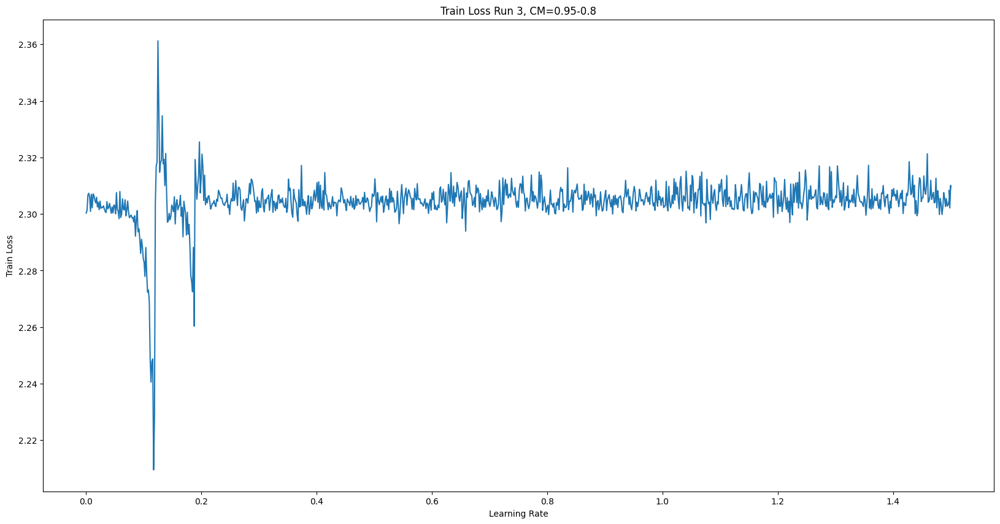

In [206]:
# Train Loss
create_run_graph(
    momentum_95_train_runs[3], 
    "Train Loss Run 3, CM=0.95-0.8",
    "Learning Rate",
    "Train Loss")

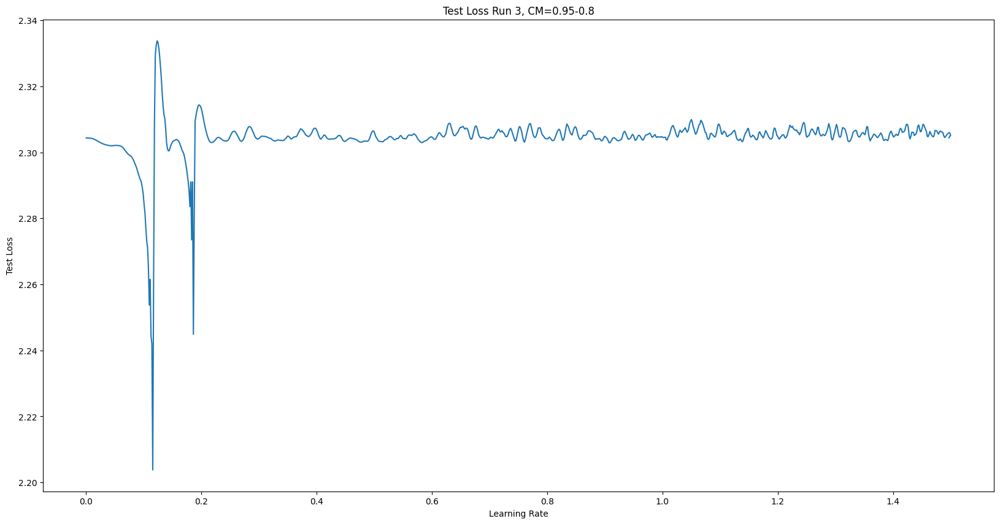

In [205]:
# Test Loss
create_run_graph(
    momentum_95_run_3_classification_runs[0], 
    "Test Loss Run 3, CM=0.95-0.8",
    "Learning Rate",
    "Test Loss")

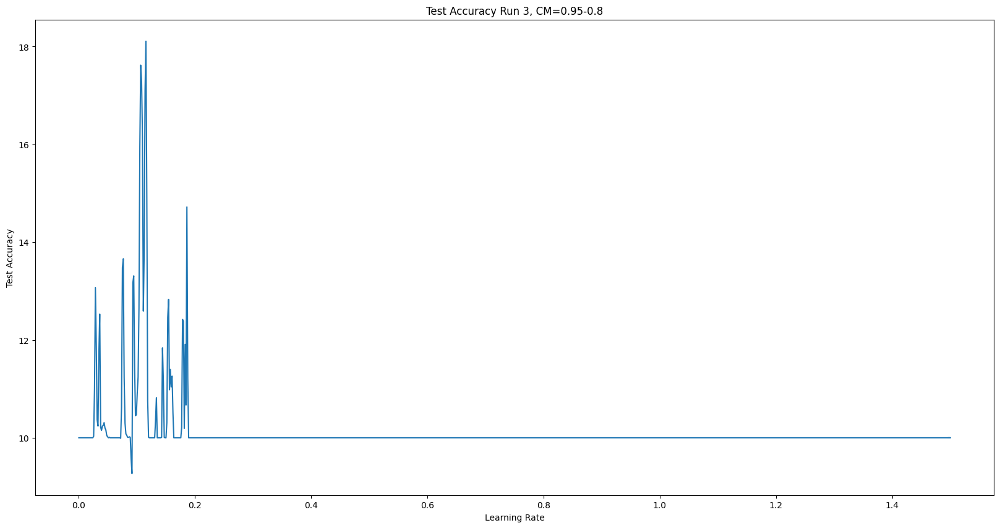

In [204]:
# Test Accuracy
create_run_graph(
    momentum_95_run_3_classification_runs[1], 
    "Test Accuracy Run 3, CM=0.95-0.8",
    "Learning Rate",
    "Test Accuracy")

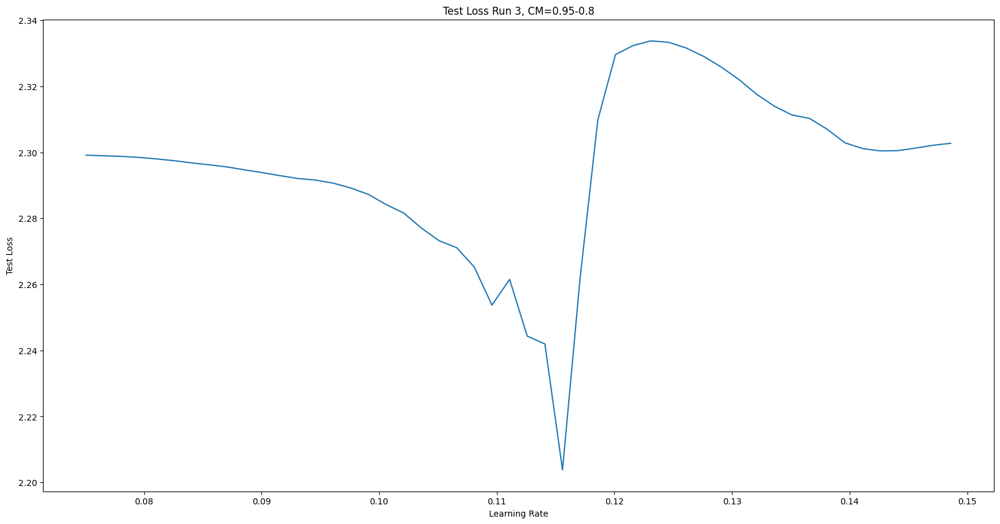

In [235]:
# Test Loss, Looking at ranges of 0.001 to 0.2
create_run_graph(
    momentum_95_run_3_classification_runs[0], 
    "Test Loss Run 3, CM=0.95-0.8",
    "Learning Rate",
    "Test Loss",
    50, 100)

In [239]:
START_IDX = 65
for x in range(15):
  print(momentum_95_run_3_classification_runs[0][START_IDX + x])  

(0.09759349999999993, 2.289179372406006)
(0.09909339999999976, 2.2872437660217284)
(0.10059330000000026, 2.2841712028503416)
(0.10209320000000009, 2.281597808456421)
(0.10359309999999992, 2.2770579662322996)
(0.10509299999999977, 2.2732329235076905)
(0.10659290000000027, 2.2711089111328127)
(0.1080928000000001, 2.265222699356079)
(0.10959269999999993, 2.25372543258667)
(0.11109259999999976, 2.2615063957214354)
(0.11259250000000028, 2.2443163606643677)
(0.11409240000000011, 2.2419621547698974)
(0.11559229999999994, 2.2038005096435547)
(0.11709219999999977, 2.262094091796875)
(0.11859210000000027, 2.309787907409668)


In [201]:
# MIN TRAIN_LOSS_VALUE FOR RUN 0
print("MIN TRAIN_LOSS: " + str(get_min_from_run(momentum_95_train_runs[3])))
# MIN TEST_LOSS_VALUE FOR RUN 0
print("MIN_TEST_LOSS: " + str(get_min_from_run(momentum_95_run_3_classification_runs[0])))
# MAX TEST_ACCURACY_VALUE FOR RUN 0
print("MAX TEST_ACCURACY: " + str(get_max_from_run(momentum_95_run_3_classification_runs[1])))

MIN TRAIN_LOSS: 2.2094807624816895
MIN_TEST_LOSS: 2.2038005096435547
MAX TEST_ACCURACY: 18.11


Ideal LR Range 0.095 - 0.114

### Max Momentum of 0.9 Analysis

In [240]:
momentum_90_train_runs = get_train_loss_runs(90)

#### Run 0 Analysis

In [242]:
momentum_90_run_0_classification_runs = load_data(get_classification_run_name(0, .90))

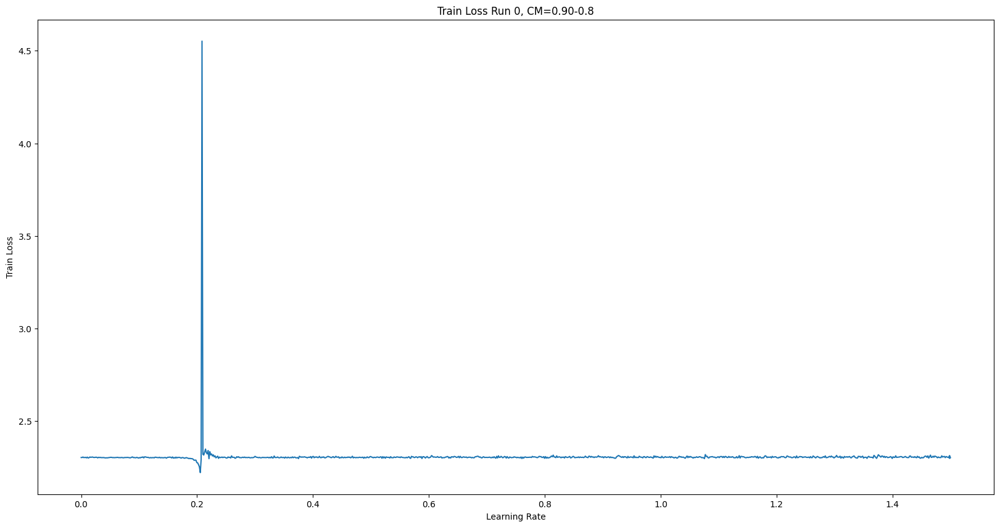

In [248]:
# Train Loss
create_run_graph(
    momentum_90_train_runs[0], 
    "Train Loss Run 0, CM=0.90-0.8",
    "Learning Rate",
    "Train Loss")

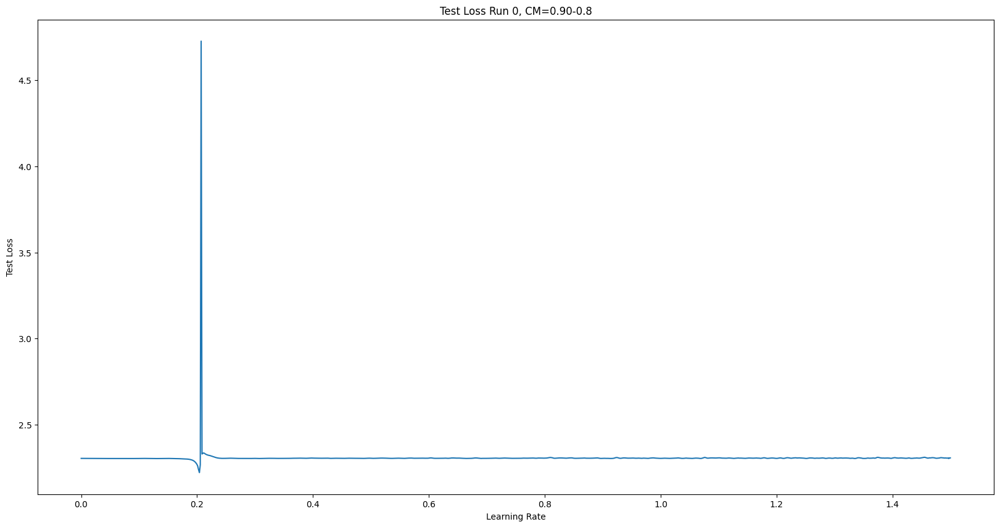

In [247]:
# Test Loss
create_run_graph(
    momentum_90_run_0_classification_runs[0], 
    "Test Loss Run 0, CM=0.90-0.8",
    "Learning Rate",
    "Test Loss")

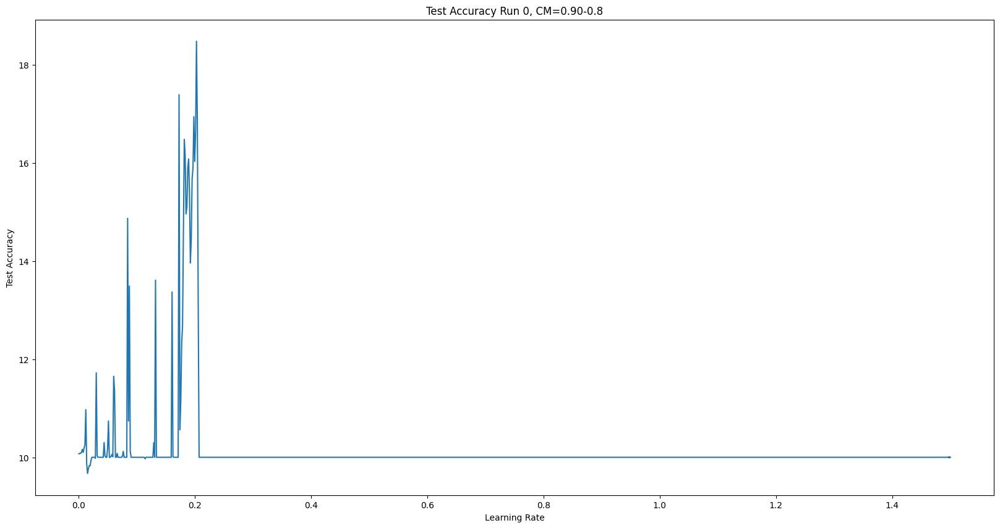

In [246]:
# Test Accuracy
create_run_graph(
    momentum_90_run_0_classification_runs[1], 
    "Test Accuracy Run 0, CM=0.90-0.8",
    "Learning Rate",
    "Test Accuracy")

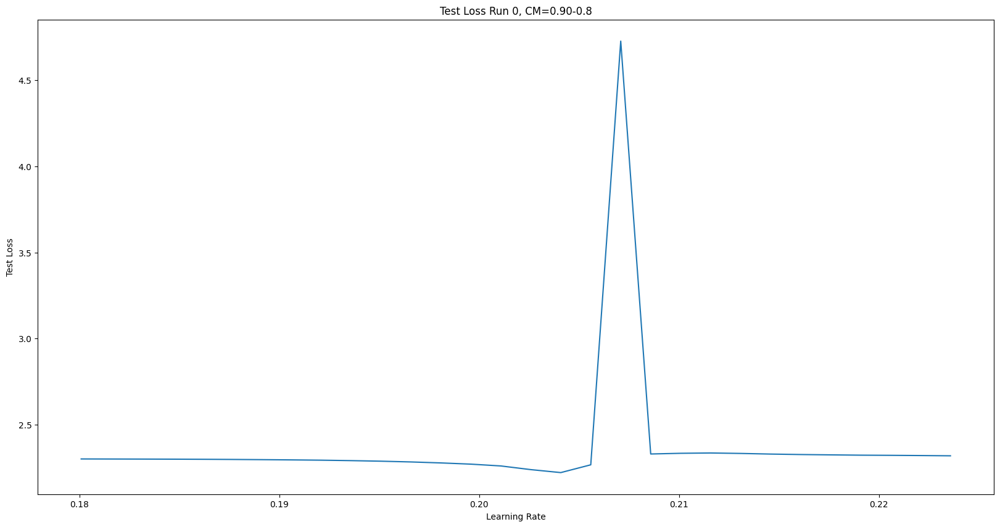

In [255]:
# Test Loss, Looking at ranges of 0.001 to 0.2
create_run_graph(
    momentum_90_run_0_classification_runs[0], 
    "Test Loss Run 0, CM=0.90-0.8",
    "Learning Rate",
    "Test Loss",
    120, 150)

In [244]:
START_IDX = 75
for x in range(10):
  print(momentum_90_run_0_classification_runs[0][START_IDX + x])  

(0.11259250000000028, 2.3030169799804687)
(0.11409240000000011, 2.302896367263794)
(0.11559229999999994, 2.3027734369277955)
(0.11709219999999977, 2.30268422203064)
(0.11859210000000027, 2.3026324871063233)
(0.12009200000000012, 2.3025877504348755)
(0.12159189999999995, 2.302573793029785)
(0.12309179999999978, 2.302558863067627)
(0.12459170000000028, 2.302538949584961)
(0.1260916000000001, 2.3025428279876707)


In [243]:
# MIN TRAIN_LOSS_VALUE FOR RUN 0
print("MIN TRAIN_LOSS: " + str(get_min_from_run(momentum_90_train_runs[0])))
# MIN TEST_LOSS_VALUE FOR RUN 0
print("MIN_TEST_LOSS: " + str(get_min_from_run(momentum_90_run_0_classification_runs[0])))
# MAX TEST_ACCURACY_VALUE FOR RUN 0
print("MAX TEST_ACCURACY: " + str(get_max_from_run(momentum_90_run_0_classification_runs[1])))

MIN TRAIN_LOSS: 2.221707582473755
MIN_TEST_LOSS: 2.2209061796188356
MAX TEST_ACCURACY: 18.48


#### Run 1 Analysis

In [256]:
momentum_90_run_1_classification_runs = load_data(get_classification_run_name(1, .90))

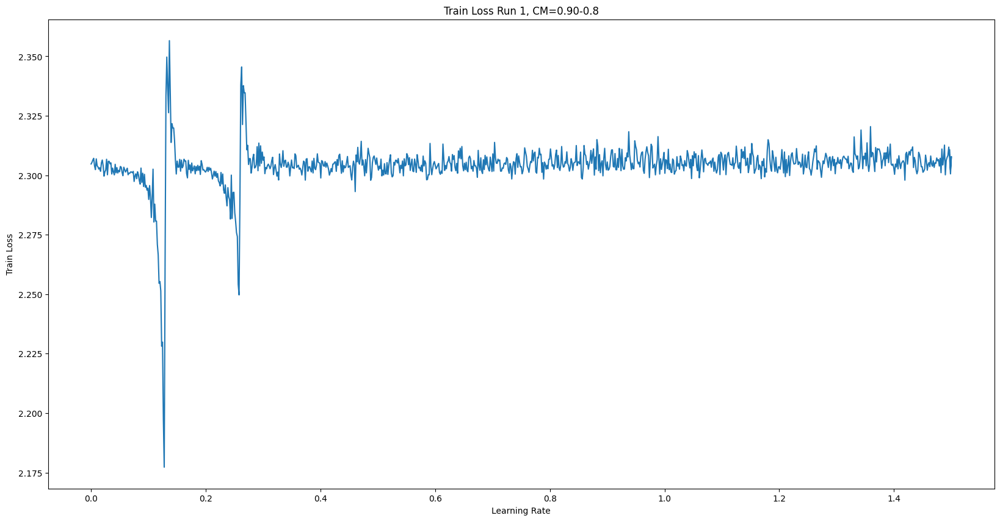

In [257]:
# Train Loss
create_run_graph(
    momentum_90_train_runs[1], 
    "Train Loss Run 1, CM=0.90-0.8",
    "Learning Rate",
    "Train Loss")

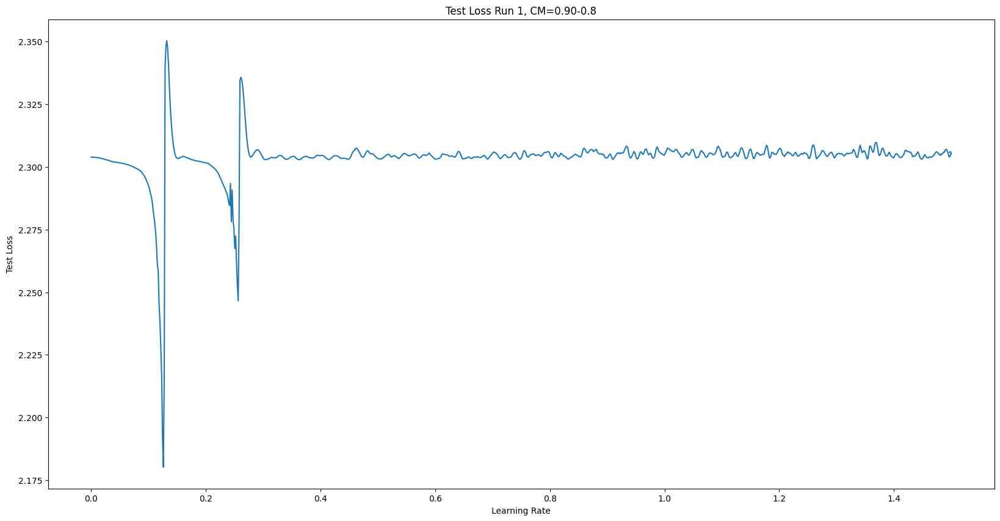

In [258]:
# Test Loss
create_run_graph(
    momentum_90_run_1_classification_runs[0], 
    "Test Loss Run 1, CM=0.90-0.8",
    "Learning Rate",
    "Test Loss")

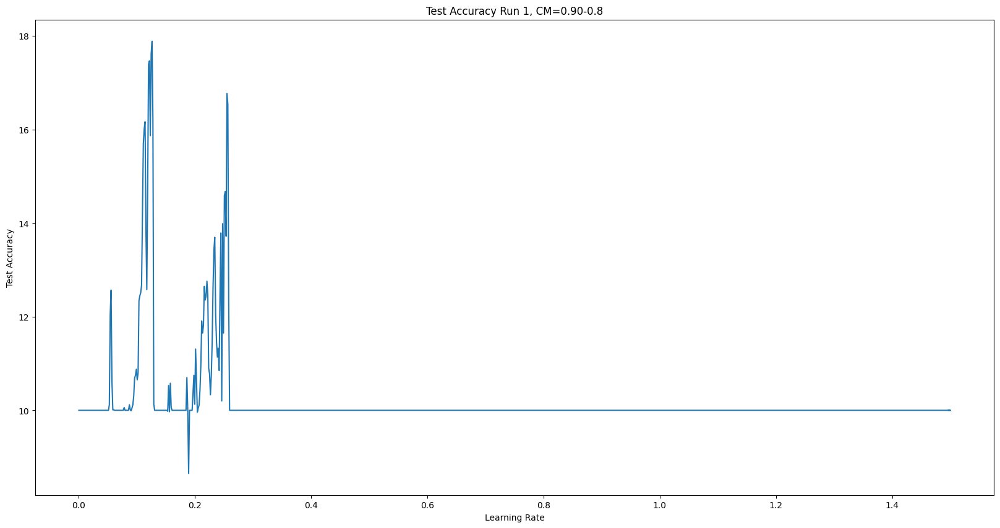

In [259]:
# Test Accuracy
create_run_graph(
    momentum_90_run_1_classification_runs[1], 
    "Test Accuracy Run 1, CM=0.90-0.8",
    "Learning Rate",
    "Test Accuracy")

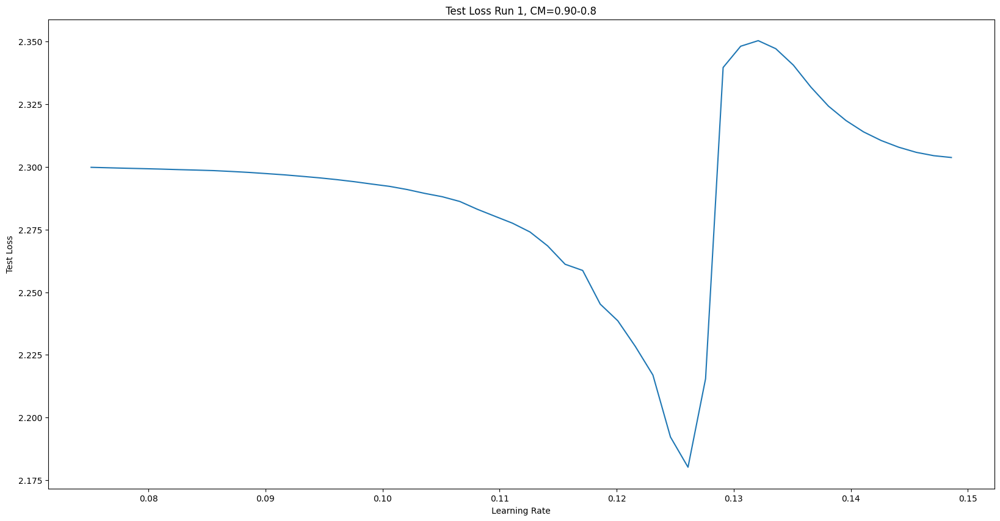

In [265]:
# Test Loss, Looking at ranges of 0.001 to 0.2
create_run_graph(
    momentum_90_run_1_classification_runs[0], 
    "Test Loss Run 1, CM=0.90-0.8",
    "Learning Rate",
    "Test Loss",
    50, 100)

In [267]:
START_IDX = 80
for x in range(10):
  print(momentum_90_run_1_classification_runs[0][START_IDX + x])  

(0.12009200000000012, 2.2385941394805906)
(0.12159189999999995, 2.2283473575592043)
(0.12309179999999978, 2.216950029563904)
(0.12459170000000028, 2.192217405128479)
(0.1260916000000001, 2.1801599418640136)
(0.12759149999999994, 2.215471369934082)
(0.12909139999999977, 2.3396782892227175)
(0.13059130000000027, 2.348157153892517)
(0.1320912000000001, 2.3503841480255128)
(0.13359109999999993, 2.347171003341675)


In [262]:
# MIN TRAIN_LOSS_VALUE FOR RUN 1
print("MIN TRAIN_LOSS: " + str(get_min_from_run(momentum_90_train_runs[1])))
# MIN TEST_LOSS_VALUE FOR RUN 1
print("MIN_TEST_LOSS: " + str(get_min_from_run(momentum_90_run_1_classification_runs[0])))
# MAX TEST_ACCURACY_VALUE FOR RUN 1
print("MAX TEST_ACCURACY: " + str(get_max_from_run(momentum_90_run_1_classification_runs[1])))

MIN TRAIN_LOSS: 2.1772513389587402
MIN_TEST_LOSS: 2.1801599418640136
MAX TEST_ACCURACY: 17.89


Ideal LR Range 0.1 - 0.124

#### Run 2 Analysis

In [268]:
momentum_90_run_2_classification_runs = load_data(get_classification_run_name(2, .90))

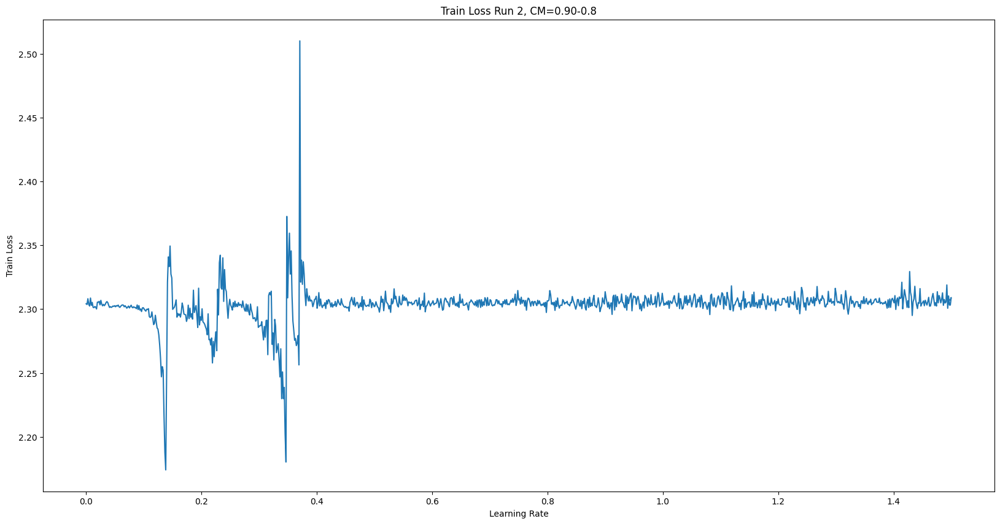

In [274]:
# Train Loss
create_run_graph(
    momentum_90_train_runs[2], 
    "Train Loss Run 2, CM=0.90-0.8",
    "Learning Rate",
    "Train Loss")

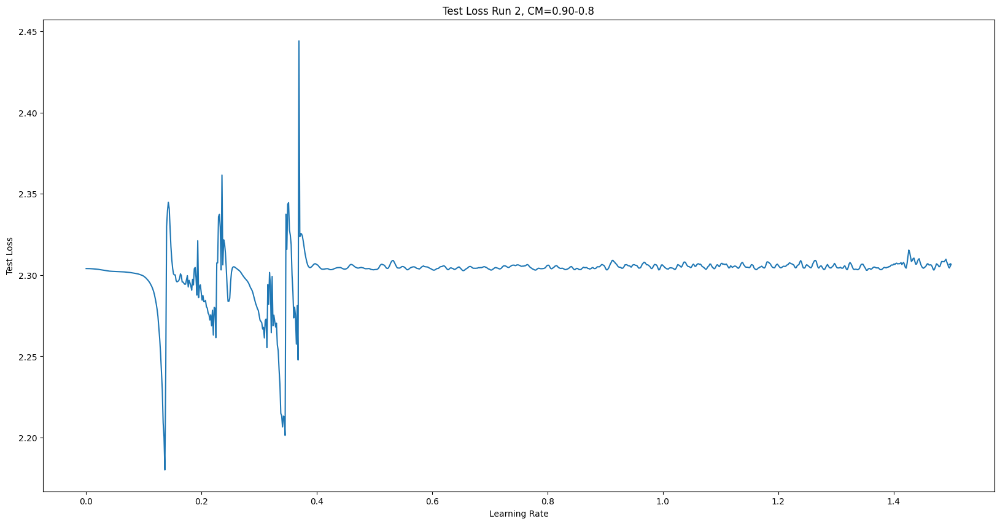

In [273]:
# Test Loss
create_run_graph(
    momentum_90_run_2_classification_runs[0], 
    "Test Loss Run 2, CM=0.90-0.8",
    "Learning Rate",
    "Test Loss")

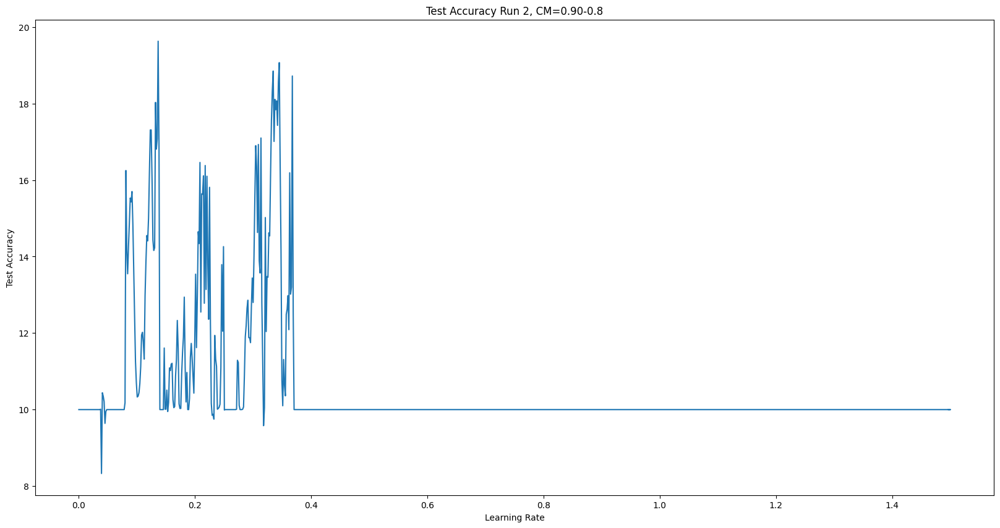

In [272]:
# Test Accuracy
create_run_graph(
    momentum_90_run_2_classification_runs[1], 
    "Test Accuracy Run 2, CM=0.90-0.8",
    "Learning Rate",
    "Test Accuracy")

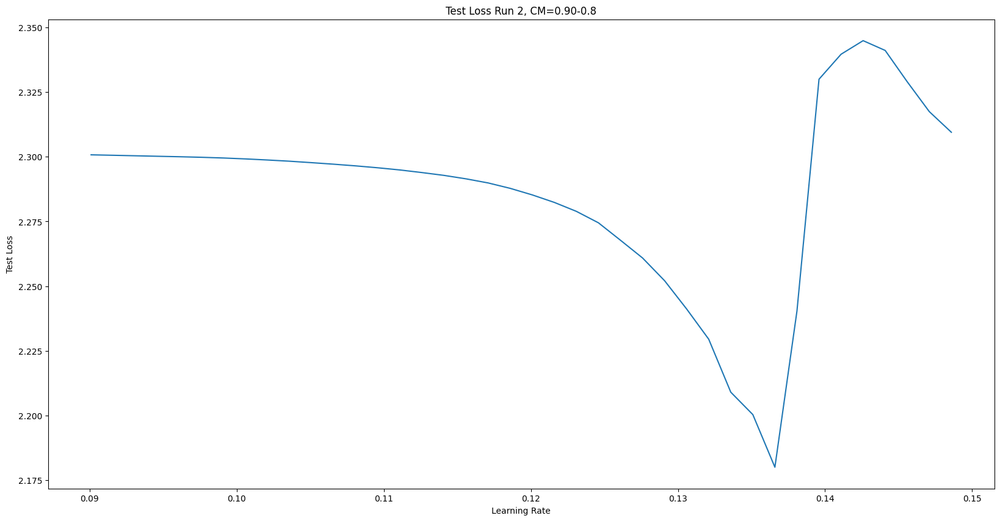

In [278]:
# Test Loss, Looking at ranges of 0.001 to 0.2
create_run_graph(
    momentum_90_run_2_classification_runs[0], 
    "Test Loss Run 2, CM=0.90-0.8",
    "Learning Rate",
    "Test Loss",
    60, 100)

In [270]:
START_IDX = 75
for x in range(10):
  print(momentum_90_run_2_classification_runs[0][START_IDX + x])  

(0.11259250000000028, 2.2938826732635498)
(0.11409240000000011, 2.292791278839111)
(0.11559229999999994, 2.2914572202682497)
(0.11709219999999977, 2.2898753955841062)
(0.11859210000000027, 2.2877881734848025)
(0.12009200000000012, 2.2852574155807495)
(0.12159189999999995, 2.2823573865890503)
(0.12309179999999978, 2.2789013513565064)
(0.12459170000000028, 2.2744815090179444)
(0.1260916000000001, 2.2677397382736206)


In [269]:
# MIN TRAIN_LOSS_VALUE FOR RUN 1
print("MIN TRAIN_LOSS: " + str(get_min_from_run(momentum_90_train_runs[2])))
# MIN TEST_LOSS_VALUE FOR RUN 1
print("MIN_TEST_LOSS: " + str(get_min_from_run(momentum_90_run_2_classification_runs[0])))
# MAX TEST_ACCURACY_VALUE FOR RUN 1
print("MAX TEST_ACCURACY: " + str(get_max_from_run(momentum_90_run_2_classification_runs[1])))

MIN TRAIN_LOSS: 2.1740944385528564
MIN_TEST_LOSS: 2.1800793561935423
MAX TEST_ACCURACY: 19.63


#### Run 3 Analysis

In [ ]:
momentum_90_run_3_classification_runs = load_data(get_classification_run_name(3, .90))

In [ ]:
# Train Loss
create_run_graph(
    momentum_90_train_runs[3], 
    "Train Loss Run 3, CM=0.90-0.8",
    "Learning Rate",
    "Train Loss")

In [ ]:
# Test Loss
create_run_graph(
    momentum_90_run_3_classification_runs[0], 
    "Test Loss Run 3, CM=0.90-0.8",
    "Learning Rate",
    "Test Loss")

In [ ]:
# Test Accuracy
create_run_graph(
    momentum_90_run_3_classification_runs[1], 
    "Test Accuracy Run 3, CM=0.90-0.8",
    "Learning Rate",
    "Test Accuracy")

In [ ]:
# Test Loss, Looking at ranges of 0.001 to 0.2
create_run_graph(
    momentum_90_run_3_classification_runs[0], 
    "Test Loss Run 3, CM=0.90-0.8",
    "Learning Rate",
    "Test Loss",
    50, 120)

In [ ]:
START_IDX = 75
for x in range(10):
  print(momentum_90_run_3_classification_runs[0][START_IDX + x])  

In [ ]:
# MIN TRAIN_LOSS_VALUE FOR RUN 1
print("MIN TRAIN_LOSS: " + str(get_min_from_run(momentum_90_train_runs[3])))
# MIN TEST_LOSS_VALUE FOR RUN 1
print("MIN_TEST_LOSS: " + str(get_min_from_run(momentum_90_run_3_classification_runs[0])))
# MAX TEST_ACCURACY_VALUE FOR RUN 1
print("MAX TEST_ACCURACY: " + str(get_max_from_run(momentum_90_run_3_classification_runs[1])))

Code for generating the train_losses and copies of the models at each iteration

In [ ]:
MAX_MOMENTUM_VALUE = 0.90
CURR_RUN = 3
computed_models = []

In [ ]:
# TESTING MOMENTUM VALUES OF 0.99, 0.97, 0.95, 0.9
for x in tqdm(range(NUM_RUNS)):
  net = ConvoPoolNet()
  train_losses, res_models = run_range_test(net, 512, 1000, start_lr=0.0001, end_lr=1.5, weight_decay=0.001, max_momentum=MAX_MOMENTUM_VALUE)
  momentum_90_runs.append((train_losses, res_models))

  0%|          | 0/4 [00:00<?, ?it/s]

Using device cpu
num cpus: 2


 25%|██▌       | 1/4 [06:59<20:58, 419.38s/it]

Using device cpu
num cpus: 2


 50%|█████     | 2/4 [14:02<14:02, 421.45s/it]

Using device cpu
num cpus: 2


 75%|███████▌  | 3/4 [21:05<07:02, 422.43s/it]

Using device cpu
num cpus: 2


100%|██████████| 4/4 [28:15<00:00, 424.00s/it]


In [ ]:
save_data("MOMENTUM_TRAIN_LOSS_90.dat", momentum_90_runs)

Here we are actually using each model generated at each iteration step and calculating the test loss and test accuracy for each. We will then plot this later
Using the test loss/accuracy gives more precise results than just using the train loss/accuracy.

In [ ]:
# initializes our test loader
kwargs = {'num_workers': multiprocessing.cpu_count(),
            'pin_memory': True} if use_cuda else {}
device = torch.device("cuda" if use_cuda else "cpu")
test_loader = torch.utils.data.DataLoader(data_test, batch_size=TEST_BATCH_SIZE,
                                            shuffle=False, **kwargs)

In [ ]:
# computes first 500 models
computed_models = compute_test_loss(momentum_90_runs[CURR_RUN], device, test_loader, range(500))

100%|██████████| 500/500 [52:01<00:00,  6.24s/it]


In [ ]:
computed_models = computed_models + compute_test_loss(momentum_90_runs[CURR_RUN], device, test_loader, range(500, 1003))

100%|██████████| 503/503 [51:36<00:00,  6.16s/it]


In [ ]:
print(len(computed_models))

1003


In [ ]:
# COMPUTATION IS SPLIT IN HALF
# THIS BLOCK WILL DO FROM 500-1002
# BECAUSE IT TAKES TOO LONG
CURR_RUN = 0
for x in tqdm(range(500, 1003)):
  curr_lr, model = momentum_test_dict[MAX_MOMENTUM_VALUE][CURR_RUN][1][x]
  curr_test_loss, curr_test_accuracy = simple_test(model, device, test_loader)
  momentum_computed_dict[MAX_MOMENTUM_VALUE][CURR_RUN].append((curr_lr, curr_test_loss, curr_test_accuracy))

  0%|          | 0/503 [00:00<?, ?it/s]


NameError: ignored

In [ ]:
test_loss_repo = []
test_acc_repo = []
for x in computed_models:
  curr_lr, curr_test_loss, curr_test_accuracy = x
  test_loss_repo.append((curr_lr, curr_test_loss))
  test_acc_repo.append((curr_lr, curr_test_accuracy))

In [ ]:
print(CURR_RUN)

2


In [ ]:
save_data("MOMENTUM_TEST_LOSS_TEST_ACCURACY_RUN_" + str(CURR_RUN) + "_VAL_" + str(MAX_MOMENTUM_VALUE) + ".dat", (test_loss_repo, test_acc_repo))

In [ ]:
# TEST LOSS/ACCURACY FOR EACH RUN IS SAVED AS:
# MOMENTUM_TEST_LOSS_TEST_ACCURACY_RUN_X_VAL_Y.dat

In [ ]:
run_0 = load_data("MOMENTUM_TEST_LOSS_TEST_ACCURACY_RUN_0_0.99")

In [ ]:
# COMPUTATION IS SPLIT IN HALF
# FROM 0-499, NEXT BLOCK WILL DO FROM 500-1002
# BECAUSE IT TAKES TOO LONG
CURR_RUN = 0
momentum_computed_dict[0.97].append([])
for x in tqdm(range(500)):
  curr_lr, model = momentum_test_dict[0.99][CURR_RUN][1][x]
  curr_test_loss, curr_test_accuracy = simple_test(model, device, test_loader)
  momentum_computed_dict[0.99][CURR_RUN].append((curr_lr, curr_test_loss, curr_test_accuracy))

In [ ]:
kwargs = {'num_workers': multiprocessing.cpu_count(),
            'pin_memory': True} if use_cuda else {}
device = torch.device("cuda" if use_cuda else "cpu")
test_loader = torch.utils.data.DataLoader(data_test, batch_size=TEST_BATCH_SIZE,
                                            shuffle=False, **kwargs)
# COMPUTATION IS SPLIT IN HALF
# FROM 0-499, NEXT BLOCK WILL DO FROM 500-1002
# BECAUSE IT TAKES TOO LONG
CURR_RUN = 1
momentum_computed_dict[MAX_MOMENTUM_VALUE].append([])
for x in tqdm(range(500)):
  curr_lr, model = momentum_test_dict[MAX_MOMENTUM_VALUE][CURR_RUN][1][x]
  curr_test_loss, curr_test_accuracy = simple_test(model, device, test_loader)
  momentum_computed_dict[MAX_MOMENTUM_VALUE][CURR_RUN].append((curr_lr, curr_test_loss, curr_test_accuracy))

NameError: ignored

#### Relevant graph results for LR range test


##### Max Momentum Value of 0.99
Uses circular momentum, base momentum value of 0.8, max momentum value of 0.99. Uses base LR of 0.001 and max LR of 3.
First graph shows results for entire range of LR
Second graph shows shortened results for actual possible range of values

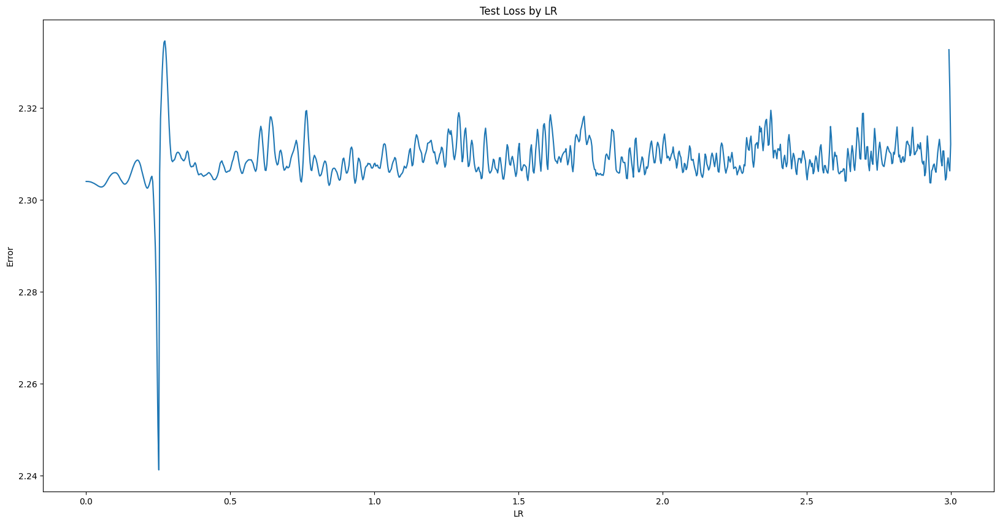

In [ ]:
test_lr, test_loss_vals = zip(*test_loss_repo)
pt_util.plot(test_lr, test_loss_vals, 'Test Loss by LR', 'LR', 'Error')

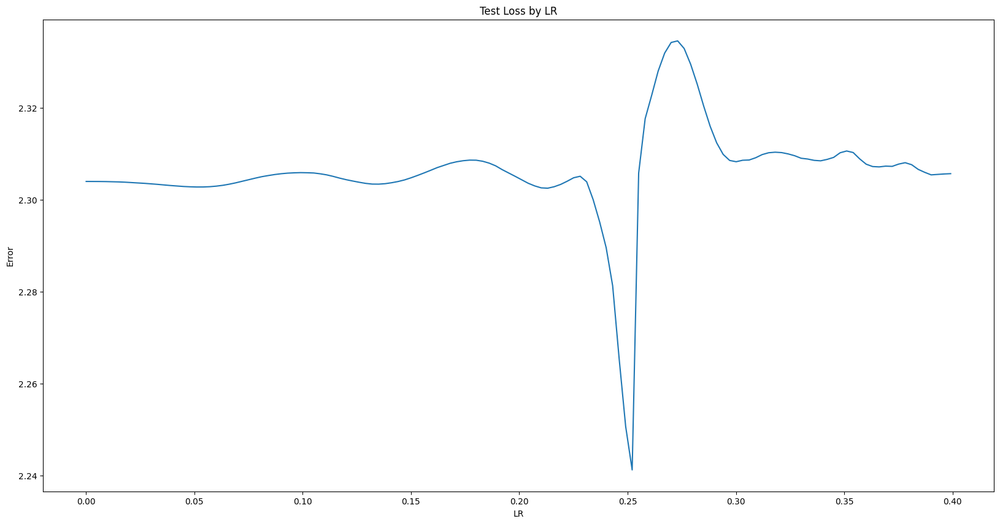

In [ ]:
# plots the specific range of learning rates for test loss we are interested in
specific_test_lr = test_lr[:134]
specific_loss_vals = test_loss_vals[:134]
pt_util.plot(specific_test_lr, specific_loss_vals, 'Test Loss by LR', 'LR', 'Error')

Going from the graph above for the very first run test run, it would seem a range from 0.2 to 0.25 for LR seems to be a good range.

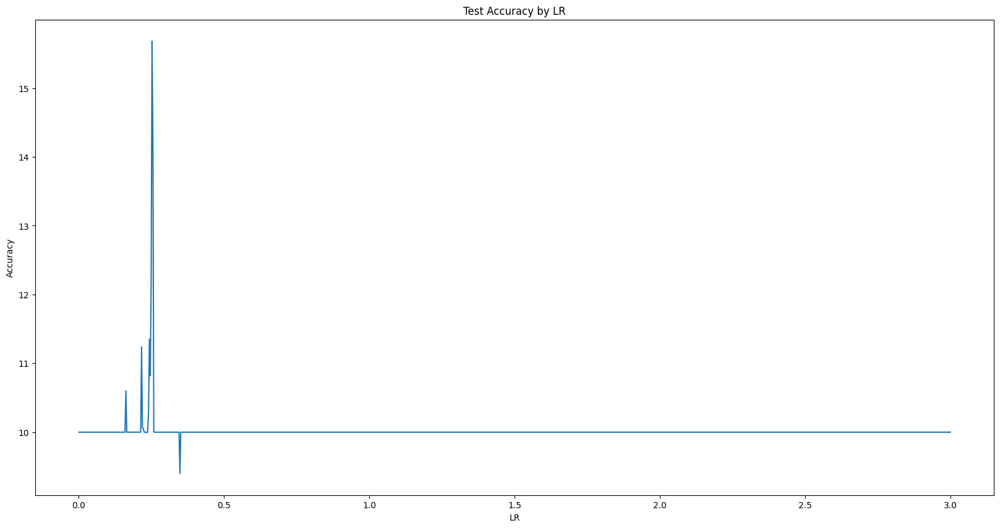

In [ ]:
test_lr, test_acc_val = zip(*test_acc_repo)
pt_util.plot(test_lr, test_acc_val, 'Test Accuracy by LR', 'LR', 'Accuracy')

##### Max Momentum Value of 0.97

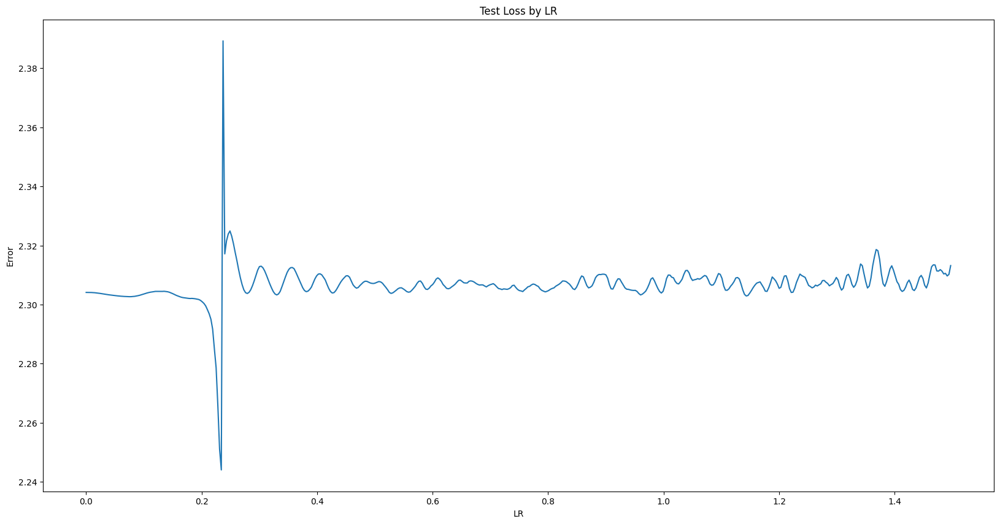

In [ ]:
test_lr, test_loss_vals = zip(*test_loss_repo)
pt_util.plot(test_lr, test_loss_vals, 'Test Loss by LR', 'LR', 'Error')

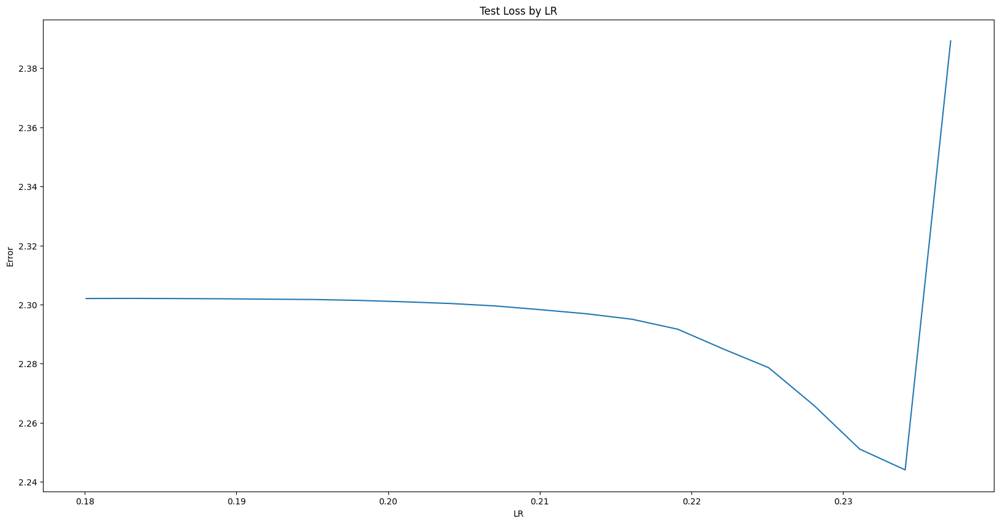

In [ ]:
# plots the specific range of learning rates for test loss we are interested in
specific_test_lr = test_lr[60:80]
specific_loss_vals = test_loss_vals[60:80]
pt_util.plot(specific_test_lr, specific_loss_vals, 'Test Loss by LR', 'LR', 'Error')

With a max momentum value of 0.97, it would seem a range of 0.2 to 0.23 would be ideal

##### Max Momentum Value of 0.95

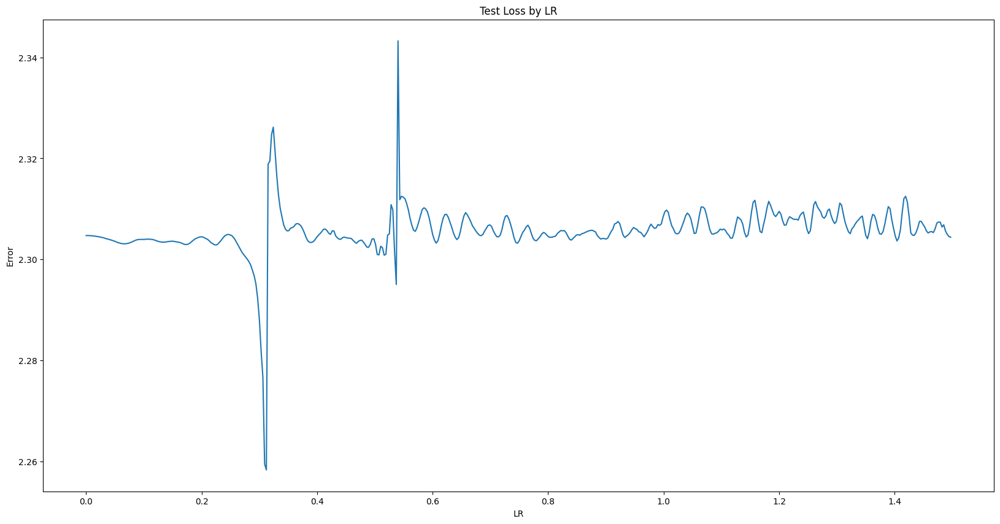

In [ ]:
test_lr, test_loss_vals = zip(*test_loss_repo)
pt_util.plot(test_lr, test_loss_vals, 'Test Loss by LR', 'LR', 'Error')

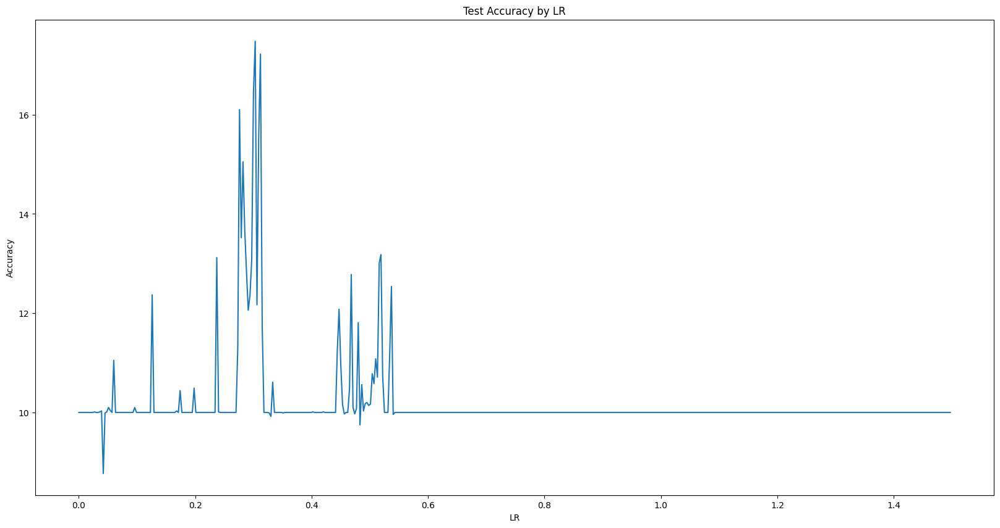

In [ ]:
test_lr, test_acc_val = zip(*test_acc_repo)
pt_util.plot(test_lr, test_acc_val, 'Test Accuracy by LR', 'LR', 'Accuracy')

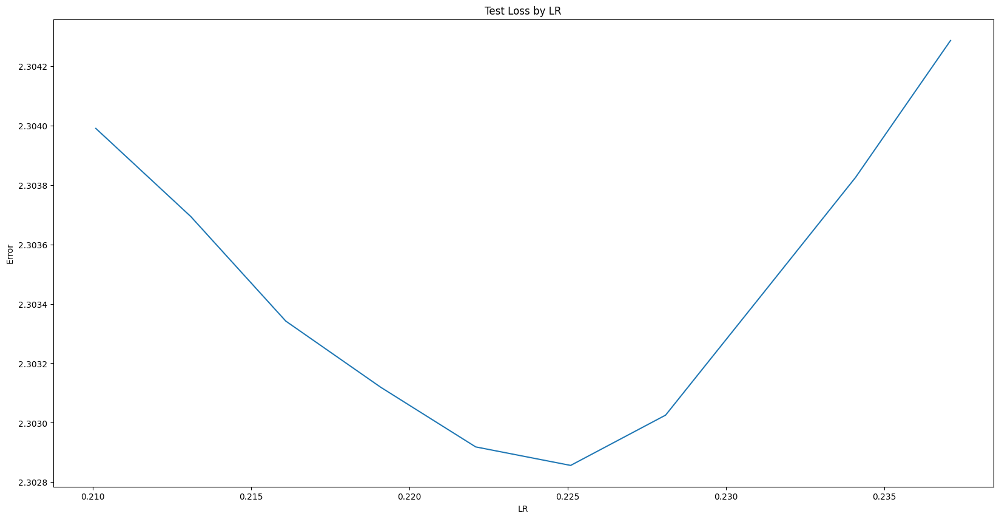

In [ ]:
# plots the specific range of learning rates for test loss we are interested in
L = 70
R = 80
specific_test_lr = test_lr[L:R]
specific_loss_vals = test_loss_vals[L:R]
pt_util.plot(specific_test_lr, specific_loss_vals, 'Test Loss by LR', 'LR', 'Error')

Given the test loss graph, it would seem good LR range values are 0.210 and 0.223

##### Max Momentum Value of 0.9

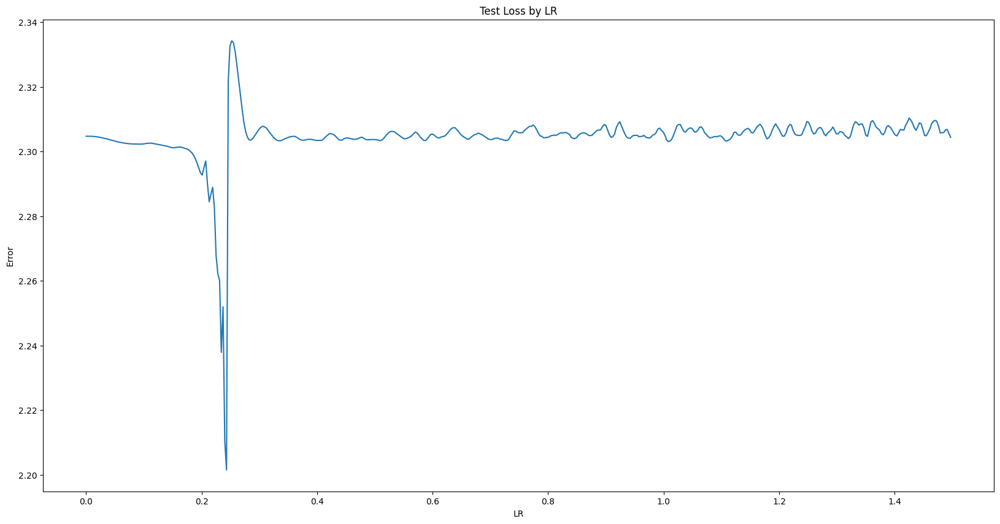

In [ ]:
test_lr, test_loss_vals = zip(*test_loss_repo)
pt_util.plot(test_lr, test_loss_vals, 'Test Loss by LR', 'LR', 'Error')

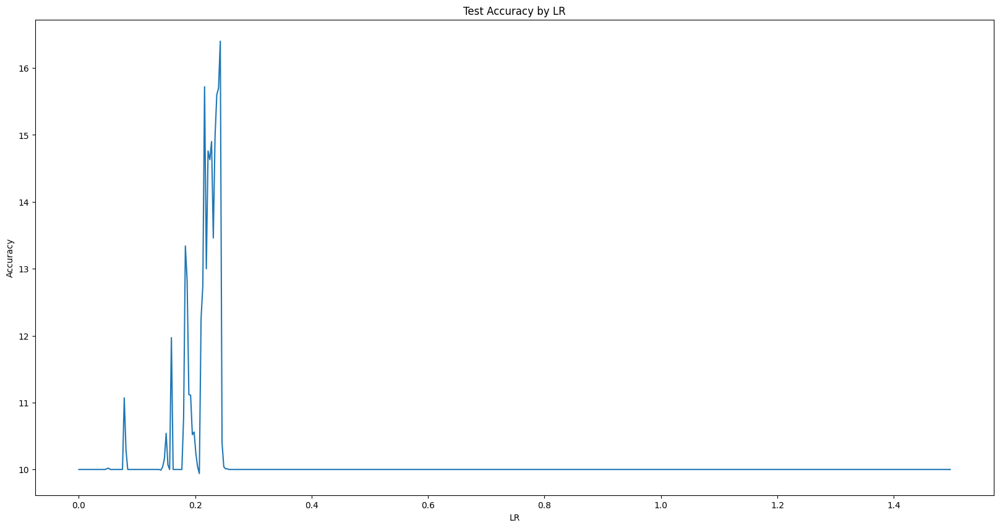

In [ ]:
test_lr, test_acc_val = zip(*test_acc_repo)
pt_util.plot(test_lr, test_acc_val, 'Test Accuracy by LR', 'LR', 'Accuracy')

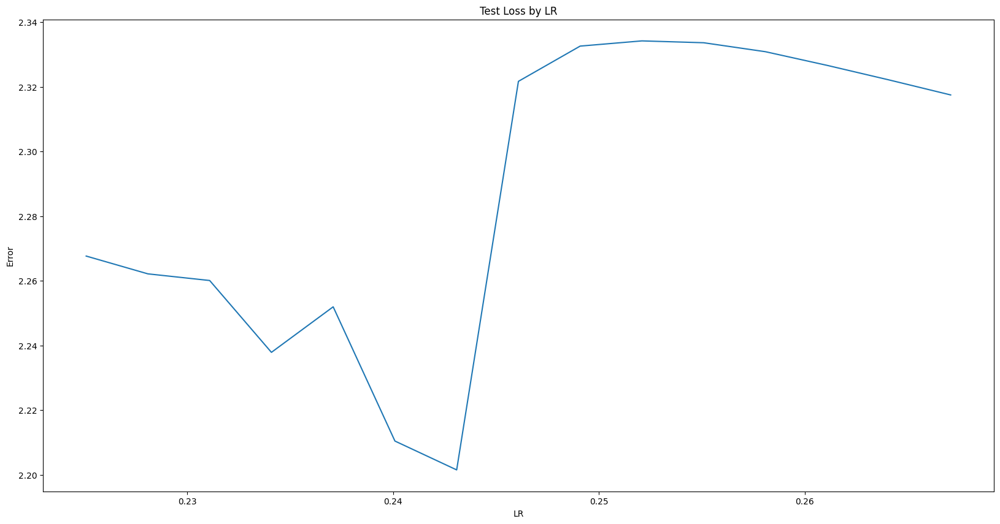

In [ ]:
# plots the specific range of learning rates for test loss we are interested in
L = 75
R = 90
specific_test_lr = test_lr[L:R]
specific_loss_vals = test_loss_vals[L:R]
pt_util.plot(specific_test_lr, specific_loss_vals, 'Test Loss by LR', 'LR', 'Error')

Given the test loss graph, it would seem an LR range of 0.2 and 0.24

In [ ]:
# plots the specific range of learning rates for test loss we are interested in
specific_test_lr = test_lr[:134]
specific_loss_vals = test_loss_vals[:134]
pt_util.plot(specific_test_lr, specific_loss_vals, 'Test Loss by LR', 'LR', 'Error')

In [ ]:
# model_tuples: is the list of (LR_VAL, model)
# ind_range: is the range of indices that we want to compute test_loss, test_acc for
# run: the current run we are computing
# test_loader: the test loader for test data
# data_repo: the 
def run_models(model_tuples, ind_range, run, test_loader, data_repo, output_repo):
  for x in tqdm(ind_range):
    curr_lr, model = data_repo[run][1][x]
    curr_test_loss, curr_test_accuracy = simple_test(model, device, test_loader)
    output_repo[run].append((curr_lr, curr_test_loss, curr_test_accuracy))

In [ ]:
print(list(range(500)))
print(list(range(500, 1003)))

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221,

In [ ]:
for i in range(len(momentum_test_dict[0.99][0])):
  avg = momentum_test_dict[]

{}


In [ ]:
for curr_model in momentum_test_dict[0.99]

1003


In [ ]:
print(momentum_test_dict[0.99][0])

[(0.0001, 2.2999279499053955), (0.003099899999999669, 2.305464267730713), (0.006099799999999339, 2.3022375106811523), (0.00909970000000034, 2.306854486465454), (0.012099600000000009, 2.3058135509490967), (0.01509949999999968, 2.3048653602600098), (0.01809939999999935, 2.3025689125061035), (0.02109930000000035, 2.3023695945739746), (0.02409920000000002, 2.306807518005371), (0.02709909999999969, 2.3034355640411377), (0.03009899999999936, 2.303896903991699), (0.03309890000000036, 2.3043878078460693), (0.036098800000000035, 2.305959701538086), (0.0390986999999997, 2.3028159141540527), (0.04209859999999937, 2.3022124767303467), (0.045098500000000374, 2.2998597621917725), (0.04809840000000004, 2.3037731647491455), (0.051098299999999715, 2.3011507987976074), (0.05409819999999938, 2.3024985790252686), (0.05709810000000038, 2.3036506175994873), (0.060098000000000054, 2.303053140640259), (0.06309789999999972, 2.301581859588623), (0.06609779999999939, 2.3023855686187744), (0.06909770000000039, 2.

In [ ]:
print(momentum_test_dict[0.99][1])

[(0.0001, 2.3040248710632323), (0.003099899999999669, 2.30402350730896), (0.006099799999999339, 2.304020033454895), (0.00909970000000034, 2.304007895088196), (0.012099600000000009, 2.3039845945358275), (0.01509949999999968, 2.3039482746124267), (0.01809939999999935, 2.3039025815963745), (0.02109930000000035, 2.3038476055145263), (0.02409920000000002, 2.303769227218628), (0.02709909999999969, 2.303676964187622), (0.03009899999999936, 2.303570404243469), (0.03309890000000036, 2.3034493139266967), (0.036098800000000035, 2.3033089878082276), (0.0390986999999997, 2.3031698169708252), (0.04209859999999937, 2.303041511154175), (0.045098500000000374, 2.3029415267944335), (0.04809840000000004, 2.3028488855361937), (0.051098299999999715, 2.302782620048523), (0.05409819999999938, 2.3027362327575682), (0.05709810000000038, 2.3027043521881105), (0.060098000000000054, 2.3026946115493776), (0.06309789999999972, 2.3027224647521973), (0.06609779999999939, 2.302783881568909), (0.06909770000000039, 2.302

In [ ]:
print(momentum_test_dict[0.99][2])

[(0.0001, 10.11), (0.003099899999999669, 10.17), (0.006099799999999339, 10.14), (0.00909970000000034, 10.19), (0.012099600000000009, 9.88), (0.01509949999999968, 9.52), (0.01809939999999935, 9.82), (0.02109930000000035, 10.0), (0.02409920000000002, 10.0), (0.02709909999999969, 10.0), (0.03009899999999936, 10.0), (0.03309890000000036, 10.0), (0.036098800000000035, 10.0), (0.0390986999999997, 10.0), (0.04209859999999937, 10.0), (0.045098500000000374, 10.0), (0.04809840000000004, 10.0), (0.051098299999999715, 10.0), (0.05409819999999938, 11.59), (0.05709810000000038, 10.0), (0.060098000000000054, 10.0), (0.06309789999999972, 10.0), (0.06609779999999939, 10.0), (0.06909770000000039, 10.0), (0.07209760000000007, 10.0), (0.07509749999999973, 10.0), (0.0780973999999994, 10.0), (0.0810973000000004, 12.07), (0.08409720000000007, 11.71), (0.08709709999999975, 12.47), (0.09009699999999941, 11.95), (0.09309690000000041, 11.2), (0.09609680000000008, 12.6), (0.09909669999999975, 10.0), (0.1020965999

In [ ]:
# CASE FOR MAX MOMENTUM OF 0.97
net = ConvoPoolNet()
train_losses, test_losses, test_accuracies = run_range_test(net, 512, 1000, start_lr=0.0001, end_lr=3, weight_decay=0.001, max_momentum=0.97)
momentum_test_dict[0.97] = (train_losses, test_losses, test_accuracies)

Using device cuda
num cpus: 2
Interrupted


In [ ]:
print(momentum_test_dict[0.97][0])

[]


In [ ]:
print(momentum_test_dict[0.97][1])

[]


In [ ]:
print(momentum_test_dict[0.97][2])

[]


In [ ]:
# CASE FOR MAX MOMENTUM OF 0.95
net = ConvoPoolNet()
train_losses, test_losses, test_accuracies = run_range_test(net, 512, 1000, start_lr=0.0001, end_lr=3, weight_decay=0.001, max_momentum=0.95)
momentum_test_dict[0.95] = (train_losses, test_losses, test_accuracies)

Using device cuda
num cpus: 2
Interrupted


In [ ]:
print(momentum_test_dict[0.95][0])

[]


In [ ]:
print(momentum_test_dict[0.95][1])

[]


In [ ]:
print(momentum_test_dict[0.95][2])

[]


In [ ]:
# CASE FOR MAX MOMENTUM OF 0.9
net = ConvoPoolNet()
train_losses, test_losses, test_accuracies = run_range_test(net, 512, 1000, start_lr=0.0001, end_lr=3, weight_decay=0.001, max_momentum=0.9)
momentum_test_dict[0.9] = (train_losses, test_losses, test_accuracies)

Using device cuda
num cpus: 2
Interrupted


In [ ]:
print(momentum_test_dict[0.9][0])

[]


In [ ]:
print(momentum_test_dict[0.9][1])

In [ ]:
print(momentum_test_dict[0.9][2])

[]


In [ ]:
momentum_options = [0.9, 0.95, 0.97, 0.99]
momentum_results_dict = {}
for mo in momentum_options:
  vals_repo = []
  learning_rates = []
  NUM_RUNS = 4
  for x in range(NUM_RUNS):
    net = ConvoPoolNet()
    learning_rates, curr_vals = run_range_test(net, 512, 1000, start_lr=0.0001, end_lr=3, weight_decay=0.001, max_momentum=mo)
    vals_repo.append(curr_vals)
  momentum_results_dict[mo] = vals_repo

Using device cpu
num cpus: 2
Using device cpu
num cpus: 2
Using device cpu
num cpus: 2
Using device cpu
num cpus: 2
Using device cpu
num cpus: 2
Using device cpu
num cpus: 2
Using device cpu
num cpus: 2
Using device cpu
num cpus: 2
Using device cpu
num cpus: 2
Using device cpu
num cpus: 2
Using device cpu
num cpus: 2
Using device cpu
num cpus: 2
Using device cpu
num cpus: 2
Using device cpu
num cpus: 2
Using device cpu
num cpus: 2
Using device cpu
num cpus: 2


In [ ]:
net = ConvoPoolNet()
learning_rates, curr_vals = run_range_test(net, 512, 1000, start_lr=0.0001, end_lr=3, weight_decay=0.001, max_momentum=mo)
vals_repo.append(curr_vals)

In [ ]:
# mean_vals is the mean error value across 3 runs for each LR value
NUM_RUNS = 4
mean_dict = {}
for mo in momentum_options:
  vals_repo = momentum_results_dict[mo]
  mean_vals = []
  for idx, x in enumerate(vals_repo[0]):
    summ = 0
    for curr_repo in range(NUM_RUNS):
      summ = summ + vals_repo[curr_repo][idx]
    mean_vals.append(summ / NUM_RUNS)
  mean_dict[mo] = mean_vals

In [ ]:
print(mean_dict[0.9])

[2.3031928539276123, 2.3025768995285034, 2.3042919635772705, 2.3038946390151978, 2.3024790287017822, 2.305811285972595, 2.3027305603027344, 2.304076313972473, 2.3038089871406555, 2.3014445304870605, 2.3035287857055664, 2.302046298980713, 2.3029803037643433, 2.304167330265045, 2.3042231798171997, 2.3030171394348145, 2.3034408688545227, 2.3035653829574585, 2.3022583723068237, 2.3031856417655945, 2.3022780418395996, 2.302495837211609, 2.3028776049613953, 2.303221046924591, 2.3019609451293945, 2.3029051423072815, 2.3028992414474487, 2.3032050132751465, 2.3025952577590942, 2.3025559782981873, 2.3031501173973083, 2.3032078742980957, 2.3025947213172913, 2.3031729459762573, 2.3026952147483826, 2.302136182785034, 2.3030953407287598, 2.3020142316818237, 2.303235113620758, 2.3019139170646667, 2.30277156829834, 2.303148627281189, 2.302109718322754, 2.3029428124427795, 2.303383946418762, 2.3015562295913696, 2.3029489517211914, 2.3012079000473022, 2.3038421273231506, 2.30167019367218, 2.303739726543

In [ ]:
print(mean_dict[0.95])

[2.3041008710861206, 2.3018749952316284, 2.302997589111328, 2.3025237917900085, 2.303401529788971, 2.3034799098968506, 2.3027225136756897, 2.301061749458313, 2.3025789856910706, 2.3028576970100403, 2.302496910095215, 2.302050471305847, 2.3025890588760376, 2.304064929485321, 2.3030489087104797, 2.3038511872291565, 2.3020913004875183, 2.3023306131362915, 2.302204966545105, 2.303154706954956, 2.302050292491913, 2.3025739789009094, 2.3024553060531616, 2.303230047225952, 2.3025985956192017, 2.3021755814552307, 2.3026894330978394, 2.30206036567688, 2.3019023537635803, 2.3024755716323853, 2.30206036567688, 2.301907479763031, 2.3010352849960327, 2.302517592906952, 2.3023104667663574, 2.301456570625305, 2.3020158410072327, 2.302877724170685, 2.2993443608283997, 2.300853431224823, 2.3021463751792908, 2.3036186695098877, 2.298784375190735, 2.303235113620758, 2.3006959557533264, 2.295909106731415, 2.298484683036804, 2.2977237701416016, 2.294796586036682, 2.293824315071106, 2.2948108315467834, 2.29

In [ ]:
print(mean_dict[0.97])

[2.3030203580856323, 2.303589165210724, 2.3027355670928955, 2.3029842376708984, 2.3027692437171936, 2.3047401309013367, 2.3027579188346863, 2.3030298352241516, 2.303662896156311, 2.304108679294586, 2.3032392859458923, 2.303795635700226, 2.3031524419784546, 2.3034491539001465, 2.3037201166152954, 2.303032875061035, 2.302528977394104, 2.302214741706848, 2.302590250968933, 2.3020349740982056, 2.30314439535141, 2.3021551966667175, 2.302681565284729, 2.304523468017578, 2.3028316497802734, 2.3029342889785767, 2.3027135729789734, 2.3049532175064087, 2.303601324558258, 2.3037065863609314, 2.3048484325408936, 2.3035731315612793, 2.3021868467330933, 2.3007922172546387, 2.3034414649009705, 2.3029017448425293, 2.3023746609687805, 2.302413284778595, 2.3030027747154236, 2.3019344806671143, 2.3005974888801575, 2.3015350699424744, 2.3000122904777527, 2.301471710205078, 2.3023447394371033, 2.3035141229629517, 2.3004902601242065, 2.299746870994568, 2.297855019569397, 2.300080955028534, 2.295683860778808

In [ ]:
print(mean_dict[0.99])

[2.3032777309417725, 2.305582106113434, 2.303691029548645, 2.3054614067077637, 2.303273618221283, 2.304502010345459, 2.3037118911743164, 2.305268406867981, 2.3014727234840393, 2.3037482500076294, 2.3047162294387817, 2.3022350668907166, 2.302631199359894, 2.303532660007477, 2.3030932545661926, 2.3039757013320923, 2.3036051392555237, 2.3022754192352295, 2.3023176193237305, 2.3030627369880676, 2.3030439615249634, 2.302805006504059, 2.303247630596161, 2.3032789826393127, 2.303535759449005, 2.302846312522888, 2.302039682865143, 2.3027167916297913, 2.3023478984832764, 2.304506480693817, 2.3038116097450256, 2.304786443710327, 2.3036664724349976, 2.3070015907287598, 2.3050413727760315, 2.302783489227295, 2.3052791953086853, 2.3028748631477356, 2.3051178455352783, 2.306271731853485, 2.3013173937797546, 2.3038055896759033, 2.301341950893402, 2.3016624450683594, 2.3018078804016113, 2.3018804788589478, 2.2996902465820312, 2.298763930797577, 2.2927948236465454, 2.2931078672409058, 2.289543449878692

In [ ]:
print(len(mean_dict[0.9]))

1003


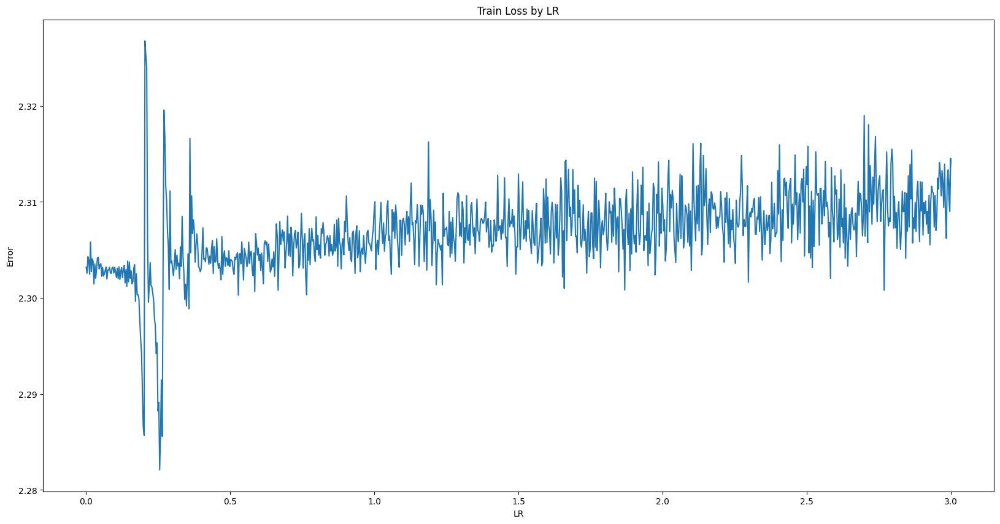

In [ ]:
# plot for max momentum value of 0.9
pt_util.plot(learning_rates, mean_dict[0.9], 'Train Loss by LR', 'LR', 'Error')

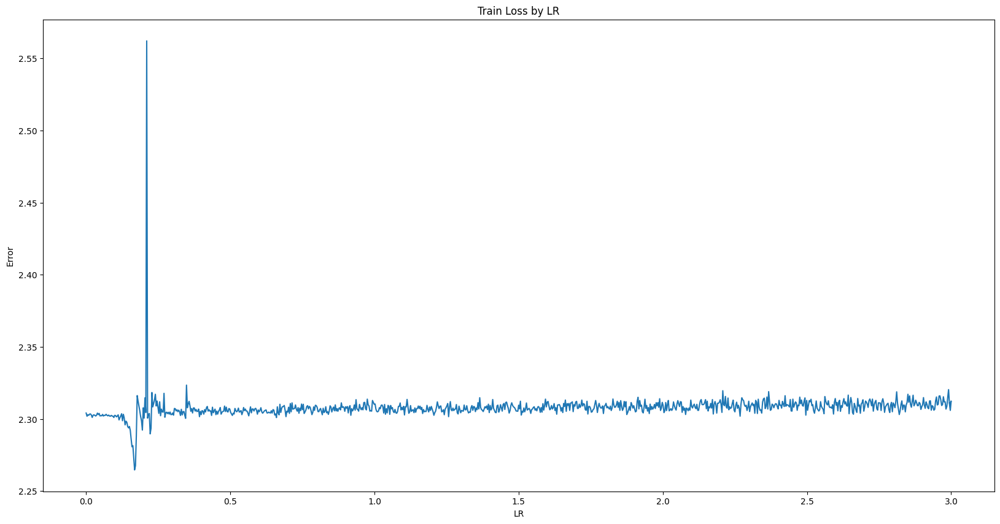

In [ ]:
# plot for max momentum value of 0.95
pt_util.plot(learning_rates, mean_dict[0.95], 'Train Loss by LR', 'LR', 'Error')

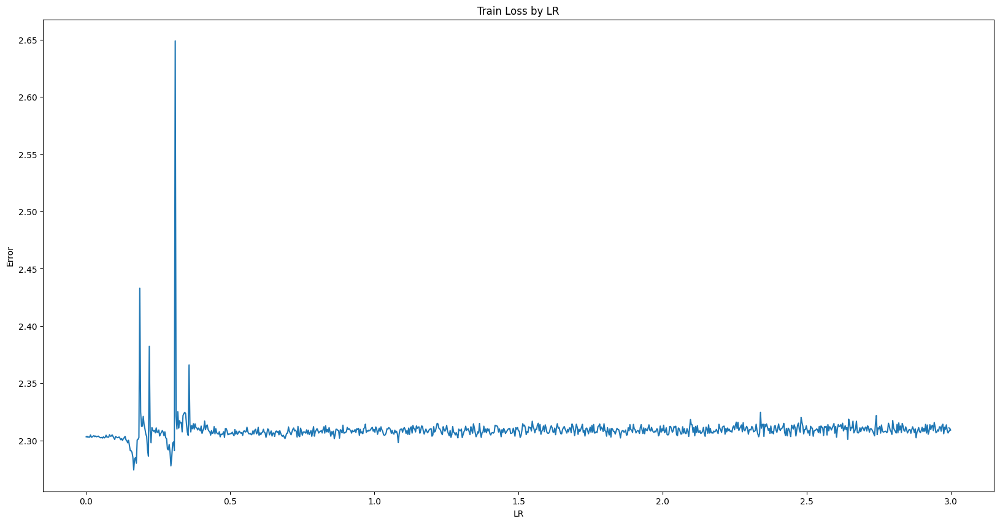

In [ ]:
# plot for max momentum value of 0.97
pt_util.plot(learning_rates, mean_dict[0.97], 'Train Loss by LR', 'LR', 'Error')

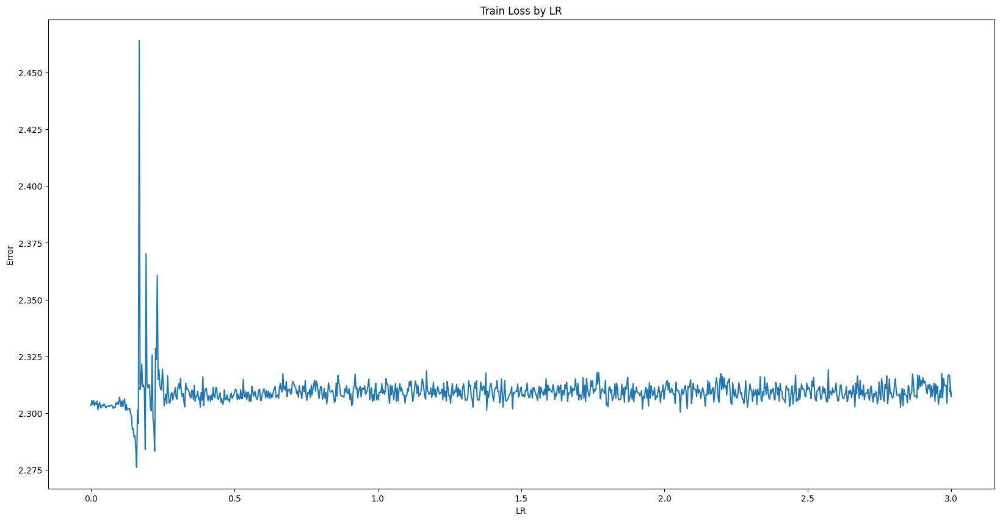

In [ ]:
# plot for max momentum value of 0.99
pt_util.plot(learning_rates, mean_dict[0.99], 'Train Loss by LR', 'LR', 'Error')

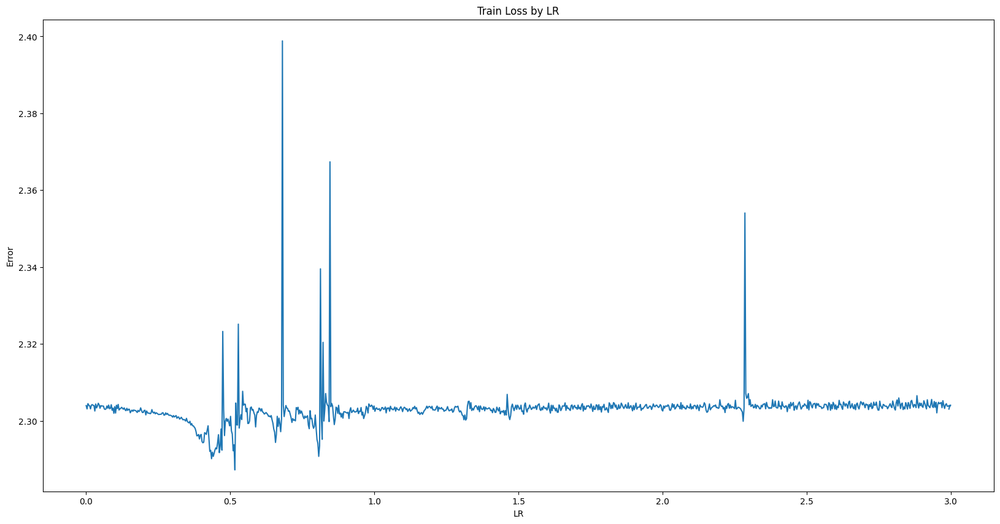

In [ ]:
# mean error for each learning rate value over 10 runs
pt_util.plot(learning_rates, mean_vals, 'Train Loss by LR', 'LR', 'Error')

In [ ]:
def find_idx(data, max_val):
  idx_output = 0
  for idx, val in enumerate(data):
    if (val >= max_val):
      return idx
  return len(data) - 1

In [ ]:
idx_output = 0
flag = False
for idx, eta in enumerate(learning_rates):
  if (eta > 0.45 and not flag):
    idx_output = idx
    flag = True
print(idx_output)
print(len(learning_rates))

150
1003


In [ ]:
print(learning_rates_short_list[145])
print(min(mean_vals_short_list))

0.4350855
2.2901724100112917


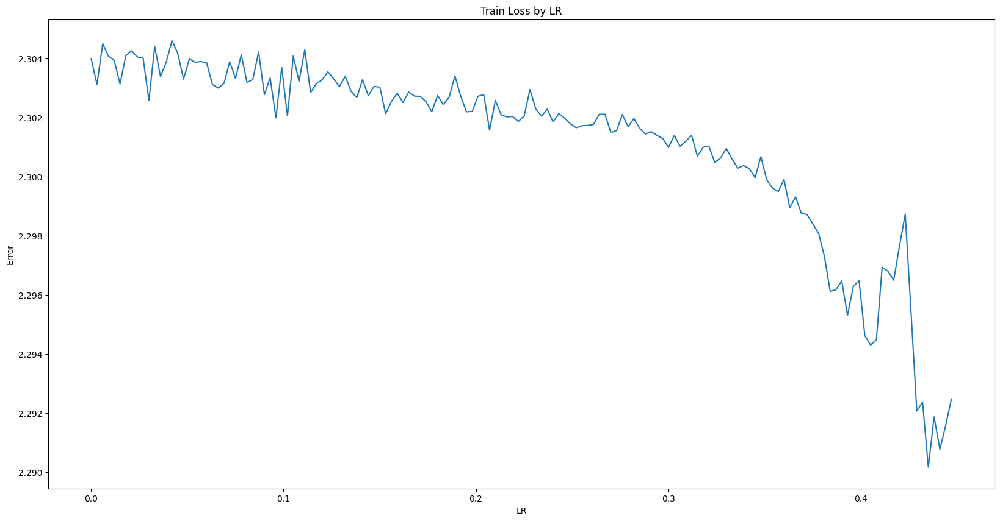

In [ ]:
mean_vals_short_list = mean_vals[:150]
learning_rates_short_list = learning_rates[:150]
pt_util.plot(learning_rates_short_list, mean_vals_short_list, 'Train Loss by LR', 'LR', 'Error')

### Range Test Results
After running the LR range test twice for 10 runs, each running for 1000 iterations with batch size of 512, it seems a good range for the learning rate could be 0.2 to 0.435. 

Now that we have good values for the LR, I will be testing what a good max momentum value is to us with our LR range so that we can use the 1cycle learning rate scheduler with cyclic momentum.

In [ ]:
momentum_options = [0.9, 0.95, 0.97, 0.99]
  

##CIFAR Questions

1. What design that you tried worked the best? This includes things like network design, learning rate, batch size, number of epochs, and other optimization parameters, data augmentation etc. What was the final train loss? Test loss? Test Accuracy? Provide the plots for train loss, test loss, and test accuracy.

TODO: Answer here

2. What design worked the worst (but still performed better than random chance)? Provide all the same information as question 1.

TODO: Answer here

3. Why do you think the best one worked well and the worst one worked poorly.

TODO: Answer here


# References

1. [smith (2017)](https://arxiv.org/pdf/1506.01186.pdf)
2. [smith (2018)](https://arxiv.org/abs/1803.09820)